In [2]:
# The main data set contains information about the time spent learning foreign languages each day 
# from March 2019 to November 2022;
# Our goal is to identify days with no learning
# For additional features, we have to assemble information from other sources(excel files in this case)
# we will also create some binomial features based on our knowledge and perform feature engineering
# to create new features from date columns
# then we will drop the date for model training to reframe this time series problem as a supervised learning problem;

# First importing basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
df= pd.read_excel(r'C:\Users\Olga\Desktop\linkedinlearning\Python\notebooks\yt_cleaned_110319_071122.xlsx')

# In case of this dataset blank cell means 0;

df = df.fillna(0)
df.index=df.date
df['sum'] = df.sum(numeric_only=True, axis=1)

# joining data from another file with average time of online course videos watched on linked_in learning;
# filling null values with mean or 0 depending on date column
# the second file starts in 2021 while main df samples start from 2019, thus we need to fill in na values again

df = df['sum'].reset_index()
linked_in_learning_df = pd.read_excel(r'C:\Users\Olga\Desktop\linkedinlearning\Python\notebooks\linked_in_learning.xlsx')
df = pd.merge(df,linked_in_learning_df,on='date',how='left')


mean_course = df['avg_course_day'].mean()

df['avg_course_day'] = np.where((pd.isnull(df['avg_course_day']))&(df['date']>=pd.to_datetime('08-01-2021')),mean_course,
                               np.where((pd.isnull(df['avg_course_day'])) & (df['date']<pd.to_datetime('08-01-2021')),0
                                       ,df['avg_course_day']))

# joining data from yet another file containing the amount of working hours

working_hours_df = pd.read_excel(r'C:\Users\Olga\Desktop\linkedinlearning\Python\notebooks\work_hours.xlsx')
df = pd.merge(df,working_hours_df,on='date',how='left')
df.fillna(0, inplace = True)


# joining data from another file with average activity; the column shows a mean number of steps walked each month since April 2021;
# second file starts in 2021 while main df samples start from 2019, thus we need to fill in na values again
# we decide to fill the missing values values for working days with the distance between home and work place,
# for other place 1/3 of that distance  

steps = pd.read_excel(r'C:\Users\Olga\Desktop\linkedinlearning\Python\notebooks\steps.xlsx')
df = pd.merge(df,steps,on='date',how='left')
df['mean_steps'] = np.where((df['work_hours']!=0) & (df['date']<pd.to_datetime('12-01-2019')) & (df['date']>pd.to_datetime('06-01-2019')),2000, df['mean_steps'])
df['mean_steps'] = df['mean_steps'].fillna(600)

# reseting index to be able to use date column
df = df.reset_index().drop(['index'], axis = 1)

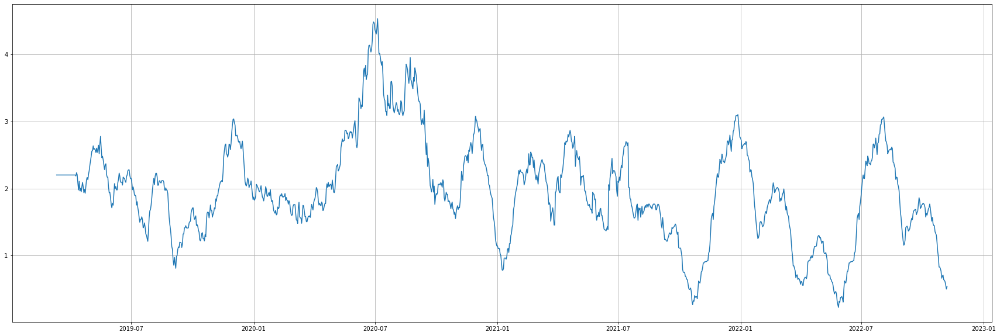

In [5]:
# Our dataset is a timeseries, but as we have features(and will create new ones) that are not time dependent,
# we will frame our problem as supervised learning classification
# calculating moving average for the sum column to see overall and seasonal trends more clearly

import datetime as dt

df['rolling30'] = df['sum'].rolling(30).mean()
df = df.fillna(np.mean(df['sum'][0:29]))
dates = df['date'][df['date'].dt.day==11].reset_index(drop=True)
plt.rcParams["figure.figsize"] = (30,10)
plt.plot(df['date'], df['rolling30'])
plt.grid(True)

# We see biggest peaks in summer and smaller peaks in winter
# the general trend seems to be slightly decreasing

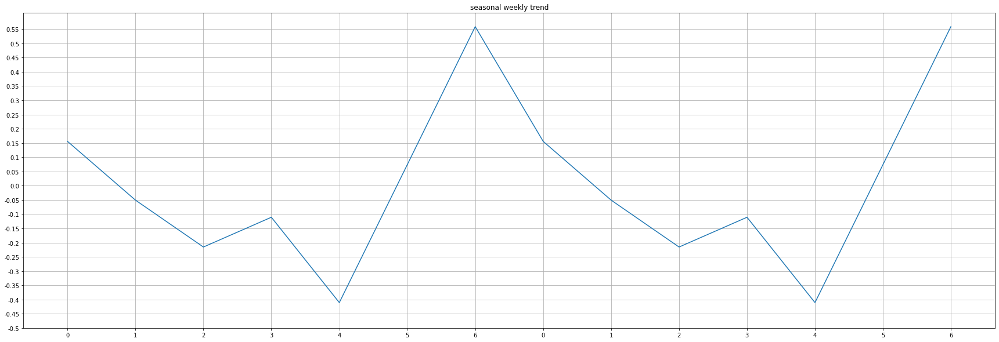

In [4]:
# Time series decomposition, to do a more profound check for seasonal and general trend and for residual component;

from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df['sum'], model='additive',period=7)
plt.rcParams["figure.figsize"] = (30,10)
# plt.plot(df['date'],result.observed.values)
plt.plot(df['date'][14:28],result.seasonal[14:28])
plt.xticks(df['date'][14:28],df['date'][14:28].dt.weekday)
plt.yticks([i/100 for i in range(-50,60,5)],[i/100 for i in range(-50,60,5)] )
# plt.plot(df['date'],result.resid.values)
plt.grid(True)
plt.title('seasonal weekly trend')

# the weekly trend seems to be: most learning on Sunday, then decreasing during the week and again increasing on Saturday; 
# The most differences are seen between weekend and week

# We are adding sine and cosine transformation of day of the week as another features

df['weekday_sin'] = np.sin(2 * np.pi * (df['date'].dt.weekday)/7)
df['weekday_cos'] = np.cos(2 * np.pi * (df['date'].dt.weekday)/7)

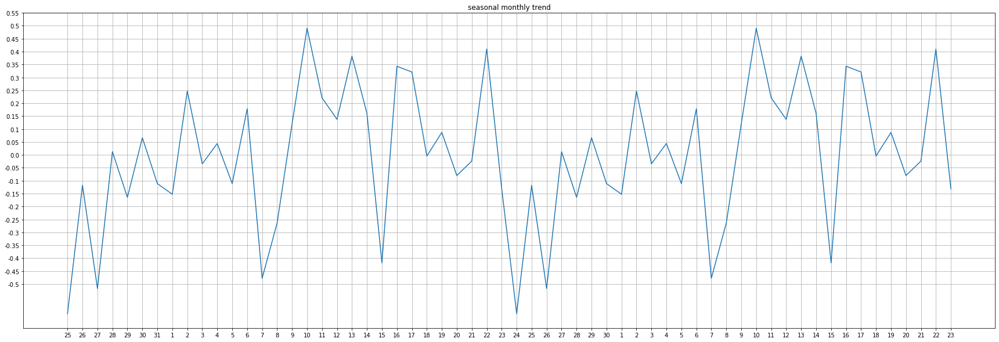

In [5]:
# Time series decomposition, to do a more profound check for seasonal and general trend and for residual component;

result = seasonal_decompose(df['sum'], model='additive',period=30)
plt.rcParams["figure.figsize"] = (30,10)
# plt.plot(df['date'],result.observed.values)
plt.plot(df['date'][14:74],result.seasonal[14:74])
plt.xticks(df['date'][14:74],df['date'][14:74].dt.day)
plt.yticks([i/100 for i in range(-50,60,5)],[i/100 for i in range(-50,60,5)] )
# plt.plot(df['date'],result.resid.values)
plt.grid(True)
plt.title('seasonal monthly trend')

# the monthly trend seems to be: most learning beetween 9 and 14th of the month, decrease at the end of the month 
# and then again increase 

# we will divide each month in 3 parts, make it a feature and create dummy variables for the column 

df['part_of_month'] = np.where(df['date'].dt.day<=10,1,np.where((df['date'].dt.day>10) & (df['date'].dt.day<=20),2, 3 ))
df = pd.get_dummies(df, columns=['part_of_month'], drop_first = True) 





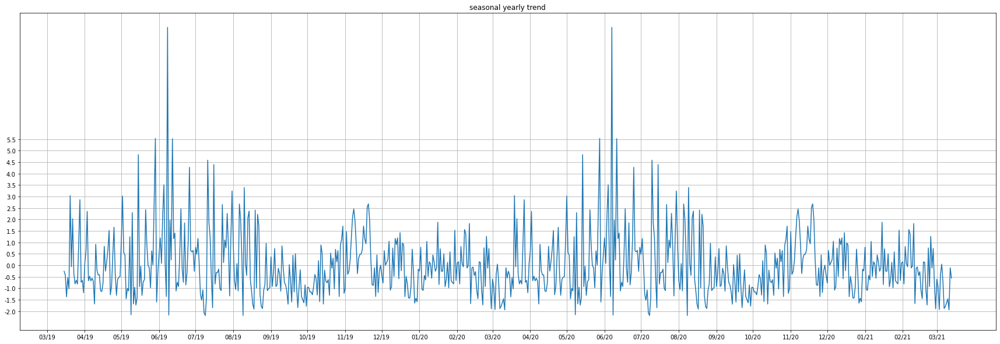

In [6]:
# Time series decomposition, to do a more profound check for seasonal and general trend and for residual component;

result = seasonal_decompose(df['sum'], model='additive',period=365)
plt.rcParams["figure.figsize"] = (30,10)
# plt.plot(df['date'],result.observed.values)
plt.plot(df['date'][14:744],result.seasonal[14:744])
plt.xticks(dates[0:25],ticks[0:25])
plt.yticks([i/100 for i in range(-200,600,50)],[i/100 for i in range(-200,600,50)] )
# plt.plot(df['date'],result.resid.values)
plt.grid(True)
plt.title('seasonal yearly trend')

# the yearly trend seems to be: most learning in summer, then decreasing, small peak late autumn and early winter,
# low values in the winter and increasing to again peak in summer 
# Our models performs better having time features encoded as sine/cosine transformations than dummy variables
# We will create a lot of additional features - both categorical 0-1 dummy variables
# for month and quarter and sine/cosine transformations; o

# df['month'] = df['date'].dt.month
# df = pd.get_dummies(df, columns=['month'], drop_first = True)
# df['quarter'] = df['date'].dt.quarter
# df = pd.get_dummies(df, columns=['quarter'], drop_first = True)
df['q_sin'] = np.sin(2 * np.pi * (df['date'].dt.quarter)/4)
df['q_cos'] = np.cos(2 * np.pi * (df['date'].dt.quarter)/4)

df['month_sin'] = np.sin(2 * np.pi * (df['date'].dt.month)/12)
df['month_cos'] = np.cos(2 * np.pi * (df['date'].dt.month)/12)

# df['week_of_year'] = df['date'].dt.isocalendar().week
df['wok_sin'] = np.sin(2 * np.pi * (df['date'].dt.isocalendar().week)/52)
df['wok_cos'] = np.cos(2 * np.pi * (df['date'].dt.isocalendar().week)/52)


The IQR is 2.7
The lower boundary is -3.750000000000001
The upper boundaryis 7.050000000000001
Total number of outliers are 35


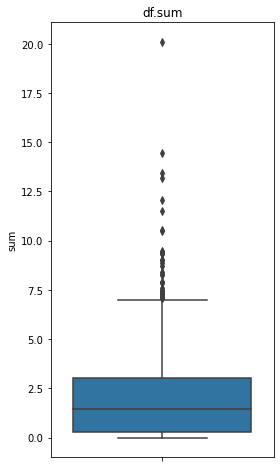

In [7]:
# According to the nature of the dataset (prepared manually without knowing it's future purpose), 
# we suspect a lot of outliers, so we will use bocplot method to identify and remove them

import seaborn as sns

plt.figure(figsize = (4,8))
sns.boxplot(y = df['sum'])
plt.title('df.sum')
    
def outlier_boundaries(df , column):
    q25, q75 = np.quantile(df[column], 0.25), np.quantile(df[column], 0.75)
    # interquantile range
    iqr = q75 - q25
    # outlier boundary
    boundary = iqr * 1.5
    # lower and upper boundary values
    lower, upper = q25 - boundary, q75 + boundary
    print(f'The IQR is {iqr}')
    print(f'The lower boundary is {lower}')
    print(f'The upper boundaryis {upper}')
    # Calculate the number of records below and above lower and above bound value respectively
    df_upper = df[df[column] > upper]
    df_lower = df[df[column] < lower]
    return print(f'Total number of outliers are {len(df_upper) + len(df_lower)}')

outlier_boundaries(df , 'sum')

#  as more than 7 hours of learning is not realistic, the boundary seems right; we drop our outliers

df = df[df['sum']<7.050000000000001]

In [8]:
# creating label to predict (target value): binary classification learned(0) or not learned(1)

df['not_learned'] = df['sum'].apply(lambda x: 1 if x==0 else 0)
df['not_learned'].value_counts()

# we have an imbalanced dataset

0    1034
1     269
Name: not_learned, dtype: int64

In [9]:
# creating new variables

job = []

for date in df['date']:
    if date < pd.to_datetime('2018-07-01'):
        job.append(0)
    elif date >=pd.to_datetime('2018-07-01') and date <= pd.to_datetime('2019-11-30'):
         job.append(1)
    elif date >= pd.to_datetime('2019-12-01') and date <= pd.to_datetime('2021-11-30'):
        job.append(2)
    else:
        job.append(3)
        
df['job'] = job

# making dummy variables to deal with categorical feature 'job'

df = pd.get_dummies(df, columns=['job'], drop_first = True)

# adding more variables for circumstances that could affect language learning

df['R']=np.where((df['date'] >='2020-09-15')&(df['date'] <='2021-05-15'),1,0)
df['learningDS']=np.where((df['date'] >='2021-08-01'),1,0)
df['homeoffice']=np.where((df['date'] >='2020-03-16'),1,0)

# subscription gives access to more foreign language content (easier to spend some time learning), but can also distract

df['Netflix']=np.where((df['date'] >='2021-06-15'),1,0)

# while in journey, it is harder to find time to learn

df['journey'] = np.where(df['date'].isin(pd.date_range(start='9/13/2021', end='9/18/2021'))|
                      df['date'].isin(pd.date_range(start='5/11/2022', end='5/22/2022')) |
                        df['date'].isin(pd.date_range(start='9/9/2022', end='9/11/2022')) |
                           df['date'].isin(pd.date_range(start='9/24/2022', end='9/30/2022')) |
                                df['date'].isin(pd.date_range(start='10/31/2021', end='11/01/2021'))|
                                    df['date'].isin(pd.date_range(start='04/19/2019', end='04/22/2019'))|
                                        df['date'].isin(pd.date_range(start='04/10/2020', end='04/13/2020'))|
                                            df['date'].isin(pd.date_range(start='04/22/2021', end='04/24/2021'))|
                                                df['date'].isin(pd.date_range(start='04/15/2022', end='04/18/2022'))|
                                                     df['date'].isin(pd.date_range(start='08/16/2019', end='08/18/2019')),
                                                        1,0)
                       

# Having more time on holiday could help to learn more
 

holidays = ['06-01-2019', '01-05-2019', '02-05-2019','03-05-2019','15-08-2019','01-11-2019', '11-11-2019', '24-12-2019','22-04-2019',
           '06-01-2020', '01-05-2020', '02-05-2020','03-05-2020','15-08-2020','01-11-2020', '11-11-2020','24-12-2020','13-04-2020',
           '06-01-2021', '01-05-2021', '02-05-2021','03-05-2021','15-08-2021','01-11-2021', '11-11-2021','24-12-2021','05-04-2021',
           '06-01-2022', '01-05-2022', '02-05-2022','03-05-2022','15-08-2022','01-11-2022', '11-11-2022', '18-04-2022']

df['holiday'] = np.where(df['date'].isin(holidays),1,0 | df['date'].dt.dayofweek.isin([5,6]))

# presumably more time spent at home during lockdown could help to learn more
df['covid'] = np.where(df['date'].isin(pd.date_range(start='3/15/2020', end='3/15/2022')),1,0)

In [10]:
# The following derived features did not help models' performance

# df['mean_steps*journey'] = df['mean_steps']*df['journey']
# df['learningDS*journey'] = df['learningDS']*df['journey']
# df['R*Netflix'] = df['Netflix']*df['R']
# df['avg_course_day*journey'] = df['avg_course_day']*df['journey']
# df['journey*Netflix'] = df['Netflix']*df['journey']
# df['weekend*R'] = df['weekend']*df['R']


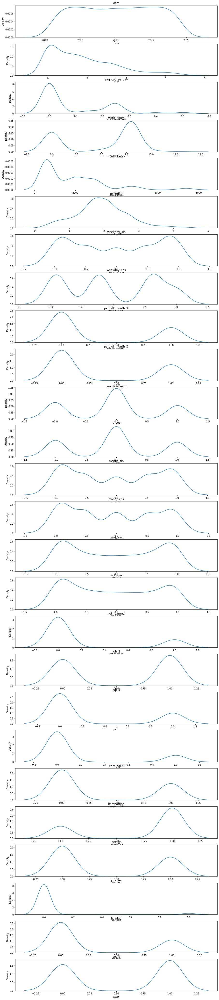

In [11]:
# checking features distribution to catch some mistakes in column creation and check 
# how much the distribution is different from normal distribution in case of continous features
# we can see that the distribution is not normal for most columns, which might decrease the performance of our models; 
# we will try transforming the skewed columns by square transformations


import seaborn as sns

fig = plt.figure(figsize=(15,75))
position = 1
for i in df.columns[0:len(df.columns)]:
    ax = fig.add_subplot(len(df.columns),1,position)
    position = position + 1
    sns.kdeplot(df[i],ax=ax)
    plt.title(i)



In [12]:
# we have positive skew for columns' avg_course_day and mean_steps; we will try to replace their values with 
# their square root to reduce that and thus improve performance of our models;
# log transformation would be more efficient, but since we have many zeroes in our columns, it cannot be used
# work hours seems to be slightly positively skewed; we will try square of it's value to diminish the effect of skewness

df['avg_course_day'] = np.sqrt(df['avg_course_day'])
df['mean_steps'] = np.sqrt(df['mean_steps'])
df['work_hours'] = np.power(df['work_hours'], 2)


Text(0.5, 1.0, 'Points sorted by distance to the 33th nearest neighbor')

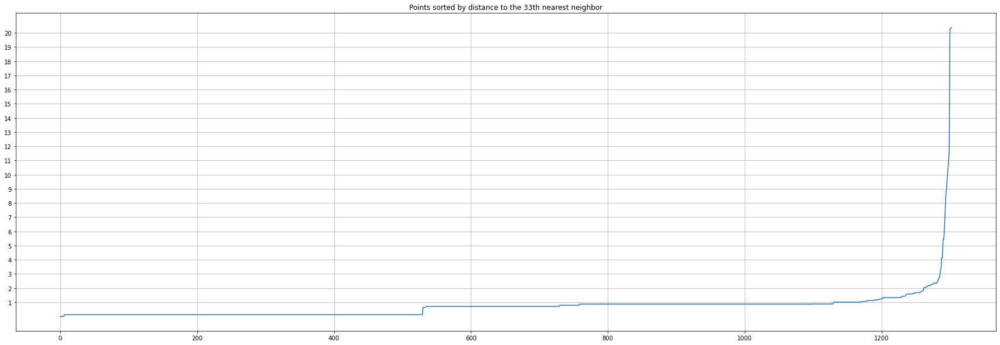

In [13]:
# Adding DBSCAN cluster as a feature improves performance; 
# we drop the columns that could cause information leakage before fitting

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import math

n_neighbors = math.ceil((len(df.drop(['date', 'not_learned', 'sum', 'rolling30'], axis=1).columns)*1.5))
neighbors = NearestNeighbors(n_neighbors=n_neighbors)
neighbors_fit = neighbors.fit(df.drop(['date', 'not_learned', 'sum', 'rolling30'], axis=1))
distances, indices = neighbors_fit.kneighbors(df.drop(['date', 'not_learned', 'sum', 'rolling30'], axis=1))
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.yticks(ticks=[1,2,3,4,5,6,7,8,9,10,11, 12,13,14,15,16,17,18,19,20])
plt.grid(True)
plt.title(f'Points sorted by distance to the {n_neighbors}th nearest neighbor')

In [14]:
dbscan = DBSCAN(eps = 3,min_samples = n_neighbors)
model = dbscan.fit(df.drop(['not_learned', 'date', 'sum', 'rolling30'], axis=1).iloc[:,1:-1])
labels = model.labels_
df['dbscan']= labels
df = pd.get_dummies(df, columns=['dbscan'], drop_first = True)

In [15]:
# df['dbscan']= labels
# pd.value_counts(df['dbscan'])

<AxesSubplot:>

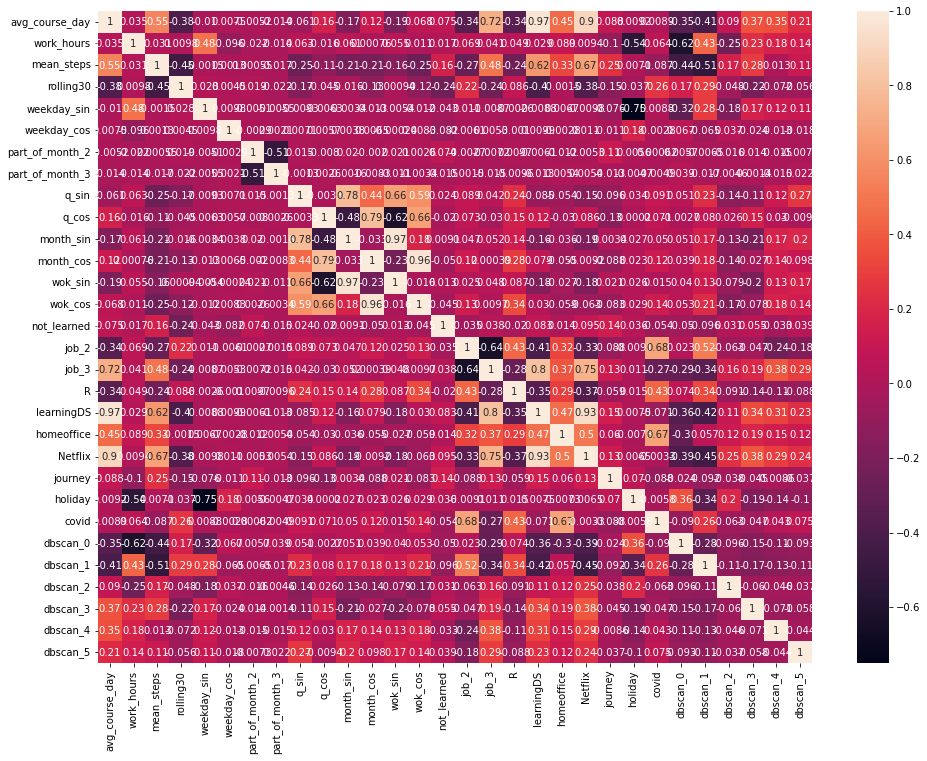

In [16]:
# We make a heatmap to have a glance at correlation of features with target value and with each other 

import seaborn as sns 
fig = plt.figure(figsize=(16,12))
ax = fig.add_subplot(111)
sns.heatmap(df.iloc[:,2:len(df.columns)].corr(),annot=True)

# we have a lot of correlation between variable pairs;
# we might consider dropping some variables
# we will use standardization and pca as elements of our model pipeline , which can help to deal with multicollinearity

In [17]:
# quick glance at the distribution of target variable by different variables;

print(round(df['not_learned'].mean()*100,2), '% of samples belong to 1 class')
print('------------------------------')
print(df.groupby('job_2')['not_learned'].mean())
print('------------------------------')
print(df.groupby('job_3')['not_learned'].mean())
print('------------------------------')
print(df.groupby('holiday')['not_learned'].mean())
print('------------------------------')
print(df.groupby('covid')['not_learned'].mean())
print('------------------------------')
print(df.groupby('Netflix')['not_learned'].mean())
print('------------------------------')
print(df.groupby('learningDS')['not_learned'].mean())
print('------------------------------')
print(df.groupby('R')['not_learned'].mean())
print('------------------------------')
print(df.groupby('journey')['not_learned'].mean())



In [18]:
# Dropping y, date and columns that are leaking information from target column
y = df['not_learned']
X = df.drop(['not_learned', 'date', 'sum', 'rolling30'], axis = 1)

C:\Users\Olga\AppData\Local\Temp/ipykernel_17344/1072777772.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(24,10))


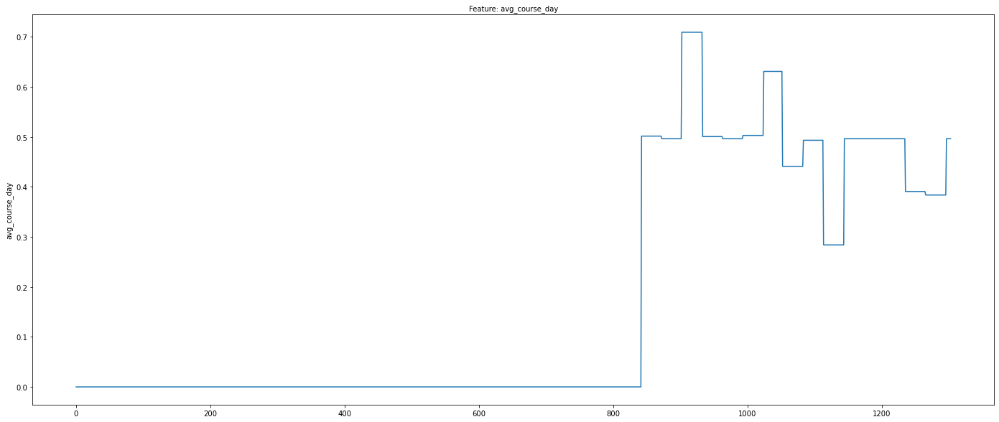

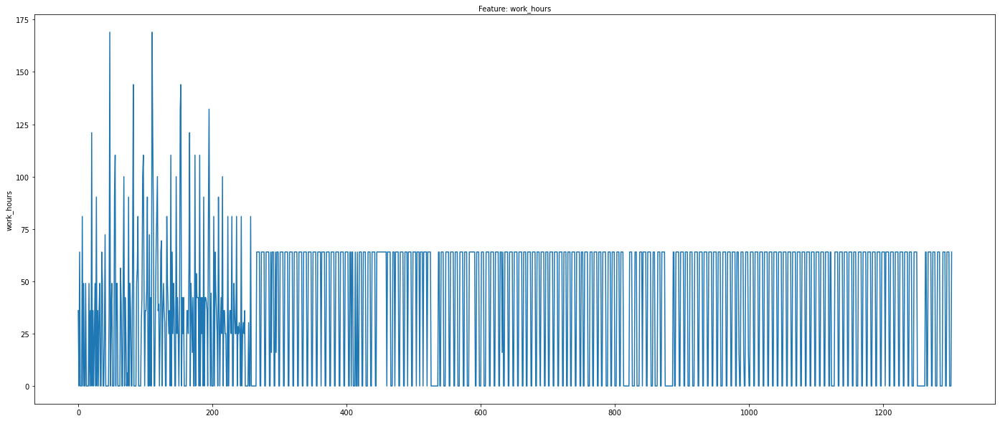

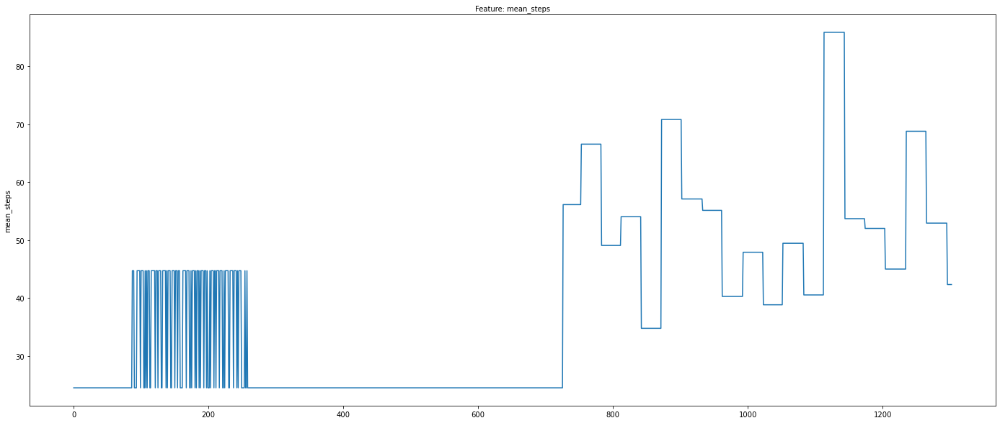

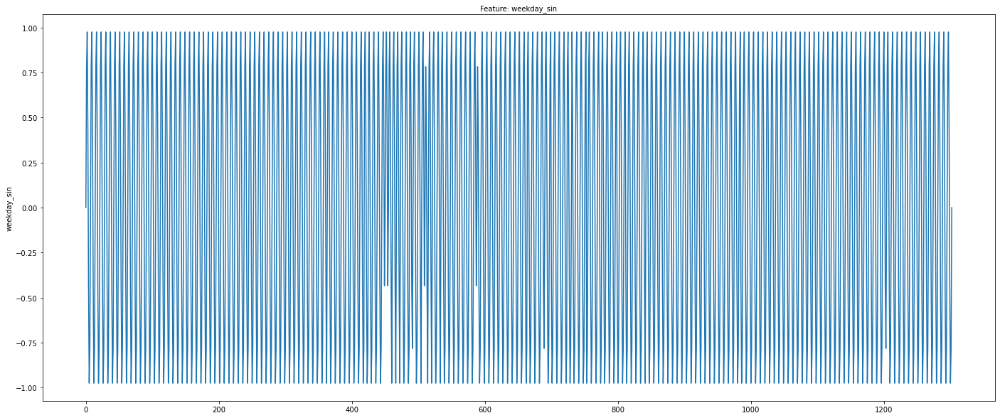

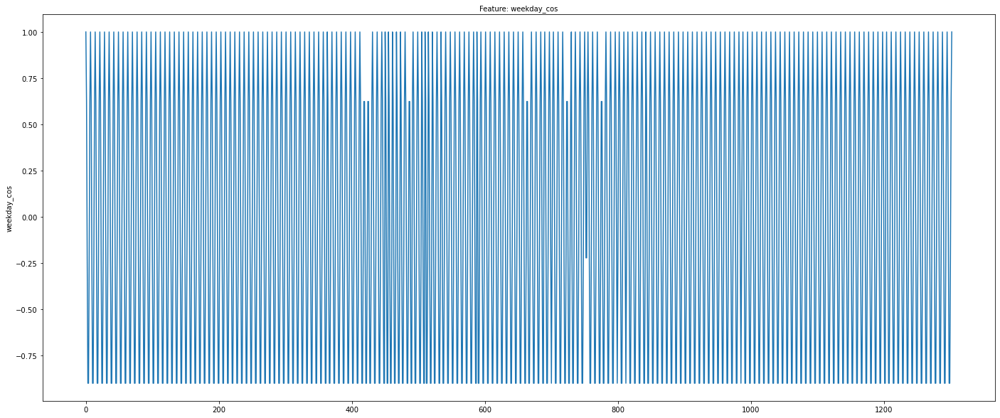

...

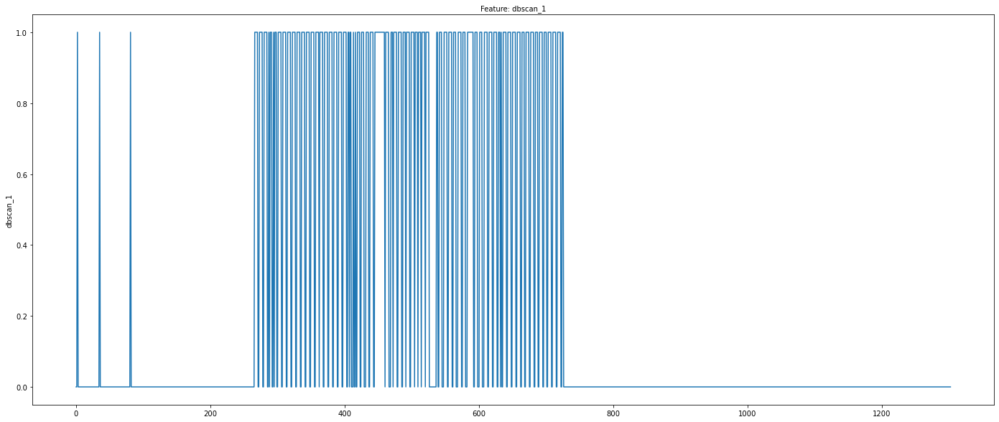

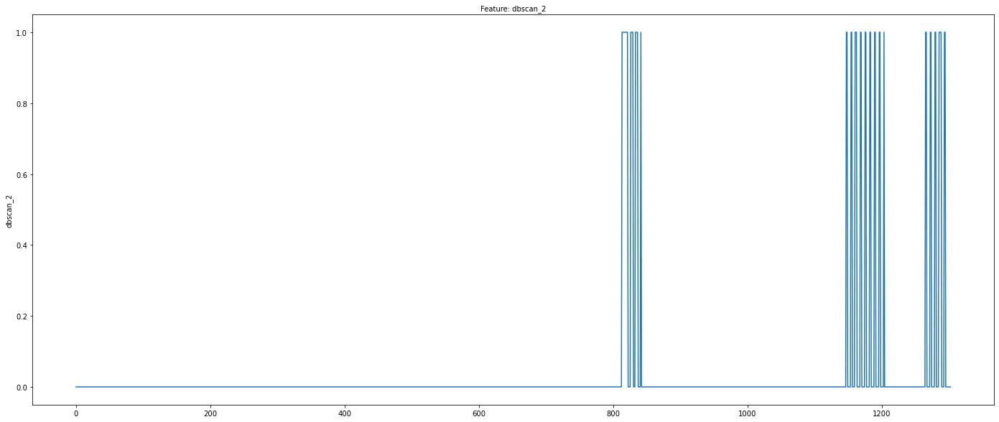

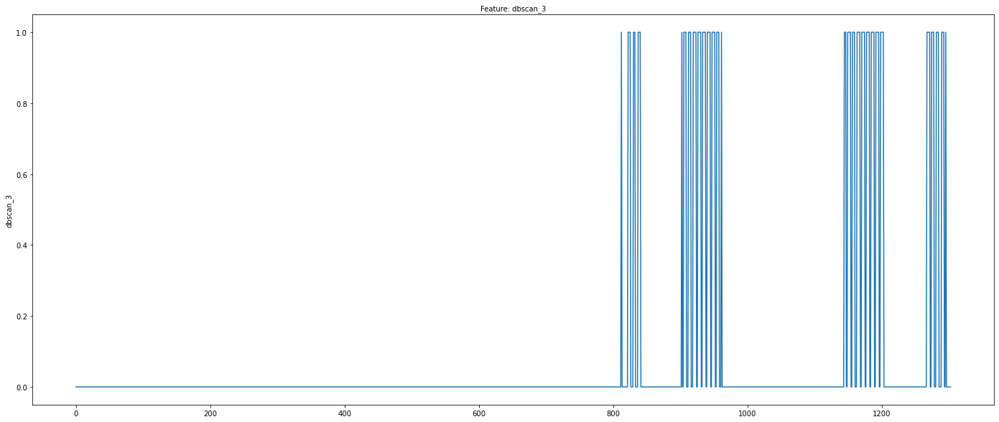

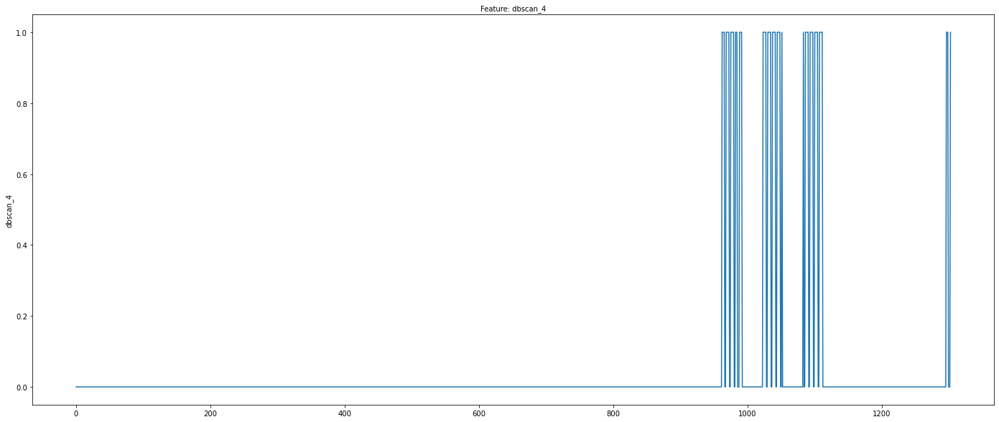

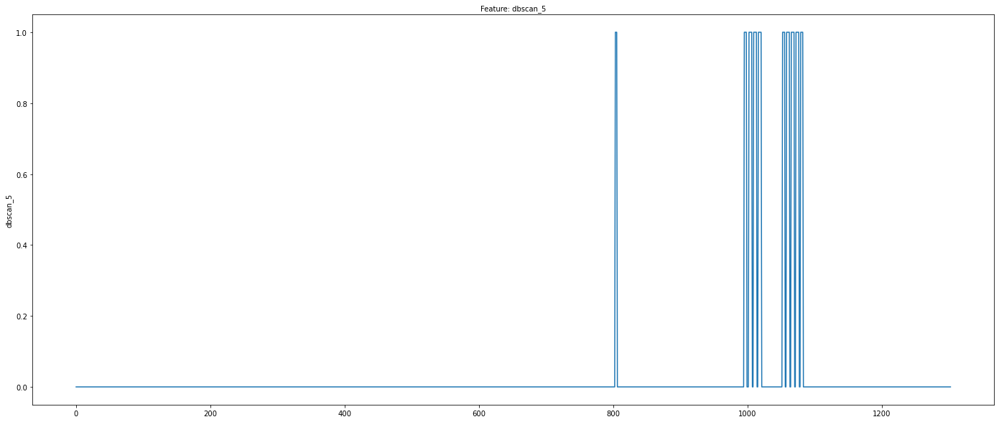

In [19]:
# Last check of lineplots to make sure features have expected values
for i in X.columns:
    fig = plt.figure(figsize=(24,10))
    ax = plt.subplot()
    sns.lineplot(x=range(0,len(df)), y=X[i], ax = ax)
    ax.set_title(f'Feature: {i}', fontsize=10)
    ax.set_ylabel(ylabel=f'{i}', fontsize=10)


In [20]:
# we make train, test and validation set (instead of only train-test) to tune parameters more easily

from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.12, random_state=0, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.14, random_state=0, stratify=y_train)


In [328]:
# using pipeline to avoid information leakage in further cross validation 
# scaling can affect the score of LogisticRegression, KNN and SVM which we will be trying later;
# we will include it in the pipeline

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
scaler = StandardScaler()
pca = PCA(n_components=0.99)

# First testing various models, to get an idea which one might perform well 
# we can test many models, because the dataset is small, so this won't take too much time
# importing all necessary libraries/modules/classifiers/metrics

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
import pickle


In [22]:
# comparing models


classifiers = [RandomForestClassifier(),
               DecisionTreeClassifier(),
               AdaBoostClassifier(),
               GradientBoostingClassifier(),
               ExtraTreesClassifier(),
    LogisticRegression(),
    XGBClassifier(),
    KNeighborsClassifier(),
    GaussianNB(),
    BernoulliNB(),
    SVC(), 
              ]



def compare_models(classifiers, X_train, y_train, sort_by_metric):
    metrics=['recall','roc_auc', 'precision','accuracy']
    print(f'features used: {X_train.columns}')
    scores_df = pd.DataFrame(np.zeros((len(classifiers),5)), columns = ['name', *metrics])
    for i in range(0,len(classifiers)):
        model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifiers[i])])
        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=10)
        scores = cross_validate(model, X_train, y_train, scoring=metrics, cv=cv, n_jobs=-1, error_score="raise")
        scores_df['name']=classifiers
        scores_df.at[i,'recall']=np.mean(scores['test_recall'])
        scores_df.at[i,'roc_auc']=np.mean(scores['test_roc_auc'])
        scores_df.at[i,'precision']=np.mean(scores['test_precision'])
        scores_df.at[i,'accuracy']=np.mean(scores['test_accuracy'])
    scores_df = scores_df.sort_values(by=[sort_by_metric], ascending = False)
    return scores_df



first_comparison = compare_models(classifiers, X_train, y_train, 'recall')
first_comparison

features used: Index(['avg_course_day', 'work_hours', 'mean_steps', 'weekday_sin',
       'weekday_cos', 'part_of_month_2', 'part_of_month_3', 'q_sin', 'q_cos',
       'month_sin', 'month_cos', 'wok_sin', 'wok_cos', 'job_2', 'job_3', 'R',
       'learningDS', 'homeoffice', 'Netflix', 'journey', 'holiday', 'covid',
       'dbscan_0', 'dbscan_1', 'dbscan_2', 'dbscan_3', 'dbscan_4', 'dbscan_5'],
      dtype='object')


,name,recall,roc_auc,precision,accuracy
1,DecisionTreeClassifier(),0.327927,0.567754,0.309178,0.708629
6,"XGBClassifier(base_score=None, booster=None, c...",0.230439,0.679582,0.375205,0.760000
8,GaussianNB(),0.216244,0.633451,0.382709,0.765076
4,ExtraTreesClassifier(),0.214220,0.673898,0.374744,0.762335
7,KNeighborsClassifier(),0.181476,0.661202,0.377588,0.767817
2,AdaBoostClassifier(),0.179915,0.629085,0.369302,0.767107
0,RandomForestClassifier(),0.178451,0.678077,0.398959,0.774213
3,GradientBoostingClassifier(),0.170000,0.663650,0.446254,0.783249
5,LogisticRegression(),0.093134,0.640792,0.594747,0.799086
10,SVC(),0.047073,0.663374,0.685000,0.796548


In [23]:
# We will balance classess adding the class_weight parameter to the models that support this hyperparameter, 
# and see how does it change the overall performance;

classifiers = [RandomForestClassifier(class_weight="balanced"),
               DecisionTreeClassifier(class_weight="balanced"),
               ExtraTreesClassifier(class_weight="balanced"),
    LogisticRegression(class_weight="balanced"),
    XGBClassifier(class_weight="balanced"),
    SVC(class_weight="balanced")]
 
first_comparison = compare_models(classifiers, X_train, y_train, 'recall')

first_comparison

features used: Index(['avg_course_day', 'work_hours', 'mean_steps', 'weekday_sin',
       'weekday_cos', 'part_of_month_2', 'part_of_month_3', 'q_sin', 'q_cos',
       'month_sin', 'month_cos', 'wok_sin', 'wok_cos', 'job_2', 'job_3', 'R',
       'learningDS', 'homeoffice', 'Netflix', 'journey', 'holiday', 'covid',
       'dbscan_0', 'dbscan_1', 'dbscan_2', 'dbscan_3', 'dbscan_4', 'dbscan_5'],
      dtype='object')


,name,recall,roc_auc,precision,accuracy
5,SVC(class_weight='balanced'),0.584902,0.685992,0.322240,0.659391
3,LogisticRegression(class_weight='balanced'),0.557159,0.635540,0.278692,0.609746
1,DecisionTreeClassifier(class_weight='balanced'),0.319732,0.572082,0.324587,0.719797
4,"XGBClassifier(base_score=None, booster=None, c...",0.221171,0.667181,0.361073,0.757259
2,ExtraTreesClassifier(class_weight='balanced'),0.201500,0.670237,0.363814,0.761624
0,RandomForestClassifier(class_weight='balanced'),0.160220,0.679361,0.432720,0.782640


In [24]:
# In order to avoid multicollinearityit was possible to use pca  or perform feature selection; 
# PCA gives better results in terms of our models' performance, so we are commenting the code for feature selection


from sklearn.feature_selection import SelectKBest, f_classif

def select_k_for_k_best(X_train, y_train, classifier, score_func):
    scores_df = pd.DataFrame(np.zeros((len(X_train.columns),5)), columns =['i','recall','roc_auc', 'precision','accuracy'])
    for i in range(1,len(X_train.columns)+1):
        feature_selector=SelectKBest(score_func=score_func,k=i)
        model = Pipeline([('scaler',scaler),('feature_selector',feature_selector),('classifier', classifier)])
        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=10)
        scoring = ['recall','roc_auc', 'precision','accuracy']
        scores = cross_validate(model, X_train, y_train, scoring=scoring, cv=cv, n_jobs=-1, error_score="raise")
        scores_df.at[i-1,'i']=i
        scores_df.at[i-1,'recall']=np.mean(scores['test_recall'])
        scores_df.at[i-1,'roc_auc']=np.mean(scores['test_roc_auc'])
        scores_df.at[i-1,'precision']=np.mean(scores['test_precision'])
        scores_df.at[i-1,'accuracy']=np.mean(scores['test_accuracy'])
    return scores_df
    


In [25]:
# k_best_data_f_reg_SVC = select_k_for_k_best(X_train, y_train, SVC(class_weight='balanced', probability=True), score_func=f_classif)
# k_best_data_f_reg_SVC.sort_values(by='recall', ascending = False)[0:4]

In [26]:
# k_best_data_f_reg_LR = select_k_for_k_best(X_train, y_train, LogisticRegression(class_weight='balanced'), score_func=f_classif)
# k_best_data_f_reg_LR.sort_values(by='recall', ascending = False)[0:4]

In [27]:
# Best features for SVC
# k = 29
# feature_selector=SelectKBest(score_func=f_classif,k=k)
# feature_selector.fit(X_train, y_train)
# mask = feature_selector.get_support()
# new_features = X_train.columns[mask]
# print(f'for SVC our best {k}  features are:')
# print (new_features)
# print('------------------------------------')


In [28]:
# X_kbest = ['avg_course_day', 'mean_steps', 'weekday_sin', 'weekday_cos',
#        'part_of_month_2', 'month_3', 'month_4', 'month_5', 'month_6',
#        'month_7', 'month_10', 'month_11', 'month_12', 'q_sin', 'q_cos',
#        'month_sin', 'month_cos', 'wok_sin', 'wok_cos', 'job_2', 'job_3',
#        'learningDS', 'Netflix', 'journey', 'holiday', 'delta_age', 'covid',
#        'dbscan_0', 'dbscan_1']

# X_train_svc =  X_train[X_kbest]
# X_val_svc = X_val[X_kbest]
# X_test_svc =  X_test[X_kbest]

In [29]:
# # Best Features for LogisticRegression

# k = 34
# feature_selector=SelectKBest(score_func=f_classif,k=k)
# feature_selector.fit(X_train, y_train)
# mask = feature_selector.get_support()
# new_features = X_train.columns[mask]

# print(f'for LogisticRegression our best {k} features are:')
# print (new_features)
# print('------------------------------------')


In [30]:
# X_kbest = ['avg_course_day', 'work_hours', 'mean_steps', 'weekday_sin',
#        'weekday_cos', 'part_of_month_2', 'month_3', 'month_4', 'month_5',
#        'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11',
#        'month_12', 'q_sin', 'q_cos', 'month_sin', 'month_cos', 'wok_sin',
#        'wok_cos', 'job_2', 'job_3', 'R', 'learningDS', 'homeoffice', 'Netflix',
#        'journey', 'holiday', 'delta_age', 'covid', 'dbscan_0', 'dbscan_1']

# X_train_lr = X_train[X_kbest]

# X_val_lr = X_val[X_kbest]
# X_test_lr = X_test[X_kbest]

In [31]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# df_vif_svc= X_train_svc

# # calculating VIF for each feature

# def calculating_VIF(df_vif):
#     features = [j for j in df_vif.columns]
#     VIF = []
#     for i in range(len(df_vif.columns)):
#         VIF.append(variance_inflation_factor(df_vif.values, i)).astype(float64)
#     for k,l in zip(features,VIF):
#         print(f'VIF for {k} is {l}')

# calculating_VIF(df_vif_svc)
# We still have a lot of collinearity, but we will include standardization and regularization hyperparameters,
# which might help with that issue; we will also use some feature selection techniques which should help


In [32]:
# ================================Best models by recall===============================================
# we will do Gridsearch cv for parameters tuning of Logistic Regression and SVC; as we have a lot of 0-1 dummy variables,
# decision tree-based algorithms performed worse; 
#  ===================================================================================================


from sklearn.model_selection import GridSearchCV
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=10)


In [226]:
# default params are:penalty='l2', C=1.0,solver='lbfgs', max_iter=100)
# we will also try regularization parameters in our gridsearch to avoid overfitting;


classifier = LogisticRegression(class_weight='balanced')

model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])


parameters = {'classifier__penalty' : ['l1', 'l2', None, 'elasticnet'],
    'classifier__C' : [0.00001, 0.0001,0.001, 0.01,0.1, 1],
    'classifier__solver' : ['lbfgs','liblinear','sag', 'newton-cholesky', 'newton-cg' ],
    'classifier__max_iter' : [100, 1000,2500, 5000]
    }

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model,parameters, verbose=5,scoring=scoring,n_jobs=-1, cv=cv, refit='recall', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
roc_auc = clf.cv_results_['mean_train_roc_auc'][best_index]
precision = clf.cv_results_['mean_train_precision'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print("\n The best recall score across ALL searched params:\n",clf.best_score_)
print(f'roc_auc is: {roc_auc}')
print(f'precision is: {precision}')

Fitting 15 folds for each of 480 candidates, totalling 7200 fits
Results from Grid Search

 The best estimator across ALL searched params: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('classifier',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    penalty='l1', solver='liblinear'))])
-----------------------------------------------------------

 The best recall score across ALL searched params:
 0.5847560975609756
roc_auc is: 0.6857096793464984
precision is: 0.305587881353841


C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5400 fits failed out of a total of 7200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1091, in fit
    solver = _check_solver(self.solver, self.penalty,

In [175]:
# we will define functions to plot recall and precision scores for different values of hyperparameters
# and to calculate different metrics scores to use later; these will help to decide which models with which hyperparameters
# works best


def add_precision_recall_point(X_train, y_train, X_val, y_val):
    model = Pipeline([('scaler',scaler),('pca', pca),('classifier', classifier)])
    model.fit(X_train, y_train)
    y_pred=model.predict(X_val)
    precision_point = precision_score(y_val, y_pred)
    recall_point = recall_score(y_val, y_pred)
    roc_auc_point = roc_auc_score(y_val, y_pred)
    return precision_point, recall_point, roc_auc_point

        
    
def plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, title_x_axis):    
    plt.plot(ticks, precision_bag)
    plt.plot(ticks, recall_bag)
    plt.plot(ticks, roc_auc_bag)
    plt.grid(True)
    plt.title(f'precision and recall curves in function of {title_x_axis}')
    plt.legend(['precision', 'recall', 'roc_auc'])
    plt.xlabel(f'{title_x_axis}')
    
def calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val):
    model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    recall = recall_score(y_val.values, y_pred)
    precision = precision_score(y_val.values, y_pred)
    roc_auc = roc_auc_score(y_val.values, y_pred)
    return classifier, recall, precision, roc_auc
 

C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


precisions:[0.0, 0.0, 0.0, 0.30158730158730157, 0.3508771929824561, 0.34545454545454546, 0.34545454545454546, 0.34545454545454546]
recalls:[0.0, 0.0, 0.0, 0.5757575757575758, 0.6060606060606061, 0.5757575757575758, 0.5757575757575758, 0.5757575757575758]
roc_aucs:[0.5, 0.5, 0.5, 0.6160037878787878, 0.6584990530303031, 0.6472537878787878, 0.6472537878787878, 0.6472537878787878]


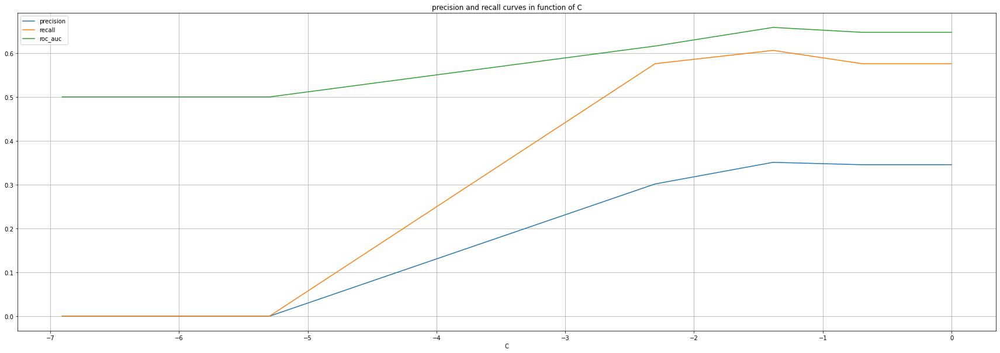

In [229]:
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = [0.001, 0.0025, 0.005, 0.1, 0.25, 0.5, 0.75, 1]
ticks = [np.log(j) for j in list_to_check]

for i in list_to_check:
    classifier = LogisticRegression(C=i, class_weight='balanced',
                                    penalty='l1', solver='liblinear')
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'C') 

print(f'precisions:{precision_bag}')
print(f'recalls:{recall_bag}')
print(f'roc_aucs:{roc_auc_bag}')


In [242]:
classifier = LogisticRegression(C=0.25, class_weight='balanced',
                                    penalty='l1', solver='liblinear')

recall_model_comparison = pd.DataFrame(columns = ['classifier', 'recall', 'precision', 'roc_auc'])

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
recall_model_comparison = recall_model_comparison.append({'classifier':classifier,'recall':recall,
                                                                'roc_auc': roc_auc,
                                                                'precision':precision}, ignore_index=True)
recall_model_comparison

,classifier,recall,precision,roc_auc
0,"LogisticRegression(C=0.25, class_weight='balan...",0.606061,0.350877,0.658499


In [259]:
# default params are:(*, C=1.0, kernel='rbf', gamma='scale', class_weight=None)
# we will also try regularization parameters in our gridsearch to avoid overfitting; 
# these should also deal will multicollinearity
# to beat: recall, roc_auc,precision, accuracy 0.573023 	0.695144 	0.327433 	0.666986

classifier = SVC(class_weight='balanced')

model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

parameters = { 
#     'classifier__C': [0.0001, 0.001, 0.01, 0.01, 0.5,1],
            'classifier__kernel':['rbf','sigmoid', 'gaussian', 'linear', 'polynomial'],
    'classifier__gamma':[100, 10, 1, 0.1, 0.01, 0.001, 0.0001, 0.00001],
    'classifier__degree':[1,2,3]
}

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model,parameters, verbose=5,scoring=scoring,n_jobs=-1, cv=cv, refit='recall', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
roc_auc = clf.cv_results_['mean_train_roc_auc'][best_index]
precision = clf.cv_results_['mean_train_precision'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print('\n The best recall score across ALL searched params:\n',clf.best_score_)
print(f'roc_auc is: {roc_auc}')
print(f'precision is: {precision}')

Fitting 15 folds for each of 120 candidates, totalling 1800 fits
Results from Grid Search

 The best estimator across ALL searched params: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('classifier',
                 SVC(class_weight='balanced', degree=1, gamma=0.01,
                     kernel='sigmoid'))])
-----------------------------------------------------------

 The best recall score across ALL searched params:
 0.5346747967479676
roc_auc is: 0.664314169694505
precision is: 0.2992569659741402


C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
720 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\svm\_base.py", line 251, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)


C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is i

precisions:[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.21428571428571427, 0.25, 0.27419354838709675, 0.2571428571428571, 0.2571428571428571, 0.2608695652173913, 0.2647058823529412]
recalls:[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2727272727272727, 0.42424242424242425, 0.5151515151515151, 0.5454545454545454, 0.5454545454545454, 0.5454545454545454, 0.5454545454545454]
roc_aucs:[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5074573863636364, 0.5480587121212122, 0.5817945075757576, 0.5696022727272727, 0.5696022727272727, 0.5735085227272727, 0.5774147727272727]


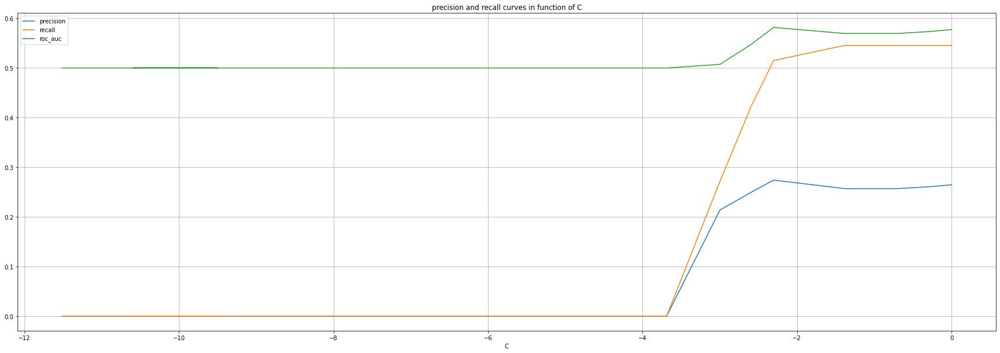

In [267]:
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = [0.00001,0.000075, 0.00005, 0.000025, 0.0001,0.00025, 0.0005,0.00075, 0.001, 0.0025,
                 0.005, 0.0075, 0.01,0.025, 0.05, 0.075, 0.1,0.25, 0.5,0.75,1]
ticks = [np.log(j) for j in list_to_check]

for i in list_to_check:
    classifier = SVC(class_weight='balanced', degree=1, gamma=0.01,
                     kernel='sigmoid', C=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'C') 

print(f'precisions:{precision_bag}')
print(f'recalls:{recall_bag}')
print(f'roc_aucs:{roc_auc_bag}')



precisions:[0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.20496894409937888, 0.2222222222222222, 0.25806451612903225, 0.2465753424657534, 0.2465753424657534, 0.2537313432835821, 0.1797752808988764, 0.1702127659574468, 0.16304347826086957, 0.17894736842105263]
recalls:[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.7878787878787878, 0.48484848484848486, 0.5454545454545454, 0.5454545454545454, 0.5151515151515151, 0.48484848484848486, 0.48484848484848486, 0.45454545454545453, 0.5151515151515151]
roc_aucs:[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5384706439393939, 0.5627367424242424, 0.5578835227272727, 0.5578835227272727, 0.5622632575757576, 0.45726799242424243, 0.43773674242424243, 0.4264914772727273, 0.45288825757575757]


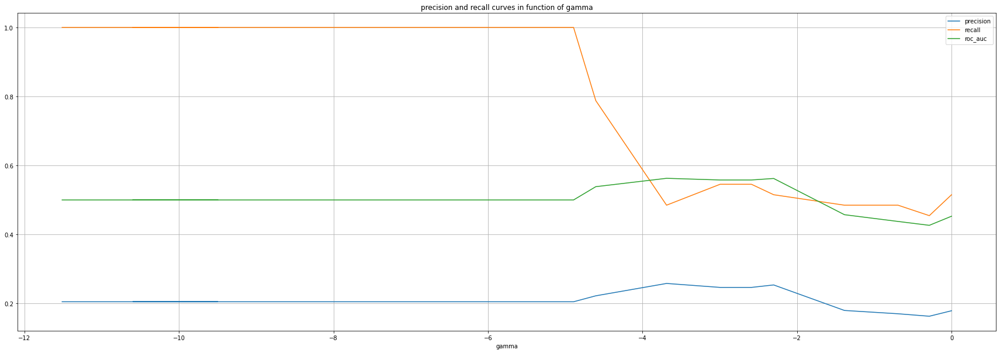

In [268]:
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = [0.00001,0.000075, 0.00005, 0.000025, 0.0001,0.00025, 0.0005,0.00075, 0.001, 0.0025,
                 0.005, 0.0075, 0.01,0.025, 0.05, 0.075, 0.1,0.25, 0.5,0.75,1]

ticks = [np.log(j) for j in list_to_check]

for i in list_to_check:
    classifier = SVC(class_weight='balanced', degree=1, gamma=i,
                     kernel='sigmoid', C=10**-1.5)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'gamma') 

print(f'precisions:{precision_bag}')
print(f'recalls:{recall_bag}')
print(f'roc_aucs:{roc_auc_bag}')

precisions:[0.20496894409937888, 0.20496894409937888, 0.20496894409937888]
recalls:[1.0, 1.0, 1.0]
roc_aucs:[0.5, 0.5, 0.5]


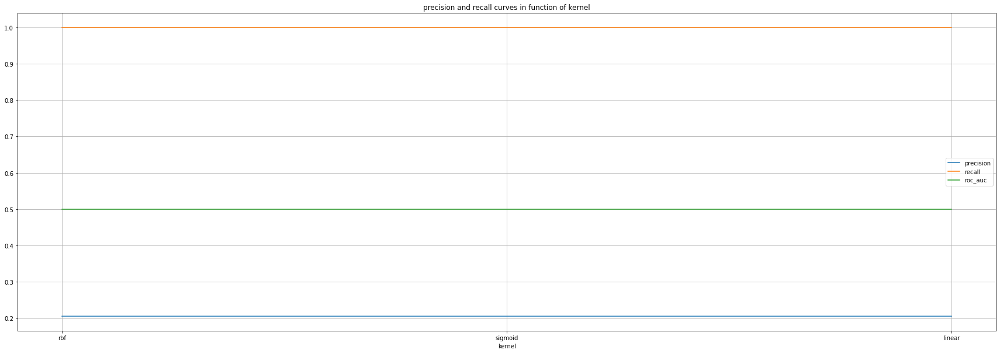

In [269]:
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = ['rbf','sigmoid','linear']

for i in list_to_check:
    classifier = SVC(class_weight='balanced', degree=1, gamma=10**-6,
                     kernel='sigmoid', C=10**-1.5)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, list_to_check, 'kernel') 

print(f'precisions:{precision_bag}')
print(f'recalls:{recall_bag}')
print(f'roc_aucs:{roc_auc_bag}')


In [270]:
classifier = SVC(class_weight='balanced', degree=1, gamma=10**-6,
                     kernel='sigmoid', C=10**-1.5)

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
recall_model_comparison = recall_model_comparison.append({'classifier':classifier,'recall':recall,
                                                                'roc_auc': roc_auc,
                                                                'precision':precision}, ignore_index=True)
recall_model_comparison

,classifier,recall,precision,roc_auc
0,"LogisticRegression(C=0.25, class_weight='balan...",0.606061,0.350877,0.658499
1,"SVC(C=0.03162277660168379, class_weight='balan...",1.000000,0.204969,0.500000


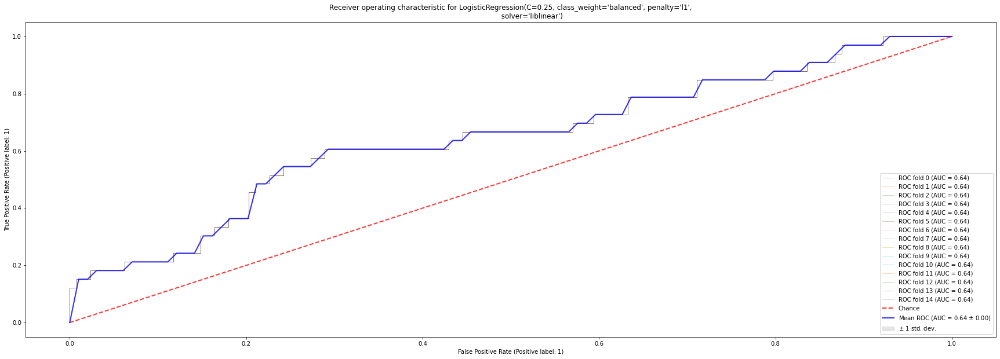

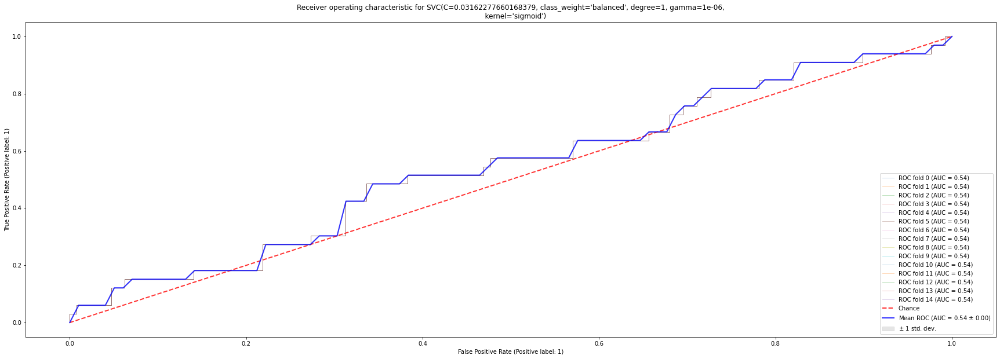

In [271]:
# roc auc curve from SKLEARN documentation
from sklearn.metrics import auc
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import StratifiedKFold

SV = SVC(class_weight='balanced', degree=1, gamma=10**-6,
                     kernel='sigmoid', C=10**-1.5)
LR = LogisticRegression(C=0.25, class_weight='balanced',
                                    penalty='l1', solver='liblinear')

classifier_list = [LR, SV]
X_train_k_best = [X_train, X_train]
y_train_both = [y_train, y_train]
y_val_both = [y_val, y_val]
X_val_k_best = [X_val, X_val]

for classifier, X_train, y_train, X_val, y_val in zip(classifier_list, X_train_k_best,y_train_both, X_val_k_best,y_val_both ):
    model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
    model.fit(X_train, y_train)

    # Run classifier with cross-validation and plot ROC curves
    # model is better than chance, but still far from optimal

    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    fig, ax = plt.subplots()
    for i, (train, val) in enumerate(cv.split(X, y)):
        model.fit(X_train, y_train)
        viz = RocCurveDisplay.from_estimator(
            model,
            X_val,
            y_val,
            name="ROC fold {}".format(i),
            alpha=0.3,
            lw=1,
            ax=ax,
        )
        interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)

    ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="r", label="Chance", alpha=0.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="b",
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

    ax.set(
        xlim=[-0.05, 1.05],
        ylim=[-0.05, 1.05],
        title=f"Receiver operating characteristic for {classifier}",
    )
    ax.legend(loc="lower right")
    plt.show()


In [272]:
# Our best classifier by recall score is SV 

classifier = SV

model_recall_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
model_recall_oriented.fit(X_train, y_train)
y_pred = model_recall_oriented.predict(X_val)
recall = recall_score(y_val.values, y_pred)
precision = precision_score(y_val.values, y_pred)
roc_auc = roc_auc_score(y_val.values, y_pred)
print(f'recall is {recall}')
print(f'precision is {precision}')
print(f'roc_auc is {roc_auc}')
result = classification_report(y_val, y_pred)
print('------------------------------------------')
print(result)

recall is 1.0
precision is 0.20496894409937888
roc_auc is 0.5
------------------------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       128
           1       0.20      1.00      0.34        33

    accuracy                           0.20       161
   macro avg       0.10      0.50      0.17       161
weighted avg       0.04      0.20      0.07       161



C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [275]:
# We will save the model with use of pickle in order to be able 
# to use it as a helper model in another notebooks on same dataset

import pickle
# from pathlib import Path
model_recall_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
pickle.dump(model_recall_oriented, open('model_recall_oriented.pkl', 'wb'))

# load the model from disk
recall_oriented_model = pickle.load(open('model_recall_oriented.pkl', 'rb'))
from sklearn.metrics import classification_report
y_pred=recall_oriented_model.predict(X_test)
result_recall = classification_report(y_test, y_pred)
print(result)
recall_rom = recall_score(y_test, y_pred)
precision_rom = precision_score(y_test, y_pred)
roc_auc_rom = roc_auc_score(y_test, y_pred)



              precision    recall  f1-score   support

           0       0.00      0.00      0.00       128
           1       0.20      1.00      0.34        33

    accuracy                           0.20       161
   macro avg       0.10      0.50      0.17       161
weighted avg       0.04      0.20      0.07       161



C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [61]:
# Now we will develop another model that will be more precision oriented; we will also use it as a helper model for 
# another regression problem 



classifiers = [RandomForestClassifier(),
               DecisionTreeClassifier(),
               AdaBoostClassifier(base_estimator=LogisticRegression()),
               AdaBoostClassifier(),
               GradientBoostingClassifier(),
               ExtraTreesClassifier(),
    LogisticRegression(),
    XGBClassifier(),
    KNeighborsClassifier(),
    GaussianNB(),
    BernoulliNB(),
    SVC(), 
               RandomForestClassifier(class_weight="balanced"),
               DecisionTreeClassifier(class_weight="balanced"),
               ExtraTreesClassifier(class_weight="balanced"),
    LogisticRegression(class_weight="balanced"),
    XGBClassifier(class_weight="balanced"),
    SVC(class_weight="balanced")
              ]

first_comparison_by_precision = compare_models(classifiers, X_train, y_train, 'precision')
first_comparison_by_precision

# we want the best possible precision, but we also need the model to identify at least a small part of 1 values;
# we will focus on AdaBoost and we will try making Logistic Regression its base estimator

# AdaBoost classifier has smaller precision, but 2-3 times higher recall,
# we will grid search for its best hyperparameters

features used: Index(['avg_course_day', 'work_hours', 'mean_steps', 'weekday_sin',
       'weekday_cos', 'part_of_month_2', 'part_of_month_3', 'q_sin', 'q_cos',
       'month_sin', 'month_cos', 'wok_sin', 'wok_cos', 'job_2', 'job_3', 'R',
       'learningDS', 'homeoffice', 'Netflix', 'journey', 'holiday', 'covid',
       'dbscan_0', 'dbscan_1', 'dbscan_2', 'dbscan_3', 'dbscan_4', 'dbscan_5'],
      dtype='object')


,name,recall,roc_auc,precision,accuracy
11,SVC(),0.052500,0.659848,0.644762,0.795939
2,AdaBoostClassifier(base_estimator=LogisticRegr...,0.082829,0.632716,0.625254,0.796853
6,LogisticRegression(),0.087780,0.640373,0.556384,0.797360
4,GradientBoostingClassifier(),0.163780,0.657973,0.437758,0.782335
10,BernoulliNB(),0.042622,0.622806,0.433048,0.790660
12,RandomForestClassifier(class_weight='balanced'),0.156488,0.687090,0.429550,0.781624
0,RandomForestClassifier(),0.175549,0.689325,0.420420,0.778477
9,GaussianNB(),0.223463,0.640248,0.395532,0.765482
14,ExtraTreesClassifier(class_weight='balanced'),0.204805,0.668948,0.380977,0.765279
16,"XGBClassifier(base_score=None, booster=None, c...",0.237244,0.677767,0.375085,0.759898


In [76]:
# default:
# (learning_rate=0.1, n_estimators=100, min_samples_split=2, max_features=None)

classifier = AdaBoostClassifier()

model_precision_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

parameters = { 'classifier__base_estimator': [LogisticRegression()],
              'classifier__n_estimators':[100,1000, 10000],
    'classifier__learning_rate':[0.0001,0.001, 0.01, 0.1, 1]
             }

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model_precision_oriented,parameters, verbose=0,scoring=scoring,n_jobs=-1, cv=cv, refit='precision', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
roc_auc = clf.cv_results_['mean_train_roc_auc'][best_index]
recall = clf.cv_results_['mean_train_recall'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print("\n The best precision score across ALL searched params:\n",clf.best_score_)
print(f'roc_auc is: {roc_auc}')
print(f'recall is: {recall}')

# best estimator is: AdaBoostClassifier(base_estimator=LogisticRegression(),
#                                     learning_rate=0.001, n_estimators=10000)

Results from Grid Search

 The best estimator across ALL searched params: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('classifier',
                 AdaBoostClassifier(base_estimator=LogisticRegression(),
                                    learning_rate=0.001, n_estimators=10000))])
-----------------------------------------------------------

 The best precision score across ALL searched params:
 0.7082539682539682
roc_auc is: 0.684256509522823
recall is: 0.05925482567709112


C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is i

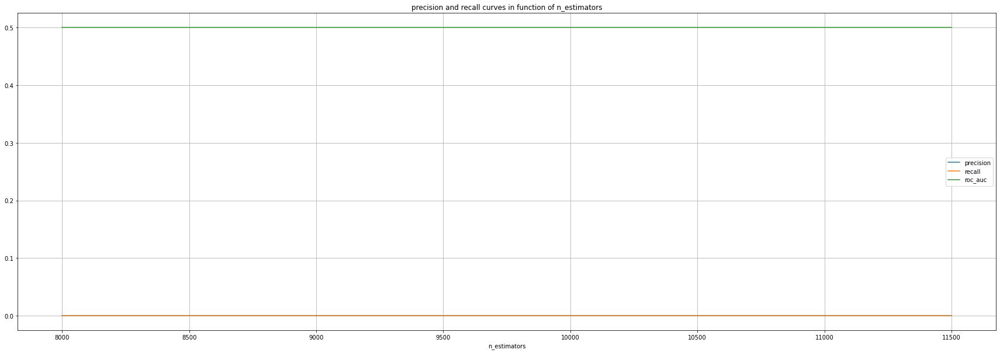

In [81]:
# we plot recall and precision scores for n_estimators and numbers between to see if we can find
# a better fit with the best learning rate and n_estimators chosen by grid search
# learning rate of 0.0001 seems to low, as the model was not able to detect any 1 values, even with high n_estimators;
# we discart lower learning rate 


precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(8000,12000,500)]

for i in np.arange(8000,12000,500):
    classifier = AdaBoostClassifier(base_estimator=LogisticRegression(), learning_rate=0.0001, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

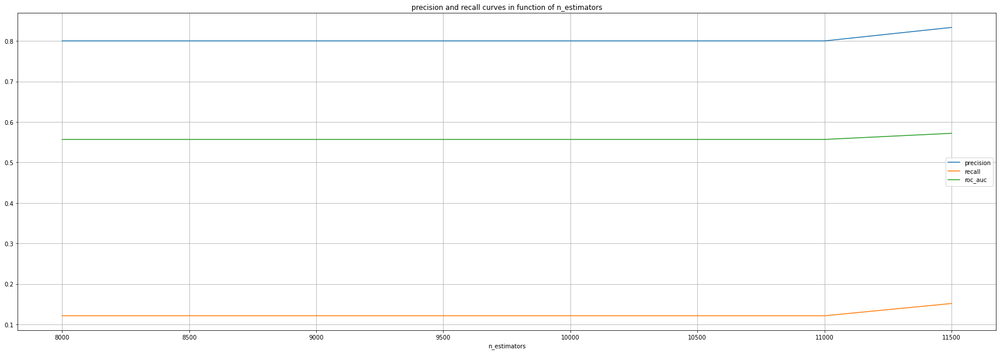

In [80]:
# Precision is below 1, which is not meeting our objective of 1 precision; we discart the option of higher learning rate

precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(8000,12000,500)]

for i in np.arange(8000,12000,500):
    classifier = AdaBoostClassifier(base_estimator=LogisticRegression(), learning_rate=0.01, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

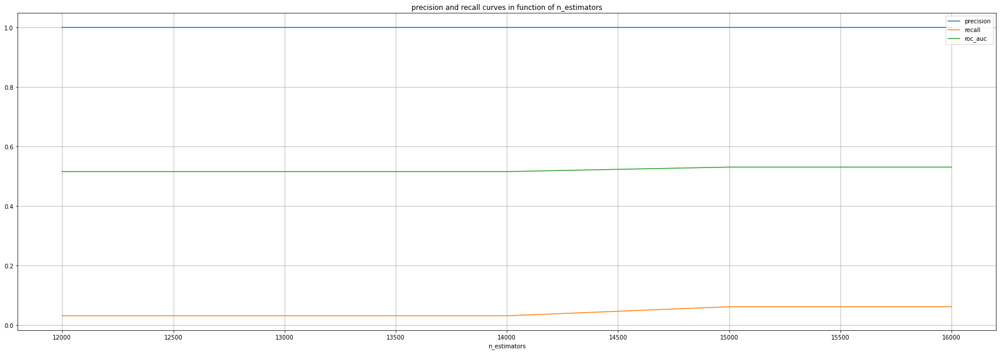

In [85]:
precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(12000,17000,1000)]

for i in np.arange(12000,17000,1000):
    classifier = AdaBoostClassifier(base_estimator=LogisticRegression(), learning_rate=0.001, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

In [93]:
# we are creating a dataframe to save all scores to be able to compare them later on

precision_model_comparison = pd.DataFrame(columns = ['classifier', 'recall', 'roc_auc','precision' ])

classifier = AdaBoostClassifier(base_estimator=LogisticRegression(),
                                    learning_rate=0.001, n_estimators=17000)

def calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val):
    model_precision_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
    model_precision_oriented.fit(X_train, y_train)
    y_pred = model_precision_oriented.predict(X_val)
    recall = recall_score(y_val.values, y_pred)
    precision = precision_score(y_val.values, y_pred)
    roc_auc = roc_auc_score(y_val.values, y_pred)
    return classifier, recall, precision, roc_auc

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
precision_model_comparison = precision_model_comparison.append({'classifier':classifier,'recall':recall, 
                                                                'roc_auc': roc_auc, 'precision':precision},
                                                               ignore_index=True)

In [95]:
precision_model_comparison

,classifier,recall,roc_auc,precision
0,"(LogisticRegression(random_state=148441733), L...",0.121212,0.560606,1.0


In [96]:
# We will check if we can tune XGBoost to have better performance than AdaBoost
# default hyperparameters:
# (n_estimators=1000, min_samples_split=2, max_features=None)
# as the recall value for default hyperparameters seems high for a dataset made manually(prone to mistakes), 
# we will grid search also for some hyperparameters that help with overfitting(max_depth, min_samples_split)

classifier = XGBClassifier(class_weight='balanced')

model_precision_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

parameters = { 'classifier__subsample': [0.5, 0.75,1],
    'classifier__max_features': [2,'sqrt',10],
              'classifier__max_depth':[2,3,5],
#               'classifier__min_samples_split':[2, 15, 25],
              'classifier__n_estimators':[100,1000,10000],
    'classifier__learning_rate':[0.001,0.1, 1],
              
             }

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model_precision_oriented,parameters, verbose=5,scoring=scoring,n_jobs=-1, cv=cv, refit='precision', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
roc_auc = clf.cv_results_['mean_train_roc_auc'][best_index]
recall = clf.cv_results_['mean_train_recall'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print("\n The best roc_auc score across ALL searched params:\n",clf.best_score_)
print(f'recall is: {recall}')
print(f'precision is: {roc_auc}')

Fitting 15 folds for each of 243 candidates, totalling 3645 fits


KeyboardInterrupt: 

[0]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[1]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[2]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[3]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[4]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[5]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[6]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[7]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[8]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[9]	validation_0-auc:0.56704

[76]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[77]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[78]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[79]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[80]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[81]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[82]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[83]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[84]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[85]	validation_0-a

C:\Users\Olga\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[93]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[94]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[95]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[96]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[97]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[98]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[99]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[100]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[101]	validation_0-auc:0.56704	validation_0-error:0.19188	validation_1-auc:0.55339	validation_1-error:0.18634
[102]	validation_

[168]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[169]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[170]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[171]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[172]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[173]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[174]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[175]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[176]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[177]	vali

[243]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[244]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[245]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[246]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[247]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[248]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[249]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[250]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[251]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[252]	vali

[318]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[319]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[320]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[321]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[322]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[323]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[324]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[325]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[326]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[327]	vali

[393]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[394]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[395]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[396]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[397]	validation_0-auc:0.63682	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[398]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[399]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[400]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[401]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[402]	vali

[468]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[469]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[470]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[471]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[472]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[473]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[474]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[475]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[476]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[477]	vali

[543]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[544]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[545]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[546]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[547]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[548]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[549]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[550]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[551]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[552]	vali

[618]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[619]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[620]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[621]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[622]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[623]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[624]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[625]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[626]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[627]	vali

[693]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[694]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[695]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[696]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[697]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[698]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[699]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[700]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[701]	validation_0-auc:0.63687	validation_0-error:0.19188	validation_1-auc:0.62689	validation_1-error:0.18634
[702]	vali

[768]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[769]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[770]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[771]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[772]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[773]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[774]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[775]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[776]	validation_0-auc:0.65446	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[777]	vali

[843]	validation_0-auc:0.65507	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[844]	validation_0-auc:0.65507	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[845]	validation_0-auc:0.65507	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[846]	validation_0-auc:0.65507	validation_0-error:0.18883	validation_1-auc:0.64051	validation_1-error:0.18634
[847]	validation_0-auc:0.65507	validation_0-error:0.18883	validation_1-auc:0.64051	validation_1-error:0.18634
[848]	validation_0-auc:0.65507	validation_0-error:0.18883	validation_1-auc:0.64051	validation_1-error:0.18634
[849]	validation_0-auc:0.65507	validation_0-error:0.18883	validation_1-auc:0.64051	validation_1-error:0.18634
[850]	validation_0-auc:0.65507	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[851]	validation_0-auc:0.65507	validation_0-error:0.19797	validation_1-auc:0.64051	validation_1-error:0.19255
[852]	vali

[918]	validation_0-auc:0.65507	validation_0-error:0.18883	validation_1-auc:0.64051	validation_1-error:0.18634
[919]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[920]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[921]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[922]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[923]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[924]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[925]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[926]	validation_0-auc:0.65916	validation_0-error:0.18883	validation_1-auc:0.64311	validation_1-error:0.18634
[927]	vali

[993]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[994]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[995]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[996]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[997]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[998]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[999]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[1000]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[1001]	validation_0-auc:0.65940	validation_0-error:0.18883	validation_1-auc:0.65270	validation_1-error:0.18634
[1002]	v

[1067]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1068]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1069]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1070]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1071]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1072]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1073]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1074]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1075]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[

[1141]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1142]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1143]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1144]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1145]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1146]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1147]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1148]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1149]	validation_0-auc:0.65991	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[

[1215]	validation_0-auc:0.66071	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1216]	validation_0-auc:0.66071	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1217]	validation_0-auc:0.66071	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1218]	validation_0-auc:0.66071	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[1219]	validation_0-auc:0.66081	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.18634
[1220]	validation_0-auc:0.66081	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.18634
[1221]	validation_0-auc:0.66081	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.18634
[1222]	validation_0-auc:0.66081	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.18634
[1223]	validation_0-auc:0.66081	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.18634
[

[1289]	validation_0-auc:0.69594	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1290]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1291]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1292]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1293]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1294]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1295]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1296]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[1297]	validation_0-auc:0.69602	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.18634
[

[1363]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1364]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1365]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1366]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1367]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1368]	validation_0-auc:0.69899	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1369]	validation_0-auc:0.69932	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1370]	validation_0-auc:0.69932	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[1371]	validation_0-auc:0.69932	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[

[1510]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1511]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1512]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1513]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1514]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1515]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1516]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1517]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[1518]	validation_0-auc:0.70280	validation_0-error:0.18883	validation_1-auc:0.65897	validation_1-error:0.18634
[

[1584]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1585]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1586]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1587]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1588]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1589]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1590]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1591]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[1592]	validation_0-auc:0.70467	validation_0-error:0.18883	validation_1-auc:0.65637	validation_1-error:0.18634
[

[1658]	validation_0-auc:0.70569	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1659]	validation_0-auc:0.70567	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1660]	validation_0-auc:0.70567	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1661]	validation_0-auc:0.70567	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1662]	validation_0-auc:0.70567	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1663]	validation_0-auc:0.70568	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1664]	validation_0-auc:0.70568	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1665]	validation_0-auc:0.70568	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[1666]	validation_0-auc:0.70592	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[

[1732]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1733]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1734]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1735]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1736]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1737]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1738]	validation_0-auc:0.70791	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1739]	validation_0-auc:0.70790	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[1740]	validation_0-auc:0.70790	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[

[1806]	validation_0-auc:0.70853	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1807]	validation_0-auc:0.70823	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1808]	validation_0-auc:0.70823	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1809]	validation_0-auc:0.70853	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1810]	validation_0-auc:0.70853	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1811]	validation_0-auc:0.70853	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1812]	validation_0-auc:0.70857	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1813]	validation_0-auc:0.70857	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[1814]	validation_0-auc:0.70857	validation_0-error:0.18883	validation_1-auc:0.65187	validation_1-error:0.18634
[

[1880]	validation_0-auc:0.71297	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1881]	validation_0-auc:0.71297	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1882]	validation_0-auc:0.71348	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1883]	validation_0-auc:0.71306	validation_0-error:0.18883	validation_1-auc:0.65755	validation_1-error:0.18634
[1884]	validation_0-auc:0.71348	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1885]	validation_0-auc:0.71348	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1886]	validation_0-auc:0.71348	validation_0-error:0.18883	validation_1-auc:0.65684	validation_1-error:0.18634
[1887]	validation_0-auc:0.71357	validation_0-error:0.18883	validation_1-auc:0.65755	validation_1-error:0.18634
[1888]	validation_0-auc:0.71357	validation_0-error:0.18883	validation_1-auc:0.65755	validation_1-error:0.18634
[

[1954]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1955]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1956]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1957]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1958]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1959]	validation_0-auc:0.71584	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1960]	validation_0-auc:0.71587	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1961]	validation_0-auc:0.71587	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[1962]	validation_0-auc:0.71587	validation_0-error:0.18883	validation_1-auc:0.65447	validation_1-error:0.18634
[

[2028]	validation_0-auc:0.71674	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2029]	validation_0-auc:0.71674	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2030]	validation_0-auc:0.71674	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2031]	validation_0-auc:0.71674	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2032]	validation_0-auc:0.71674	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2033]	validation_0-auc:0.71661	validation_0-error:0.18883	validation_1-auc:0.65353	validation_1-error:0.18634
[2034]	validation_0-auc:0.71671	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2035]	validation_0-auc:0.71671	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2036]	validation_0-auc:0.71671	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[

[2102]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2103]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2104]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2105]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2106]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2107]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2108]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2109]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[2110]	validation_0-auc:0.71718	validation_0-error:0.18883	validation_1-auc:0.65376	validation_1-error:0.18634
[

[2176]	validation_0-auc:0.71757	validation_0-error:0.18883	validation_1-auc:0.65329	validation_1-error:0.18634
[2177]	validation_0-auc:0.71757	validation_0-error:0.18883	validation_1-auc:0.65329	validation_1-error:0.18634
[2178]	validation_0-auc:0.71642	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2179]	validation_0-auc:0.71642	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2180]	validation_0-auc:0.71641	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2181]	validation_0-auc:0.71641	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2182]	validation_0-auc:0.71641	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2183]	validation_0-auc:0.71641	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[2184]	validation_0-auc:0.71641	validation_0-error:0.18883	validation_1-auc:0.65566	validation_1-error:0.18634
[

[2250]	validation_0-auc:0.71746	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2251]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2252]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2253]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2254]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2255]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2256]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2257]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2258]	validation_0-auc:0.71767	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[

[2324]	validation_0-auc:0.71774	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2325]	validation_0-auc:0.71769	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2326]	validation_0-auc:0.71769	validation_0-error:0.18883	validation_1-auc:0.65471	validation_1-error:0.18634
[2327]	validation_0-auc:0.72027	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2328]	validation_0-auc:0.72034	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2329]	validation_0-auc:0.72027	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2330]	validation_0-auc:0.72029	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2331]	validation_0-auc:0.72029	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2332]	validation_0-auc:0.72034	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[

[2398]	validation_0-auc:0.72078	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.18634
[2399]	validation_0-auc:0.72079	validation_0-error:0.18883	validation_1-auc:0.65507	validation_1-error:0.18634
[2400]	validation_0-auc:0.72079	validation_0-error:0.18883	validation_1-auc:0.65507	validation_1-error:0.18634
[2401]	validation_0-auc:0.72079	validation_0-error:0.18883	validation_1-auc:0.65530	validation_1-error:0.18634
[2402]	validation_0-auc:0.72079	validation_0-error:0.18883	validation_1-auc:0.65530	validation_1-error:0.18634
[2403]	validation_0-auc:0.72084	validation_0-error:0.18883	validation_1-auc:0.65554	validation_1-error:0.18634
[2404]	validation_0-auc:0.72084	validation_0-error:0.18883	validation_1-auc:0.65554	validation_1-error:0.18634
[2405]	validation_0-auc:0.72084	validation_0-error:0.18883	validation_1-auc:0.65530	validation_1-error:0.18634
[2406]	validation_0-auc:0.72084	validation_0-error:0.18883	validation_1-auc:0.65554	validation_1-error:0.18634
[

[2472]	validation_0-auc:0.72106	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2473]	validation_0-auc:0.72106	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2474]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2475]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2476]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2477]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2478]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2479]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[2480]	validation_0-auc:0.72109	validation_0-error:0.18883	validation_1-auc:0.65388	validation_1-error:0.18634
[

[2546]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2547]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2548]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2549]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2550]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2551]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2552]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2553]	validation_0-auc:0.72107	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[2554]	validation_0-auc:0.72094	validation_0-error:0.18883	validation_1-auc:0.65175	validation_1-error:0.18634
[

[2620]	validation_0-auc:0.72192	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[2621]	validation_0-auc:0.72192	validation_0-error:0.18883	validation_1-auc:0.65140	validation_1-error:0.18634
[2622]	validation_0-auc:0.72230	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2623]	validation_0-auc:0.72230	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2624]	validation_0-auc:0.72230	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2625]	validation_0-auc:0.72230	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2626]	validation_0-auc:0.72230	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2627]	validation_0-auc:0.72229	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2628]	validation_0-auc:0.72229	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[

[2694]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2695]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2696]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2697]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2698]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2699]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2700]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2701]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2702]	validation_0-auc:0.72309	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[

[2768]	validation_0-auc:0.72395	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2769]	validation_0-auc:0.72393	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2770]	validation_0-auc:0.72394	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2771]	validation_0-auc:0.72396	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2772]	validation_0-auc:0.72398	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2773]	validation_0-auc:0.72398	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2774]	validation_0-auc:0.72398	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2775]	validation_0-auc:0.72397	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[2776]	validation_0-auc:0.72397	validation_0-error:0.18883	validation_1-auc:0.64998	validation_1-error:0.18634
[

[2842]	validation_0-auc:0.72543	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2843]	validation_0-auc:0.72543	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2844]	validation_0-auc:0.72540	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2845]	validation_0-auc:0.72543	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2846]	validation_0-auc:0.72543	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2847]	validation_0-auc:0.72542	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2848]	validation_0-auc:0.72542	validation_0-error:0.18883	validation_1-auc:0.65092	validation_1-error:0.18634
[2849]	validation_0-auc:0.72588	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[2850]	validation_0-auc:0.72588	validation_0-error:0.18883	validation_1-auc:0.65163	validation_1-error:0.18634
[

[2916]	validation_0-auc:0.72597	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2917]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2918]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2919]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2920]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2921]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2922]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2923]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[2924]	validation_0-auc:0.72600	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.18634
[

[2990]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2991]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2992]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2993]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2994]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2995]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2996]	validation_0-auc:0.72657	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2997]	validation_0-auc:0.72659	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[2998]	validation_0-auc:0.72659	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.18634
[

[3064]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3065]	validation_0-auc:0.72763	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3066]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3067]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3068]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3069]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3070]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3071]	validation_0-auc:0.72768	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[3072]	validation_0-auc:0.72767	validation_0-error:0.18883	validation_1-auc:0.65211	validation_1-error:0.19255
[

[3138]	validation_0-auc:0.72789	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3139]	validation_0-auc:0.72789	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3140]	validation_0-auc:0.72789	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3141]	validation_0-auc:0.72789	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3142]	validation_0-auc:0.72789	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3143]	validation_0-auc:0.72800	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3144]	validation_0-auc:0.72800	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3145]	validation_0-auc:0.72822	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3146]	validation_0-auc:0.72822	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[

[3212]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3213]	validation_0-auc:0.72834	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3214]	validation_0-auc:0.72834	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3215]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3216]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3217]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3218]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3219]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3220]	validation_0-auc:0.72832	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[

[3286]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3287]	validation_0-auc:0.72867	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3288]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3289]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3290]	validation_0-auc:0.72867	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3291]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3292]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3293]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3294]	validation_0-auc:0.72866	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[

[3360]	validation_0-auc:0.72987	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3361]	validation_0-auc:0.72984	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3362]	validation_0-auc:0.72984	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3363]	validation_0-auc:0.72984	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3364]	validation_0-auc:0.72988	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3365]	validation_0-auc:0.72988	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3366]	validation_0-auc:0.72988	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3367]	validation_0-auc:0.72988	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3368]	validation_0-auc:0.72988	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[

[3434]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3435]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3436]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3437]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3438]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3439]	validation_0-auc:0.73000	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3440]	validation_0-auc:0.73001	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3441]	validation_0-auc:0.73001	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3442]	validation_0-auc:0.73013	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[

[3508]	validation_0-auc:0.73073	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3509]	validation_0-auc:0.73073	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3510]	validation_0-auc:0.73073	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3511]	validation_0-auc:0.73073	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3512]	validation_0-auc:0.73073	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3513]	validation_0-auc:0.73083	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3514]	validation_0-auc:0.73083	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3515]	validation_0-auc:0.73083	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[3516]	validation_0-auc:0.73083	validation_0-error:0.18883	validation_1-auc:0.65223	validation_1-error:0.19255
[

[3582]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3583]	validation_0-auc:0.73122	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3584]	validation_0-auc:0.73122	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3585]	validation_0-auc:0.73122	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3586]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3587]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3588]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3589]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[3590]	validation_0-auc:0.73123	validation_0-error:0.18883	validation_1-auc:0.65057	validation_1-error:0.19255
[

[3729]	validation_0-auc:0.73145	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3730]	validation_0-auc:0.73145	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3731]	validation_0-auc:0.73145	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3732]	validation_0-auc:0.73145	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3733]	validation_0-auc:0.73144	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3734]	validation_0-auc:0.73144	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3735]	validation_0-auc:0.73144	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3736]	validation_0-auc:0.73144	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[3737]	validation_0-auc:0.73145	validation_0-error:0.18883	validation_1-auc:0.65152	validation_1-error:0.19255
[

[3803]	validation_0-auc:0.73350	validation_0-error:0.18883	validation_1-auc:0.65305	validation_1-error:0.19255
[3804]	validation_0-auc:0.73352	validation_0-error:0.18883	validation_1-auc:0.65282	validation_1-error:0.19255
[3805]	validation_0-auc:0.73353	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3806]	validation_0-auc:0.73353	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3807]	validation_0-auc:0.73337	validation_0-error:0.18883	validation_1-auc:0.65258	validation_1-error:0.19255
[3808]	validation_0-auc:0.73355	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.19255
[3809]	validation_0-auc:0.73358	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.19255
[3810]	validation_0-auc:0.73364	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.19255
[3811]	validation_0-auc:0.73361	validation_0-error:0.18883	validation_1-auc:0.65234	validation_1-error:0.19255
[

[3877]	validation_0-auc:0.73457	validation_0-error:0.18883	validation_1-auc:0.65424	validation_1-error:0.19255
[3878]	validation_0-auc:0.73448	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3879]	validation_0-auc:0.73447	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3880]	validation_0-auc:0.73458	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3881]	validation_0-auc:0.73475	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3882]	validation_0-auc:0.73475	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3883]	validation_0-auc:0.73476	validation_0-error:0.18883	validation_1-auc:0.65400	validation_1-error:0.19255
[3884]	validation_0-auc:0.73462	validation_0-error:0.18883	validation_1-auc:0.65424	validation_1-error:0.19255
[3885]	validation_0-auc:0.73459	validation_0-error:0.18883	validation_1-auc:0.65424	validation_1-error:0.19255
[

[3951]	validation_0-auc:0.73559	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3952]	validation_0-auc:0.73568	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3953]	validation_0-auc:0.73569	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3954]	validation_0-auc:0.73569	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3955]	validation_0-auc:0.73562	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3956]	validation_0-auc:0.73566	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3957]	validation_0-auc:0.73569	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3958]	validation_0-auc:0.73571	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[3959]	validation_0-auc:0.73571	validation_0-error:0.18883	validation_1-auc:0.65412	validation_1-error:0.19255
[

[4025]	validation_0-auc:0.73671	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4026]	validation_0-auc:0.73644	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4027]	validation_0-auc:0.73645	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4028]	validation_0-auc:0.73646	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4029]	validation_0-auc:0.73661	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4030]	validation_0-auc:0.73661	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4031]	validation_0-auc:0.73659	validation_0-error:0.18883	validation_1-auc:0.65436	validation_1-error:0.19255
[4032]	validation_0-auc:0.73683	validation_0-error:0.18883	validation_1-auc:0.65459	validation_1-error:0.19255
[4033]	validation_0-auc:0.73682	validation_0-error:0.18883	validation_1-auc:0.65459	validation_1-error:0.19255
[

[4099]	validation_0-auc:0.73791	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4100]	validation_0-auc:0.73791	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4101]	validation_0-auc:0.73792	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4102]	validation_0-auc:0.73799	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4103]	validation_0-auc:0.73796	validation_0-error:0.18782	validation_1-auc:0.65625	validation_1-error:0.19255
[4104]	validation_0-auc:0.73796	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4105]	validation_0-auc:0.73796	validation_0-error:0.18782	validation_1-auc:0.65672	validation_1-error:0.19255
[4106]	validation_0-auc:0.73796	validation_0-error:0.18782	validation_1-auc:0.65696	validation_1-error:0.19255
[4107]	validation_0-auc:0.73798	validation_0-error:0.18782	validation_1-auc:0.65696	validation_1-error:0.19255
[

[4173]	validation_0-auc:0.73894	validation_0-error:0.18782	validation_1-auc:0.65578	validation_1-error:0.19255
[4174]	validation_0-auc:0.73899	validation_0-error:0.18782	validation_1-auc:0.65578	validation_1-error:0.19255
[4175]	validation_0-auc:0.73899	validation_0-error:0.18782	validation_1-auc:0.65578	validation_1-error:0.19255
[4176]	validation_0-auc:0.73906	validation_0-error:0.18782	validation_1-auc:0.65578	validation_1-error:0.19255
[4177]	validation_0-auc:0.73903	validation_0-error:0.18782	validation_1-auc:0.65578	validation_1-error:0.19255
[4178]	validation_0-auc:0.73901	validation_0-error:0.18782	validation_1-auc:0.65601	validation_1-error:0.19255
[4179]	validation_0-auc:0.73901	validation_0-error:0.18782	validation_1-auc:0.65601	validation_1-error:0.19255
[4180]	validation_0-auc:0.73904	validation_0-error:0.18782	validation_1-auc:0.65601	validation_1-error:0.19255
[4181]	validation_0-auc:0.73906	validation_0-error:0.18782	validation_1-auc:0.65601	validation_1-error:0.19255
[

[4247]	validation_0-auc:0.74056	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4248]	validation_0-auc:0.74056	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4249]	validation_0-auc:0.74070	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4250]	validation_0-auc:0.74074	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4251]	validation_0-auc:0.74064	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4252]	validation_0-auc:0.74063	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4253]	validation_0-auc:0.74074	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4254]	validation_0-auc:0.74074	validation_0-error:0.18782	validation_1-auc:0.65862	validation_1-error:0.19255
[4255]	validation_0-auc:0.74071	validation_0-error:0.18782	validation_1-auc:0.65838	validation_1-error:0.19255
[

[4321]	validation_0-auc:0.74186	validation_0-error:0.18782	validation_1-auc:0.66051	validation_1-error:0.19255
[4322]	validation_0-auc:0.74189	validation_0-error:0.18782	validation_1-auc:0.66051	validation_1-error:0.19255
[4323]	validation_0-auc:0.74181	validation_0-error:0.18782	validation_1-auc:0.66004	validation_1-error:0.19255
[4324]	validation_0-auc:0.74185	validation_0-error:0.18782	validation_1-auc:0.66051	validation_1-error:0.19255
[4325]	validation_0-auc:0.74201	validation_0-error:0.18782	validation_1-auc:0.66146	validation_1-error:0.19255
[4326]	validation_0-auc:0.74200	validation_0-error:0.18782	validation_1-auc:0.66146	validation_1-error:0.19255
[4327]	validation_0-auc:0.74201	validation_0-error:0.18782	validation_1-auc:0.66146	validation_1-error:0.19255
[4328]	validation_0-auc:0.74202	validation_0-error:0.18782	validation_1-auc:0.66146	validation_1-error:0.19255
[4329]	validation_0-auc:0.74201	validation_0-error:0.18782	validation_1-auc:0.66146	validation_1-error:0.19255
[

[4395]	validation_0-auc:0.74330	validation_0-error:0.18782	validation_1-auc:0.66193	validation_1-error:0.19255
[4396]	validation_0-auc:0.74324	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4397]	validation_0-auc:0.74322	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4398]	validation_0-auc:0.74322	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4399]	validation_0-auc:0.74323	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4400]	validation_0-auc:0.74343	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4401]	validation_0-auc:0.74349	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4402]	validation_0-auc:0.74343	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4403]	validation_0-auc:0.74343	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[

[4469]	validation_0-auc:0.74419	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4470]	validation_0-auc:0.74429	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4471]	validation_0-auc:0.74426	validation_0-error:0.18782	validation_1-auc:0.66264	validation_1-error:0.19255
[4472]	validation_0-auc:0.74430	validation_0-error:0.18782	validation_1-auc:0.66264	validation_1-error:0.19255
[4473]	validation_0-auc:0.74432	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4474]	validation_0-auc:0.74429	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4475]	validation_0-auc:0.74428	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4476]	validation_0-auc:0.74432	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[4477]	validation_0-auc:0.74432	validation_0-error:0.18782	validation_1-auc:0.66170	validation_1-error:0.19255
[

[4543]	validation_0-auc:0.74552	validation_0-error:0.18782	validation_1-auc:0.66359	validation_1-error:0.19255
[4544]	validation_0-auc:0.74552	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4545]	validation_0-auc:0.74565	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4546]	validation_0-auc:0.74567	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4547]	validation_0-auc:0.74566	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4548]	validation_0-auc:0.74567	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4549]	validation_0-auc:0.74567	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4550]	validation_0-auc:0.74567	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4551]	validation_0-auc:0.74570	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[

[4617]	validation_0-auc:0.74654	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4618]	validation_0-auc:0.74658	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4619]	validation_0-auc:0.74654	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4620]	validation_0-auc:0.74658	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4621]	validation_0-auc:0.74653	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4622]	validation_0-auc:0.74658	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4623]	validation_0-auc:0.74656	validation_0-error:0.18782	validation_1-auc:0.66335	validation_1-error:0.19255
[4624]	validation_0-auc:0.74660	validation_0-error:0.18782	validation_1-auc:0.66359	validation_1-error:0.19255
[4625]	validation_0-auc:0.74661	validation_0-error:0.18782	validation_1-auc:0.66359	validation_1-error:0.19255
[

[4691]	validation_0-auc:0.74728	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4692]	validation_0-auc:0.74741	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4693]	validation_0-auc:0.74740	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4694]	validation_0-auc:0.74739	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4695]	validation_0-auc:0.74739	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4696]	validation_0-auc:0.74742	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4697]	validation_0-auc:0.74742	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4698]	validation_0-auc:0.74744	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[4699]	validation_0-auc:0.74746	validation_0-error:0.18782	validation_1-auc:0.66288	validation_1-error:0.19255
[

[4765]	validation_0-auc:0.74832	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4766]	validation_0-auc:0.74832	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4767]	validation_0-auc:0.74833	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4768]	validation_0-auc:0.74833	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4769]	validation_0-auc:0.74832	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4770]	validation_0-auc:0.74832	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4771]	validation_0-auc:0.74835	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4772]	validation_0-auc:0.74835	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[4773]	validation_0-auc:0.74840	validation_0-error:0.18782	validation_1-auc:0.66454	validation_1-error:0.19255
[

[4839]	validation_0-auc:0.74925	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4840]	validation_0-auc:0.74927	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4841]	validation_0-auc:0.74926	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4842]	validation_0-auc:0.74926	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4843]	validation_0-auc:0.74927	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4844]	validation_0-auc:0.74927	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4845]	validation_0-auc:0.74935	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4846]	validation_0-auc:0.74930	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[4847]	validation_0-auc:0.74928	validation_0-error:0.18782	validation_1-auc:0.66477	validation_1-error:0.19255
[

[4986]	validation_0-auc:0.75101	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4987]	validation_0-auc:0.75101	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4988]	validation_0-auc:0.75101	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4989]	validation_0-auc:0.75103	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4990]	validation_0-auc:0.75105	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4991]	validation_0-auc:0.75103	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4992]	validation_0-auc:0.75103	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4993]	validation_0-auc:0.75103	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[4994]	validation_0-auc:0.75102	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.19255
[

[5060]	validation_0-auc:0.75181	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5061]	validation_0-auc:0.75178	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5062]	validation_0-auc:0.75179	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5063]	validation_0-auc:0.75178	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5064]	validation_0-auc:0.75177	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.18634
[5065]	validation_0-auc:0.75180	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.18634
[5066]	validation_0-auc:0.75183	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.18634
[5067]	validation_0-auc:0.75186	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.18634
[5068]	validation_0-auc:0.75185	validation_0-error:0.18782	validation_1-auc:0.66738	validation_1-error:0.18634
[

[5134]	validation_0-auc:0.75288	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5135]	validation_0-auc:0.75288	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5136]	validation_0-auc:0.75287	validation_0-error:0.18782	validation_1-auc:0.66714	validation_1-error:0.18634
[5137]	validation_0-auc:0.75290	validation_0-error:0.18782	validation_1-auc:0.66643	validation_1-error:0.18634
[5138]	validation_0-auc:0.75290	validation_0-error:0.18782	validation_1-auc:0.66643	validation_1-error:0.18634
[5139]	validation_0-auc:0.75291	validation_0-error:0.18782	validation_1-auc:0.66643	validation_1-error:0.18634
[5140]	validation_0-auc:0.75288	validation_0-error:0.18782	validation_1-auc:0.66667	validation_1-error:0.18634
[5141]	validation_0-auc:0.75298	validation_0-error:0.18782	validation_1-auc:0.66643	validation_1-error:0.18634
[5142]	validation_0-auc:0.75299	validation_0-error:0.18782	validation_1-auc:0.66643	validation_1-error:0.18634
[

[5208]	validation_0-auc:0.75370	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5209]	validation_0-auc:0.75373	validation_0-error:0.18579	validation_1-auc:0.66548	validation_1-error:0.18634
[5210]	validation_0-auc:0.75374	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5211]	validation_0-auc:0.75377	validation_0-error:0.18579	validation_1-auc:0.66643	validation_1-error:0.18634
[5212]	validation_0-auc:0.75376	validation_0-error:0.18579	validation_1-auc:0.66619	validation_1-error:0.18634
[5213]	validation_0-auc:0.75372	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5214]	validation_0-auc:0.75373	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5215]	validation_0-auc:0.75375	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5216]	validation_0-auc:0.75373	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[

[5282]	validation_0-auc:0.75432	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5283]	validation_0-auc:0.75437	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5284]	validation_0-auc:0.75441	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5285]	validation_0-auc:0.75443	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5286]	validation_0-auc:0.75441	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5287]	validation_0-auc:0.75455	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5288]	validation_0-auc:0.75455	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5289]	validation_0-auc:0.75456	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[5290]	validation_0-auc:0.75456	validation_0-error:0.18579	validation_1-auc:0.66572	validation_1-error:0.18634
[

[5356]	validation_0-auc:0.75548	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5357]	validation_0-auc:0.75548	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5358]	validation_0-auc:0.75548	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[5359]	validation_0-auc:0.75546	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[5360]	validation_0-auc:0.75550	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5361]	validation_0-auc:0.75557	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5362]	validation_0-auc:0.75548	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5363]	validation_0-auc:0.75549	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[5364]	validation_0-auc:0.75555	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[

[5430]	validation_0-auc:0.75647	validation_0-error:0.18376	validation_1-auc:0.66406	validation_1-error:0.18634
[5431]	validation_0-auc:0.75646	validation_0-error:0.18376	validation_1-auc:0.66383	validation_1-error:0.18634
[5432]	validation_0-auc:0.75647	validation_0-error:0.18376	validation_1-auc:0.66383	validation_1-error:0.18634
[5433]	validation_0-auc:0.75646	validation_0-error:0.18376	validation_1-auc:0.66406	validation_1-error:0.18634
[5434]	validation_0-auc:0.75650	validation_0-error:0.18376	validation_1-auc:0.66406	validation_1-error:0.18634
[5435]	validation_0-auc:0.75649	validation_0-error:0.18376	validation_1-auc:0.66406	validation_1-error:0.18634
[5436]	validation_0-auc:0.75647	validation_0-error:0.18376	validation_1-auc:0.66335	validation_1-error:0.18634
[5437]	validation_0-auc:0.75649	validation_0-error:0.18376	validation_1-auc:0.66335	validation_1-error:0.18634
[5438]	validation_0-auc:0.75652	validation_0-error:0.18376	validation_1-auc:0.66335	validation_1-error:0.18634
[

[5504]	validation_0-auc:0.75710	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5505]	validation_0-auc:0.75710	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5506]	validation_0-auc:0.75711	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5507]	validation_0-auc:0.75731	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5508]	validation_0-auc:0.75740	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5509]	validation_0-auc:0.75740	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5510]	validation_0-auc:0.75742	validation_0-error:0.18376	validation_1-auc:0.66288	validation_1-error:0.18634
[5511]	validation_0-auc:0.75740	validation_0-error:0.18376	validation_1-auc:0.66264	validation_1-error:0.18634
[5512]	validation_0-auc:0.75738	validation_0-error:0.18376	validation_1-auc:0.66264	validation_1-error:0.18634
[

[5578]	validation_0-auc:0.75808	validation_0-error:0.18376	validation_1-auc:0.66347	validation_1-error:0.18634
[5579]	validation_0-auc:0.75811	validation_0-error:0.18376	validation_1-auc:0.66347	validation_1-error:0.18634
[5580]	validation_0-auc:0.75809	validation_0-error:0.18376	validation_1-auc:0.66347	validation_1-error:0.18634
[5581]	validation_0-auc:0.75808	validation_0-error:0.18376	validation_1-auc:0.66347	validation_1-error:0.18634
[5582]	validation_0-auc:0.75805	validation_0-error:0.18376	validation_1-auc:0.66371	validation_1-error:0.18634
[5583]	validation_0-auc:0.75805	validation_0-error:0.18376	validation_1-auc:0.66371	validation_1-error:0.18634
[5584]	validation_0-auc:0.75810	validation_0-error:0.18376	validation_1-auc:0.66371	validation_1-error:0.18634
[5585]	validation_0-auc:0.75812	validation_0-error:0.18376	validation_1-auc:0.66371	validation_1-error:0.18634
[5586]	validation_0-auc:0.75809	validation_0-error:0.18376	validation_1-auc:0.66371	validation_1-error:0.18634
[

[5652]	validation_0-auc:0.75887	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5653]	validation_0-auc:0.75887	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5654]	validation_0-auc:0.75889	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5655]	validation_0-auc:0.75894	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5656]	validation_0-auc:0.75895	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5657]	validation_0-auc:0.75893	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5658]	validation_0-auc:0.75899	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5659]	validation_0-auc:0.75899	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[5660]	validation_0-auc:0.75898	validation_0-error:0.18376	validation_1-auc:0.66276	validation_1-error:0.18634
[

[5726]	validation_0-auc:0.76035	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5727]	validation_0-auc:0.76037	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5728]	validation_0-auc:0.76037	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5729]	validation_0-auc:0.76037	validation_0-error:0.18376	validation_1-auc:0.66394	validation_1-error:0.18634
[5730]	validation_0-auc:0.76035	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5731]	validation_0-auc:0.76036	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5732]	validation_0-auc:0.76036	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[5733]	validation_0-auc:0.76036	validation_0-error:0.18376	validation_1-auc:0.66394	validation_1-error:0.18634
[5734]	validation_0-auc:0.76034	validation_0-error:0.18376	validation_1-auc:0.66394	validation_1-error:0.18634
[

[5800]	validation_0-auc:0.76106	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5801]	validation_0-auc:0.76108	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5802]	validation_0-auc:0.76108	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5803]	validation_0-auc:0.76108	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5804]	validation_0-auc:0.76106	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5805]	validation_0-auc:0.76111	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5806]	validation_0-auc:0.76113	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5807]	validation_0-auc:0.76114	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5808]	validation_0-auc:0.76119	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[

[5874]	validation_0-auc:0.76224	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5875]	validation_0-auc:0.76224	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5876]	validation_0-auc:0.76228	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5877]	validation_0-auc:0.76229	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5878]	validation_0-auc:0.76226	validation_0-error:0.18376	validation_1-auc:0.66536	validation_1-error:0.18634
[5879]	validation_0-auc:0.76229	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5880]	validation_0-auc:0.76229	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5881]	validation_0-auc:0.76233	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[5882]	validation_0-auc:0.76235	validation_0-error:0.18376	validation_1-auc:0.66513	validation_1-error:0.18634
[

[5948]	validation_0-auc:0.76360	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5949]	validation_0-auc:0.76362	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5950]	validation_0-auc:0.76370	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5951]	validation_0-auc:0.76372	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5952]	validation_0-auc:0.76373	validation_0-error:0.18376	validation_1-auc:0.66465	validation_1-error:0.18634
[5953]	validation_0-auc:0.76376	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5954]	validation_0-auc:0.76378	validation_0-error:0.18376	validation_1-auc:0.66489	validation_1-error:0.18634
[5955]	validation_0-auc:0.76386	validation_0-error:0.18376	validation_1-auc:0.66442	validation_1-error:0.18634
[5956]	validation_0-auc:0.76392	validation_0-error:0.18376	validation_1-auc:0.66442	validation_1-error:0.18634
[

[6022]	validation_0-auc:0.76458	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6023]	validation_0-auc:0.76460	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6024]	validation_0-auc:0.76468	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6025]	validation_0-auc:0.76481	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6026]	validation_0-auc:0.76483	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6027]	validation_0-auc:0.76487	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6028]	validation_0-auc:0.76490	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6029]	validation_0-auc:0.76492	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[6030]	validation_0-auc:0.76492	validation_0-error:0.18376	validation_1-auc:0.66418	validation_1-error:0.18634
[

[6096]	validation_0-auc:0.76586	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[6097]	validation_0-auc:0.76585	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[6098]	validation_0-auc:0.76585	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6099]	validation_0-auc:0.76590	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6100]	validation_0-auc:0.76592	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[6101]	validation_0-auc:0.76595	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6102]	validation_0-auc:0.76595	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6103]	validation_0-auc:0.76595	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6104]	validation_0-auc:0.76598	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[

[6170]	validation_0-auc:0.76692	validation_0-error:0.18376	validation_1-auc:0.66406	validation_1-error:0.18634
[6171]	validation_0-auc:0.76696	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[6172]	validation_0-auc:0.76699	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6173]	validation_0-auc:0.76713	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6174]	validation_0-auc:0.76716	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[6175]	validation_0-auc:0.76716	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6176]	validation_0-auc:0.76713	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6177]	validation_0-auc:0.76711	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[6178]	validation_0-auc:0.76713	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[

[6317]	validation_0-auc:0.76937	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6318]	validation_0-auc:0.76936	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6319]	validation_0-auc:0.76935	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6320]	validation_0-auc:0.76937	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6321]	validation_0-auc:0.76940	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6322]	validation_0-auc:0.76939	validation_0-error:0.18376	validation_1-auc:0.66430	validation_1-error:0.18634
[6323]	validation_0-auc:0.76939	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[6324]	validation_0-auc:0.76935	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[6325]	validation_0-auc:0.76933	validation_0-error:0.18376	validation_1-auc:0.66454	validation_1-error:0.18634
[

[6391]	validation_0-auc:0.77046	validation_0-error:0.18376	validation_1-auc:0.66477	validation_1-error:0.18634
[6392]	validation_0-auc:0.77051	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[6393]	validation_0-auc:0.77051	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6394]	validation_0-auc:0.77059	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6395]	validation_0-auc:0.77059	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6396]	validation_0-auc:0.77060	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6397]	validation_0-auc:0.77062	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6398]	validation_0-auc:0.77070	validation_0-error:0.18376	validation_1-auc:0.66548	validation_1-error:0.18634
[6399]	validation_0-auc:0.77072	validation_0-error:0.18376	validation_1-auc:0.66548	validation_1-error:0.18634
[

[6465]	validation_0-auc:0.77161	validation_0-error:0.18376	validation_1-auc:0.66572	validation_1-error:0.18634
[6466]	validation_0-auc:0.77162	validation_0-error:0.18376	validation_1-auc:0.66572	validation_1-error:0.18634
[6467]	validation_0-auc:0.77166	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6468]	validation_0-auc:0.77169	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6469]	validation_0-auc:0.77169	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6470]	validation_0-auc:0.77173	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6471]	validation_0-auc:0.77172	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6472]	validation_0-auc:0.77169	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6473]	validation_0-auc:0.77168	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[

[6539]	validation_0-auc:0.77228	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6540]	validation_0-auc:0.77227	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6541]	validation_0-auc:0.77237	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6542]	validation_0-auc:0.77237	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6543]	validation_0-auc:0.77236	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6544]	validation_0-auc:0.77236	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6545]	validation_0-auc:0.77242	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6546]	validation_0-auc:0.77244	validation_0-error:0.18376	validation_1-auc:0.66667	validation_1-error:0.18634
[6547]	validation_0-auc:0.77244	validation_0-error:0.18376	validation_1-auc:0.66643	validation_1-error:0.18634
[

[6613]	validation_0-auc:0.77359	validation_0-error:0.18376	validation_1-auc:0.66619	validation_1-error:0.18634
[6614]	validation_0-auc:0.77361	validation_0-error:0.18376	validation_1-auc:0.66619	validation_1-error:0.18634
[6615]	validation_0-auc:0.77365	validation_0-error:0.18376	validation_1-auc:0.66501	validation_1-error:0.18634
[6616]	validation_0-auc:0.77367	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6617]	validation_0-auc:0.77368	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6618]	validation_0-auc:0.77368	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6619]	validation_0-auc:0.77376	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6620]	validation_0-auc:0.77375	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6621]	validation_0-auc:0.77375	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[

[6687]	validation_0-auc:0.77470	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6688]	validation_0-auc:0.77471	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6689]	validation_0-auc:0.77471	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6690]	validation_0-auc:0.77473	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6691]	validation_0-auc:0.77473	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6692]	validation_0-auc:0.77476	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6693]	validation_0-auc:0.77481	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6694]	validation_0-auc:0.77485	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[6695]	validation_0-auc:0.77488	validation_0-error:0.18376	validation_1-auc:0.66525	validation_1-error:0.18634
[

[6761]	validation_0-auc:0.77584	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6762]	validation_0-auc:0.77584	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6763]	validation_0-auc:0.77587	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6764]	validation_0-auc:0.77592	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6765]	validation_0-auc:0.77596	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6766]	validation_0-auc:0.77596	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6767]	validation_0-auc:0.77595	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6768]	validation_0-auc:0.77593	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6769]	validation_0-auc:0.77593	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[

[6835]	validation_0-auc:0.77702	validation_0-error:0.18173	validation_1-auc:0.66738	validation_1-error:0.18634
[6836]	validation_0-auc:0.77704	validation_0-error:0.18173	validation_1-auc:0.66690	validation_1-error:0.18634
[6837]	validation_0-auc:0.77705	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6838]	validation_0-auc:0.77706	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6839]	validation_0-auc:0.77707	validation_0-error:0.18173	validation_1-auc:0.66690	validation_1-error:0.18634
[6840]	validation_0-auc:0.77705	validation_0-error:0.18173	validation_1-auc:0.66690	validation_1-error:0.18634
[6841]	validation_0-auc:0.77707	validation_0-error:0.18173	validation_1-auc:0.66690	validation_1-error:0.18634
[6842]	validation_0-auc:0.77709	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6843]	validation_0-auc:0.77715	validation_0-error:0.18173	validation_1-auc:0.66714	validation_1-error:0.18634
[

[6909]	validation_0-auc:0.77789	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6910]	validation_0-auc:0.77789	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6911]	validation_0-auc:0.77788	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6912]	validation_0-auc:0.77793	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6913]	validation_0-auc:0.77793	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6914]	validation_0-auc:0.77791	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6915]	validation_0-auc:0.77790	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6916]	validation_0-auc:0.77791	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[6917]	validation_0-auc:0.77790	validation_0-error:0.18173	validation_1-auc:0.66667	validation_1-error:0.18634
[

[6983]	validation_0-auc:0.77918	validation_0-error:0.18173	validation_1-auc:0.66738	validation_1-error:0.19255
[6984]	validation_0-auc:0.77918	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6985]	validation_0-auc:0.77916	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6986]	validation_0-auc:0.77913	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6987]	validation_0-auc:0.77915	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6988]	validation_0-auc:0.77916	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6989]	validation_0-auc:0.77918	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6990]	validation_0-auc:0.77918	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[6991]	validation_0-auc:0.77920	validation_0-error:0.18173	validation_1-auc:0.66761	validation_1-error:0.19255
[

[7057]	validation_0-auc:0.77982	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7058]	validation_0-auc:0.77982	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7059]	validation_0-auc:0.77987	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7060]	validation_0-auc:0.77987	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7061]	validation_0-auc:0.77986	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7062]	validation_0-auc:0.77989	validation_0-error:0.18173	validation_1-auc:0.66809	validation_1-error:0.19255
[7063]	validation_0-auc:0.77990	validation_0-error:0.18173	validation_1-auc:0.66832	validation_1-error:0.19255
[7064]	validation_0-auc:0.77989	validation_0-error:0.18173	validation_1-auc:0.66832	validation_1-error:0.19255
[7065]	validation_0-auc:0.77991	validation_0-error:0.18173	validation_1-auc:0.66832	validation_1-error:0.19255
[

[7131]	validation_0-auc:0.78068	validation_0-error:0.18173	validation_1-auc:0.66903	validation_1-error:0.19255
[7132]	validation_0-auc:0.78066	validation_0-error:0.18173	validation_1-auc:0.66927	validation_1-error:0.19255
[7133]	validation_0-auc:0.78071	validation_0-error:0.18173	validation_1-auc:0.66903	validation_1-error:0.19255
[7134]	validation_0-auc:0.78073	validation_0-error:0.18173	validation_1-auc:0.66903	validation_1-error:0.19255
[7135]	validation_0-auc:0.78070	validation_0-error:0.18173	validation_1-auc:0.66880	validation_1-error:0.19255
[7136]	validation_0-auc:0.78070	validation_0-error:0.18173	validation_1-auc:0.66880	validation_1-error:0.19255
[7137]	validation_0-auc:0.78071	validation_0-error:0.18173	validation_1-auc:0.66927	validation_1-error:0.19255
[7138]	validation_0-auc:0.78070	validation_0-error:0.18173	validation_1-auc:0.66927	validation_1-error:0.19255
[7139]	validation_0-auc:0.78072	validation_0-error:0.18173	validation_1-auc:0.66951	validation_1-error:0.19255
[

[7205]	validation_0-auc:0.78175	validation_0-error:0.18173	validation_1-auc:0.66927	validation_1-error:0.19255
[7206]	validation_0-auc:0.78180	validation_0-error:0.18173	validation_1-auc:0.66903	validation_1-error:0.19255
[7207]	validation_0-auc:0.78176	validation_0-error:0.18173	validation_1-auc:0.66927	validation_1-error:0.19255
[7208]	validation_0-auc:0.78177	validation_0-error:0.18173	validation_1-auc:0.66951	validation_1-error:0.19255
[7209]	validation_0-auc:0.78180	validation_0-error:0.18173	validation_1-auc:0.66974	validation_1-error:0.19255
[7210]	validation_0-auc:0.78186	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7211]	validation_0-auc:0.78183	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7212]	validation_0-auc:0.78183	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7213]	validation_0-auc:0.78182	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[

[7279]	validation_0-auc:0.78257	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7280]	validation_0-auc:0.78258	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7281]	validation_0-auc:0.78257	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7282]	validation_0-auc:0.78262	validation_0-error:0.18071	validation_1-auc:0.67045	validation_1-error:0.19255
[7283]	validation_0-auc:0.78262	validation_0-error:0.18071	validation_1-auc:0.67045	validation_1-error:0.19255
[7284]	validation_0-auc:0.78262	validation_0-error:0.18071	validation_1-auc:0.67045	validation_1-error:0.19255
[7285]	validation_0-auc:0.78262	validation_0-error:0.18071	validation_1-auc:0.66998	validation_1-error:0.19255
[7286]	validation_0-auc:0.78260	validation_0-error:0.18071	validation_1-auc:0.67093	validation_1-error:0.19255
[7287]	validation_0-auc:0.78265	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[

[7353]	validation_0-auc:0.78341	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7354]	validation_0-auc:0.78342	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7355]	validation_0-auc:0.78340	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7356]	validation_0-auc:0.78345	validation_0-error:0.18071	validation_1-auc:0.67093	validation_1-error:0.19255
[7357]	validation_0-auc:0.78345	validation_0-error:0.18071	validation_1-auc:0.67093	validation_1-error:0.19255
[7358]	validation_0-auc:0.78349	validation_0-error:0.18071	validation_1-auc:0.67093	validation_1-error:0.19255
[7359]	validation_0-auc:0.78351	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[7360]	validation_0-auc:0.78351	validation_0-error:0.18071	validation_1-auc:0.67093	validation_1-error:0.19255
[7361]	validation_0-auc:0.78351	validation_0-error:0.18071	validation_1-auc:0.67069	validation_1-error:0.19255
[

[7427]	validation_0-auc:0.78439	validation_0-error:0.18071	validation_1-auc:0.66951	validation_1-error:0.19255
[7428]	validation_0-auc:0.78435	validation_0-error:0.18071	validation_1-auc:0.66951	validation_1-error:0.19255
[7429]	validation_0-auc:0.78435	validation_0-error:0.18071	validation_1-auc:0.66998	validation_1-error:0.19255
[7430]	validation_0-auc:0.78435	validation_0-error:0.18071	validation_1-auc:0.66998	validation_1-error:0.19255
[7431]	validation_0-auc:0.78434	validation_0-error:0.18071	validation_1-auc:0.66998	validation_1-error:0.19255
[7432]	validation_0-auc:0.78439	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7433]	validation_0-auc:0.78440	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7434]	validation_0-auc:0.78440	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[7435]	validation_0-auc:0.78440	validation_0-error:0.18071	validation_1-auc:0.66974	validation_1-error:0.19255
[

[7501]	validation_0-auc:0.78537	validation_0-error:0.18071	validation_1-auc:0.67211	validation_1-error:0.19255
[7502]	validation_0-auc:0.78538	validation_0-error:0.18071	validation_1-auc:0.67235	validation_1-error:0.19255
[7503]	validation_0-auc:0.78539	validation_0-error:0.18071	validation_1-auc:0.67235	validation_1-error:0.19255
[7504]	validation_0-auc:0.78542	validation_0-error:0.18071	validation_1-auc:0.67211	validation_1-error:0.19255
[7505]	validation_0-auc:0.78538	validation_0-error:0.18071	validation_1-auc:0.67235	validation_1-error:0.19255
[7506]	validation_0-auc:0.78540	validation_0-error:0.18071	validation_1-auc:0.67235	validation_1-error:0.19255
[7507]	validation_0-auc:0.78540	validation_0-error:0.18071	validation_1-auc:0.67235	validation_1-error:0.19255
[7508]	validation_0-auc:0.78543	validation_0-error:0.18071	validation_1-auc:0.67211	validation_1-error:0.19255
[7509]	validation_0-auc:0.78550	validation_0-error:0.18071	validation_1-auc:0.67211	validation_1-error:0.19255
[

[7575]	validation_0-auc:0.78601	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7576]	validation_0-auc:0.78605	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7577]	validation_0-auc:0.78602	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7578]	validation_0-auc:0.78606	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7579]	validation_0-auc:0.78606	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7580]	validation_0-auc:0.78609	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7581]	validation_0-auc:0.78608	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7582]	validation_0-auc:0.78609	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[7583]	validation_0-auc:0.78610	validation_0-error:0.18071	validation_1-auc:0.67022	validation_1-error:0.19255
[

[7649]	validation_0-auc:0.78682	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7650]	validation_0-auc:0.78681	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7651]	validation_0-auc:0.78681	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7652]	validation_0-auc:0.78679	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7653]	validation_0-auc:0.78676	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7654]	validation_0-auc:0.78677	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[7655]	validation_0-auc:0.78678	validation_0-error:0.18071	validation_1-auc:0.66832	validation_1-error:0.19255
[7656]	validation_0-auc:0.78682	validation_0-error:0.18071	validation_1-auc:0.66809	validation_1-error:0.19255
[7657]	validation_0-auc:0.78682	validation_0-error:0.18071	validation_1-auc:0.66856	validation_1-error:0.19255
[

[7723]	validation_0-auc:0.78748	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7724]	validation_0-auc:0.78748	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7725]	validation_0-auc:0.78749	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7726]	validation_0-auc:0.78750	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7727]	validation_0-auc:0.78753	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7728]	validation_0-auc:0.78750	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7729]	validation_0-auc:0.78751	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7730]	validation_0-auc:0.78752	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[7731]	validation_0-auc:0.78758	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[

[7797]	validation_0-auc:0.78818	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[7798]	validation_0-auc:0.78818	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[7799]	validation_0-auc:0.78820	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[7800]	validation_0-auc:0.78822	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[7801]	validation_0-auc:0.78822	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[7802]	validation_0-auc:0.78822	validation_0-error:0.18071	validation_1-auc:0.66655	validation_1-error:0.19255
[7803]	validation_0-auc:0.78827	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7804]	validation_0-auc:0.78827	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7805]	validation_0-auc:0.78824	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[

[7871]	validation_0-auc:0.78885	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7872]	validation_0-auc:0.78885	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7873]	validation_0-auc:0.78886	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7874]	validation_0-auc:0.78886	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7875]	validation_0-auc:0.78886	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7876]	validation_0-auc:0.78891	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7877]	validation_0-auc:0.78893	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7878]	validation_0-auc:0.78891	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7879]	validation_0-auc:0.78893	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[

[7945]	validation_0-auc:0.78932	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7946]	validation_0-auc:0.78934	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7947]	validation_0-auc:0.78935	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[7948]	validation_0-auc:0.78933	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[7949]	validation_0-auc:0.78935	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[7950]	validation_0-auc:0.78934	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[7951]	validation_0-auc:0.78940	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7952]	validation_0-auc:0.78940	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[7953]	validation_0-auc:0.78941	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[

[8019]	validation_0-auc:0.78990	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8020]	validation_0-auc:0.78990	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8021]	validation_0-auc:0.78989	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8022]	validation_0-auc:0.78990	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8023]	validation_0-auc:0.78992	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8024]	validation_0-auc:0.78994	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8025]	validation_0-auc:0.78992	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8026]	validation_0-auc:0.78995	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8027]	validation_0-auc:0.78995	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[

[8093]	validation_0-auc:0.79061	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8094]	validation_0-auc:0.79061	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8095]	validation_0-auc:0.79061	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8096]	validation_0-auc:0.79061	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8097]	validation_0-auc:0.79059	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8098]	validation_0-auc:0.79060	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8099]	validation_0-auc:0.79060	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8100]	validation_0-auc:0.79061	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8101]	validation_0-auc:0.79065	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[

[8167]	validation_0-auc:0.79127	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8168]	validation_0-auc:0.79128	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8169]	validation_0-auc:0.79130	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8170]	validation_0-auc:0.79135	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8171]	validation_0-auc:0.79138	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8172]	validation_0-auc:0.79137	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8173]	validation_0-auc:0.79138	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8174]	validation_0-auc:0.79140	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8175]	validation_0-auc:0.79140	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[

[8241]	validation_0-auc:0.79194	validation_0-error:0.18071	validation_1-auc:0.66655	validation_1-error:0.19255
[8242]	validation_0-auc:0.79193	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8243]	validation_0-auc:0.79194	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8244]	validation_0-auc:0.79201	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8245]	validation_0-auc:0.79206	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8246]	validation_0-auc:0.79206	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8247]	validation_0-auc:0.79206	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8248]	validation_0-auc:0.79206	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8249]	validation_0-auc:0.79208	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[

[8315]	validation_0-auc:0.79277	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8316]	validation_0-auc:0.79278	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8317]	validation_0-auc:0.79280	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8318]	validation_0-auc:0.79282	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8319]	validation_0-auc:0.79280	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8320]	validation_0-auc:0.79280	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8321]	validation_0-auc:0.79278	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8322]	validation_0-auc:0.79282	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8323]	validation_0-auc:0.79282	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[

[8389]	validation_0-auc:0.79334	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8390]	validation_0-auc:0.79334	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8391]	validation_0-auc:0.79339	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8392]	validation_0-auc:0.79339	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8393]	validation_0-auc:0.79339	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8394]	validation_0-auc:0.79343	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8395]	validation_0-auc:0.79342	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8396]	validation_0-auc:0.79342	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8397]	validation_0-auc:0.79343	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[

[8463]	validation_0-auc:0.79411	validation_0-error:0.18071	validation_1-auc:0.66631	validation_1-error:0.19255
[8464]	validation_0-auc:0.79411	validation_0-error:0.18071	validation_1-auc:0.66631	validation_1-error:0.19255
[8465]	validation_0-auc:0.79411	validation_0-error:0.18071	validation_1-auc:0.66631	validation_1-error:0.19255
[8466]	validation_0-auc:0.79410	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8467]	validation_0-auc:0.79413	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8468]	validation_0-auc:0.79413	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8469]	validation_0-auc:0.79415	validation_0-error:0.18071	validation_1-auc:0.66607	validation_1-error:0.19255
[8470]	validation_0-auc:0.79416	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8471]	validation_0-auc:0.79418	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[

[8537]	validation_0-auc:0.79460	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8538]	validation_0-auc:0.79462	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8539]	validation_0-auc:0.79461	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8540]	validation_0-auc:0.79464	validation_0-error:0.18071	validation_1-auc:0.66536	validation_1-error:0.19255
[8541]	validation_0-auc:0.79465	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8542]	validation_0-auc:0.79465	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8543]	validation_0-auc:0.79467	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8544]	validation_0-auc:0.79465	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8545]	validation_0-auc:0.79468	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[

[8611]	validation_0-auc:0.79514	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8612]	validation_0-auc:0.79514	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8613]	validation_0-auc:0.79517	validation_0-error:0.18071	validation_1-auc:0.66560	validation_1-error:0.19255
[8614]	validation_0-auc:0.79515	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8615]	validation_0-auc:0.79514	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8616]	validation_0-auc:0.79514	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8617]	validation_0-auc:0.79514	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8618]	validation_0-auc:0.79516	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[8619]	validation_0-auc:0.79523	validation_0-error:0.18071	validation_1-auc:0.66584	validation_1-error:0.19255
[

[8685]	validation_0-auc:0.79577	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8686]	validation_0-auc:0.79576	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8687]	validation_0-auc:0.79575	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8688]	validation_0-auc:0.79575	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8689]	validation_0-auc:0.79576	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8690]	validation_0-auc:0.79576	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8691]	validation_0-auc:0.79577	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8692]	validation_0-auc:0.79577	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8693]	validation_0-auc:0.79576	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[

[8759]	validation_0-auc:0.79643	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8760]	validation_0-auc:0.79641	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8761]	validation_0-auc:0.79640	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8762]	validation_0-auc:0.79640	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8763]	validation_0-auc:0.79640	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8764]	validation_0-auc:0.79642	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8765]	validation_0-auc:0.79642	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8766]	validation_0-auc:0.79644	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8767]	validation_0-auc:0.79641	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[

[8833]	validation_0-auc:0.79710	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8834]	validation_0-auc:0.79713	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8835]	validation_0-auc:0.79713	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8836]	validation_0-auc:0.79711	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8837]	validation_0-auc:0.79711	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8838]	validation_0-auc:0.79711	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8839]	validation_0-auc:0.79708	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8840]	validation_0-auc:0.79711	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[8841]	validation_0-auc:0.79712	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[

[8907]	validation_0-auc:0.79774	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8908]	validation_0-auc:0.79774	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8909]	validation_0-auc:0.79772	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8910]	validation_0-auc:0.79772	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8911]	validation_0-auc:0.79779	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8912]	validation_0-auc:0.79778	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8913]	validation_0-auc:0.79780	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8914]	validation_0-auc:0.79780	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8915]	validation_0-auc:0.79782	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[

[8981]	validation_0-auc:0.79858	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8982]	validation_0-auc:0.79856	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8983]	validation_0-auc:0.79858	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8984]	validation_0-auc:0.79856	validation_0-error:0.18071	validation_1-auc:0.66726	validation_1-error:0.19255
[8985]	validation_0-auc:0.79858	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8986]	validation_0-auc:0.79858	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8987]	validation_0-auc:0.79859	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[8988]	validation_0-auc:0.79869	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[8989]	validation_0-auc:0.79869	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[

[9055]	validation_0-auc:0.79942	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9056]	validation_0-auc:0.79943	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9057]	validation_0-auc:0.79944	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9058]	validation_0-auc:0.79943	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9059]	validation_0-auc:0.79942	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9060]	validation_0-auc:0.79946	validation_0-error:0.18071	validation_1-auc:0.66679	validation_1-error:0.19255
[9061]	validation_0-auc:0.79945	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9062]	validation_0-auc:0.79947	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[9063]	validation_0-auc:0.79946	validation_0-error:0.18071	validation_1-auc:0.66702	validation_1-error:0.19255
[

[9129]	validation_0-auc:0.80005	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9130]	validation_0-auc:0.80006	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[9131]	validation_0-auc:0.80008	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9132]	validation_0-auc:0.80010	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9133]	validation_0-auc:0.80012	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9134]	validation_0-auc:0.80013	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9135]	validation_0-auc:0.80017	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9136]	validation_0-auc:0.80018	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9137]	validation_0-auc:0.80017	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[

[9203]	validation_0-auc:0.80065	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9204]	validation_0-auc:0.80066	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9205]	validation_0-auc:0.80069	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9206]	validation_0-auc:0.80068	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9207]	validation_0-auc:0.80069	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9208]	validation_0-auc:0.80071	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9209]	validation_0-auc:0.80070	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9210]	validation_0-auc:0.80073	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9211]	validation_0-auc:0.80072	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[

[9277]	validation_0-auc:0.80128	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9278]	validation_0-auc:0.80128	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9279]	validation_0-auc:0.80128	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9280]	validation_0-auc:0.80131	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9281]	validation_0-auc:0.80131	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9282]	validation_0-auc:0.80132	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9283]	validation_0-auc:0.80133	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9284]	validation_0-auc:0.80131	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9285]	validation_0-auc:0.80131	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[

[9351]	validation_0-auc:0.80187	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9352]	validation_0-auc:0.80188	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9353]	validation_0-auc:0.80190	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9354]	validation_0-auc:0.80194	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9355]	validation_0-auc:0.80198	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9356]	validation_0-auc:0.80199	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9357]	validation_0-auc:0.80198	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9358]	validation_0-auc:0.80197	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9359]	validation_0-auc:0.80195	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[

[9425]	validation_0-auc:0.80267	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9426]	validation_0-auc:0.80268	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9427]	validation_0-auc:0.80269	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9428]	validation_0-auc:0.80269	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9429]	validation_0-auc:0.80274	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[9430]	validation_0-auc:0.80278	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[9431]	validation_0-auc:0.80281	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9432]	validation_0-auc:0.80278	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[9433]	validation_0-auc:0.80278	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[

[9499]	validation_0-auc:0.80321	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9500]	validation_0-auc:0.80320	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9501]	validation_0-auc:0.80323	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9502]	validation_0-auc:0.80324	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9503]	validation_0-auc:0.80322	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9504]	validation_0-auc:0.80322	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9505]	validation_0-auc:0.80323	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9506]	validation_0-auc:0.80322	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[9507]	validation_0-auc:0.80325	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[

[9573]	validation_0-auc:0.80390	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9574]	validation_0-auc:0.80391	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9575]	validation_0-auc:0.80393	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9576]	validation_0-auc:0.80396	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9577]	validation_0-auc:0.80397	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9578]	validation_0-auc:0.80397	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[9579]	validation_0-auc:0.80399	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9580]	validation_0-auc:0.80403	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[9581]	validation_0-auc:0.80404	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:0.19255
[

[9647]	validation_0-auc:0.80468	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9648]	validation_0-auc:0.80469	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9649]	validation_0-auc:0.80468	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9650]	validation_0-auc:0.80470	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9651]	validation_0-auc:0.80473	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9652]	validation_0-auc:0.80473	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9653]	validation_0-auc:0.80473	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9654]	validation_0-auc:0.80474	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[9655]	validation_0-auc:0.80478	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19255
[

[9794]	validation_0-auc:0.80596	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9795]	validation_0-auc:0.80599	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9796]	validation_0-auc:0.80599	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9797]	validation_0-auc:0.80600	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9798]	validation_0-auc:0.80601	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9799]	validation_0-auc:0.80602	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9800]	validation_0-auc:0.80603	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9801]	validation_0-auc:0.80607	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9802]	validation_0-auc:0.80608	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[

[9941]	validation_0-auc:0.80723	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9942]	validation_0-auc:0.80719	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19255
[9943]	validation_0-auc:0.80724	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19255
[9944]	validation_0-auc:0.80724	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19255
[9945]	validation_0-auc:0.80726	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19255
[9946]	validation_0-auc:0.80728	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19255
[9947]	validation_0-auc:0.80728	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9948]	validation_0-auc:0.80726	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[9949]	validation_0-auc:0.80725	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[

[10088]	validation_0-auc:0.80831	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:0.19255
[10089]	validation_0-auc:0.80830	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19255
[10090]	validation_0-auc:0.80833	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19255
[10091]	validation_0-auc:0.80834	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19255
[10092]	validation_0-auc:0.80835	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:0.19255
[10093]	validation_0-auc:0.80834	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[10094]	validation_0-auc:0.80834	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19255
[10095]	validation_0-auc:0.80837	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:0.19255
[10096]	validation_0-auc:0.80841	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:

[10162]	validation_0-auc:0.80883	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10163]	validation_0-auc:0.80883	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10164]	validation_0-auc:0.80883	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10165]	validation_0-auc:0.80885	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10166]	validation_0-auc:0.80886	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10167]	validation_0-auc:0.80886	validation_0-error:0.18071	validation_1-auc:0.67057	validation_1-error:0.19255
[10168]	validation_0-auc:0.80886	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19255
[10169]	validation_0-auc:0.80888	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19255
[10170]	validation_0-auc:0.80889	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:

[10236]	validation_0-auc:0.80934	validation_0-error:0.18173	validation_1-auc:0.66915	validation_1-error:0.19255
[10237]	validation_0-auc:0.80934	validation_0-error:0.18173	validation_1-auc:0.66915	validation_1-error:0.19255
[10238]	validation_0-auc:0.80934	validation_0-error:0.18173	validation_1-auc:0.66939	validation_1-error:0.19255
[10239]	validation_0-auc:0.80935	validation_0-error:0.18173	validation_1-auc:0.66939	validation_1-error:0.19255
[10240]	validation_0-auc:0.80937	validation_0-error:0.18173	validation_1-auc:0.66939	validation_1-error:0.19255
[10241]	validation_0-auc:0.80937	validation_0-error:0.18173	validation_1-auc:0.66939	validation_1-error:0.19255
[10242]	validation_0-auc:0.80939	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10243]	validation_0-auc:0.80939	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10244]	validation_0-auc:0.80942	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:

[10310]	validation_0-auc:0.80982	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10311]	validation_0-auc:0.80984	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10312]	validation_0-auc:0.80986	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10313]	validation_0-auc:0.80986	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10314]	validation_0-auc:0.80984	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10315]	validation_0-auc:0.80987	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10316]	validation_0-auc:0.80987	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10317]	validation_0-auc:0.80990	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10318]	validation_0-auc:0.80989	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:

[10384]	validation_0-auc:0.81063	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10385]	validation_0-auc:0.81065	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10386]	validation_0-auc:0.81067	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10387]	validation_0-auc:0.81067	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10388]	validation_0-auc:0.81067	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10389]	validation_0-auc:0.81065	validation_0-error:0.18173	validation_1-auc:0.66892	validation_1-error:0.19255
[10390]	validation_0-auc:0.81065	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10391]	validation_0-auc:0.81064	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:0.19255
[10392]	validation_0-auc:0.81067	validation_0-error:0.18173	validation_1-auc:0.66868	validation_1-error:

[10458]	validation_0-auc:0.81122	validation_0-error:0.18173	validation_1-auc:0.66797	validation_1-error:0.19255
[10459]	validation_0-auc:0.81122	validation_0-error:0.18173	validation_1-auc:0.66797	validation_1-error:0.19255
[10460]	validation_0-auc:0.81121	validation_0-error:0.18173	validation_1-auc:0.66797	validation_1-error:0.19255
[10461]	validation_0-auc:0.81122	validation_0-error:0.18173	validation_1-auc:0.66797	validation_1-error:0.19255
[10462]	validation_0-auc:0.81121	validation_0-error:0.18173	validation_1-auc:0.66797	validation_1-error:0.19255
[10463]	validation_0-auc:0.81121	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10464]	validation_0-auc:0.81121	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10465]	validation_0-auc:0.81121	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10466]	validation_0-auc:0.81122	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:

[10532]	validation_0-auc:0.81183	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[10533]	validation_0-auc:0.81184	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[10534]	validation_0-auc:0.81184	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[10535]	validation_0-auc:0.81184	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[10536]	validation_0-auc:0.81185	validation_0-error:0.18071	validation_1-auc:0.66750	validation_1-error:0.19255
[10537]	validation_0-auc:0.81185	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10538]	validation_0-auc:0.81186	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10539]	validation_0-auc:0.81186	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10540]	validation_0-auc:0.81186	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:

[10606]	validation_0-auc:0.81268	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10607]	validation_0-auc:0.81267	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10608]	validation_0-auc:0.81267	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10609]	validation_0-auc:0.81266	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10610]	validation_0-auc:0.81264	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10611]	validation_0-auc:0.81265	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10612]	validation_0-auc:0.81266	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10613]	validation_0-auc:0.81266	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10614]	validation_0-auc:0.81266	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:

[10680]	validation_0-auc:0.81325	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10681]	validation_0-auc:0.81326	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10682]	validation_0-auc:0.81327	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10683]	validation_0-auc:0.81327	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10684]	validation_0-auc:0.81330	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10685]	validation_0-auc:0.81332	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10686]	validation_0-auc:0.81336	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10687]	validation_0-auc:0.81335	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:0.19255
[10688]	validation_0-auc:0.81336	validation_0-error:0.18071	validation_1-auc:0.66821	validation_1-error:

[10754]	validation_0-auc:0.81395	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10755]	validation_0-auc:0.81396	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10756]	validation_0-auc:0.81398	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10757]	validation_0-auc:0.81400	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10758]	validation_0-auc:0.81402	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10759]	validation_0-auc:0.81400	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10760]	validation_0-auc:0.81397	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10761]	validation_0-auc:0.81397	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:0.19255
[10762]	validation_0-auc:0.81404	validation_0-error:0.18071	validation_1-auc:0.66773	validation_1-error:

[10828]	validation_0-auc:0.81449	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10829]	validation_0-auc:0.81446	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10830]	validation_0-auc:0.81449	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10831]	validation_0-auc:0.81450	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10832]	validation_0-auc:0.81451	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10833]	validation_0-auc:0.81451	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10834]	validation_0-auc:0.81452	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10835]	validation_0-auc:0.81451	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:0.19255
[10836]	validation_0-auc:0.81449	validation_0-error:0.18071	validation_1-auc:0.66797	validation_1-error:

[10902]	validation_0-auc:0.81505	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10903]	validation_0-auc:0.81507	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10904]	validation_0-auc:0.81508	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10905]	validation_0-auc:0.81508	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10906]	validation_0-auc:0.81510	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[10907]	validation_0-auc:0.81509	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[10908]	validation_0-auc:0.81510	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[10909]	validation_0-auc:0.81510	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[10910]	validation_0-auc:0.81513	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:

[10976]	validation_0-auc:0.81554	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[10977]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10978]	validation_0-auc:0.81556	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10979]	validation_0-auc:0.81555	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10980]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[10981]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[10982]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[10983]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[10984]	validation_0-auc:0.81557	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:

[11050]	validation_0-auc:0.81609	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11051]	validation_0-auc:0.81609	validation_0-error:0.17970	validation_1-auc:0.66963	validation_1-error:0.19876
[11052]	validation_0-auc:0.81614	validation_0-error:0.17970	validation_1-auc:0.66963	validation_1-error:0.19876
[11053]	validation_0-auc:0.81615	validation_0-error:0.17970	validation_1-auc:0.66963	validation_1-error:0.19876
[11054]	validation_0-auc:0.81615	validation_0-error:0.17970	validation_1-auc:0.66963	validation_1-error:0.19876
[11055]	validation_0-auc:0.81615	validation_0-error:0.17970	validation_1-auc:0.66963	validation_1-error:0.19876
[11056]	validation_0-auc:0.81616	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11057]	validation_0-auc:0.81617	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11058]	validation_0-auc:0.81617	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:

[11124]	validation_0-auc:0.81657	validation_0-error:0.17970	validation_1-auc:0.66892	validation_1-error:0.19876
[11125]	validation_0-auc:0.81657	validation_0-error:0.17970	validation_1-auc:0.66892	validation_1-error:0.19876
[11126]	validation_0-auc:0.81658	validation_0-error:0.17970	validation_1-auc:0.66915	validation_1-error:0.19876
[11127]	validation_0-auc:0.81659	validation_0-error:0.17970	validation_1-auc:0.66915	validation_1-error:0.19876
[11128]	validation_0-auc:0.81665	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11129]	validation_0-auc:0.81666	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11130]	validation_0-auc:0.81666	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11131]	validation_0-auc:0.81666	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:0.19876
[11132]	validation_0-auc:0.81666	validation_0-error:0.17970	validation_1-auc:0.66939	validation_1-error:

[11198]	validation_0-auc:0.81687	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11199]	validation_0-auc:0.81687	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11200]	validation_0-auc:0.81685	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11201]	validation_0-auc:0.81684	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11202]	validation_0-auc:0.81684	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11203]	validation_0-auc:0.81689	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11204]	validation_0-auc:0.81688	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11205]	validation_0-auc:0.81684	validation_0-error:0.18071	validation_1-auc:0.66868	validation_1-error:0.19876
[11206]	validation_0-auc:0.81689	validation_0-error:0.18071	validation_1-auc:0.66844	validation_1-error:

[11272]	validation_0-auc:0.81722	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11273]	validation_0-auc:0.81722	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11274]	validation_0-auc:0.81722	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11275]	validation_0-auc:0.81725	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11276]	validation_0-auc:0.81726	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11277]	validation_0-auc:0.81726	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11278]	validation_0-auc:0.81724	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11279]	validation_0-auc:0.81721	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11280]	validation_0-auc:0.81721	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:

[11346]	validation_0-auc:0.81762	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11347]	validation_0-auc:0.81762	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11348]	validation_0-auc:0.81763	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11349]	validation_0-auc:0.81764	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11350]	validation_0-auc:0.81763	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11351]	validation_0-auc:0.81765	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11352]	validation_0-auc:0.81765	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11353]	validation_0-auc:0.81766	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11354]	validation_0-auc:0.81765	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:

[11420]	validation_0-auc:0.81813	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19876
[11421]	validation_0-auc:0.81812	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19876
[11422]	validation_0-auc:0.81811	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19876
[11423]	validation_0-auc:0.81809	validation_0-error:0.18071	validation_1-auc:0.67010	validation_1-error:0.19876
[11424]	validation_0-auc:0.81812	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:0.19876
[11425]	validation_0-auc:0.81811	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11426]	validation_0-auc:0.81811	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11427]	validation_0-auc:0.81812	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11428]	validation_0-auc:0.81815	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:

[11494]	validation_0-auc:0.81857	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[11495]	validation_0-auc:0.81856	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11496]	validation_0-auc:0.81854	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11497]	validation_0-auc:0.81854	validation_0-error:0.18071	validation_1-auc:0.66915	validation_1-error:0.19876
[11498]	validation_0-auc:0.81857	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[11499]	validation_0-auc:0.81857	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:0.19876
[11500]	validation_0-auc:0.81857	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[11501]	validation_0-auc:0.81861	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[11502]	validation_0-auc:0.81857	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:

[11568]	validation_0-auc:0.81901	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11569]	validation_0-auc:0.81904	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11570]	validation_0-auc:0.81904	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11571]	validation_0-auc:0.81904	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11572]	validation_0-auc:0.81907	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11573]	validation_0-auc:0.81909	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11574]	validation_0-auc:0.81910	validation_0-error:0.18071	validation_1-auc:0.66892	validation_1-error:0.19876
[11575]	validation_0-auc:0.81912	validation_0-error:0.18071	validation_1-auc:0.66939	validation_1-error:0.19876
[11576]	validation_0-auc:0.81911	validation_0-error:0.18071	validation_1-auc:0.66963	validation_1-error:

[11642]	validation_0-auc:0.81949	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11643]	validation_0-auc:0.81950	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11644]	validation_0-auc:0.81949	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11645]	validation_0-auc:0.81950	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11646]	validation_0-auc:0.81951	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11647]	validation_0-auc:0.81951	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11648]	validation_0-auc:0.81950	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11649]	validation_0-auc:0.81952	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:0.19876
[11650]	validation_0-auc:0.81950	validation_0-error:0.18071	validation_1-auc:0.66986	validation_1-error:

[11716]	validation_0-auc:0.81983	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11717]	validation_0-auc:0.81984	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11718]	validation_0-auc:0.81987	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11719]	validation_0-auc:0.81987	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11720]	validation_0-auc:0.81986	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11721]	validation_0-auc:0.81985	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11722]	validation_0-auc:0.81983	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11723]	validation_0-auc:0.81985	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11724]	validation_0-auc:0.81985	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:

[11790]	validation_0-auc:0.82021	validation_0-error:0.18173	validation_1-auc:0.66986	validation_1-error:0.19876
[11791]	validation_0-auc:0.82022	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11792]	validation_0-auc:0.82024	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11793]	validation_0-auc:0.82023	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11794]	validation_0-auc:0.82023	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11795]	validation_0-auc:0.82027	validation_0-error:0.18173	validation_1-auc:0.66986	validation_1-error:0.19876
[11796]	validation_0-auc:0.82027	validation_0-error:0.18173	validation_1-auc:0.67010	validation_1-error:0.19876
[11797]	validation_0-auc:0.82027	validation_0-error:0.18173	validation_1-auc:0.67034	validation_1-error:0.19876
[11798]	validation_0-auc:0.82028	validation_0-error:0.18173	validation_1-auc:0.67034	validation_1-error:

[11864]	validation_0-auc:0.82058	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11865]	validation_0-auc:0.82058	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11866]	validation_0-auc:0.82061	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11867]	validation_0-auc:0.82062	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11868]	validation_0-auc:0.82063	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11869]	validation_0-auc:0.82064	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11870]	validation_0-auc:0.82062	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11871]	validation_0-auc:0.82064	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:0.19876
[11872]	validation_0-auc:0.82065	validation_0-error:0.18173	validation_1-auc:0.67081	validation_1-error:

[11938]	validation_0-auc:0.82114	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11939]	validation_0-auc:0.82118	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11940]	validation_0-auc:0.82118	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11941]	validation_0-auc:0.82116	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11942]	validation_0-auc:0.82114	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11943]	validation_0-auc:0.82114	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11944]	validation_0-auc:0.82118	validation_0-error:0.18173	validation_1-auc:0.67152	validation_1-error:0.19876
[11945]	validation_0-auc:0.82116	validation_0-error:0.18173	validation_1-auc:0.67176	validation_1-error:0.19876
[11946]	validation_0-auc:0.82116	validation_0-error:0.18173	validation_1-auc:0.67176	validation_1-error:

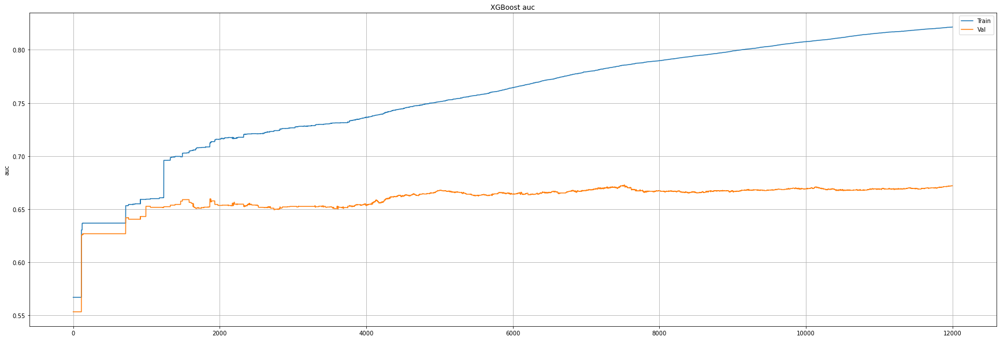

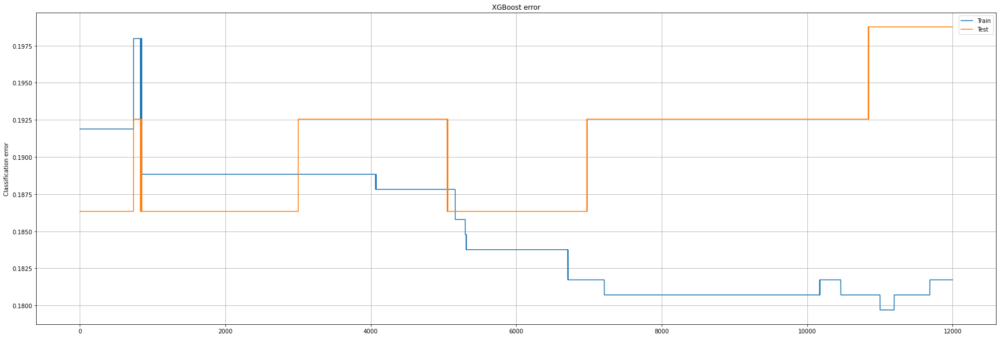

In [97]:
#plot error and roc auc in function for n_estimators
# function taken from machinelearningmastery blog

def plot_validation_curve_error_roc_auc(X_train, X_val, classifier):

    scaler.fit_transform(X_train)
    scaler.transform(X_val)
    pca.fit_transform(X_train)
    pca.transform(X_val)

    eval_set = [(X_train, y_train), (X_val, y_val)]

    classifier.fit(X_train, y_train, eval_metric=['auc', 'error'], eval_set=eval_set)
    # make predictions for test data
    y_pred = classifier.predict(X_val)
    predictions = [round(value) for value in y_pred]
    # evaluate predictions
    roc_auc = roc_auc_score(y_val, predictions)
    print("roc_auc: %.2f%%" % (roc_auc * 100.0))
    # retrieve performance metrics
    results = classifier.evals_result()
    epochs = len(results['validation_0']['error'])
    x_axis = range(0, epochs)

    # plot log loss
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['auc'], label='Train')
    ax.plot(x_axis, results['validation_1']['auc'], label='Val')
    ax.legend()
    plt.ylabel('auc')
    plt.title('XGBoost auc')
    plt.grid(True)
    plt.show()

    # plot classification error
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['error'], label='Train')
    ax.plot(x_axis, results['validation_1']['error'], label='Test')
    ax.legend()
    plt.ylabel('Classification error')
    plt.title('XGBoost error')
    plt.grid(True)
    plt.show()
    

plot_validation_curve_error_roc_auc(X_train, X_val, XGBClassifier(
learning_rate=0.001, max_depth=2, max_features=5,
                               n_estimators=12000, verbosity=0))



C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


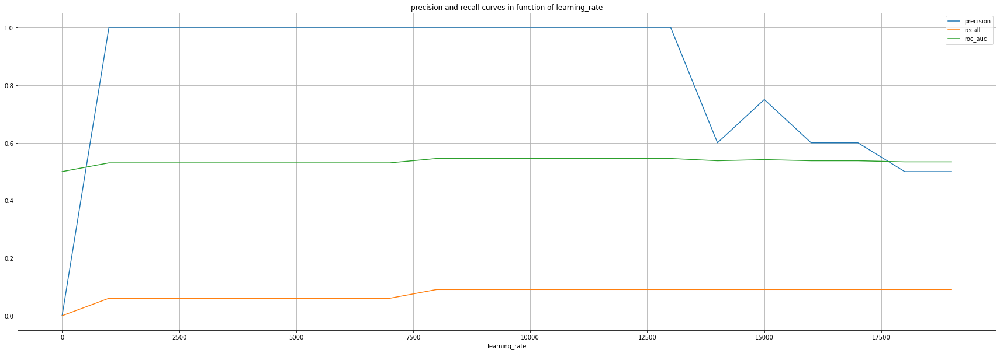

In [99]:
#Plotting recall and precision for n_estimators from 0 to 20000 for ;
# precision is below 1,so we discart option of more than 10000 estimators for learning rate of 10000

precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(0,20000,1000)]

for i in np.arange(0,20000,1000):
    classifier = XGBClassifier(learning_rate=0.001, max_depth=2, max_features=5, verbosity = 0, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


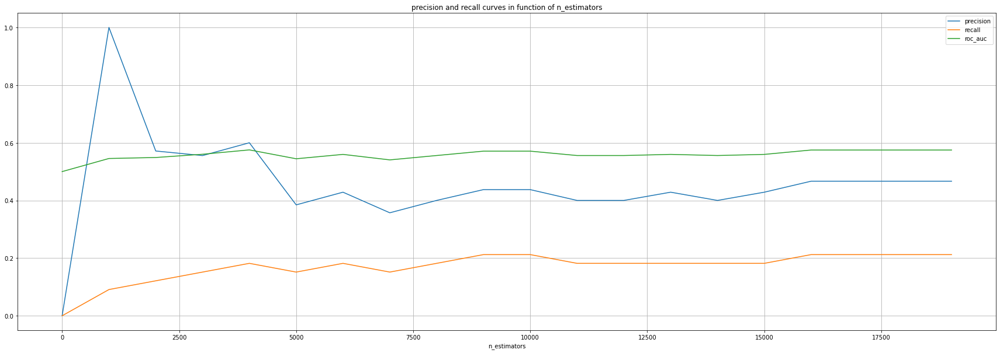

In [100]:
# We discart learning rate of 0.0001, as it makes the precision to low

precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(0,20000,1000)]

for i in np.arange(0,20000,1000):
    classifier = XGBClassifier(learning_rate=0.0001, max_depth=2, max_features=5, verbosity = 0, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


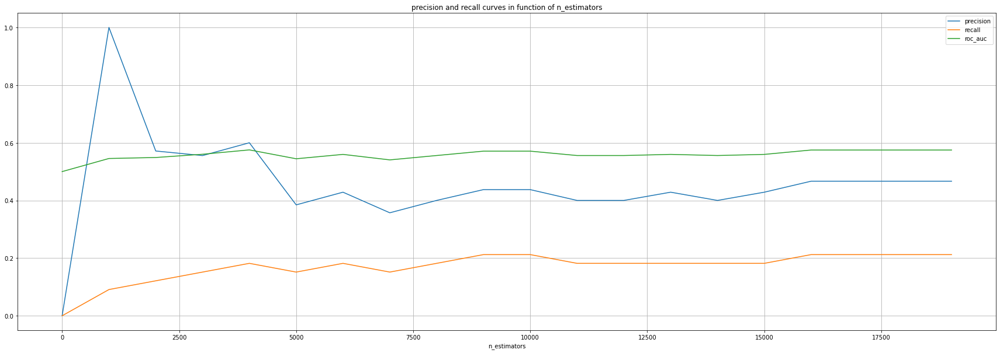

In [102]:
# As n_estimators in Gridsearch is very limited, 
# we will plot validation curves for a wide range of n_estimators to find optimal value

precision_bag = []
recall_bag = []
roc_auc_bag = []
ticks = [j for j in np.arange(0,20000,1000)]

for i in np.arange(0,20000,1000):
    classifier = XGBClassifier(learning_rate=0.01, max_depth=2, max_features=5, verbosity = 0, n_estimators=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'n_estimators')

In [103]:
# Evaluation on validation set  with chosen hyperparameters 

classifier = XGBClassifier(learning_rate=0.001, max_depth=2, max_features=5, verbosity = 0, n_estimators=8500)

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
precision_model_comparison = precision_model_comparison.append({'classifier':classifier,'recall':recall,
                                                                'roc_auc': roc_auc,
                                                                'precision':precision}, ignore_index=True)
precision_model_comparison

,classifier,recall,roc_auc,precision
0,"(LogisticRegression(random_state=148441733), L...",0.121212,0.560606,1.0
1,"XGBClassifier(base_score=None, booster=None, c...",0.090909,0.545455,1.0


In [151]:
#Our best precision oriented model is AdaBoost with base estimator Logistic Regression ; 
# We will save the model with use of pickle in order to be able to use it as a helper model in another notebooks 
#  applied to the same dataset

classifier = AdaBoostClassifier(base_estimator=LogisticRegression(),
                                    learning_rate=0.001, n_estimators=17000)
model_precision_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])
model_precision_oriented.fit(X_train, y_train)
pickle.dump(model_precision_oriented, open('model_precision_oriented.pkl', 'wb'))
precision_oriented_model = pickle.load(open('model_precision_oriented.pkl', 'rb'))
y_pred=precision_oriented_model.predict(X_test)
result_precision = classification_report(y_test, y_pred)
print(result)
recall_pom = recall_score(y_test, y_pred)
precision_pom = precision_score(y_test, y_pred)
roc_auc_pom = roc_auc_score(y_test, y_pred)


              precision    recall  f1-score   support

           0       0.85      0.58      0.69       125
           1       0.27      0.59      0.37        32

    accuracy                           0.59       157
   macro avg       0.56      0.59      0.53       157
weighted avg       0.73      0.59      0.63       157



In [107]:
# Now we will develop another model that will be roc_auc oriented;


classifiers = [RandomForestClassifier(),
               DecisionTreeClassifier(),
               AdaBoostClassifier(),
               GradientBoostingClassifier(),
               ExtraTreesClassifier(),
    LogisticRegression(),
    XGBClassifier(),
    KNeighborsClassifier(),
    GaussianNB(),
    BernoulliNB(),
    SVC(), 
               RandomForestClassifier(class_weight="balanced"),
               DecisionTreeClassifier(class_weight="balanced"),
               ExtraTreesClassifier(class_weight="balanced"),
    LogisticRegression(class_weight="balanced"),
    XGBClassifier(class_weight="balanced"),
    SVC(class_weight="balanced")
              ]

first_comparison_by_roc_auc = compare_models(classifiers, X_train, y_train, 'roc_auc')
first_comparison_by_roc_auc

features used: Index(['avg_course_day', 'work_hours', 'mean_steps', 'weekday_sin',
       'weekday_cos', 'part_of_month_2', 'part_of_month_3', 'q_sin', 'q_cos',
       'month_sin', 'month_cos', 'wok_sin', 'wok_cos', 'job_2', 'job_3', 'R',
       'learningDS', 'homeoffice', 'Netflix', 'journey', 'holiday', 'covid',
       'dbscan_0', 'dbscan_1', 'dbscan_2', 'dbscan_3', 'dbscan_4', 'dbscan_5'],
      dtype='object')


,name,recall,roc_auc,precision,accuracy
16,SVC(class_weight='balanced'),0.573451,0.685124,0.316466,0.654822
15,"XGBClassifier(base_score=None, booster=None, c...",0.228427,0.680050,0.366931,0.758071
11,RandomForestClassifier(class_weight='balanced'),0.154939,0.679217,0.418700,0.778985
0,RandomForestClassifier(),0.172488,0.678273,0.400736,0.774112
6,"XGBClassifier(base_score=None, booster=None, c...",0.227000,0.674958,0.370749,0.757665
4,ExtraTreesClassifier(),0.222146,0.674120,0.386132,0.764467
13,ExtraTreesClassifier(class_weight='balanced'),0.208829,0.673962,0.375098,0.763452
10,SVC(),0.052939,0.668373,0.599206,0.795533
3,GradientBoostingClassifier(),0.157378,0.666076,0.383310,0.772690
7,KNeighborsClassifier(),0.183768,0.653213,0.373443,0.766091


In [109]:
# default params are:(*, C=1.0, kernel='rbf', gamma='scale', class_weight=None)
# we will also try clfularization parameters in our gridsearch to avoid overfitting; 

classifier = SVC(class_weight='balanced')

model = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

parameters = { 
#     'classifier__C': [0.0001, 0.001, 0.01, 0.01, 0.5,1],
              'classifier__kernel':['rbf','sigmoid', 'gaussian', 'linear', 'polynomial'],
    'classifier__gamma':[100, 10, 1, 0.1, 0.01, 0.001, 0.0001, 0.00001],
    'classifier__degree':[1,2,3]
}

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model,parameters, verbose=0,scoring=scoring,n_jobs=-1, cv=cv, refit='roc_auc', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
recall = clf.cv_results_['mean_train_recall'][best_index]
precision = clf.cv_results_['mean_train_precision'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print('\n The best roc_auc score across ALL searched params:\n',clf.best_score_)
print(f'recall is: {recall}')
print(f'precision is: {precision}')



Results from Grid Search

 The best estimator across ALL searched params: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('classifier',
                 SVC(class_weight='balanced', degree=1, gamma=0.1))])
-----------------------------------------------------------

 The best roc_auc score across ALL searched params:
 0.6792758079957084
recall is: 0.9142126789366053
precision is: 0.5438237419866756


C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
720 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
360 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\Olga\anaconda3\lib\site-packages\sklearn\svm\_base.py", line 251, in fit
    fit(X, y, sample_weight, solver_type, kernel, random_seed=seed)


In [ ]:
# Tuning C with validation curves
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = [0.000001,0.000005, 0.00001, 0.00005, 0.0001,0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5,1]
ticks = [np.log(j) for j in list_to_check]

for i in list_to_check:
    classifier = SVC(C=i, class_weight='balanced', degree=1, gamma=0.1)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'C') 

C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Olga\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is i

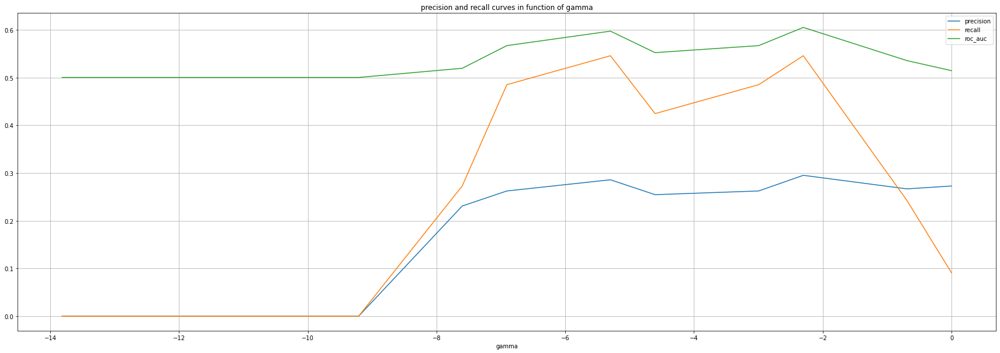

In [120]:
# Tuning gamma with validation curves
precision_bag = []
recall_bag = []
roc_auc_bag = []
list_to_check = [0.000001,0.000005, 0.00001, 0.00005, 0.0001,0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5,1]
ticks = [np.log(j) for j in list_to_check]

for i in list_to_check:
    classifier = SVC(C=0.5, class_weight='balanced', degree=1, gamma=i)
    precision_point, recall_point, roc_auc_point = add_precision_recall_point(X_train, y_train, X_val, y_val)
    precision_bag.append(precision_point)
    recall_bag.append(recall_point)
    roc_auc_bag.append(roc_auc_point)

plot_precision_and_recall(precision_bag, recall_bag, roc_auc_bag, ticks, 'gamma') 

In [122]:
# Our best params for SVC are: classifier = SVC(C=0.5, class_weight='balanced', degree=1, gamma=0.005)

roc_auc_model_comparison = pd.DataFrame(columns=['classifier', 'recall', 'roc_auc', 'precision'])

classifier = SVC(C=0.5, class_weight='balanced', degree=1, gamma=0.005)

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
roc_auc_model_comparison = roc_auc_model_comparison.append({'classifier':classifier,'recall':recall,
                                                                'roc_auc': roc_auc,
                                                                'precision':precision}, ignore_index=True)
roc_auc_model_comparison

,classifier,recall,roc_auc,precision
0,"SVC(C=0.5, class_weight='balanced', degree=1, ...",0.545455,0.596946,0.285714


In [125]:
# We will check if we can tune XGBoost to have better performance than SVC
# default:
# (n_estimators=1000, min_samples_split=2, max_features=None)
# we will grid search also for some hyperparameters that help with overfitting(max_depth, min_samples_split)

classifier = XGBClassifier(class_weight='balanced')

model_roc_auc_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

parameters = { 
#     'classifier__subsample': [0.5, 0.75,1],
    'classifier__max_features': [2,'sqrt'],
              'classifier__max_depth':[2,3,5],
#               'classifier__min_samples_split':[2, 15, 25],
              'classifier__n_estimators':[100,1000,10000],
    'classifier__learning_rate':[0.0001,0.01, 0.1, 1],
              
             }

scoring = {'recall':'recall','roc_auc':'roc_auc','precision': 'precision'}
clf = GridSearchCV(model_roc_auc_oriented,parameters, verbose=5,scoring=scoring,n_jobs=-1, cv=cv, refit='roc_auc', return_train_score=True)
clf.fit(X_train,y_train)
results = clf.cv_results_
best_index = clf.best_index_
best_estimator = clf.best_estimator_
roc_auc = clf.cv_results_['mean_train_roc_auc'][best_index]
recall = clf.cv_results_['mean_train_recall'][best_index]
print("Results from Grid Search" )
print(f'\n The best estimator across ALL searched params: {best_estimator}')
print('-----------------------------------------------------------')
print("\n The best roc_auc score across ALL searched params:\n",clf.best_score_)
print(f'recall is: {recall}')
print(f'precision is: {precision}')

#  Grid search best estimator is: XGBClassifier(class_weight='balanced', learning_rate=0.01, 
# max_depth=5, max_features=2, n_estimators=1000)
# The best roc_auc score across ALL searched params:
#  0.6779197952807554
# recall is: 0.9583370741682877
# precision is: 0.2857142857142857

Fitting 15 folds for each of 72 candidates, totalling 1080 fits
[12:40:32] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight", "max_features" } are not used.

Results from Grid Search

 The best estimator across ALL searched params: Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               class_weight='balanced', colsample_bylevel=None,
                               colsample_bynode=None, colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                  

[13:55:30] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight", "max_features" } are not used.

[0]	validation_0-auc:0.63651	validation_0-error:0.17970	validation_1-auc:0.59659	validation_1-error:0.19255
[1]	validation_0-auc:0.63648	validation_0-error:0.17970	validation_1-auc:0.59659	validation_1-error:0.19255
[2]	validation_0-auc:0.65591	validation_0-error:0.18071	validation_1-auc:0.56143	validation_1-error:0.19255
[3]	validation_0-auc:0.65591	validation_0-error:0.18071	validation_1-auc:0.56143	validation_1-error:0.19255
[4]	validation_0-auc:0.67215	validation_0-error:0.18071	validation_1-auc:0.55066	validation_1-error:0.19255
[5]	validation_0-auc:0.67057	validation_0-error:0.18071	validation_1-auc:0.54877	validation_1-error:0.19255
[6]	validation_0-auc:0.67076	validation_0-error:0.18071	validation_1-auc:0.54901	validation_1-error:0.19255
[7]	validation_0-auc:0.671

[74]	validation_0-auc:0.78899	validation_0-error:0.17665	validation_1-auc:0.59825	validation_1-error:0.19255
[75]	validation_0-auc:0.79060	validation_0-error:0.17665	validation_1-auc:0.59635	validation_1-error:0.19255


C:\Users\Olga\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[76]	validation_0-auc:0.79344	validation_0-error:0.17665	validation_1-auc:0.60002	validation_1-error:0.19255
[77]	validation_0-auc:0.79372	validation_0-error:0.17665	validation_1-auc:0.59860	validation_1-error:0.19255
[78]	validation_0-auc:0.79311	validation_0-error:0.17665	validation_1-auc:0.60002	validation_1-error:0.19255
[79]	validation_0-auc:0.79452	validation_0-error:0.17665	validation_1-auc:0.59825	validation_1-error:0.19255
[80]	validation_0-auc:0.79536	validation_0-error:0.17665	validation_1-auc:0.59777	validation_1-error:0.19255
[81]	validation_0-auc:0.79637	validation_0-error:0.17665	validation_1-auc:0.60109	validation_1-error:0.19255
[82]	validation_0-auc:0.79662	validation_0-error:0.17665	validation_1-auc:0.60014	validation_1-error:0.19255
[83]	validation_0-auc:0.79804	validation_0-error:0.17766	validation_1-auc:0.60227	validation_1-error:0.18634
[84]	validation_0-auc:0.79907	validation_0-error:0.17665	validation_1-auc:0.60275	validation_1-error:0.19255
[85]	validation_0-a

[151]	validation_0-auc:0.82429	validation_0-error:0.17563	validation_1-auc:0.59387	validation_1-error:0.18634
[152]	validation_0-auc:0.82505	validation_0-error:0.17462	validation_1-auc:0.59339	validation_1-error:0.18634
[153]	validation_0-auc:0.82516	validation_0-error:0.17563	validation_1-auc:0.59245	validation_1-error:0.18634
[154]	validation_0-auc:0.82542	validation_0-error:0.17563	validation_1-auc:0.59245	validation_1-error:0.18634
[155]	validation_0-auc:0.82576	validation_0-error:0.17563	validation_1-auc:0.59055	validation_1-error:0.18634
[156]	validation_0-auc:0.82660	validation_0-error:0.17563	validation_1-auc:0.59032	validation_1-error:0.18634
[157]	validation_0-auc:0.82661	validation_0-error:0.17563	validation_1-auc:0.58984	validation_1-error:0.18634
[158]	validation_0-auc:0.82689	validation_0-error:0.17563	validation_1-auc:0.58890	validation_1-error:0.18634
[159]	validation_0-auc:0.82706	validation_0-error:0.17563	validation_1-auc:0.58937	validation_1-error:0.18634
[160]	vali

[226]	validation_0-auc:0.86161	validation_0-error:0.17056	validation_1-auc:0.60831	validation_1-error:0.18012
[227]	validation_0-auc:0.86245	validation_0-error:0.17056	validation_1-auc:0.61020	validation_1-error:0.18012
[228]	validation_0-auc:0.86262	validation_0-error:0.17056	validation_1-auc:0.61020	validation_1-error:0.18012
[229]	validation_0-auc:0.86331	validation_0-error:0.17056	validation_1-auc:0.60997	validation_1-error:0.18012
[230]	validation_0-auc:0.86339	validation_0-error:0.17056	validation_1-auc:0.60997	validation_1-error:0.18634
[231]	validation_0-auc:0.86419	validation_0-error:0.17056	validation_1-auc:0.61044	validation_1-error:0.18634
[232]	validation_0-auc:0.86493	validation_0-error:0.17056	validation_1-auc:0.60997	validation_1-error:0.18634
[233]	validation_0-auc:0.86495	validation_0-error:0.17056	validation_1-auc:0.60997	validation_1-error:0.18634
[234]	validation_0-auc:0.86549	validation_0-error:0.17056	validation_1-auc:0.61115	validation_1-error:0.18634
[235]	vali

[301]	validation_0-auc:0.88583	validation_0-error:0.16751	validation_1-auc:0.62654	validation_1-error:0.18634
[302]	validation_0-auc:0.88613	validation_0-error:0.16751	validation_1-auc:0.62630	validation_1-error:0.19255
[303]	validation_0-auc:0.88694	validation_0-error:0.16751	validation_1-auc:0.62749	validation_1-error:0.19255
[304]	validation_0-auc:0.88737	validation_0-error:0.16751	validation_1-auc:0.62796	validation_1-error:0.19255
[305]	validation_0-auc:0.88777	validation_0-error:0.16751	validation_1-auc:0.62843	validation_1-error:0.19255
[306]	validation_0-auc:0.88820	validation_0-error:0.16751	validation_1-auc:0.62796	validation_1-error:0.19255
[307]	validation_0-auc:0.88831	validation_0-error:0.16751	validation_1-auc:0.62772	validation_1-error:0.19255
[308]	validation_0-auc:0.88882	validation_0-error:0.16751	validation_1-auc:0.62749	validation_1-error:0.19255
[309]	validation_0-auc:0.88887	validation_0-error:0.16751	validation_1-auc:0.62772	validation_1-error:0.18634
[310]	vali

[376]	validation_0-auc:0.90583	validation_0-error:0.16650	validation_1-auc:0.64323	validation_1-error:0.19255
[377]	validation_0-auc:0.90605	validation_0-error:0.16650	validation_1-auc:0.64489	validation_1-error:0.19255
[378]	validation_0-auc:0.90629	validation_0-error:0.16548	validation_1-auc:0.64465	validation_1-error:0.19255
[379]	validation_0-auc:0.90650	validation_0-error:0.16548	validation_1-auc:0.64465	validation_1-error:0.19255
[380]	validation_0-auc:0.90671	validation_0-error:0.16548	validation_1-auc:0.64465	validation_1-error:0.19255
[381]	validation_0-auc:0.90675	validation_0-error:0.16548	validation_1-auc:0.64418	validation_1-error:0.19255
[382]	validation_0-auc:0.90695	validation_0-error:0.16548	validation_1-auc:0.64512	validation_1-error:0.19255
[383]	validation_0-auc:0.90726	validation_0-error:0.16548	validation_1-auc:0.64489	validation_1-error:0.19255
[384]	validation_0-auc:0.90764	validation_0-error:0.16548	validation_1-auc:0.64583	validation_1-error:0.19255
[385]	vali

[451]	validation_0-auc:0.91752	validation_0-error:0.16244	validation_1-auc:0.65720	validation_1-error:0.19255
[452]	validation_0-auc:0.91761	validation_0-error:0.16244	validation_1-auc:0.65720	validation_1-error:0.19255
[453]	validation_0-auc:0.91776	validation_0-error:0.16244	validation_1-auc:0.65720	validation_1-error:0.19255
[454]	validation_0-auc:0.91779	validation_0-error:0.16244	validation_1-auc:0.65720	validation_1-error:0.19255
[455]	validation_0-auc:0.91799	validation_0-error:0.16244	validation_1-auc:0.65672	validation_1-error:0.19255
[456]	validation_0-auc:0.91806	validation_0-error:0.16244	validation_1-auc:0.65767	validation_1-error:0.19255
[457]	validation_0-auc:0.91828	validation_0-error:0.16244	validation_1-auc:0.65743	validation_1-error:0.19255
[458]	validation_0-auc:0.91832	validation_0-error:0.16244	validation_1-auc:0.65862	validation_1-error:0.19255
[459]	validation_0-auc:0.91844	validation_0-error:0.16244	validation_1-auc:0.65814	validation_1-error:0.19255
[460]	vali

[526]	validation_0-auc:0.92558	validation_0-error:0.15635	validation_1-auc:0.66832	validation_1-error:0.18634
[527]	validation_0-auc:0.92565	validation_0-error:0.15635	validation_1-auc:0.66832	validation_1-error:0.18634
[528]	validation_0-auc:0.92569	validation_0-error:0.15635	validation_1-auc:0.66856	validation_1-error:0.18634
[529]	validation_0-auc:0.92581	validation_0-error:0.15635	validation_1-auc:0.66785	validation_1-error:0.18634
[530]	validation_0-auc:0.92583	validation_0-error:0.15635	validation_1-auc:0.66832	validation_1-error:0.18634
[531]	validation_0-auc:0.92608	validation_0-error:0.15635	validation_1-auc:0.66809	validation_1-error:0.18634
[532]	validation_0-auc:0.92649	validation_0-error:0.15635	validation_1-auc:0.66903	validation_1-error:0.18634
[533]	validation_0-auc:0.92645	validation_0-error:0.15635	validation_1-auc:0.66951	validation_1-error:0.18634
[534]	validation_0-auc:0.92644	validation_0-error:0.15635	validation_1-auc:0.66927	validation_1-error:0.18634
[535]	vali

[601]	validation_0-auc:0.93576	validation_0-error:0.15025	validation_1-auc:0.67661	validation_1-error:0.19876
[602]	validation_0-auc:0.93584	validation_0-error:0.15025	validation_1-auc:0.67590	validation_1-error:0.19876
[603]	validation_0-auc:0.93611	validation_0-error:0.15025	validation_1-auc:0.67590	validation_1-error:0.19876
[604]	validation_0-auc:0.93650	validation_0-error:0.14822	validation_1-auc:0.67495	validation_1-error:0.20497
[605]	validation_0-auc:0.93664	validation_0-error:0.14924	validation_1-auc:0.67543	validation_1-error:0.20497
[606]	validation_0-auc:0.93664	validation_0-error:0.14924	validation_1-auc:0.67566	validation_1-error:0.20497
[607]	validation_0-auc:0.93677	validation_0-error:0.14822	validation_1-auc:0.67519	validation_1-error:0.20497
[608]	validation_0-auc:0.93684	validation_0-error:0.14822	validation_1-auc:0.67495	validation_1-error:0.20497
[609]	validation_0-auc:0.93700	validation_0-error:0.14822	validation_1-auc:0.67590	validation_1-error:0.19876
[610]	vali

[676]	validation_0-auc:0.94186	validation_0-error:0.14619	validation_1-auc:0.68134	validation_1-error:0.20497
[677]	validation_0-auc:0.94199	validation_0-error:0.14619	validation_1-auc:0.68134	validation_1-error:0.20497
[678]	validation_0-auc:0.94202	validation_0-error:0.14619	validation_1-auc:0.68182	validation_1-error:0.20497
[679]	validation_0-auc:0.94212	validation_0-error:0.14619	validation_1-auc:0.68158	validation_1-error:0.20497
[680]	validation_0-auc:0.94224	validation_0-error:0.14619	validation_1-auc:0.68182	validation_1-error:0.20497
[681]	validation_0-auc:0.94227	validation_0-error:0.14619	validation_1-auc:0.68182	validation_1-error:0.20497
[682]	validation_0-auc:0.94230	validation_0-error:0.14619	validation_1-auc:0.68134	validation_1-error:0.20497
[683]	validation_0-auc:0.94241	validation_0-error:0.14619	validation_1-auc:0.68229	validation_1-error:0.20497
[684]	validation_0-auc:0.94243	validation_0-error:0.14518	validation_1-auc:0.68205	validation_1-error:0.20497
[685]	vali

[751]	validation_0-auc:0.94721	validation_0-error:0.13706	validation_1-auc:0.68371	validation_1-error:0.20497
[752]	validation_0-auc:0.94736	validation_0-error:0.13604	validation_1-auc:0.68300	validation_1-error:0.21118
[753]	validation_0-auc:0.94743	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.21118
[754]	validation_0-auc:0.94749	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.21118
[755]	validation_0-auc:0.94754	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.21118
[756]	validation_0-auc:0.94755	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.21118
[757]	validation_0-auc:0.94755	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.20497
[758]	validation_0-auc:0.94757	validation_0-error:0.13604	validation_1-auc:0.68419	validation_1-error:0.21118
[759]	validation_0-auc:0.94762	validation_0-error:0.13604	validation_1-auc:0.68371	validation_1-error:0.20497
[760]	vali

[826]	validation_0-auc:0.95074	validation_0-error:0.13096	validation_1-auc:0.68300	validation_1-error:0.21118
[827]	validation_0-auc:0.95085	validation_0-error:0.12995	validation_1-auc:0.68324	validation_1-error:0.21118
[828]	validation_0-auc:0.95088	validation_0-error:0.12995	validation_1-auc:0.68277	validation_1-error:0.21118
[829]	validation_0-auc:0.95090	validation_0-error:0.12995	validation_1-auc:0.68300	validation_1-error:0.21118
[830]	validation_0-auc:0.95091	validation_0-error:0.12995	validation_1-auc:0.68277	validation_1-error:0.21118
[831]	validation_0-auc:0.95098	validation_0-error:0.12995	validation_1-auc:0.68253	validation_1-error:0.21118
[832]	validation_0-auc:0.95108	validation_0-error:0.12893	validation_1-auc:0.68277	validation_1-error:0.21118
[833]	validation_0-auc:0.95113	validation_0-error:0.12893	validation_1-auc:0.68277	validation_1-error:0.21118
[834]	validation_0-auc:0.95120	validation_0-error:0.12893	validation_1-auc:0.68300	validation_1-error:0.21118
[835]	vali

[901]	validation_0-auc:0.95402	validation_0-error:0.12792	validation_1-auc:0.68442	validation_1-error:0.21118
[902]	validation_0-auc:0.95410	validation_0-error:0.12690	validation_1-auc:0.68490	validation_1-error:0.21118
[903]	validation_0-auc:0.95410	validation_0-error:0.12690	validation_1-auc:0.68490	validation_1-error:0.21118
[904]	validation_0-auc:0.95418	validation_0-error:0.12690	validation_1-auc:0.68490	validation_1-error:0.21118
[905]	validation_0-auc:0.95420	validation_0-error:0.12690	validation_1-auc:0.68513	validation_1-error:0.21118
[906]	validation_0-auc:0.95421	validation_0-error:0.12690	validation_1-auc:0.68490	validation_1-error:0.20497
[907]	validation_0-auc:0.95426	validation_0-error:0.12589	validation_1-auc:0.68466	validation_1-error:0.21118
[908]	validation_0-auc:0.95428	validation_0-error:0.12487	validation_1-auc:0.68490	validation_1-error:0.21118
[909]	validation_0-auc:0.95431	validation_0-error:0.12589	validation_1-auc:0.68490	validation_1-error:0.21118
[910]	vali

[976]	validation_0-auc:0.95759	validation_0-error:0.12183	validation_1-auc:0.68466	validation_1-error:0.19876
[977]	validation_0-auc:0.95766	validation_0-error:0.12183	validation_1-auc:0.68537	validation_1-error:0.19876
[978]	validation_0-auc:0.95764	validation_0-error:0.12183	validation_1-auc:0.68513	validation_1-error:0.19876
[979]	validation_0-auc:0.95767	validation_0-error:0.12183	validation_1-auc:0.68513	validation_1-error:0.19876
[980]	validation_0-auc:0.95769	validation_0-error:0.12183	validation_1-auc:0.68490	validation_1-error:0.19876
[981]	validation_0-auc:0.95772	validation_0-error:0.12183	validation_1-auc:0.68490	validation_1-error:0.19876
[982]	validation_0-auc:0.95772	validation_0-error:0.12081	validation_1-auc:0.68466	validation_1-error:0.19876
[983]	validation_0-auc:0.95776	validation_0-error:0.12081	validation_1-auc:0.68442	validation_1-error:0.19876
[984]	validation_0-auc:0.95777	validation_0-error:0.12081	validation_1-auc:0.68419	validation_1-error:0.19876
[985]	vali

[1051]	validation_0-auc:0.96104	validation_0-error:0.11574	validation_1-auc:0.69105	validation_1-error:0.21118
[1052]	validation_0-auc:0.96104	validation_0-error:0.11574	validation_1-auc:0.69081	validation_1-error:0.20497
[1053]	validation_0-auc:0.96106	validation_0-error:0.11574	validation_1-auc:0.69034	validation_1-error:0.21118
[1054]	validation_0-auc:0.96108	validation_0-error:0.11574	validation_1-auc:0.69034	validation_1-error:0.20497
[1055]	validation_0-auc:0.96111	validation_0-error:0.11574	validation_1-auc:0.69034	validation_1-error:0.20497
[1056]	validation_0-auc:0.96120	validation_0-error:0.11574	validation_1-auc:0.69034	validation_1-error:0.21118
[1057]	validation_0-auc:0.96120	validation_0-error:0.11574	validation_1-auc:0.69058	validation_1-error:0.20497
[1058]	validation_0-auc:0.96128	validation_0-error:0.11574	validation_1-auc:0.69081	validation_1-error:0.21118
[1059]	validation_0-auc:0.96135	validation_0-error:0.11574	validation_1-auc:0.69058	validation_1-error:0.21118
[

[1125]	validation_0-auc:0.96282	validation_0-error:0.10964	validation_1-auc:0.69271	validation_1-error:0.20497
[1126]	validation_0-auc:0.96289	validation_0-error:0.10964	validation_1-auc:0.69342	validation_1-error:0.20497
[1127]	validation_0-auc:0.96290	validation_0-error:0.10964	validation_1-auc:0.69366	validation_1-error:0.20497
[1128]	validation_0-auc:0.96293	validation_0-error:0.10964	validation_1-auc:0.69342	validation_1-error:0.20497
[1129]	validation_0-auc:0.96298	validation_0-error:0.10964	validation_1-auc:0.69366	validation_1-error:0.20497
[1130]	validation_0-auc:0.96303	validation_0-error:0.10964	validation_1-auc:0.69342	validation_1-error:0.20497
[1131]	validation_0-auc:0.96301	validation_0-error:0.10964	validation_1-auc:0.69342	validation_1-error:0.20497
[1132]	validation_0-auc:0.96305	validation_0-error:0.10964	validation_1-auc:0.69342	validation_1-error:0.20497
[1133]	validation_0-auc:0.96303	validation_0-error:0.10964	validation_1-auc:0.69366	validation_1-error:0.20497
[

[1199]	validation_0-auc:0.96497	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1200]	validation_0-auc:0.96503	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1201]	validation_0-auc:0.96504	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1202]	validation_0-auc:0.96506	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1203]	validation_0-auc:0.96510	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1204]	validation_0-auc:0.96511	validation_0-error:0.10558	validation_1-auc:0.69697	validation_1-error:0.20497
[1205]	validation_0-auc:0.96516	validation_0-error:0.10558	validation_1-auc:0.69697	validation_1-error:0.20497
[1206]	validation_0-auc:0.96516	validation_0-error:0.10558	validation_1-auc:0.69673	validation_1-error:0.20497
[1207]	validation_0-auc:0.96519	validation_0-error:0.10558	validation_1-auc:0.69650	validation_1-error:0.20497
[

[1273]	validation_0-auc:0.96716	validation_0-error:0.10152	validation_1-auc:0.69460	validation_1-error:0.19876
[1274]	validation_0-auc:0.96724	validation_0-error:0.10254	validation_1-auc:0.69437	validation_1-error:0.20497
[1275]	validation_0-auc:0.96725	validation_0-error:0.10152	validation_1-auc:0.69389	validation_1-error:0.20497
[1276]	validation_0-auc:0.96726	validation_0-error:0.10152	validation_1-auc:0.69389	validation_1-error:0.20497
[1277]	validation_0-auc:0.96730	validation_0-error:0.10152	validation_1-auc:0.69413	validation_1-error:0.20497
[1278]	validation_0-auc:0.96731	validation_0-error:0.10152	validation_1-auc:0.69413	validation_1-error:0.20497
[1279]	validation_0-auc:0.96732	validation_0-error:0.10152	validation_1-auc:0.69437	validation_1-error:0.20497
[1280]	validation_0-auc:0.96734	validation_0-error:0.10152	validation_1-auc:0.69484	validation_1-error:0.20497
[1281]	validation_0-auc:0.96749	validation_0-error:0.10152	validation_1-auc:0.69437	validation_1-error:0.20497
[

[1347]	validation_0-auc:0.97003	validation_0-error:0.09746	validation_1-auc:0.68987	validation_1-error:0.20497
[1348]	validation_0-auc:0.97003	validation_0-error:0.09746	validation_1-auc:0.69058	validation_1-error:0.20497
[1349]	validation_0-auc:0.97008	validation_0-error:0.09746	validation_1-auc:0.69010	validation_1-error:0.20497
[1350]	validation_0-auc:0.97010	validation_0-error:0.09746	validation_1-auc:0.69010	validation_1-error:0.20497
[1351]	validation_0-auc:0.97009	validation_0-error:0.09746	validation_1-auc:0.69010	validation_1-error:0.20497
[1352]	validation_0-auc:0.97010	validation_0-error:0.09746	validation_1-auc:0.69010	validation_1-error:0.20497
[1353]	validation_0-auc:0.97014	validation_0-error:0.09746	validation_1-auc:0.69010	validation_1-error:0.20497
[1354]	validation_0-auc:0.97016	validation_0-error:0.09746	validation_1-auc:0.69034	validation_1-error:0.20497
[1355]	validation_0-auc:0.97026	validation_0-error:0.09645	validation_1-auc:0.69010	validation_1-error:0.20497
[

[1421]	validation_0-auc:0.97275	validation_0-error:0.09036	validation_1-auc:0.68845	validation_1-error:0.20497
[1422]	validation_0-auc:0.97284	validation_0-error:0.09036	validation_1-auc:0.68821	validation_1-error:0.20497
[1423]	validation_0-auc:0.97284	validation_0-error:0.09036	validation_1-auc:0.68821	validation_1-error:0.20497
[1424]	validation_0-auc:0.97286	validation_0-error:0.09036	validation_1-auc:0.68821	validation_1-error:0.19876
[1425]	validation_0-auc:0.97288	validation_0-error:0.09036	validation_1-auc:0.68916	validation_1-error:0.20497
[1426]	validation_0-auc:0.97295	validation_0-error:0.09036	validation_1-auc:0.68868	validation_1-error:0.20497
[1427]	validation_0-auc:0.97295	validation_0-error:0.08934	validation_1-auc:0.68916	validation_1-error:0.20497
[1428]	validation_0-auc:0.97304	validation_0-error:0.08832	validation_1-auc:0.68892	validation_1-error:0.20497
[1429]	validation_0-auc:0.97309	validation_0-error:0.08832	validation_1-auc:0.68868	validation_1-error:0.20497
[

[1495]	validation_0-auc:0.97498	validation_0-error:0.08528	validation_1-auc:0.68537	validation_1-error:0.21739
[1496]	validation_0-auc:0.97503	validation_0-error:0.08426	validation_1-auc:0.68537	validation_1-error:0.21739
[1497]	validation_0-auc:0.97511	validation_0-error:0.08325	validation_1-auc:0.68537	validation_1-error:0.21739
[1498]	validation_0-auc:0.97514	validation_0-error:0.08325	validation_1-auc:0.68561	validation_1-error:0.21739
[1499]	validation_0-auc:0.97519	validation_0-error:0.08325	validation_1-auc:0.68561	validation_1-error:0.21739
roc_auc: 53.72%


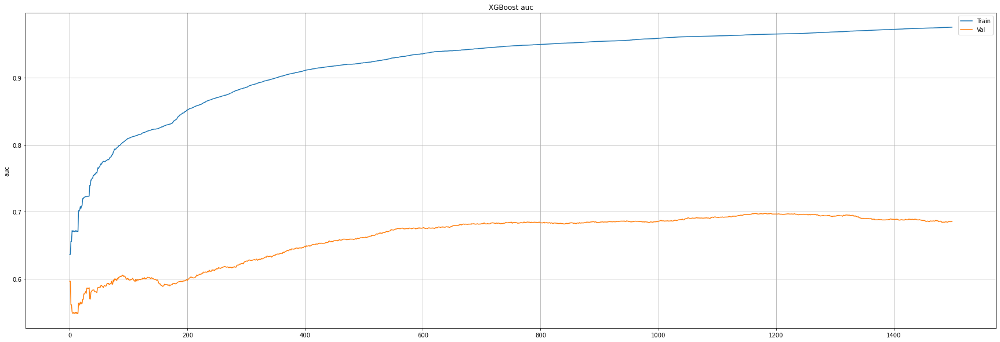

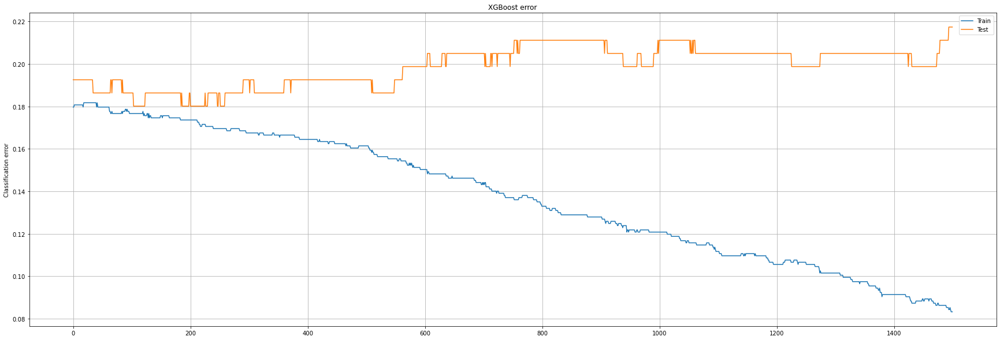

In [141]:
# Let's  plot a validation curve to find the best number of n_estimators
# Our best n_estimators is 1200
classifier = XGBClassifier(class_weight='balanced', learning_rate=0.01, max_depth=5, max_features=2, n_estimators=10000)
plot_validation_curve_error_roc_auc(X_train, X_val, classifier)

[13:49:46] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight", "max_features" } are not used.

[0]	validation_0-auc:0.63651	validation_0-error:0.17970	validation_1-auc:0.59659	validation_1-error:0.19255
[1]	validation_0-auc:0.63648	validation_0-error:0.17970	validation_1-auc:0.59659	validation_1-error:0.19255
[2]	validation_0-auc:0.63646	validation_0-error:0.18071	validation_1-auc:0.59659	validation_1-error:0.19255
[3]	validation_0-auc:0.63646	validation_0-error:0.18071	validation_1-auc:0.59659	validation_1-error:0.19255
[4]	validation_0-auc:0.65591	validation_0-error:0.18071	validation_1-auc:0.56143	validation_1-error:0.19255
[5]	validation_0-auc:0.65591	validation_0-error:0.18071	validation_1-auc:0.56143	validation_1-error:0.19255
[6]	validation_0-auc:0.65591	validation_0-error:0.18071	validation_1-auc:0.56143	validation_1-error:0.19255
[7]	validation_0-auc:0.655

[74]	validation_0-auc:0.75028	validation_0-error:0.18173	validation_1-auc:0.57955	validation_1-error:0.18634
[75]	validation_0-auc:0.75035	validation_0-error:0.18173	validation_1-auc:0.58026	validation_1-error:0.18634
[76]	validation_0-auc:0.75053	validation_0-error:0.18173	validation_1-auc:0.57955	validation_1-error:0.18634
[77]	validation_0-auc:0.75066	validation_0-error:0.18173	validation_1-auc:0.57978	validation_1-error:0.18634
[78]	validation_0-auc:0.75106	validation_0-error:0.18173	validation_1-auc:0.58073	validation_1-error:0.18634
[79]	validation_0-auc:0.75117	validation_0-error:0.18173	validation_1-auc:0.58120	validation_1-error:0.18634
[80]	validation_0-auc:0.75228	validation_0-error:0.18173	validation_1-auc:0.58097	validation_1-error:0.18634
[81]	validation_0-auc:0.75167	validation_0-error:0.18173	validation_1-auc:0.58097	validation_1-error:0.18634
[82]	validation_0-auc:0.75494	validation_0-error:0.17970	validation_1-auc:0.58215	validation_1-error:0.18634
[83]	validation_0-a

C:\Users\Olga\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-auc:0.76033	validation_0-error:0.17970	validation_1-auc:0.58037	validation_1-error:0.18634
[90]	validation_0-auc:0.76001	validation_0-error:0.17970	validation_1-auc:0.58179	validation_1-error:0.18634
[91]	validation_0-auc:0.75966	validation_0-error:0.17970	validation_1-auc:0.58179	validation_1-error:0.18634
[92]	validation_0-auc:0.76041	validation_0-error:0.17970	validation_1-auc:0.58274	validation_1-error:0.18634
[93]	validation_0-auc:0.76246	validation_0-error:0.17970	validation_1-auc:0.58535	validation_1-error:0.18634
[94]	validation_0-auc:0.76259	validation_0-error:0.17970	validation_1-auc:0.58558	validation_1-error:0.18634
[95]	validation_0-auc:0.76520	validation_0-error:0.17970	validation_1-auc:0.58606	validation_1-error:0.18634
[96]	validation_0-auc:0.76654	validation_0-error:0.17970	validation_1-auc:0.58393	validation_1-error:0.18634
[97]	validation_0-auc:0.76804	validation_0-error:0.17970	validation_1-auc:0.58606	validation_1-error:0.18634
[98]	validation_0-a

[164]	validation_0-auc:0.79654	validation_0-error:0.17665	validation_1-auc:0.60002	validation_1-error:0.19255
[165]	validation_0-auc:0.79759	validation_0-error:0.17665	validation_1-auc:0.60192	validation_1-error:0.19255
[166]	validation_0-auc:0.79723	validation_0-error:0.17665	validation_1-auc:0.60215	validation_1-error:0.19255
[167]	validation_0-auc:0.79767	validation_0-error:0.17665	validation_1-auc:0.60215	validation_1-error:0.19255
[168]	validation_0-auc:0.79834	validation_0-error:0.17665	validation_1-auc:0.60215	validation_1-error:0.19255
[169]	validation_0-auc:0.79834	validation_0-error:0.17665	validation_1-auc:0.60239	validation_1-error:0.19255
[170]	validation_0-auc:0.79910	validation_0-error:0.17665	validation_1-auc:0.60476	validation_1-error:0.19255
[171]	validation_0-auc:0.79946	validation_0-error:0.17665	validation_1-auc:0.60476	validation_1-error:0.19255
[172]	validation_0-auc:0.80002	validation_0-error:0.17665	validation_1-auc:0.60452	validation_1-error:0.19255
[173]	vali

[239]	validation_0-auc:0.81497	validation_0-error:0.17563	validation_1-auc:0.59635	validation_1-error:0.18012
[240]	validation_0-auc:0.81540	validation_0-error:0.17462	validation_1-auc:0.59706	validation_1-error:0.18012
[241]	validation_0-auc:0.81565	validation_0-error:0.17462	validation_1-auc:0.59754	validation_1-error:0.18012
[242]	validation_0-auc:0.81577	validation_0-error:0.17462	validation_1-auc:0.59706	validation_1-error:0.18012
[243]	validation_0-auc:0.81610	validation_0-error:0.17462	validation_1-auc:0.59635	validation_1-error:0.18012
[244]	validation_0-auc:0.81606	validation_0-error:0.17462	validation_1-auc:0.59683	validation_1-error:0.18012
[245]	validation_0-auc:0.81617	validation_0-error:0.17462	validation_1-auc:0.59683	validation_1-error:0.18012
[246]	validation_0-auc:0.81622	validation_0-error:0.17462	validation_1-auc:0.59659	validation_1-error:0.18012
[247]	validation_0-auc:0.81653	validation_0-error:0.17462	validation_1-auc:0.59659	validation_1-error:0.18012
[248]	vali

[314]	validation_0-auc:0.82528	validation_0-error:0.17563	validation_1-auc:0.58629	validation_1-error:0.18634
[315]	validation_0-auc:0.82555	validation_0-error:0.17563	validation_1-auc:0.58771	validation_1-error:0.18634
[316]	validation_0-auc:0.82548	validation_0-error:0.17563	validation_1-auc:0.58842	validation_1-error:0.18634
[317]	validation_0-auc:0.82561	validation_0-error:0.17563	validation_1-auc:0.58890	validation_1-error:0.18634
[318]	validation_0-auc:0.82574	validation_0-error:0.17563	validation_1-auc:0.58890	validation_1-error:0.18634
[319]	validation_0-auc:0.82621	validation_0-error:0.17563	validation_1-auc:0.58842	validation_1-error:0.18634
[320]	validation_0-auc:0.82602	validation_0-error:0.17563	validation_1-auc:0.58890	validation_1-error:0.18634
[321]	validation_0-auc:0.82612	validation_0-error:0.17563	validation_1-auc:0.58866	validation_1-error:0.18634
[322]	validation_0-auc:0.82638	validation_0-error:0.17563	validation_1-auc:0.58984	validation_1-error:0.18634
[323]	vali

[389]	validation_0-auc:0.84741	validation_0-error:0.17360	validation_1-auc:0.59671	validation_1-error:0.18634
[390]	validation_0-auc:0.84786	validation_0-error:0.17360	validation_1-auc:0.59695	validation_1-error:0.18634
[391]	validation_0-auc:0.84803	validation_0-error:0.17360	validation_1-auc:0.59695	validation_1-error:0.18634
[392]	validation_0-auc:0.84837	validation_0-error:0.17360	validation_1-auc:0.59718	validation_1-error:0.18634
[393]	validation_0-auc:0.84892	validation_0-error:0.17360	validation_1-auc:0.59718	validation_1-error:0.18634
[394]	validation_0-auc:0.84898	validation_0-error:0.17360	validation_1-auc:0.59718	validation_1-error:0.18634
[395]	validation_0-auc:0.84945	validation_0-error:0.17360	validation_1-auc:0.59742	validation_1-error:0.18634
[396]	validation_0-auc:0.84948	validation_0-error:0.17360	validation_1-auc:0.59718	validation_1-error:0.18634
[397]	validation_0-auc:0.84991	validation_0-error:0.17360	validation_1-auc:0.59789	validation_1-error:0.18634
[398]	vali

[464]	validation_0-auc:0.86254	validation_0-error:0.16954	validation_1-auc:0.60878	validation_1-error:0.18634
[465]	validation_0-auc:0.86280	validation_0-error:0.16954	validation_1-auc:0.60949	validation_1-error:0.18634
[466]	validation_0-auc:0.86287	validation_0-error:0.16954	validation_1-auc:0.60949	validation_1-error:0.18634
[467]	validation_0-auc:0.86284	validation_0-error:0.16954	validation_1-auc:0.60902	validation_1-error:0.18634
[468]	validation_0-auc:0.86304	validation_0-error:0.16954	validation_1-auc:0.61068	validation_1-error:0.18634
[469]	validation_0-auc:0.86319	validation_0-error:0.16954	validation_1-auc:0.61044	validation_1-error:0.18634
[470]	validation_0-auc:0.86321	validation_0-error:0.16954	validation_1-auc:0.61020	validation_1-error:0.18634
[471]	validation_0-auc:0.86339	validation_0-error:0.16954	validation_1-auc:0.61139	validation_1-error:0.18634
[472]	validation_0-auc:0.86350	validation_0-error:0.16954	validation_1-auc:0.61139	validation_1-error:0.18634
[473]	vali

[539]	validation_0-auc:0.87430	validation_0-error:0.16853	validation_1-auc:0.61589	validation_1-error:0.18634
[540]	validation_0-auc:0.87458	validation_0-error:0.16853	validation_1-auc:0.61589	validation_1-error:0.18634
[541]	validation_0-auc:0.87477	validation_0-error:0.16853	validation_1-auc:0.61612	validation_1-error:0.18634
[542]	validation_0-auc:0.87493	validation_0-error:0.16853	validation_1-auc:0.61731	validation_1-error:0.18634
[543]	validation_0-auc:0.87532	validation_0-error:0.16853	validation_1-auc:0.61731	validation_1-error:0.18634
[544]	validation_0-auc:0.87547	validation_0-error:0.16853	validation_1-auc:0.61707	validation_1-error:0.18634
[545]	validation_0-auc:0.87559	validation_0-error:0.16853	validation_1-auc:0.61778	validation_1-error:0.18634
[546]	validation_0-auc:0.87589	validation_0-error:0.16853	validation_1-auc:0.61707	validation_1-error:0.18634
[547]	validation_0-auc:0.87595	validation_0-error:0.16853	validation_1-auc:0.61683	validation_1-error:0.18634
[548]	vali

[614]	validation_0-auc:0.88612	validation_0-error:0.16751	validation_1-auc:0.62772	validation_1-error:0.18634
[615]	validation_0-auc:0.88633	validation_0-error:0.16751	validation_1-auc:0.62772	validation_1-error:0.18634
[616]	validation_0-auc:0.88640	validation_0-error:0.16751	validation_1-auc:0.62820	validation_1-error:0.18634
[617]	validation_0-auc:0.88665	validation_0-error:0.16751	validation_1-auc:0.62796	validation_1-error:0.18634
[618]	validation_0-auc:0.88685	validation_0-error:0.16751	validation_1-auc:0.62843	validation_1-error:0.18634
[619]	validation_0-auc:0.88693	validation_0-error:0.16751	validation_1-auc:0.62891	validation_1-error:0.18634
[620]	validation_0-auc:0.88693	validation_0-error:0.16751	validation_1-auc:0.62914	validation_1-error:0.18634
[621]	validation_0-auc:0.88693	validation_0-error:0.16751	validation_1-auc:0.62891	validation_1-error:0.18634
[622]	validation_0-auc:0.88702	validation_0-error:0.16751	validation_1-auc:0.62843	validation_1-error:0.18634
[623]	vali

[689]	validation_0-auc:0.89661	validation_0-error:0.16751	validation_1-auc:0.63909	validation_1-error:0.18634
[690]	validation_0-auc:0.89664	validation_0-error:0.16650	validation_1-auc:0.63932	validation_1-error:0.18634
[691]	validation_0-auc:0.89676	validation_0-error:0.16650	validation_1-auc:0.63909	validation_1-error:0.18634
[692]	validation_0-auc:0.89688	validation_0-error:0.16751	validation_1-auc:0.63980	validation_1-error:0.18634
[693]	validation_0-auc:0.89709	validation_0-error:0.16751	validation_1-auc:0.64003	validation_1-error:0.18634
[694]	validation_0-auc:0.89719	validation_0-error:0.16751	validation_1-auc:0.63980	validation_1-error:0.18634
[695]	validation_0-auc:0.89721	validation_0-error:0.16650	validation_1-auc:0.64003	validation_1-error:0.18634
[696]	validation_0-auc:0.89735	validation_0-error:0.16650	validation_1-auc:0.64003	validation_1-error:0.18634
[697]	validation_0-auc:0.89741	validation_0-error:0.16650	validation_1-auc:0.64003	validation_1-error:0.18634
[698]	vali

[764]	validation_0-auc:0.90538	validation_0-error:0.16650	validation_1-auc:0.64678	validation_1-error:0.18634
[765]	validation_0-auc:0.90541	validation_0-error:0.16548	validation_1-auc:0.64678	validation_1-error:0.18634
[766]	validation_0-auc:0.90555	validation_0-error:0.16650	validation_1-auc:0.64678	validation_1-error:0.18634
[767]	validation_0-auc:0.90575	validation_0-error:0.16548	validation_1-auc:0.64678	validation_1-error:0.18634
[768]	validation_0-auc:0.90579	validation_0-error:0.16548	validation_1-auc:0.64678	validation_1-error:0.18634
[769]	validation_0-auc:0.90583	validation_0-error:0.16548	validation_1-auc:0.64654	validation_1-error:0.18634
[770]	validation_0-auc:0.90590	validation_0-error:0.16548	validation_1-auc:0.64654	validation_1-error:0.18634
[771]	validation_0-auc:0.90601	validation_0-error:0.16548	validation_1-auc:0.64607	validation_1-error:0.18634
[772]	validation_0-auc:0.90609	validation_0-error:0.16548	validation_1-auc:0.64583	validation_1-error:0.18634
[773]	vali

[839]	validation_0-auc:0.91255	validation_0-error:0.16548	validation_1-auc:0.64867	validation_1-error:0.19255
[840]	validation_0-auc:0.91265	validation_0-error:0.16548	validation_1-auc:0.64891	validation_1-error:0.19255
[841]	validation_0-auc:0.91273	validation_0-error:0.16548	validation_1-auc:0.64915	validation_1-error:0.19255
[842]	validation_0-auc:0.91275	validation_0-error:0.16548	validation_1-auc:0.64962	validation_1-error:0.19255
[843]	validation_0-auc:0.91286	validation_0-error:0.16548	validation_1-auc:0.64938	validation_1-error:0.19255
[844]	validation_0-auc:0.91292	validation_0-error:0.16548	validation_1-auc:0.64962	validation_1-error:0.19255
[845]	validation_0-auc:0.91293	validation_0-error:0.16548	validation_1-auc:0.64986	validation_1-error:0.19255
[846]	validation_0-auc:0.91308	validation_0-error:0.16548	validation_1-auc:0.64962	validation_1-error:0.19255
[847]	validation_0-auc:0.91319	validation_0-error:0.16650	validation_1-auc:0.64986	validation_1-error:0.19255
[848]	vali

[914]	validation_0-auc:0.91804	validation_0-error:0.16244	validation_1-auc:0.65838	validation_1-error:0.19255
[915]	validation_0-auc:0.91813	validation_0-error:0.16244	validation_1-auc:0.65862	validation_1-error:0.19255
[916]	validation_0-auc:0.91812	validation_0-error:0.16244	validation_1-auc:0.65862	validation_1-error:0.19255
[917]	validation_0-auc:0.91813	validation_0-error:0.16244	validation_1-auc:0.65909	validation_1-error:0.19255
[918]	validation_0-auc:0.91813	validation_0-error:0.16142	validation_1-auc:0.65885	validation_1-error:0.19255
[919]	validation_0-auc:0.91816	validation_0-error:0.16142	validation_1-auc:0.65885	validation_1-error:0.19255
[920]	validation_0-auc:0.91831	validation_0-error:0.16142	validation_1-auc:0.65862	validation_1-error:0.19255
[921]	validation_0-auc:0.91826	validation_0-error:0.16142	validation_1-auc:0.65838	validation_1-error:0.19255
[922]	validation_0-auc:0.91833	validation_0-error:0.16142	validation_1-auc:0.65862	validation_1-error:0.19255
[923]	vali

[989]	validation_0-auc:0.92213	validation_0-error:0.15939	validation_1-auc:0.66454	validation_1-error:0.19255
[990]	validation_0-auc:0.92216	validation_0-error:0.15939	validation_1-auc:0.66454	validation_1-error:0.19255
[991]	validation_0-auc:0.92225	validation_0-error:0.16041	validation_1-auc:0.66501	validation_1-error:0.19255
[992]	validation_0-auc:0.92232	validation_0-error:0.16041	validation_1-auc:0.66477	validation_1-error:0.19255
[993]	validation_0-auc:0.92232	validation_0-error:0.16041	validation_1-auc:0.66477	validation_1-error:0.19255
[994]	validation_0-auc:0.92239	validation_0-error:0.16041	validation_1-auc:0.66454	validation_1-error:0.19255
[995]	validation_0-auc:0.92236	validation_0-error:0.16041	validation_1-auc:0.66477	validation_1-error:0.19255
[996]	validation_0-auc:0.92248	validation_0-error:0.16041	validation_1-auc:0.66477	validation_1-error:0.19255
[997]	validation_0-auc:0.92248	validation_0-error:0.16041	validation_1-auc:0.66501	validation_1-error:0.19255
[998]	vali

[1063]	validation_0-auc:0.92591	validation_0-error:0.15838	validation_1-auc:0.67022	validation_1-error:0.19255
[1064]	validation_0-auc:0.92589	validation_0-error:0.15838	validation_1-auc:0.66998	validation_1-error:0.19255
[1065]	validation_0-auc:0.92593	validation_0-error:0.15838	validation_1-auc:0.66951	validation_1-error:0.19255
[1066]	validation_0-auc:0.92608	validation_0-error:0.15838	validation_1-auc:0.66951	validation_1-error:0.19255
[1067]	validation_0-auc:0.92615	validation_0-error:0.15838	validation_1-auc:0.66951	validation_1-error:0.19255
[1068]	validation_0-auc:0.92613	validation_0-error:0.15838	validation_1-auc:0.66974	validation_1-error:0.19255
[1069]	validation_0-auc:0.92625	validation_0-error:0.15838	validation_1-auc:0.66903	validation_1-error:0.19255
[1070]	validation_0-auc:0.92635	validation_0-error:0.15838	validation_1-auc:0.66880	validation_1-error:0.19255
[1071]	validation_0-auc:0.92640	validation_0-error:0.15838	validation_1-auc:0.66880	validation_1-error:0.19255
[

[1137]	validation_0-auc:0.92985	validation_0-error:0.15431	validation_1-auc:0.67472	validation_1-error:0.19255
[1138]	validation_0-auc:0.93011	validation_0-error:0.15330	validation_1-auc:0.67448	validation_1-error:0.19255
[1139]	validation_0-auc:0.93010	validation_0-error:0.15330	validation_1-auc:0.67424	validation_1-error:0.19255
[1140]	validation_0-auc:0.93015	validation_0-error:0.15330	validation_1-auc:0.67448	validation_1-error:0.19255
[1141]	validation_0-auc:0.93011	validation_0-error:0.15330	validation_1-auc:0.67472	validation_1-error:0.19255
[1142]	validation_0-auc:0.93013	validation_0-error:0.15330	validation_1-auc:0.67448	validation_1-error:0.19255
[1143]	validation_0-auc:0.93014	validation_0-error:0.15330	validation_1-auc:0.67424	validation_1-error:0.19255
[1144]	validation_0-auc:0.93023	validation_0-error:0.15330	validation_1-auc:0.67472	validation_1-error:0.19255
[1145]	validation_0-auc:0.93032	validation_0-error:0.15330	validation_1-auc:0.67472	validation_1-error:0.19255
[

[1211]	validation_0-auc:0.93309	validation_0-error:0.15228	validation_1-auc:0.67874	validation_1-error:0.20497
[1212]	validation_0-auc:0.93314	validation_0-error:0.15228	validation_1-auc:0.67945	validation_1-error:0.20497
[1213]	validation_0-auc:0.93329	validation_0-error:0.15228	validation_1-auc:0.67945	validation_1-error:0.20497
[1214]	validation_0-auc:0.93350	validation_0-error:0.15228	validation_1-auc:0.68016	validation_1-error:0.20497
[1215]	validation_0-auc:0.93356	validation_0-error:0.15228	validation_1-auc:0.68040	validation_1-error:0.20497
[1216]	validation_0-auc:0.93359	validation_0-error:0.15228	validation_1-auc:0.68016	validation_1-error:0.20497
[1217]	validation_0-auc:0.93380	validation_0-error:0.15228	validation_1-auc:0.68016	validation_1-error:0.19876
[1218]	validation_0-auc:0.93386	validation_0-error:0.15228	validation_1-auc:0.67992	validation_1-error:0.20497
[1219]	validation_0-auc:0.93389	validation_0-error:0.15228	validation_1-auc:0.67969	validation_1-error:0.20497
[

[1285]	validation_0-auc:0.93645	validation_0-error:0.14822	validation_1-auc:0.68063	validation_1-error:0.21118
[1286]	validation_0-auc:0.93645	validation_0-error:0.14822	validation_1-auc:0.68040	validation_1-error:0.21118
[1287]	validation_0-auc:0.93647	validation_0-error:0.14924	validation_1-auc:0.68040	validation_1-error:0.21118
[1288]	validation_0-auc:0.93648	validation_0-error:0.14924	validation_1-auc:0.68040	validation_1-error:0.20497
[1289]	validation_0-auc:0.93655	validation_0-error:0.14924	validation_1-auc:0.68040	validation_1-error:0.20497
[1290]	validation_0-auc:0.93657	validation_0-error:0.14924	validation_1-auc:0.68087	validation_1-error:0.20497
[1291]	validation_0-auc:0.93659	validation_0-error:0.14924	validation_1-auc:0.68087	validation_1-error:0.20497
[1292]	validation_0-auc:0.93660	validation_0-error:0.14822	validation_1-auc:0.68087	validation_1-error:0.20497
[1293]	validation_0-auc:0.93662	validation_0-error:0.14822	validation_1-auc:0.68134	validation_1-error:0.20497
[

[1359]	validation_0-auc:0.94132	validation_0-error:0.14518	validation_1-auc:0.68324	validation_1-error:0.20497
[1360]	validation_0-auc:0.94134	validation_0-error:0.14518	validation_1-auc:0.68348	validation_1-error:0.20497
[1361]	validation_0-auc:0.94132	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1362]	validation_0-auc:0.94139	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1363]	validation_0-auc:0.94146	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1364]	validation_0-auc:0.94149	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1365]	validation_0-auc:0.94149	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1366]	validation_0-auc:0.94149	validation_0-error:0.14518	validation_1-auc:0.68371	validation_1-error:0.20497
[1367]	validation_0-auc:0.94160	validation_0-error:0.14518	validation_1-auc:0.68395	validation_1-error:0.20497
[

[1433]	validation_0-auc:0.94667	validation_0-error:0.14213	validation_1-auc:0.68229	validation_1-error:0.21118
[1434]	validation_0-auc:0.94683	validation_0-error:0.14213	validation_1-auc:0.68229	validation_1-error:0.21118
[1435]	validation_0-auc:0.94689	validation_0-error:0.14213	validation_1-auc:0.68205	validation_1-error:0.21118
[1436]	validation_0-auc:0.94701	validation_0-error:0.14213	validation_1-auc:0.68253	validation_1-error:0.21118
[1437]	validation_0-auc:0.94706	validation_0-error:0.14213	validation_1-auc:0.68324	validation_1-error:0.21118
[1438]	validation_0-auc:0.94714	validation_0-error:0.14213	validation_1-auc:0.68300	validation_1-error:0.21118
[1439]	validation_0-auc:0.94718	validation_0-error:0.14213	validation_1-auc:0.68371	validation_1-error:0.21118
[1440]	validation_0-auc:0.94728	validation_0-error:0.14213	validation_1-auc:0.68371	validation_1-error:0.21118
[1441]	validation_0-auc:0.94738	validation_0-error:0.14213	validation_1-auc:0.68442	validation_1-error:0.21118
[

[1507]	validation_0-auc:0.95053	validation_0-error:0.13807	validation_1-auc:0.68797	validation_1-error:0.21118
[1508]	validation_0-auc:0.95051	validation_0-error:0.13807	validation_1-auc:0.68821	validation_1-error:0.21118
[1509]	validation_0-auc:0.95064	validation_0-error:0.13909	validation_1-auc:0.68821	validation_1-error:0.21118
[1510]	validation_0-auc:0.95068	validation_0-error:0.13909	validation_1-auc:0.68797	validation_1-error:0.21118
[1511]	validation_0-auc:0.95068	validation_0-error:0.13909	validation_1-auc:0.68797	validation_1-error:0.21118
[1512]	validation_0-auc:0.95074	validation_0-error:0.13909	validation_1-auc:0.68774	validation_1-error:0.21118
[1513]	validation_0-auc:0.95082	validation_0-error:0.13909	validation_1-auc:0.68797	validation_1-error:0.21118
[1514]	validation_0-auc:0.95081	validation_0-error:0.13909	validation_1-auc:0.68774	validation_1-error:0.21118
[1515]	validation_0-auc:0.95081	validation_0-error:0.13909	validation_1-auc:0.68774	validation_1-error:0.21118
[

[1581]	validation_0-auc:0.95317	validation_0-error:0.13604	validation_1-auc:0.68703	validation_1-error:0.21118
[1582]	validation_0-auc:0.95327	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1583]	validation_0-auc:0.95327	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1584]	validation_0-auc:0.95333	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1585]	validation_0-auc:0.95332	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1586]	validation_0-auc:0.95345	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1587]	validation_0-auc:0.95345	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1588]	validation_0-auc:0.95347	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[1589]	validation_0-auc:0.95348	validation_0-error:0.13503	validation_1-auc:0.68726	validation_1-error:0.21118
[

[1655]	validation_0-auc:0.95537	validation_0-error:0.13198	validation_1-auc:0.68797	validation_1-error:0.21118
[1656]	validation_0-auc:0.95539	validation_0-error:0.13096	validation_1-auc:0.68774	validation_1-error:0.21118
[1657]	validation_0-auc:0.95543	validation_0-error:0.13096	validation_1-auc:0.68797	validation_1-error:0.21118
[1658]	validation_0-auc:0.95548	validation_0-error:0.13096	validation_1-auc:0.68797	validation_1-error:0.21118
[1659]	validation_0-auc:0.95546	validation_0-error:0.13096	validation_1-auc:0.68797	validation_1-error:0.21118
[1660]	validation_0-auc:0.95546	validation_0-error:0.13096	validation_1-auc:0.68821	validation_1-error:0.21118
[1661]	validation_0-auc:0.95546	validation_0-error:0.13096	validation_1-auc:0.68774	validation_1-error:0.21118
[1662]	validation_0-auc:0.95551	validation_0-error:0.13096	validation_1-auc:0.68726	validation_1-error:0.21118
[1663]	validation_0-auc:0.95562	validation_0-error:0.13096	validation_1-auc:0.68679	validation_1-error:0.21118
[

[1729]	validation_0-auc:0.95703	validation_0-error:0.12792	validation_1-auc:0.68608	validation_1-error:0.21118
[1730]	validation_0-auc:0.95705	validation_0-error:0.12792	validation_1-auc:0.68632	validation_1-error:0.21118
[1731]	validation_0-auc:0.95710	validation_0-error:0.12792	validation_1-auc:0.68655	validation_1-error:0.21118
[1732]	validation_0-auc:0.95718	validation_0-error:0.12792	validation_1-auc:0.68726	validation_1-error:0.21118
[1733]	validation_0-auc:0.95721	validation_0-error:0.12792	validation_1-auc:0.68679	validation_1-error:0.21118
[1734]	validation_0-auc:0.95723	validation_0-error:0.12792	validation_1-auc:0.68679	validation_1-error:0.21118
[1735]	validation_0-auc:0.95723	validation_0-error:0.12792	validation_1-auc:0.68679	validation_1-error:0.21118
[1736]	validation_0-auc:0.95727	validation_0-error:0.12792	validation_1-auc:0.68679	validation_1-error:0.21118
[1737]	validation_0-auc:0.95735	validation_0-error:0.12792	validation_1-auc:0.68679	validation_1-error:0.21118
[

[1803]	validation_0-auc:0.95924	validation_0-error:0.12589	validation_1-auc:0.68442	validation_1-error:0.21739
[1804]	validation_0-auc:0.95926	validation_0-error:0.12589	validation_1-auc:0.68395	validation_1-error:0.21739
[1805]	validation_0-auc:0.95927	validation_0-error:0.12589	validation_1-auc:0.68442	validation_1-error:0.21739
[1806]	validation_0-auc:0.95927	validation_0-error:0.12589	validation_1-auc:0.68442	validation_1-error:0.21739
[1807]	validation_0-auc:0.95931	validation_0-error:0.12487	validation_1-auc:0.68419	validation_1-error:0.21739
[1808]	validation_0-auc:0.95936	validation_0-error:0.12487	validation_1-auc:0.68419	validation_1-error:0.21739
[1809]	validation_0-auc:0.95936	validation_0-error:0.12487	validation_1-auc:0.68395	validation_1-error:0.21739
[1810]	validation_0-auc:0.95939	validation_0-error:0.12487	validation_1-auc:0.68371	validation_1-error:0.21739
[1811]	validation_0-auc:0.95943	validation_0-error:0.12487	validation_1-auc:0.68371	validation_1-error:0.21739
[

[1877]	validation_0-auc:0.96058	validation_0-error:0.11980	validation_1-auc:0.67945	validation_1-error:0.21739
[1878]	validation_0-auc:0.96058	validation_0-error:0.11980	validation_1-auc:0.67945	validation_1-error:0.21739
[1879]	validation_0-auc:0.96059	validation_0-error:0.11980	validation_1-auc:0.67945	validation_1-error:0.21739
[1880]	validation_0-auc:0.96061	validation_0-error:0.11980	validation_1-auc:0.67921	validation_1-error:0.21739
[1881]	validation_0-auc:0.96064	validation_0-error:0.11980	validation_1-auc:0.67874	validation_1-error:0.21739
[1882]	validation_0-auc:0.96066	validation_0-error:0.11980	validation_1-auc:0.67898	validation_1-error:0.21739
[1883]	validation_0-auc:0.96068	validation_0-error:0.11980	validation_1-auc:0.67898	validation_1-error:0.21739
[1884]	validation_0-auc:0.96068	validation_0-error:0.11980	validation_1-auc:0.67898	validation_1-error:0.21739
[1885]	validation_0-auc:0.96071	validation_0-error:0.11980	validation_1-auc:0.67898	validation_1-error:0.21739
[

[1951]	validation_0-auc:0.96192	validation_0-error:0.11675	validation_1-auc:0.67827	validation_1-error:0.21739
[1952]	validation_0-auc:0.96192	validation_0-error:0.11675	validation_1-auc:0.67803	validation_1-error:0.21739
[1953]	validation_0-auc:0.96195	validation_0-error:0.11675	validation_1-auc:0.67850	validation_1-error:0.21739
[1954]	validation_0-auc:0.96194	validation_0-error:0.11675	validation_1-auc:0.67850	validation_1-error:0.21739
[1955]	validation_0-auc:0.96202	validation_0-error:0.11777	validation_1-auc:0.67850	validation_1-error:0.21739
[1956]	validation_0-auc:0.96206	validation_0-error:0.11777	validation_1-auc:0.67850	validation_1-error:0.21739
[1957]	validation_0-auc:0.96205	validation_0-error:0.11878	validation_1-auc:0.67945	validation_1-error:0.21739
[1958]	validation_0-auc:0.96205	validation_0-error:0.11878	validation_1-auc:0.67921	validation_1-error:0.21739
[1959]	validation_0-auc:0.96210	validation_0-error:0.11878	validation_1-auc:0.67945	validation_1-error:0.21739
[

[2025]	validation_0-auc:0.96286	validation_0-error:0.11168	validation_1-auc:0.67945	validation_1-error:0.21739
[2026]	validation_0-auc:0.96285	validation_0-error:0.11168	validation_1-auc:0.67969	validation_1-error:0.21739
[2027]	validation_0-auc:0.96287	validation_0-error:0.11066	validation_1-auc:0.67945	validation_1-error:0.21739
[2028]	validation_0-auc:0.96287	validation_0-error:0.11066	validation_1-auc:0.67898	validation_1-error:0.21739
[2029]	validation_0-auc:0.96290	validation_0-error:0.11066	validation_1-auc:0.67898	validation_1-error:0.21739
[2030]	validation_0-auc:0.96298	validation_0-error:0.11066	validation_1-auc:0.67945	validation_1-error:0.21739
[2031]	validation_0-auc:0.96298	validation_0-error:0.11066	validation_1-auc:0.67874	validation_1-error:0.21739
[2032]	validation_0-auc:0.96304	validation_0-error:0.11066	validation_1-auc:0.67921	validation_1-error:0.21739
[2033]	validation_0-auc:0.96302	validation_0-error:0.11066	validation_1-auc:0.67898	validation_1-error:0.21739
[

[2099]	validation_0-auc:0.96527	validation_0-error:0.10660	validation_1-auc:0.68087	validation_1-error:0.21739
[2100]	validation_0-auc:0.96526	validation_0-error:0.10660	validation_1-auc:0.68111	validation_1-error:0.21739
[2101]	validation_0-auc:0.96526	validation_0-error:0.10660	validation_1-auc:0.68111	validation_1-error:0.21739
[2102]	validation_0-auc:0.96527	validation_0-error:0.10660	validation_1-auc:0.68134	validation_1-error:0.21739
[2103]	validation_0-auc:0.96533	validation_0-error:0.10660	validation_1-auc:0.68158	validation_1-error:0.21739
[2104]	validation_0-auc:0.96537	validation_0-error:0.10660	validation_1-auc:0.68134	validation_1-error:0.21739
[2105]	validation_0-auc:0.96539	validation_0-error:0.10660	validation_1-auc:0.68134	validation_1-error:0.21739
[2106]	validation_0-auc:0.96540	validation_0-error:0.10660	validation_1-auc:0.68182	validation_1-error:0.21739
[2107]	validation_0-auc:0.96546	validation_0-error:0.10660	validation_1-auc:0.68158	validation_1-error:0.21739
[

[2173]	validation_0-auc:0.96732	validation_0-error:0.10355	validation_1-auc:0.68395	validation_1-error:0.21739
[2174]	validation_0-auc:0.96732	validation_0-error:0.10355	validation_1-auc:0.68395	validation_1-error:0.21739
[2175]	validation_0-auc:0.96733	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2176]	validation_0-auc:0.96736	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2177]	validation_0-auc:0.96740	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2178]	validation_0-auc:0.96741	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2179]	validation_0-auc:0.96738	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2180]	validation_0-auc:0.96737	validation_0-error:0.10355	validation_1-auc:0.68371	validation_1-error:0.21739
[2181]	validation_0-auc:0.96738	validation_0-error:0.10355	validation_1-auc:0.68348	validation_1-error:0.21739
[

[2247]	validation_0-auc:0.96862	validation_0-error:0.10254	validation_1-auc:0.68063	validation_1-error:0.21739
[2248]	validation_0-auc:0.96863	validation_0-error:0.10254	validation_1-auc:0.68040	validation_1-error:0.21739
[2249]	validation_0-auc:0.96866	validation_0-error:0.10254	validation_1-auc:0.67969	validation_1-error:0.21739
[2250]	validation_0-auc:0.96867	validation_0-error:0.10254	validation_1-auc:0.67992	validation_1-error:0.21739
[2251]	validation_0-auc:0.96867	validation_0-error:0.10254	validation_1-auc:0.68016	validation_1-error:0.21739
[2252]	validation_0-auc:0.96870	validation_0-error:0.10254	validation_1-auc:0.67992	validation_1-error:0.21739
[2253]	validation_0-auc:0.96871	validation_0-error:0.10254	validation_1-auc:0.68016	validation_1-error:0.21739
[2254]	validation_0-auc:0.96872	validation_0-error:0.10254	validation_1-auc:0.68016	validation_1-error:0.21739
[2255]	validation_0-auc:0.96871	validation_0-error:0.10254	validation_1-auc:0.68016	validation_1-error:0.21739
[

[2321]	validation_0-auc:0.96939	validation_0-error:0.09949	validation_1-auc:0.67898	validation_1-error:0.21739
[2322]	validation_0-auc:0.96940	validation_0-error:0.09949	validation_1-auc:0.67874	validation_1-error:0.21739
[2323]	validation_0-auc:0.96943	validation_0-error:0.09949	validation_1-auc:0.67874	validation_1-error:0.21739
[2324]	validation_0-auc:0.96943	validation_0-error:0.09949	validation_1-auc:0.67921	validation_1-error:0.21739
[2325]	validation_0-auc:0.96944	validation_0-error:0.09848	validation_1-auc:0.67898	validation_1-error:0.21739
[2326]	validation_0-auc:0.96952	validation_0-error:0.09949	validation_1-auc:0.67945	validation_1-error:0.21739
[2327]	validation_0-auc:0.96954	validation_0-error:0.09949	validation_1-auc:0.67945	validation_1-error:0.21739
[2328]	validation_0-auc:0.96955	validation_0-error:0.09949	validation_1-auc:0.67945	validation_1-error:0.21739
[2329]	validation_0-auc:0.96963	validation_0-error:0.09949	validation_1-auc:0.67992	validation_1-error:0.21739
[

[2395]	validation_0-auc:0.97055	validation_0-error:0.09848	validation_1-auc:0.67969	validation_1-error:0.21739
[2396]	validation_0-auc:0.97056	validation_0-error:0.09848	validation_1-auc:0.67992	validation_1-error:0.21739
[2397]	validation_0-auc:0.97058	validation_0-error:0.09848	validation_1-auc:0.67992	validation_1-error:0.21739
[2398]	validation_0-auc:0.97060	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[2399]	validation_0-auc:0.97062	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[2400]	validation_0-auc:0.97064	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[2401]	validation_0-auc:0.97064	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[2402]	validation_0-auc:0.97066	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[2403]	validation_0-auc:0.97070	validation_0-error:0.09848	validation_1-auc:0.68016	validation_1-error:0.21739
[

[2469]	validation_0-auc:0.97158	validation_0-error:0.09036	validation_1-auc:0.67969	validation_1-error:0.21739
[2470]	validation_0-auc:0.97160	validation_0-error:0.09036	validation_1-auc:0.67969	validation_1-error:0.21739
[2471]	validation_0-auc:0.97161	validation_0-error:0.09036	validation_1-auc:0.67945	validation_1-error:0.21739
[2472]	validation_0-auc:0.97161	validation_0-error:0.09036	validation_1-auc:0.67945	validation_1-error:0.21739
[2473]	validation_0-auc:0.97163	validation_0-error:0.09036	validation_1-auc:0.67921	validation_1-error:0.21739
[2474]	validation_0-auc:0.97166	validation_0-error:0.09036	validation_1-auc:0.67921	validation_1-error:0.21739
[2475]	validation_0-auc:0.97170	validation_0-error:0.09036	validation_1-auc:0.67898	validation_1-error:0.21739
[2476]	validation_0-auc:0.97170	validation_0-error:0.09036	validation_1-auc:0.67898	validation_1-error:0.21739
[2477]	validation_0-auc:0.97172	validation_0-error:0.09036	validation_1-auc:0.67898	validation_1-error:0.21739
[

[2543]	validation_0-auc:0.97288	validation_0-error:0.09036	validation_1-auc:0.67779	validation_1-error:0.21739
[2544]	validation_0-auc:0.97289	validation_0-error:0.09036	validation_1-auc:0.67756	validation_1-error:0.21739
[2545]	validation_0-auc:0.97293	validation_0-error:0.08934	validation_1-auc:0.67732	validation_1-error:0.21739
[2546]	validation_0-auc:0.97293	validation_0-error:0.08832	validation_1-auc:0.67756	validation_1-error:0.21739
[2547]	validation_0-auc:0.97293	validation_0-error:0.08934	validation_1-auc:0.67732	validation_1-error:0.21739
[2548]	validation_0-auc:0.97297	validation_0-error:0.08934	validation_1-auc:0.67732	validation_1-error:0.21739
[2549]	validation_0-auc:0.97299	validation_0-error:0.08934	validation_1-auc:0.67732	validation_1-error:0.21118
[2550]	validation_0-auc:0.97299	validation_0-error:0.08934	validation_1-auc:0.67708	validation_1-error:0.21118
[2551]	validation_0-auc:0.97298	validation_0-error:0.08934	validation_1-auc:0.67732	validation_1-error:0.21118
[

[2617]	validation_0-auc:0.97364	validation_0-error:0.08528	validation_1-auc:0.67614	validation_1-error:0.21118
[2618]	validation_0-auc:0.97364	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[2619]	validation_0-auc:0.97365	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[2620]	validation_0-auc:0.97365	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[2621]	validation_0-auc:0.97366	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[2622]	validation_0-auc:0.97366	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[2623]	validation_0-auc:0.97367	validation_0-error:0.08528	validation_1-auc:0.67661	validation_1-error:0.21118
[2624]	validation_0-auc:0.97369	validation_0-error:0.08528	validation_1-auc:0.67661	validation_1-error:0.21118
[2625]	validation_0-auc:0.97368	validation_0-error:0.08528	validation_1-auc:0.67637	validation_1-error:0.21118
[

[2691]	validation_0-auc:0.97507	validation_0-error:0.08223	validation_1-auc:0.67424	validation_1-error:0.21118
[2692]	validation_0-auc:0.97512	validation_0-error:0.08223	validation_1-auc:0.67448	validation_1-error:0.21118
[2693]	validation_0-auc:0.97512	validation_0-error:0.08122	validation_1-auc:0.67448	validation_1-error:0.21118
[2694]	validation_0-auc:0.97515	validation_0-error:0.08122	validation_1-auc:0.67472	validation_1-error:0.21118
[2695]	validation_0-auc:0.97516	validation_0-error:0.08122	validation_1-auc:0.67472	validation_1-error:0.21118
[2696]	validation_0-auc:0.97517	validation_0-error:0.08122	validation_1-auc:0.67472	validation_1-error:0.21118
[2697]	validation_0-auc:0.97523	validation_0-error:0.08122	validation_1-auc:0.67472	validation_1-error:0.21118
[2698]	validation_0-auc:0.97523	validation_0-error:0.08122	validation_1-auc:0.67472	validation_1-error:0.21118
[2699]	validation_0-auc:0.97525	validation_0-error:0.08122	validation_1-auc:0.67448	validation_1-error:0.21118
[

[2765]	validation_0-auc:0.97628	validation_0-error:0.08223	validation_1-auc:0.67235	validation_1-error:0.21118
[2766]	validation_0-auc:0.97627	validation_0-error:0.08325	validation_1-auc:0.67211	validation_1-error:0.21118
[2767]	validation_0-auc:0.97630	validation_0-error:0.08223	validation_1-auc:0.67235	validation_1-error:0.21118
[2768]	validation_0-auc:0.97632	validation_0-error:0.08223	validation_1-auc:0.67235	validation_1-error:0.21118
[2769]	validation_0-auc:0.97636	validation_0-error:0.08223	validation_1-auc:0.67235	validation_1-error:0.21118
[2770]	validation_0-auc:0.97637	validation_0-error:0.08122	validation_1-auc:0.67235	validation_1-error:0.21118
[2771]	validation_0-auc:0.97639	validation_0-error:0.08223	validation_1-auc:0.67211	validation_1-error:0.21118
[2772]	validation_0-auc:0.97640	validation_0-error:0.08223	validation_1-auc:0.67188	validation_1-error:0.21118
[2773]	validation_0-auc:0.97638	validation_0-error:0.08223	validation_1-auc:0.67164	validation_1-error:0.21118
[

[2839]	validation_0-auc:0.97723	validation_0-error:0.08020	validation_1-auc:0.67093	validation_1-error:0.21118
[2840]	validation_0-auc:0.97724	validation_0-error:0.08020	validation_1-auc:0.67093	validation_1-error:0.21118
[2841]	validation_0-auc:0.97724	validation_0-error:0.08020	validation_1-auc:0.67069	validation_1-error:0.21118
[2842]	validation_0-auc:0.97726	validation_0-error:0.08020	validation_1-auc:0.67045	validation_1-error:0.21118
[2843]	validation_0-auc:0.97726	validation_0-error:0.07919	validation_1-auc:0.67069	validation_1-error:0.21118
[2844]	validation_0-auc:0.97725	validation_0-error:0.07919	validation_1-auc:0.67069	validation_1-error:0.21118
[2845]	validation_0-auc:0.97729	validation_0-error:0.07919	validation_1-auc:0.67069	validation_1-error:0.21118
[2846]	validation_0-auc:0.97731	validation_0-error:0.07919	validation_1-auc:0.67069	validation_1-error:0.21118
[2847]	validation_0-auc:0.97731	validation_0-error:0.07919	validation_1-auc:0.67069	validation_1-error:0.21118
[

[2913]	validation_0-auc:0.97783	validation_0-error:0.07716	validation_1-auc:0.67022	validation_1-error:0.21739
[2914]	validation_0-auc:0.97782	validation_0-error:0.07716	validation_1-auc:0.67022	validation_1-error:0.21739
[2915]	validation_0-auc:0.97782	validation_0-error:0.07716	validation_1-auc:0.67022	validation_1-error:0.21739
[2916]	validation_0-auc:0.97784	validation_0-error:0.07716	validation_1-auc:0.67045	validation_1-error:0.21739
[2917]	validation_0-auc:0.97788	validation_0-error:0.07716	validation_1-auc:0.67045	validation_1-error:0.21739
[2918]	validation_0-auc:0.97787	validation_0-error:0.07716	validation_1-auc:0.67045	validation_1-error:0.21739
[2919]	validation_0-auc:0.97787	validation_0-error:0.07716	validation_1-auc:0.67045	validation_1-error:0.21739
[2920]	validation_0-auc:0.97788	validation_0-error:0.07716	validation_1-auc:0.67022	validation_1-error:0.21739
[2921]	validation_0-auc:0.97790	validation_0-error:0.07716	validation_1-auc:0.67069	validation_1-error:0.21739
[

[2987]	validation_0-auc:0.97845	validation_0-error:0.07716	validation_1-auc:0.66880	validation_1-error:0.21739
[2988]	validation_0-auc:0.97846	validation_0-error:0.07716	validation_1-auc:0.66880	validation_1-error:0.21739
[2989]	validation_0-auc:0.97848	validation_0-error:0.07716	validation_1-auc:0.66832	validation_1-error:0.21739
[2990]	validation_0-auc:0.97848	validation_0-error:0.07716	validation_1-auc:0.66856	validation_1-error:0.21739
[2991]	validation_0-auc:0.97850	validation_0-error:0.07716	validation_1-auc:0.66856	validation_1-error:0.21739
[2992]	validation_0-auc:0.97848	validation_0-error:0.07716	validation_1-auc:0.66856	validation_1-error:0.21739
[2993]	validation_0-auc:0.97848	validation_0-error:0.07716	validation_1-auc:0.66809	validation_1-error:0.21739
[2994]	validation_0-auc:0.97849	validation_0-error:0.07716	validation_1-auc:0.66809	validation_1-error:0.21739
[2995]	validation_0-auc:0.97848	validation_0-error:0.07716	validation_1-auc:0.66832	validation_1-error:0.21739
[

[3061]	validation_0-auc:0.97910	validation_0-error:0.07614	validation_1-auc:0.66927	validation_1-error:0.21739
[3062]	validation_0-auc:0.97910	validation_0-error:0.07614	validation_1-auc:0.66927	validation_1-error:0.21739
[3063]	validation_0-auc:0.97910	validation_0-error:0.07614	validation_1-auc:0.66927	validation_1-error:0.21739
[3064]	validation_0-auc:0.97910	validation_0-error:0.07614	validation_1-auc:0.66903	validation_1-error:0.21739
[3065]	validation_0-auc:0.97912	validation_0-error:0.07614	validation_1-auc:0.66880	validation_1-error:0.21739
[3066]	validation_0-auc:0.97915	validation_0-error:0.07614	validation_1-auc:0.66880	validation_1-error:0.21739
[3067]	validation_0-auc:0.97916	validation_0-error:0.07614	validation_1-auc:0.66903	validation_1-error:0.21739
[3068]	validation_0-auc:0.97916	validation_0-error:0.07614	validation_1-auc:0.66927	validation_1-error:0.21739
[3069]	validation_0-auc:0.97915	validation_0-error:0.07614	validation_1-auc:0.66927	validation_1-error:0.21739
[

[3135]	validation_0-auc:0.97983	validation_0-error:0.07310	validation_1-auc:0.66856	validation_1-error:0.21739
[3136]	validation_0-auc:0.97984	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3137]	validation_0-auc:0.97984	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3138]	validation_0-auc:0.97982	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3139]	validation_0-auc:0.97982	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3140]	validation_0-auc:0.97982	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3141]	validation_0-auc:0.97982	validation_0-error:0.07310	validation_1-auc:0.66832	validation_1-error:0.21739
[3142]	validation_0-auc:0.97984	validation_0-error:0.07310	validation_1-auc:0.66785	validation_1-error:0.21739
[3143]	validation_0-auc:0.97986	validation_0-error:0.07310	validation_1-auc:0.66809	validation_1-error:0.21739
[

[3209]	validation_0-auc:0.98033	validation_0-error:0.07208	validation_1-auc:0.66809	validation_1-error:0.21739
[3210]	validation_0-auc:0.98034	validation_0-error:0.07208	validation_1-auc:0.66809	validation_1-error:0.21739
[3211]	validation_0-auc:0.98033	validation_0-error:0.07208	validation_1-auc:0.66809	validation_1-error:0.21739
[3212]	validation_0-auc:0.98036	validation_0-error:0.07208	validation_1-auc:0.66785	validation_1-error:0.21739
[3213]	validation_0-auc:0.98037	validation_0-error:0.07208	validation_1-auc:0.66785	validation_1-error:0.21739
[3214]	validation_0-auc:0.98038	validation_0-error:0.07208	validation_1-auc:0.66785	validation_1-error:0.21739
[3215]	validation_0-auc:0.98038	validation_0-error:0.07208	validation_1-auc:0.66785	validation_1-error:0.21739
[3216]	validation_0-auc:0.98038	validation_0-error:0.07208	validation_1-auc:0.66785	validation_1-error:0.21739
[3217]	validation_0-auc:0.98039	validation_0-error:0.07208	validation_1-auc:0.66809	validation_1-error:0.21739
[

[3283]	validation_0-auc:0.98106	validation_0-error:0.06904	validation_1-auc:0.66690	validation_1-error:0.21739
[3284]	validation_0-auc:0.98108	validation_0-error:0.06904	validation_1-auc:0.66690	validation_1-error:0.21739
[3285]	validation_0-auc:0.98105	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3286]	validation_0-auc:0.98112	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3287]	validation_0-auc:0.98113	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3288]	validation_0-auc:0.98114	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3289]	validation_0-auc:0.98114	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3290]	validation_0-auc:0.98115	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[3291]	validation_0-auc:0.98119	validation_0-error:0.06904	validation_1-auc:0.66714	validation_1-error:0.21739
[

[3357]	validation_0-auc:0.98159	validation_0-error:0.06802	validation_1-auc:0.66714	validation_1-error:0.21739
[3358]	validation_0-auc:0.98162	validation_0-error:0.06802	validation_1-auc:0.66738	validation_1-error:0.21739
[3359]	validation_0-auc:0.98163	validation_0-error:0.06802	validation_1-auc:0.66738	validation_1-error:0.21739
[3360]	validation_0-auc:0.98163	validation_0-error:0.06802	validation_1-auc:0.66714	validation_1-error:0.21739
[3361]	validation_0-auc:0.98164	validation_0-error:0.06802	validation_1-auc:0.66714	validation_1-error:0.21739
[3362]	validation_0-auc:0.98164	validation_0-error:0.06802	validation_1-auc:0.66714	validation_1-error:0.21739
[3363]	validation_0-auc:0.98164	validation_0-error:0.06802	validation_1-auc:0.66738	validation_1-error:0.21739
[3364]	validation_0-auc:0.98165	validation_0-error:0.06802	validation_1-auc:0.66714	validation_1-error:0.21739
[3365]	validation_0-auc:0.98165	validation_0-error:0.06802	validation_1-auc:0.66738	validation_1-error:0.21739
[

[3431]	validation_0-auc:0.98216	validation_0-error:0.06599	validation_1-auc:0.66880	validation_1-error:0.21739
[3432]	validation_0-auc:0.98214	validation_0-error:0.06599	validation_1-auc:0.66880	validation_1-error:0.21739
[3433]	validation_0-auc:0.98217	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3434]	validation_0-auc:0.98218	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3435]	validation_0-auc:0.98217	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3436]	validation_0-auc:0.98223	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3437]	validation_0-auc:0.98223	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3438]	validation_0-auc:0.98223	validation_0-error:0.06599	validation_1-auc:0.66856	validation_1-error:0.21739
[3439]	validation_0-auc:0.98226	validation_0-error:0.06599	validation_1-auc:0.66809	validation_1-error:0.21739
[

[3505]	validation_0-auc:0.98282	validation_0-error:0.06599	validation_1-auc:0.66738	validation_1-error:0.22360
[3506]	validation_0-auc:0.98284	validation_0-error:0.06599	validation_1-auc:0.66738	validation_1-error:0.22360
[3507]	validation_0-auc:0.98282	validation_0-error:0.06599	validation_1-auc:0.66714	validation_1-error:0.22360
[3508]	validation_0-auc:0.98282	validation_0-error:0.06599	validation_1-auc:0.66714	validation_1-error:0.22360
[3509]	validation_0-auc:0.98282	validation_0-error:0.06599	validation_1-auc:0.66714	validation_1-error:0.22360
[3510]	validation_0-auc:0.98282	validation_0-error:0.06599	validation_1-auc:0.66714	validation_1-error:0.22360
[3511]	validation_0-auc:0.98281	validation_0-error:0.06599	validation_1-auc:0.66714	validation_1-error:0.22360
[3512]	validation_0-auc:0.98286	validation_0-error:0.06599	validation_1-auc:0.66690	validation_1-error:0.22360
[3513]	validation_0-auc:0.98285	validation_0-error:0.06599	validation_1-auc:0.66667	validation_1-error:0.22360
[

[3579]	validation_0-auc:0.98338	validation_0-error:0.06396	validation_1-auc:0.66454	validation_1-error:0.21739
[3580]	validation_0-auc:0.98341	validation_0-error:0.06396	validation_1-auc:0.66406	validation_1-error:0.21739
[3581]	validation_0-auc:0.98342	validation_0-error:0.06396	validation_1-auc:0.66430	validation_1-error:0.21739
[3582]	validation_0-auc:0.98345	validation_0-error:0.06396	validation_1-auc:0.66383	validation_1-error:0.21739
[3583]	validation_0-auc:0.98345	validation_0-error:0.06396	validation_1-auc:0.66406	validation_1-error:0.21739
[3584]	validation_0-auc:0.98347	validation_0-error:0.06294	validation_1-auc:0.66454	validation_1-error:0.21739
[3585]	validation_0-auc:0.98347	validation_0-error:0.06294	validation_1-auc:0.66454	validation_1-error:0.21739
[3586]	validation_0-auc:0.98346	validation_0-error:0.06294	validation_1-auc:0.66454	validation_1-error:0.21739
[3587]	validation_0-auc:0.98348	validation_0-error:0.06294	validation_1-auc:0.66454	validation_1-error:0.21739
[

[3653]	validation_0-auc:0.98421	validation_0-error:0.06396	validation_1-auc:0.66170	validation_1-error:0.21118
[3654]	validation_0-auc:0.98421	validation_0-error:0.06396	validation_1-auc:0.66170	validation_1-error:0.21118
[3655]	validation_0-auc:0.98422	validation_0-error:0.06396	validation_1-auc:0.66122	validation_1-error:0.21118
[3656]	validation_0-auc:0.98422	validation_0-error:0.06396	validation_1-auc:0.66146	validation_1-error:0.21118
[3657]	validation_0-auc:0.98422	validation_0-error:0.06396	validation_1-auc:0.66146	validation_1-error:0.21118
[3658]	validation_0-auc:0.98422	validation_0-error:0.06396	validation_1-auc:0.66122	validation_1-error:0.21118
[3659]	validation_0-auc:0.98422	validation_0-error:0.06396	validation_1-auc:0.66170	validation_1-error:0.21118
[3660]	validation_0-auc:0.98420	validation_0-error:0.06396	validation_1-auc:0.66170	validation_1-error:0.21118
[3661]	validation_0-auc:0.98419	validation_0-error:0.06396	validation_1-auc:0.66170	validation_1-error:0.21118
[

[3727]	validation_0-auc:0.98463	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3728]	validation_0-auc:0.98463	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3729]	validation_0-auc:0.98465	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3730]	validation_0-auc:0.98465	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3731]	validation_0-auc:0.98466	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3732]	validation_0-auc:0.98464	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3733]	validation_0-auc:0.98466	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3734]	validation_0-auc:0.98467	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[3735]	validation_0-auc:0.98467	validation_0-error:0.06497	validation_1-auc:0.66051	validation_1-error:0.21118
[

[3801]	validation_0-auc:0.98518	validation_0-error:0.06396	validation_1-auc:0.65838	validation_1-error:0.21118
[3802]	validation_0-auc:0.98518	validation_0-error:0.06396	validation_1-auc:0.65838	validation_1-error:0.21118
[3803]	validation_0-auc:0.98518	validation_0-error:0.06396	validation_1-auc:0.65838	validation_1-error:0.21118
[3804]	validation_0-auc:0.98519	validation_0-error:0.06396	validation_1-auc:0.65862	validation_1-error:0.21118
[3805]	validation_0-auc:0.98520	validation_0-error:0.06396	validation_1-auc:0.65862	validation_1-error:0.21118
[3806]	validation_0-auc:0.98518	validation_0-error:0.06396	validation_1-auc:0.65885	validation_1-error:0.21118
[3807]	validation_0-auc:0.98519	validation_0-error:0.06396	validation_1-auc:0.65909	validation_1-error:0.21118
[3808]	validation_0-auc:0.98517	validation_0-error:0.06396	validation_1-auc:0.65909	validation_1-error:0.21118
[3809]	validation_0-auc:0.98517	validation_0-error:0.06396	validation_1-auc:0.65909	validation_1-error:0.21118
[

[3875]	validation_0-auc:0.98562	validation_0-error:0.06294	validation_1-auc:0.65885	validation_1-error:0.21739
[3876]	validation_0-auc:0.98562	validation_0-error:0.06294	validation_1-auc:0.65885	validation_1-error:0.21739
[3877]	validation_0-auc:0.98562	validation_0-error:0.06294	validation_1-auc:0.65885	validation_1-error:0.21739
[3878]	validation_0-auc:0.98562	validation_0-error:0.06294	validation_1-auc:0.65885	validation_1-error:0.21739
[3879]	validation_0-auc:0.98561	validation_0-error:0.06294	validation_1-auc:0.65862	validation_1-error:0.21739
[3880]	validation_0-auc:0.98561	validation_0-error:0.06294	validation_1-auc:0.65862	validation_1-error:0.21739
[3881]	validation_0-auc:0.98560	validation_0-error:0.06294	validation_1-auc:0.65862	validation_1-error:0.21118
[3882]	validation_0-auc:0.98560	validation_0-error:0.06294	validation_1-auc:0.65862	validation_1-error:0.21739
[3883]	validation_0-auc:0.98560	validation_0-error:0.06294	validation_1-auc:0.65862	validation_1-error:0.21118
[

[3949]	validation_0-auc:0.98619	validation_0-error:0.05990	validation_1-auc:0.65791	validation_1-error:0.21739
[3950]	validation_0-auc:0.98618	validation_0-error:0.05990	validation_1-auc:0.65791	validation_1-error:0.21739
[3951]	validation_0-auc:0.98621	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3952]	validation_0-auc:0.98621	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3953]	validation_0-auc:0.98620	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3954]	validation_0-auc:0.98621	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3955]	validation_0-auc:0.98623	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3956]	validation_0-auc:0.98622	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[3957]	validation_0-auc:0.98625	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[

[4023]	validation_0-auc:0.98654	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[4024]	validation_0-auc:0.98655	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[4025]	validation_0-auc:0.98655	validation_0-error:0.05990	validation_1-auc:0.65767	validation_1-error:0.21739
[4026]	validation_0-auc:0.98656	validation_0-error:0.05990	validation_1-auc:0.65791	validation_1-error:0.21739
[4027]	validation_0-auc:0.98655	validation_0-error:0.05990	validation_1-auc:0.65791	validation_1-error:0.21739
[4028]	validation_0-auc:0.98658	validation_0-error:0.05888	validation_1-auc:0.65767	validation_1-error:0.21739
[4029]	validation_0-auc:0.98659	validation_0-error:0.05888	validation_1-auc:0.65791	validation_1-error:0.21739
[4030]	validation_0-auc:0.98658	validation_0-error:0.05888	validation_1-auc:0.65791	validation_1-error:0.21739
[4031]	validation_0-auc:0.98658	validation_0-error:0.05990	validation_1-auc:0.65791	validation_1-error:0.21739
[

[4097]	validation_0-auc:0.98678	validation_0-error:0.05787	validation_1-auc:0.65838	validation_1-error:0.21739
[4098]	validation_0-auc:0.98678	validation_0-error:0.05888	validation_1-auc:0.65838	validation_1-error:0.21739
[4099]	validation_0-auc:0.98677	validation_0-error:0.05888	validation_1-auc:0.65814	validation_1-error:0.21739
[4100]	validation_0-auc:0.98677	validation_0-error:0.05888	validation_1-auc:0.65814	validation_1-error:0.21739
[4101]	validation_0-auc:0.98678	validation_0-error:0.05888	validation_1-auc:0.65838	validation_1-error:0.21739
[4102]	validation_0-auc:0.98678	validation_0-error:0.05888	validation_1-auc:0.65862	validation_1-error:0.21739
[4103]	validation_0-auc:0.98678	validation_0-error:0.05888	validation_1-auc:0.65838	validation_1-error:0.21739
[4104]	validation_0-auc:0.98677	validation_0-error:0.05888	validation_1-auc:0.65838	validation_1-error:0.21739
[4105]	validation_0-auc:0.98678	validation_0-error:0.05787	validation_1-auc:0.65791	validation_1-error:0.21739
[

[4171]	validation_0-auc:0.98729	validation_0-error:0.05482	validation_1-auc:0.65578	validation_1-error:0.21118
[4172]	validation_0-auc:0.98729	validation_0-error:0.05482	validation_1-auc:0.65578	validation_1-error:0.21118
[4173]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65578	validation_1-error:0.21118
[4174]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65530	validation_1-error:0.21118
[4175]	validation_0-auc:0.98730	validation_0-error:0.05482	validation_1-auc:0.65578	validation_1-error:0.21118
[4176]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65554	validation_1-error:0.21118
[4177]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65554	validation_1-error:0.21118
[4178]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65554	validation_1-error:0.21118
[4179]	validation_0-auc:0.98731	validation_0-error:0.05482	validation_1-auc:0.65530	validation_1-error:0.21118
[

[4245]	validation_0-auc:0.98780	validation_0-error:0.05178	validation_1-auc:0.65365	validation_1-error:0.21118
[4246]	validation_0-auc:0.98781	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4247]	validation_0-auc:0.98783	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4248]	validation_0-auc:0.98784	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4249]	validation_0-auc:0.98784	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4250]	validation_0-auc:0.98783	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4251]	validation_0-auc:0.98784	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4252]	validation_0-auc:0.98783	validation_0-error:0.05279	validation_1-auc:0.65365	validation_1-error:0.21118
[4253]	validation_0-auc:0.98784	validation_0-error:0.05279	validation_1-auc:0.65388	validation_1-error:0.21118
[

[4319]	validation_0-auc:0.98814	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.21118
[4320]	validation_0-auc:0.98815	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.21118
[4321]	validation_0-auc:0.98817	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4322]	validation_0-auc:0.98817	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4323]	validation_0-auc:0.98817	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4324]	validation_0-auc:0.98817	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4325]	validation_0-auc:0.98818	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4326]	validation_0-auc:0.98818	validation_0-error:0.05076	validation_1-auc:0.65317	validation_1-error:0.21118
[4327]	validation_0-auc:0.98818	validation_0-error:0.05076	validation_1-auc:0.65341	validation_1-error:0.21118
[

[4393]	validation_0-auc:0.98837	validation_0-error:0.05076	validation_1-auc:0.65223	validation_1-error:0.21739
[4394]	validation_0-auc:0.98836	validation_0-error:0.05076	validation_1-auc:0.65223	validation_1-error:0.21739
[4395]	validation_0-auc:0.98835	validation_0-error:0.05076	validation_1-auc:0.65223	validation_1-error:0.21739
[4396]	validation_0-auc:0.98835	validation_0-error:0.05076	validation_1-auc:0.65199	validation_1-error:0.21739
[4397]	validation_0-auc:0.98836	validation_0-error:0.05076	validation_1-auc:0.65199	validation_1-error:0.21739
[4398]	validation_0-auc:0.98835	validation_0-error:0.05076	validation_1-auc:0.65199	validation_1-error:0.21739
[4399]	validation_0-auc:0.98835	validation_0-error:0.05076	validation_1-auc:0.65175	validation_1-error:0.21739
[4400]	validation_0-auc:0.98837	validation_0-error:0.05076	validation_1-auc:0.65175	validation_1-error:0.21739
[4401]	validation_0-auc:0.98837	validation_0-error:0.05076	validation_1-auc:0.65175	validation_1-error:0.21739
[

[4467]	validation_0-auc:0.98869	validation_0-error:0.05178	validation_1-auc:0.65128	validation_1-error:0.22360
[4468]	validation_0-auc:0.98870	validation_0-error:0.05178	validation_1-auc:0.65128	validation_1-error:0.22360
[4469]	validation_0-auc:0.98869	validation_0-error:0.05178	validation_1-auc:0.65175	validation_1-error:0.22360
[4470]	validation_0-auc:0.98871	validation_0-error:0.05178	validation_1-auc:0.65175	validation_1-error:0.22360
[4471]	validation_0-auc:0.98872	validation_0-error:0.05279	validation_1-auc:0.65175	validation_1-error:0.22360
[4472]	validation_0-auc:0.98871	validation_0-error:0.05279	validation_1-auc:0.65175	validation_1-error:0.22360
[4473]	validation_0-auc:0.98871	validation_0-error:0.05279	validation_1-auc:0.65175	validation_1-error:0.22360
[4474]	validation_0-auc:0.98872	validation_0-error:0.05279	validation_1-auc:0.65175	validation_1-error:0.22360
[4475]	validation_0-auc:0.98871	validation_0-error:0.05279	validation_1-auc:0.65175	validation_1-error:0.22360
[

[4541]	validation_0-auc:0.98902	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.22360
[4542]	validation_0-auc:0.98903	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.22360
[4543]	validation_0-auc:0.98903	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.22360
[4544]	validation_0-auc:0.98900	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.22360
[4545]	validation_0-auc:0.98901	validation_0-error:0.05178	validation_1-auc:0.65317	validation_1-error:0.22360
[4546]	validation_0-auc:0.98901	validation_0-error:0.05178	validation_1-auc:0.65341	validation_1-error:0.22360
[4547]	validation_0-auc:0.98901	validation_0-error:0.05178	validation_1-auc:0.65341	validation_1-error:0.22360
[4548]	validation_0-auc:0.98903	validation_0-error:0.05178	validation_1-auc:0.65341	validation_1-error:0.22360
[4549]	validation_0-auc:0.98903	validation_0-error:0.05178	validation_1-auc:0.65341	validation_1-error:0.22360
[

[4615]	validation_0-auc:0.98926	validation_0-error:0.05178	validation_1-auc:0.65199	validation_1-error:0.22360
[4616]	validation_0-auc:0.98925	validation_0-error:0.05178	validation_1-auc:0.65175	validation_1-error:0.22360
[4617]	validation_0-auc:0.98926	validation_0-error:0.05178	validation_1-auc:0.65199	validation_1-error:0.22360
[4618]	validation_0-auc:0.98926	validation_0-error:0.05178	validation_1-auc:0.65199	validation_1-error:0.22360
[4619]	validation_0-auc:0.98927	validation_0-error:0.05178	validation_1-auc:0.65223	validation_1-error:0.22360
[4620]	validation_0-auc:0.98928	validation_0-error:0.05178	validation_1-auc:0.65246	validation_1-error:0.22360
[4621]	validation_0-auc:0.98926	validation_0-error:0.05178	validation_1-auc:0.65246	validation_1-error:0.22360
[4622]	validation_0-auc:0.98928	validation_0-error:0.05178	validation_1-auc:0.65223	validation_1-error:0.22360
[4623]	validation_0-auc:0.98926	validation_0-error:0.05178	validation_1-auc:0.65270	validation_1-error:0.22360
[

[4689]	validation_0-auc:0.98943	validation_0-error:0.04975	validation_1-auc:0.65104	validation_1-error:0.22360
[4690]	validation_0-auc:0.98943	validation_0-error:0.04873	validation_1-auc:0.65104	validation_1-error:0.22360
[4691]	validation_0-auc:0.98942	validation_0-error:0.04873	validation_1-auc:0.65080	validation_1-error:0.22360
[4692]	validation_0-auc:0.98943	validation_0-error:0.04873	validation_1-auc:0.65057	validation_1-error:0.22360
[4693]	validation_0-auc:0.98944	validation_0-error:0.04873	validation_1-auc:0.65057	validation_1-error:0.22360
[4694]	validation_0-auc:0.98943	validation_0-error:0.04873	validation_1-auc:0.65104	validation_1-error:0.22360
[4695]	validation_0-auc:0.98945	validation_0-error:0.04873	validation_1-auc:0.65080	validation_1-error:0.22360
[4696]	validation_0-auc:0.98946	validation_0-error:0.04873	validation_1-auc:0.65080	validation_1-error:0.22360
[4697]	validation_0-auc:0.98946	validation_0-error:0.04873	validation_1-auc:0.65057	validation_1-error:0.22360
[

[4763]	validation_0-auc:0.98966	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[4764]	validation_0-auc:0.98966	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[4765]	validation_0-auc:0.98965	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[4766]	validation_0-auc:0.98965	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[4767]	validation_0-auc:0.98965	validation_0-error:0.04772	validation_1-auc:0.65152	validation_1-error:0.22360
[4768]	validation_0-auc:0.98966	validation_0-error:0.04772	validation_1-auc:0.65152	validation_1-error:0.22360
[4769]	validation_0-auc:0.98966	validation_0-error:0.04772	validation_1-auc:0.65152	validation_1-error:0.22360
[4770]	validation_0-auc:0.98965	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[4771]	validation_0-auc:0.98965	validation_0-error:0.04772	validation_1-auc:0.65128	validation_1-error:0.22360
[

[4837]	validation_0-auc:0.98990	validation_0-error:0.05076	validation_1-auc:0.65009	validation_1-error:0.21739
[4838]	validation_0-auc:0.98990	validation_0-error:0.05076	validation_1-auc:0.64986	validation_1-error:0.21739
[4839]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64986	validation_1-error:0.21739
[4840]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64986	validation_1-error:0.21739
[4841]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64962	validation_1-error:0.21739
[4842]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64962	validation_1-error:0.21739
[4843]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64962	validation_1-error:0.21739
[4844]	validation_0-auc:0.98992	validation_0-error:0.05076	validation_1-auc:0.64962	validation_1-error:0.21739
[4845]	validation_0-auc:0.98994	validation_0-error:0.05076	validation_1-auc:0.64938	validation_1-error:0.21739
[

[4911]	validation_0-auc:0.99016	validation_0-error:0.04975	validation_1-auc:0.64986	validation_1-error:0.21739
[4912]	validation_0-auc:0.99017	validation_0-error:0.04975	validation_1-auc:0.65009	validation_1-error:0.21739
[4913]	validation_0-auc:0.99019	validation_0-error:0.04975	validation_1-auc:0.65033	validation_1-error:0.21739
[4914]	validation_0-auc:0.99019	validation_0-error:0.04975	validation_1-auc:0.65033	validation_1-error:0.21739
[4915]	validation_0-auc:0.99021	validation_0-error:0.04975	validation_1-auc:0.65009	validation_1-error:0.21739
[4916]	validation_0-auc:0.99021	validation_0-error:0.04975	validation_1-auc:0.65033	validation_1-error:0.21739
[4917]	validation_0-auc:0.99021	validation_0-error:0.04975	validation_1-auc:0.65033	validation_1-error:0.21739
[4918]	validation_0-auc:0.99021	validation_0-error:0.04975	validation_1-auc:0.65009	validation_1-error:0.21739
[4919]	validation_0-auc:0.99021	validation_0-error:0.04975	validation_1-auc:0.65033	validation_1-error:0.21739
[

[4985]	validation_0-auc:0.99044	validation_0-error:0.04772	validation_1-auc:0.65152	validation_1-error:0.22360
[4986]	validation_0-auc:0.99044	validation_0-error:0.04670	validation_1-auc:0.65152	validation_1-error:0.22360
[4987]	validation_0-auc:0.99044	validation_0-error:0.04670	validation_1-auc:0.65152	validation_1-error:0.22360
[4988]	validation_0-auc:0.99044	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[4989]	validation_0-auc:0.99043	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[4990]	validation_0-auc:0.99043	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[4991]	validation_0-auc:0.99044	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[4992]	validation_0-auc:0.99046	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[4993]	validation_0-auc:0.99044	validation_0-error:0.04670	validation_1-auc:0.65175	validation_1-error:0.22360
[

[5059]	validation_0-auc:0.99108	validation_0-error:0.04670	validation_1-auc:0.65554	validation_1-error:0.22981
[5060]	validation_0-auc:0.99113	validation_0-error:0.04670	validation_1-auc:0.65554	validation_1-error:0.22981
[5061]	validation_0-auc:0.99115	validation_0-error:0.04670	validation_1-auc:0.65578	validation_1-error:0.22981
[5062]	validation_0-auc:0.99115	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[5063]	validation_0-auc:0.99117	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[5064]	validation_0-auc:0.99117	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[5065]	validation_0-auc:0.99117	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[5066]	validation_0-auc:0.99118	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[5067]	validation_0-auc:0.99117	validation_0-error:0.04670	validation_1-auc:0.65530	validation_1-error:0.22981
[

[5133]	validation_0-auc:0.99143	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.22981
[5134]	validation_0-auc:0.99142	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.22981
[5135]	validation_0-auc:0.99142	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.22981
[5136]	validation_0-auc:0.99142	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.22981
[5137]	validation_0-auc:0.99142	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.22981
[5138]	validation_0-auc:0.99142	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.22981
[5139]	validation_0-auc:0.99143	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.22981
[5140]	validation_0-auc:0.99144	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.22981
[5141]	validation_0-auc:0.99144	validation_0-error:0.04670	validation_1-auc:0.65246	validation_1-error:0.22981
[

[5207]	validation_0-auc:0.99165	validation_0-error:0.04670	validation_1-auc:0.65199	validation_1-error:0.23602
[5208]	validation_0-auc:0.99165	validation_0-error:0.04670	validation_1-auc:0.65223	validation_1-error:0.23602
[5209]	validation_0-auc:0.99164	validation_0-error:0.04569	validation_1-auc:0.65223	validation_1-error:0.23602
[5210]	validation_0-auc:0.99165	validation_0-error:0.04569	validation_1-auc:0.65223	validation_1-error:0.23602
[5211]	validation_0-auc:0.99165	validation_0-error:0.04772	validation_1-auc:0.65223	validation_1-error:0.23602
[5212]	validation_0-auc:0.99164	validation_0-error:0.04772	validation_1-auc:0.65223	validation_1-error:0.23602
[5213]	validation_0-auc:0.99164	validation_0-error:0.04772	validation_1-auc:0.65223	validation_1-error:0.23602
[5214]	validation_0-auc:0.99164	validation_0-error:0.04772	validation_1-auc:0.65223	validation_1-error:0.23602
[5215]	validation_0-auc:0.99166	validation_0-error:0.04772	validation_1-auc:0.65223	validation_1-error:0.23602
[

[5281]	validation_0-auc:0.99204	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5282]	validation_0-auc:0.99203	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5283]	validation_0-auc:0.99204	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5284]	validation_0-auc:0.99204	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5285]	validation_0-auc:0.99204	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5286]	validation_0-auc:0.99204	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5287]	validation_0-auc:0.99207	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5288]	validation_0-auc:0.99207	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[5289]	validation_0-auc:0.99207	validation_0-error:0.04670	validation_1-auc:0.65270	validation_1-error:0.23602
[

[5355]	validation_0-auc:0.99240	validation_0-error:0.04670	validation_1-auc:0.65246	validation_1-error:0.23602
[5356]	validation_0-auc:0.99239	validation_0-error:0.04670	validation_1-auc:0.65246	validation_1-error:0.23602
[5357]	validation_0-auc:0.99240	validation_0-error:0.04670	validation_1-auc:0.65294	validation_1-error:0.23602
[5358]	validation_0-auc:0.99240	validation_0-error:0.04670	validation_1-auc:0.65317	validation_1-error:0.23602
[5359]	validation_0-auc:0.99241	validation_0-error:0.04569	validation_1-auc:0.65341	validation_1-error:0.23602
[5360]	validation_0-auc:0.99246	validation_0-error:0.04569	validation_1-auc:0.65341	validation_1-error:0.23602
[5361]	validation_0-auc:0.99247	validation_0-error:0.04569	validation_1-auc:0.65341	validation_1-error:0.23602
[5362]	validation_0-auc:0.99247	validation_0-error:0.04569	validation_1-auc:0.65317	validation_1-error:0.23602
[5363]	validation_0-auc:0.99247	validation_0-error:0.04569	validation_1-auc:0.65341	validation_1-error:0.23602
[

[5429]	validation_0-auc:0.99278	validation_0-error:0.04365	validation_1-auc:0.65341	validation_1-error:0.22981
[5430]	validation_0-auc:0.99278	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5431]	validation_0-auc:0.99278	validation_0-error:0.04365	validation_1-auc:0.65341	validation_1-error:0.22981
[5432]	validation_0-auc:0.99280	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5433]	validation_0-auc:0.99281	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5434]	validation_0-auc:0.99281	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5435]	validation_0-auc:0.99281	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5436]	validation_0-auc:0.99281	validation_0-error:0.04365	validation_1-auc:0.65317	validation_1-error:0.22981
[5437]	validation_0-auc:0.99282	validation_0-error:0.04365	validation_1-auc:0.65294	validation_1-error:0.22981
[

[5503]	validation_0-auc:0.99300	validation_0-error:0.04467	validation_1-auc:0.65175	validation_1-error:0.22981
[5504]	validation_0-auc:0.99300	validation_0-error:0.04467	validation_1-auc:0.65175	validation_1-error:0.22981
[5505]	validation_0-auc:0.99300	validation_0-error:0.04467	validation_1-auc:0.65152	validation_1-error:0.22981
[5506]	validation_0-auc:0.99300	validation_0-error:0.04467	validation_1-auc:0.65128	validation_1-error:0.22981
[5507]	validation_0-auc:0.99300	validation_0-error:0.04467	validation_1-auc:0.65128	validation_1-error:0.22981
[5508]	validation_0-auc:0.99302	validation_0-error:0.04467	validation_1-auc:0.65104	validation_1-error:0.22981
[5509]	validation_0-auc:0.99302	validation_0-error:0.04467	validation_1-auc:0.65104	validation_1-error:0.22981
[5510]	validation_0-auc:0.99301	validation_0-error:0.04467	validation_1-auc:0.65104	validation_1-error:0.22981
[5511]	validation_0-auc:0.99302	validation_0-error:0.04467	validation_1-auc:0.65104	validation_1-error:0.22981
[

[5577]	validation_0-auc:0.99324	validation_0-error:0.04467	validation_1-auc:0.65033	validation_1-error:0.22981
[5578]	validation_0-auc:0.99326	validation_0-error:0.04467	validation_1-auc:0.65009	validation_1-error:0.22981
[5579]	validation_0-auc:0.99326	validation_0-error:0.04467	validation_1-auc:0.64986	validation_1-error:0.22981
[5580]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64986	validation_1-error:0.22981
[5581]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64962	validation_1-error:0.22981
[5582]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64962	validation_1-error:0.22981
[5583]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64962	validation_1-error:0.22981
[5584]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64986	validation_1-error:0.22981
[5585]	validation_0-auc:0.99326	validation_0-error:0.04569	validation_1-auc:0.64962	validation_1-error:0.22981
[

[5651]	validation_0-auc:0.99334	validation_0-error:0.04365	validation_1-auc:0.65033	validation_1-error:0.22981
[5652]	validation_0-auc:0.99334	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5653]	validation_0-auc:0.99333	validation_0-error:0.04365	validation_1-auc:0.65033	validation_1-error:0.22981
[5654]	validation_0-auc:0.99334	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5655]	validation_0-auc:0.99336	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5656]	validation_0-auc:0.99336	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5657]	validation_0-auc:0.99336	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5658]	validation_0-auc:0.99336	validation_0-error:0.04365	validation_1-auc:0.65009	validation_1-error:0.22981
[5659]	validation_0-auc:0.99336	validation_0-error:0.04365	validation_1-auc:0.64986	validation_1-error:0.22981
[

[5725]	validation_0-auc:0.99363	validation_0-error:0.04264	validation_1-auc:0.64962	validation_1-error:0.23602
[5726]	validation_0-auc:0.99362	validation_0-error:0.04162	validation_1-auc:0.64915	validation_1-error:0.23602
[5727]	validation_0-auc:0.99363	validation_0-error:0.04264	validation_1-auc:0.64915	validation_1-error:0.23602
[5728]	validation_0-auc:0.99364	validation_0-error:0.04264	validation_1-auc:0.64915	validation_1-error:0.23602
[5729]	validation_0-auc:0.99365	validation_0-error:0.04264	validation_1-auc:0.64891	validation_1-error:0.23602
[5730]	validation_0-auc:0.99364	validation_0-error:0.04264	validation_1-auc:0.64938	validation_1-error:0.23602
[5731]	validation_0-auc:0.99365	validation_0-error:0.04264	validation_1-auc:0.64938	validation_1-error:0.23602
[5732]	validation_0-auc:0.99365	validation_0-error:0.04264	validation_1-auc:0.64915	validation_1-error:0.23602
[5733]	validation_0-auc:0.99365	validation_0-error:0.04264	validation_1-auc:0.64915	validation_1-error:0.23602
[

[5799]	validation_0-auc:0.99389	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5800]	validation_0-auc:0.99390	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5801]	validation_0-auc:0.99390	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5802]	validation_0-auc:0.99390	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5803]	validation_0-auc:0.99390	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5804]	validation_0-auc:0.99391	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5805]	validation_0-auc:0.99391	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5806]	validation_0-auc:0.99391	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[5807]	validation_0-auc:0.99391	validation_0-error:0.04264	validation_1-auc:0.64725	validation_1-error:0.23602
[

[5873]	validation_0-auc:0.99402	validation_0-error:0.04264	validation_1-auc:0.64938	validation_1-error:0.23602
[5874]	validation_0-auc:0.99402	validation_0-error:0.04264	validation_1-auc:0.64986	validation_1-error:0.23602
[5875]	validation_0-auc:0.99402	validation_0-error:0.04264	validation_1-auc:0.65009	validation_1-error:0.23602
[5876]	validation_0-auc:0.99402	validation_0-error:0.04264	validation_1-auc:0.64986	validation_1-error:0.23602
[5877]	validation_0-auc:0.99403	validation_0-error:0.04264	validation_1-auc:0.64962	validation_1-error:0.23602
[5878]	validation_0-auc:0.99403	validation_0-error:0.04264	validation_1-auc:0.64962	validation_1-error:0.23602
[5879]	validation_0-auc:0.99403	validation_0-error:0.04264	validation_1-auc:0.64986	validation_1-error:0.23602
[5880]	validation_0-auc:0.99403	validation_0-error:0.04264	validation_1-auc:0.64986	validation_1-error:0.23602
[5881]	validation_0-auc:0.99403	validation_0-error:0.04264	validation_1-auc:0.64986	validation_1-error:0.23602
[

[5947]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64844	validation_1-error:0.23602
[5948]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64820	validation_1-error:0.23602
[5949]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64820	validation_1-error:0.23602
[5950]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64820	validation_1-error:0.23602
[5951]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64844	validation_1-error:0.23602
[5952]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64867	validation_1-error:0.23602
[5953]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64844	validation_1-error:0.23602
[5954]	validation_0-auc:0.99429	validation_0-error:0.04162	validation_1-auc:0.64867	validation_1-error:0.23602
[5955]	validation_0-auc:0.99430	validation_0-error:0.04162	validation_1-auc:0.64867	validation_1-error:0.23602
[

[6021]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64607	validation_1-error:0.22981
[6022]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64607	validation_1-error:0.23602
[6023]	validation_0-auc:0.99453	validation_0-error:0.03858	validation_1-auc:0.64560	validation_1-error:0.23602
[6024]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64536	validation_1-error:0.23602
[6025]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64536	validation_1-error:0.23602
[6026]	validation_0-auc:0.99453	validation_0-error:0.03858	validation_1-auc:0.64536	validation_1-error:0.23602
[6027]	validation_0-auc:0.99453	validation_0-error:0.03858	validation_1-auc:0.64512	validation_1-error:0.23602
[6028]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64512	validation_1-error:0.23602
[6029]	validation_0-auc:0.99452	validation_0-error:0.03858	validation_1-auc:0.64512	validation_1-error:0.23602
[

[6095]	validation_0-auc:0.99468	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6096]	validation_0-auc:0.99467	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6097]	validation_0-auc:0.99468	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6098]	validation_0-auc:0.99469	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6099]	validation_0-auc:0.99469	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6100]	validation_0-auc:0.99470	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6101]	validation_0-auc:0.99472	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22360
[6102]	validation_0-auc:0.99471	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22360
[6103]	validation_0-auc:0.99471	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22981
[

[6169]	validation_0-auc:0.99495	validation_0-error:0.03756	validation_1-auc:0.64512	validation_1-error:0.22360
[6170]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64512	validation_1-error:0.22360
[6171]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22360
[6172]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22360
[6173]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64489	validation_1-error:0.22360
[6174]	validation_0-auc:0.99495	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6175]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[6176]	validation_0-auc:0.99494	validation_0-error:0.03756	validation_1-auc:0.64441	validation_1-error:0.22360
[6177]	validation_0-auc:0.99495	validation_0-error:0.03756	validation_1-auc:0.64465	validation_1-error:0.22360
[

[6243]	validation_0-auc:0.99531	validation_0-error:0.03756	validation_1-auc:0.64086	validation_1-error:0.22360
[6244]	validation_0-auc:0.99532	validation_0-error:0.03756	validation_1-auc:0.64086	validation_1-error:0.22360
[6245]	validation_0-auc:0.99532	validation_0-error:0.03756	validation_1-auc:0.64086	validation_1-error:0.22360
[6246]	validation_0-auc:0.99533	validation_0-error:0.03756	validation_1-auc:0.64062	validation_1-error:0.22360
[6247]	validation_0-auc:0.99533	validation_0-error:0.03756	validation_1-auc:0.64086	validation_1-error:0.22360
[6248]	validation_0-auc:0.99533	validation_0-error:0.03756	validation_1-auc:0.64039	validation_1-error:0.22360
[6249]	validation_0-auc:0.99534	validation_0-error:0.03756	validation_1-auc:0.64039	validation_1-error:0.22360
[6250]	validation_0-auc:0.99535	validation_0-error:0.03756	validation_1-auc:0.64039	validation_1-error:0.22360
[6251]	validation_0-auc:0.99535	validation_0-error:0.03756	validation_1-auc:0.64062	validation_1-error:0.22360
[

[6317]	validation_0-auc:0.99537	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22360
[6318]	validation_0-auc:0.99537	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22360
[6319]	validation_0-auc:0.99538	validation_0-error:0.03655	validation_1-auc:0.64134	validation_1-error:0.22360
[6320]	validation_0-auc:0.99538	validation_0-error:0.03655	validation_1-auc:0.64134	validation_1-error:0.22360
[6321]	validation_0-auc:0.99540	validation_0-error:0.03655	validation_1-auc:0.64134	validation_1-error:0.22360
[6322]	validation_0-auc:0.99540	validation_0-error:0.03655	validation_1-auc:0.64134	validation_1-error:0.22360
[6323]	validation_0-auc:0.99540	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22360
[6324]	validation_0-auc:0.99540	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22360
[6325]	validation_0-auc:0.99540	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22360
[

[6391]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22981
[6392]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64110	validation_1-error:0.22981
[6393]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6394]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6395]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6396]	validation_0-auc:0.99548	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6397]	validation_0-auc:0.99549	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6398]	validation_0-auc:0.99549	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[6399]	validation_0-auc:0.99549	validation_0-error:0.03655	validation_1-auc:0.64086	validation_1-error:0.22981
[

[6465]	validation_0-auc:0.99562	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6466]	validation_0-auc:0.99562	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6467]	validation_0-auc:0.99562	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6468]	validation_0-auc:0.99561	validation_0-error:0.03655	validation_1-auc:0.63968	validation_1-error:0.22981
[6469]	validation_0-auc:0.99560	validation_0-error:0.03655	validation_1-auc:0.63991	validation_1-error:0.22981
[6470]	validation_0-auc:0.99560	validation_0-error:0.03655	validation_1-auc:0.63991	validation_1-error:0.22981
[6471]	validation_0-auc:0.99560	validation_0-error:0.03655	validation_1-auc:0.63991	validation_1-error:0.22981
[6472]	validation_0-auc:0.99560	validation_0-error:0.03655	validation_1-auc:0.63991	validation_1-error:0.22981
[6473]	validation_0-auc:0.99560	validation_0-error:0.03655	validation_1-auc:0.63991	validation_1-error:0.22981
[

[6539]	validation_0-auc:0.99577	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6540]	validation_0-auc:0.99576	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6541]	validation_0-auc:0.99576	validation_0-error:0.03655	validation_1-auc:0.63944	validation_1-error:0.22981
[6542]	validation_0-auc:0.99577	validation_0-error:0.03655	validation_1-auc:0.63897	validation_1-error:0.22981
[6543]	validation_0-auc:0.99577	validation_0-error:0.03655	validation_1-auc:0.63920	validation_1-error:0.22981
[6544]	validation_0-auc:0.99576	validation_0-error:0.03655	validation_1-auc:0.63897	validation_1-error:0.22981
[6545]	validation_0-auc:0.99577	validation_0-error:0.03655	validation_1-auc:0.63897	validation_1-error:0.22981
[6546]	validation_0-auc:0.99578	validation_0-error:0.03655	validation_1-auc:0.63873	validation_1-error:0.22981
[6547]	validation_0-auc:0.99578	validation_0-error:0.03655	validation_1-auc:0.63873	validation_1-error:0.22981
[

[6613]	validation_0-auc:0.99585	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6614]	validation_0-auc:0.99586	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6615]	validation_0-auc:0.99585	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6616]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6617]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6618]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6619]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63755	validation_1-error:0.23602
[6620]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63778	validation_1-error:0.23602
[6621]	validation_0-auc:0.99587	validation_0-error:0.03452	validation_1-auc:0.63707	validation_1-error:0.23602
[

[6687]	validation_0-auc:0.99597	validation_0-error:0.03452	validation_1-auc:0.63778	validation_1-error:0.23602
[6688]	validation_0-auc:0.99598	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6689]	validation_0-auc:0.99599	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6690]	validation_0-auc:0.99599	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6691]	validation_0-auc:0.99599	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6692]	validation_0-auc:0.99599	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6693]	validation_0-auc:0.99600	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6694]	validation_0-auc:0.99600	validation_0-error:0.03452	validation_1-auc:0.63802	validation_1-error:0.23602
[6695]	validation_0-auc:0.99600	validation_0-error:0.03452	validation_1-auc:0.63778	validation_1-error:0.23602
[

[6761]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6762]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6763]	validation_0-auc:0.99611	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6764]	validation_0-auc:0.99611	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6765]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6766]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6767]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6768]	validation_0-auc:0.99610	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[6769]	validation_0-auc:0.99611	validation_0-error:0.03452	validation_1-auc:0.63826	validation_1-error:0.23602
[

[6835]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6836]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6837]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6838]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6839]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6840]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6841]	validation_0-auc:0.99620	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.23602
[6842]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63778	validation_1-error:0.23602
[6843]	validation_0-auc:0.99621	validation_0-error:0.03553	validation_1-auc:0.63778	validation_1-error:0.23602
[

[6909]	validation_0-auc:0.99636	validation_0-error:0.03553	validation_1-auc:0.63731	validation_1-error:0.24224
[6910]	validation_0-auc:0.99636	validation_0-error:0.03553	validation_1-auc:0.63731	validation_1-error:0.24224
[6911]	validation_0-auc:0.99637	validation_0-error:0.03553	validation_1-auc:0.63755	validation_1-error:0.24224
[6912]	validation_0-auc:0.99637	validation_0-error:0.03553	validation_1-auc:0.63755	validation_1-error:0.24224
[6913]	validation_0-auc:0.99637	validation_0-error:0.03553	validation_1-auc:0.63778	validation_1-error:0.24224
[6914]	validation_0-auc:0.99639	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.24224
[6915]	validation_0-auc:0.99639	validation_0-error:0.03553	validation_1-auc:0.63826	validation_1-error:0.24224
[6916]	validation_0-auc:0.99639	validation_0-error:0.03553	validation_1-auc:0.63826	validation_1-error:0.24224
[6917]	validation_0-auc:0.99639	validation_0-error:0.03553	validation_1-auc:0.63802	validation_1-error:0.24224
[

[6983]	validation_0-auc:0.99659	validation_0-error:0.03249	validation_1-auc:0.63849	validation_1-error:0.24224
[6984]	validation_0-auc:0.99659	validation_0-error:0.03249	validation_1-auc:0.63826	validation_1-error:0.24224
[6985]	validation_0-auc:0.99659	validation_0-error:0.03249	validation_1-auc:0.63826	validation_1-error:0.24224
[6986]	validation_0-auc:0.99658	validation_0-error:0.03249	validation_1-auc:0.63873	validation_1-error:0.24224
[6987]	validation_0-auc:0.99658	validation_0-error:0.03249	validation_1-auc:0.63849	validation_1-error:0.24224
[6988]	validation_0-auc:0.99658	validation_0-error:0.03249	validation_1-auc:0.63826	validation_1-error:0.24224
[6989]	validation_0-auc:0.99658	validation_0-error:0.03249	validation_1-auc:0.63778	validation_1-error:0.24224
[6990]	validation_0-auc:0.99659	validation_0-error:0.03249	validation_1-auc:0.63802	validation_1-error:0.24224
[6991]	validation_0-auc:0.99659	validation_0-error:0.03249	validation_1-auc:0.63826	validation_1-error:0.24224
[

[7057]	validation_0-auc:0.99668	validation_0-error:0.03249	validation_1-auc:0.63802	validation_1-error:0.24224
[7058]	validation_0-auc:0.99668	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7059]	validation_0-auc:0.99667	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7060]	validation_0-auc:0.99667	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7061]	validation_0-auc:0.99667	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7062]	validation_0-auc:0.99667	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7063]	validation_0-auc:0.99666	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7064]	validation_0-auc:0.99666	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7065]	validation_0-auc:0.99665	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[

[7131]	validation_0-auc:0.99669	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[7132]	validation_0-auc:0.99669	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[7133]	validation_0-auc:0.99668	validation_0-error:0.02944	validation_1-auc:0.63707	validation_1-error:0.24224
[7134]	validation_0-auc:0.99670	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[7135]	validation_0-auc:0.99669	validation_0-error:0.03046	validation_1-auc:0.63755	validation_1-error:0.24224
[7136]	validation_0-auc:0.99670	validation_0-error:0.03046	validation_1-auc:0.63755	validation_1-error:0.24224
[7137]	validation_0-auc:0.99670	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[7138]	validation_0-auc:0.99670	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[7139]	validation_0-auc:0.99670	validation_0-error:0.03046	validation_1-auc:0.63731	validation_1-error:0.24224
[

[7205]	validation_0-auc:0.99675	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7206]	validation_0-auc:0.99675	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7207]	validation_0-auc:0.99676	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7208]	validation_0-auc:0.99676	validation_0-error:0.03147	validation_1-auc:0.63802	validation_1-error:0.24224
[7209]	validation_0-auc:0.99675	validation_0-error:0.03147	validation_1-auc:0.63778	validation_1-error:0.24224
[7210]	validation_0-auc:0.99676	validation_0-error:0.03147	validation_1-auc:0.63778	validation_1-error:0.24224
[7211]	validation_0-auc:0.99678	validation_0-error:0.03147	validation_1-auc:0.63755	validation_1-error:0.24224
[7212]	validation_0-auc:0.99677	validation_0-error:0.03147	validation_1-auc:0.63755	validation_1-error:0.24224
[7213]	validation_0-auc:0.99677	validation_0-error:0.03147	validation_1-auc:0.63778	validation_1-error:0.24224
[

[7279]	validation_0-auc:0.99692	validation_0-error:0.03046	validation_1-auc:0.63660	validation_1-error:0.23602
[7280]	validation_0-auc:0.99692	validation_0-error:0.03046	validation_1-auc:0.63636	validation_1-error:0.23602
[7281]	validation_0-auc:0.99693	validation_0-error:0.03046	validation_1-auc:0.63636	validation_1-error:0.23602
[7282]	validation_0-auc:0.99693	validation_0-error:0.03046	validation_1-auc:0.63636	validation_1-error:0.23602
[7283]	validation_0-auc:0.99693	validation_0-error:0.03046	validation_1-auc:0.63636	validation_1-error:0.23602
[7284]	validation_0-auc:0.99694	validation_0-error:0.03046	validation_1-auc:0.63589	validation_1-error:0.23602
[7285]	validation_0-auc:0.99694	validation_0-error:0.03046	validation_1-auc:0.63589	validation_1-error:0.23602
[7286]	validation_0-auc:0.99693	validation_0-error:0.03046	validation_1-auc:0.63565	validation_1-error:0.23602
[7287]	validation_0-auc:0.99694	validation_0-error:0.03046	validation_1-auc:0.63565	validation_1-error:0.23602
[

[7353]	validation_0-auc:0.99705	validation_0-error:0.02944	validation_1-auc:0.63613	validation_1-error:0.23602
[7354]	validation_0-auc:0.99704	validation_0-error:0.02944	validation_1-auc:0.63613	validation_1-error:0.23602
[7355]	validation_0-auc:0.99704	validation_0-error:0.03046	validation_1-auc:0.63613	validation_1-error:0.23602
[7356]	validation_0-auc:0.99706	validation_0-error:0.02944	validation_1-auc:0.63589	validation_1-error:0.23602
[7357]	validation_0-auc:0.99706	validation_0-error:0.02944	validation_1-auc:0.63589	validation_1-error:0.23602
[7358]	validation_0-auc:0.99706	validation_0-error:0.02944	validation_1-auc:0.63589	validation_1-error:0.23602
[7359]	validation_0-auc:0.99706	validation_0-error:0.02944	validation_1-auc:0.63613	validation_1-error:0.23602
[7360]	validation_0-auc:0.99707	validation_0-error:0.02944	validation_1-auc:0.63613	validation_1-error:0.23602
[7361]	validation_0-auc:0.99707	validation_0-error:0.02944	validation_1-auc:0.63613	validation_1-error:0.23602
[

[7427]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7428]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7429]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7430]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63755	validation_1-error:0.23602
[7431]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7432]	validation_0-auc:0.99712	validation_0-error:0.02944	validation_1-auc:0.63731	validation_1-error:0.23602
[7433]	validation_0-auc:0.99713	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7434]	validation_0-auc:0.99713	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[7435]	validation_0-auc:0.99713	validation_0-error:0.02944	validation_1-auc:0.63778	validation_1-error:0.23602
[

[7501]	validation_0-auc:0.99719	validation_0-error:0.02843	validation_1-auc:0.63589	validation_1-error:0.23602
[7502]	validation_0-auc:0.99720	validation_0-error:0.02843	validation_1-auc:0.63589	validation_1-error:0.23602
[7503]	validation_0-auc:0.99720	validation_0-error:0.02843	validation_1-auc:0.63589	validation_1-error:0.23602
[7504]	validation_0-auc:0.99721	validation_0-error:0.02843	validation_1-auc:0.63636	validation_1-error:0.23602
[7505]	validation_0-auc:0.99722	validation_0-error:0.02843	validation_1-auc:0.63613	validation_1-error:0.23602
[7506]	validation_0-auc:0.99722	validation_0-error:0.02843	validation_1-auc:0.63660	validation_1-error:0.23602
[7507]	validation_0-auc:0.99721	validation_0-error:0.02843	validation_1-auc:0.63660	validation_1-error:0.23602
[7508]	validation_0-auc:0.99722	validation_0-error:0.02741	validation_1-auc:0.63660	validation_1-error:0.23602
[7509]	validation_0-auc:0.99722	validation_0-error:0.02741	validation_1-auc:0.63660	validation_1-error:0.23602
[

[7575]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.23602
[7576]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.23602
[7577]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.23602
[7578]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.23602
[7579]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.23602
[7580]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.23602
[7581]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.23602
[7582]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.23602
[7583]	validation_0-auc:0.99734	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.23602
[

[7649]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63589	validation_1-error:0.23602
[7650]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63613	validation_1-error:0.23602
[7651]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63589	validation_1-error:0.23602
[7652]	validation_0-auc:0.99741	validation_0-error:0.02741	validation_1-auc:0.63613	validation_1-error:0.23602
[7653]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63589	validation_1-error:0.23602
[7654]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63613	validation_1-error:0.23602
[7655]	validation_0-auc:0.99740	validation_0-error:0.02741	validation_1-auc:0.63613	validation_1-error:0.23602
[7656]	validation_0-auc:0.99741	validation_0-error:0.02741	validation_1-auc:0.63613	validation_1-error:0.23602
[7657]	validation_0-auc:0.99741	validation_0-error:0.02741	validation_1-auc:0.63589	validation_1-error:0.23602
[

[7723]	validation_0-auc:0.99744	validation_0-error:0.02741	validation_1-auc:0.63423	validation_1-error:0.22981
[7724]	validation_0-auc:0.99743	validation_0-error:0.02741	validation_1-auc:0.63400	validation_1-error:0.22981
[7725]	validation_0-auc:0.99743	validation_0-error:0.02741	validation_1-auc:0.63400	validation_1-error:0.22981
[7726]	validation_0-auc:0.99744	validation_0-error:0.02741	validation_1-auc:0.63400	validation_1-error:0.22981
[7727]	validation_0-auc:0.99744	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22981
[7728]	validation_0-auc:0.99745	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22981
[7729]	validation_0-auc:0.99744	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22981
[7730]	validation_0-auc:0.99744	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22981
[7731]	validation_0-auc:0.99745	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22981
[

[7797]	validation_0-auc:0.99752	validation_0-error:0.02741	validation_1-auc:0.63565	validation_1-error:0.22981
[7798]	validation_0-auc:0.99753	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7799]	validation_0-auc:0.99753	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7800]	validation_0-auc:0.99753	validation_0-error:0.02741	validation_1-auc:0.63518	validation_1-error:0.22981
[7801]	validation_0-auc:0.99754	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7802]	validation_0-auc:0.99755	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7803]	validation_0-auc:0.99755	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7804]	validation_0-auc:0.99754	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[7805]	validation_0-auc:0.99756	validation_0-error:0.02741	validation_1-auc:0.63542	validation_1-error:0.22981
[

[7871]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7872]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7873]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7874]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7875]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7876]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7877]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7878]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.23602
[7879]	validation_0-auc:0.99762	validation_0-error:0.02741	validation_1-auc:0.63423	validation_1-error:0.22981
[

[7945]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7946]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7947]	validation_0-auc:0.99775	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7948]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7949]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7950]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7951]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63471	validation_1-error:0.22981
[7952]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63447	validation_1-error:0.22981
[7953]	validation_0-auc:0.99776	validation_0-error:0.02741	validation_1-auc:0.63447	validation_1-error:0.22981
[

[8019]	validation_0-auc:0.99781	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8020]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8021]	validation_0-auc:0.99781	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22360
[8022]	validation_0-auc:0.99783	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22360
[8023]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8024]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8025]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8026]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63352	validation_1-error:0.22360
[8027]	validation_0-auc:0.99782	validation_0-error:0.02741	validation_1-auc:0.63376	validation_1-error:0.22360
[

[8093]	validation_0-auc:0.99791	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8094]	validation_0-auc:0.99791	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8095]	validation_0-auc:0.99793	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8096]	validation_0-auc:0.99792	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8097]	validation_0-auc:0.99792	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8098]	validation_0-auc:0.99792	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8099]	validation_0-auc:0.99791	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8100]	validation_0-auc:0.99792	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[8101]	validation_0-auc:0.99791	validation_0-error:0.02741	validation_1-auc:0.63305	validation_1-error:0.22360
[

[8167]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63281	validation_1-error:0.22360
[8168]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63281	validation_1-error:0.22360
[8169]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8170]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8171]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8172]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8173]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8174]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[8175]	validation_0-auc:0.99804	validation_0-error:0.02741	validation_1-auc:0.63258	validation_1-error:0.22360
[

[8241]	validation_0-auc:0.99804	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[8242]	validation_0-auc:0.99804	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[8243]	validation_0-auc:0.99804	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[8244]	validation_0-auc:0.99804	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[8245]	validation_0-auc:0.99804	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[8246]	validation_0-auc:0.99806	validation_0-error:0.02640	validation_1-auc:0.63210	validation_1-error:0.22360
[8247]	validation_0-auc:0.99806	validation_0-error:0.02640	validation_1-auc:0.63210	validation_1-error:0.22360
[8248]	validation_0-auc:0.99806	validation_0-error:0.02640	validation_1-auc:0.63210	validation_1-error:0.22360
[8249]	validation_0-auc:0.99806	validation_0-error:0.02640	validation_1-auc:0.63234	validation_1-error:0.22360
[

[8315]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63376	validation_1-error:0.22981
[8316]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63376	validation_1-error:0.22981
[8317]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63376	validation_1-error:0.22981
[8318]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63352	validation_1-error:0.22981
[8319]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63376	validation_1-error:0.22981
[8320]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63376	validation_1-error:0.22981
[8321]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63352	validation_1-error:0.22981
[8322]	validation_0-auc:0.99809	validation_0-error:0.02538	validation_1-auc:0.63352	validation_1-error:0.22981
[8323]	validation_0-auc:0.99810	validation_0-error:0.02538	validation_1-auc:0.63352	validation_1-error:0.22981
[

[8389]	validation_0-auc:0.99811	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8390]	validation_0-auc:0.99813	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8391]	validation_0-auc:0.99813	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8392]	validation_0-auc:0.99813	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8393]	validation_0-auc:0.99814	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8394]	validation_0-auc:0.99814	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8395]	validation_0-auc:0.99814	validation_0-error:0.02437	validation_1-auc:0.63400	validation_1-error:0.22981
[8396]	validation_0-auc:0.99814	validation_0-error:0.02437	validation_1-auc:0.63376	validation_1-error:0.22981
[8397]	validation_0-auc:0.99814	validation_0-error:0.02437	validation_1-auc:0.63376	validation_1-error:0.22981
[

[8463]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8464]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8465]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8466]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8467]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8468]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8469]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8470]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[8471]	validation_0-auc:0.99817	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.22981
[

[8537]	validation_0-auc:0.99820	validation_0-error:0.02437	validation_1-auc:0.63542	validation_1-error:0.23602
[8538]	validation_0-auc:0.99820	validation_0-error:0.02437	validation_1-auc:0.63542	validation_1-error:0.23602
[8539]	validation_0-auc:0.99819	validation_0-error:0.02437	validation_1-auc:0.63542	validation_1-error:0.23602
[8540]	validation_0-auc:0.99820	validation_0-error:0.02437	validation_1-auc:0.63542	validation_1-error:0.23602
[8541]	validation_0-auc:0.99820	validation_0-error:0.02437	validation_1-auc:0.63565	validation_1-error:0.23602
[8542]	validation_0-auc:0.99819	validation_0-error:0.02437	validation_1-auc:0.63565	validation_1-error:0.23602
[8543]	validation_0-auc:0.99819	validation_0-error:0.02437	validation_1-auc:0.63542	validation_1-error:0.23602
[8544]	validation_0-auc:0.99819	validation_0-error:0.02437	validation_1-auc:0.63494	validation_1-error:0.23602
[8545]	validation_0-auc:0.99819	validation_0-error:0.02437	validation_1-auc:0.63518	validation_1-error:0.23602
[

[8684]	validation_0-auc:0.99827	validation_0-error:0.02437	validation_1-auc:0.63281	validation_1-error:0.23602
[8685]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63329	validation_1-error:0.23602
[8686]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63281	validation_1-error:0.23602
[8687]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63281	validation_1-error:0.23602
[8688]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63281	validation_1-error:0.23602
[8689]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[8690]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[8691]	validation_0-auc:0.99827	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[8692]	validation_0-auc:0.99828	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[

[8758]	validation_0-auc:0.99837	validation_0-error:0.02437	validation_1-auc:0.63329	validation_1-error:0.23602
[8759]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63329	validation_1-error:0.23602
[8760]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[8761]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63305	validation_1-error:0.23602
[8762]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.23602
[8763]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.23602
[8764]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63376	validation_1-error:0.23602
[8765]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.23602
[8766]	validation_0-auc:0.99838	validation_0-error:0.02437	validation_1-auc:0.63376	validation_1-error:0.23602
[

[8832]	validation_0-auc:0.99842	validation_0-error:0.02437	validation_1-auc:0.63329	validation_1-error:0.22981
[8833]	validation_0-auc:0.99842	validation_0-error:0.02437	validation_1-auc:0.63329	validation_1-error:0.22981
[8834]	validation_0-auc:0.99842	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8835]	validation_0-auc:0.99842	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8836]	validation_0-auc:0.99842	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8837]	validation_0-auc:0.99843	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8838]	validation_0-auc:0.99843	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8839]	validation_0-auc:0.99843	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[8840]	validation_0-auc:0.99843	validation_0-error:0.02437	validation_1-auc:0.63352	validation_1-error:0.22981
[

[8906]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8907]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8908]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8909]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8910]	validation_0-auc:0.99846	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8911]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63352	validation_1-error:0.22981
[8912]	validation_0-auc:0.99846	validation_0-error:0.02335	validation_1-auc:0.63352	validation_1-error:0.22981
[8913]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[8914]	validation_0-auc:0.99847	validation_0-error:0.02335	validation_1-auc:0.63376	validation_1-error:0.22981
[

[8980]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8981]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8982]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8983]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8984]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8985]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63305	validation_1-error:0.22360
[8986]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8987]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[8988]	validation_0-auc:0.99850	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[

[9054]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9055]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9056]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9057]	validation_0-auc:0.99856	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9058]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9059]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9060]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9061]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[9062]	validation_0-auc:0.99856	validation_0-error:0.02335	validation_1-auc:0.63329	validation_1-error:0.22360
[

[9128]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63305	validation_1-error:0.22360
[9129]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63305	validation_1-error:0.22360
[9130]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63305	validation_1-error:0.22360
[9131]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63281	validation_1-error:0.22360
[9132]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63281	validation_1-error:0.22360
[9133]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63258	validation_1-error:0.22360
[9134]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63258	validation_1-error:0.22360
[9135]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63258	validation_1-error:0.22360
[9136]	validation_0-auc:0.99855	validation_0-error:0.02335	validation_1-auc:0.63281	validation_1-error:0.22360
[

[9202]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9203]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9204]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9205]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9206]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9207]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9208]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9209]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9210]	validation_0-auc:0.99856	validation_0-error:0.02234	validation_1-auc:0.63258	validation_1-error:0.22360
[

[9276]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9277]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.22360
[9278]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9279]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9280]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9281]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9282]	validation_0-auc:0.99860	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9283]	validation_0-auc:0.99861	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[9284]	validation_0-auc:0.99861	validation_0-error:0.02234	validation_1-auc:0.63234	validation_1-error:0.22360
[

[9350]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63305	validation_1-error:0.21739
[9351]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63305	validation_1-error:0.21739
[9352]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9353]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9354]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9355]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9356]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9357]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[9358]	validation_0-auc:0.99863	validation_0-error:0.02234	validation_1-auc:0.63281	validation_1-error:0.21739
[

[9424]	validation_0-auc:0.99868	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9425]	validation_0-auc:0.99867	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9426]	validation_0-auc:0.99867	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9427]	validation_0-auc:0.99867	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9428]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9429]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63423	validation_1-error:0.21739
[9430]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63400	validation_1-error:0.21739
[9431]	validation_0-auc:0.99868	validation_0-error:0.02234	validation_1-auc:0.63400	validation_1-error:0.21739
[9432]	validation_0-auc:0.99868	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[

[9498]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[9499]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[9500]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[9501]	validation_0-auc:0.99870	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[9502]	validation_0-auc:0.99870	validation_0-error:0.02234	validation_1-auc:0.63352	validation_1-error:0.21739
[9503]	validation_0-auc:0.99870	validation_0-error:0.02234	validation_1-auc:0.63352	validation_1-error:0.21739
[9504]	validation_0-auc:0.99870	validation_0-error:0.02234	validation_1-auc:0.63352	validation_1-error:0.21739
[9505]	validation_0-auc:0.99870	validation_0-error:0.02234	validation_1-auc:0.63376	validation_1-error:0.21739
[9506]	validation_0-auc:0.99869	validation_0-error:0.02234	validation_1-auc:0.63352	validation_1-error:0.21739
[

[9645]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9646]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9647]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9648]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9649]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9650]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9651]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63281	validation_1-error:0.21739
[9652]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.21739
[9653]	validation_0-auc:0.99875	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[

[9719]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9720]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9721]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9722]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9723]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9724]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.21739
[9725]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.21739
[9726]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63187	validation_1-error:0.21739
[9727]	validation_0-auc:0.99877	validation_0-error:0.02132	validation_1-auc:0.63187	validation_1-error:0.21739
[

[9793]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9794]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9795]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9796]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9797]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.22360
[9798]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9799]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9800]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.22360
[9801]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[

[9867]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.22360
[9868]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.22360
[9869]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63258	validation_1-error:0.22360
[9870]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.22360
[9871]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.22360
[9872]	validation_0-auc:0.99882	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.22360
[9873]	validation_0-auc:0.99881	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.22360
[9874]	validation_0-auc:0.99881	validation_0-error:0.02132	validation_1-auc:0.63210	validation_1-error:0.22360
[9875]	validation_0-auc:0.99881	validation_0-error:0.02132	validation_1-auc:0.63234	validation_1-error:0.22360
[

[9941]	validation_0-auc:0.99884	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[9942]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[9943]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9944]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9945]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9946]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9947]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9948]	validation_0-auc:0.99885	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[9949]	validation_0-auc:0.99884	validation_0-error:0.02030	validation_1-auc:0.63376	validation_1-error:0.22360
[

[10015]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:0.22360
[10016]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:0.22360
[10017]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:0.22360
[10018]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63447	validation_1-error:0.22360
[10019]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:0.22360
[10020]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:0.22360
[10021]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63447	validation_1-error:0.22360
[10022]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63447	validation_1-error:0.22360
[10023]	validation_0-auc:0.99887	validation_0-error:0.02030	validation_1-auc:0.63423	validation_1-error:

[10089]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10090]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10091]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10092]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10093]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10094]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10095]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10096]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10097]	validation_0-auc:0.99889	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:

[10163]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10164]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10165]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10166]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10167]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10168]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10169]	validation_0-auc:0.99890	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10170]	validation_0-auc:0.99891	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:0.22360
[10171]	validation_0-auc:0.99891	validation_0-error:0.02030	validation_1-auc:0.63352	validation_1-error:

[10237]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10238]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10239]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10240]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10241]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10242]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63352	validation_1-error:0.22360
[10243]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63329	validation_1-error:0.22360
[10244]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63305	validation_1-error:0.22360
[10245]	validation_0-auc:0.99892	validation_0-error:0.02132	validation_1-auc:0.63305	validation_1-error:

[10311]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63234	validation_1-error:0.22360
[10312]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10313]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10314]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10315]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10316]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10317]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10318]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10319]	validation_0-auc:0.99895	validation_0-error:0.02030	validation_1-auc:0.63281	validation_1-error:

[10385]	validation_0-auc:0.99897	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10386]	validation_0-auc:0.99897	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10387]	validation_0-auc:0.99897	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10388]	validation_0-auc:0.99897	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10389]	validation_0-auc:0.99898	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10390]	validation_0-auc:0.99898	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10391]	validation_0-auc:0.99898	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10392]	validation_0-auc:0.99898	validation_0-error:0.02030	validation_1-auc:0.63281	validation_1-error:0.22360
[10393]	validation_0-auc:0.99897	validation_0-error:0.02030	validation_1-auc:0.63281	validation_1-error:

[10459]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63234	validation_1-error:0.22360
[10460]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10461]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10462]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10463]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10464]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63305	validation_1-error:0.22360
[10465]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10466]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63258	validation_1-error:0.22360
[10467]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63281	validation_1-error:

[10533]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63187	validation_1-error:0.22360
[10534]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63187	validation_1-error:0.22360
[10535]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:0.22360
[10536]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:0.22360
[10537]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63187	validation_1-error:0.22360
[10538]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:0.22360
[10539]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:0.22360
[10540]	validation_0-auc:0.99901	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:0.22360
[10541]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63210	validation_1-error:

[10607]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10608]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63139	validation_1-error:0.22360
[10609]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10610]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10611]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10612]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10613]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10614]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10615]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:

[10681]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63092	validation_1-error:0.22360
[10682]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10683]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10684]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10685]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10686]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10687]	validation_0-auc:0.99903	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10688]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:0.22360
[10689]	validation_0-auc:0.99902	validation_0-error:0.02030	validation_1-auc:0.63116	validation_1-error:

[10755]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10756]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10757]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10758]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10759]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10760]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10761]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[10762]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10763]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:

[10829]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10830]	validation_0-auc:0.99906	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10831]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10832]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63281	validation_1-error:0.22360
[10833]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10834]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10835]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10836]	validation_0-auc:0.99904	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:0.22360
[10837]	validation_0-auc:0.99905	validation_0-error:0.01929	validation_1-auc:0.63305	validation_1-error:

[10903]	validation_0-auc:0.99906	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10904]	validation_0-auc:0.99907	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10905]	validation_0-auc:0.99907	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10906]	validation_0-auc:0.99907	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10907]	validation_0-auc:0.99907	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10908]	validation_0-auc:0.99907	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10909]	validation_0-auc:0.99906	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10910]	validation_0-auc:0.99906	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10911]	validation_0-auc:0.99906	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:

[10977]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10978]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10979]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10980]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[10981]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[10982]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[10983]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[10984]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[10985]	validation_0-auc:0.99908	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:

[11051]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[11052]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[11053]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[11054]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63258	validation_1-error:0.22360
[11055]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[11056]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[11057]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[11058]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:0.22360
[11059]	validation_0-auc:0.99909	validation_0-error:0.01929	validation_1-auc:0.63234	validation_1-error:

[11125]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11126]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11127]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11128]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11129]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11130]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11131]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11132]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11133]	validation_0-auc:0.99911	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:

[11199]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11200]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11201]	validation_0-auc:0.99915	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11202]	validation_0-auc:0.99915	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11203]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11204]	validation_0-auc:0.99915	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11205]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11206]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11207]	validation_0-auc:0.99914	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:

[11273]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11274]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11275]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11276]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11277]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11278]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11279]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11280]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11281]	validation_0-auc:0.99916	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:

[11347]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63187	validation_1-error:0.22360
[11348]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63187	validation_1-error:0.22360
[11349]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11350]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11351]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11352]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11353]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11354]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11355]	validation_0-auc:0.99919	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:

[11421]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11422]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11423]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11424]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11425]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11426]	validation_0-auc:0.99923	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11427]	validation_0-auc:0.99924	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11428]	validation_0-auc:0.99924	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11429]	validation_0-auc:0.99924	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:

[11495]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11496]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11497]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11498]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63163	validation_1-error:0.22360
[11499]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63163	validation_1-error:0.22360
[11500]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11501]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11502]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63187	validation_1-error:0.22360
[11503]	validation_0-auc:0.99926	validation_0-error:0.01827	validation_1-auc:0.63163	validation_1-error:

[11569]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11570]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63210	validation_1-error:0.22360
[11571]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11572]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11573]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11574]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11575]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11576]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11577]	validation_0-auc:0.99928	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:

[11643]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11644]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63116	validation_1-error:0.22360
[11645]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11646]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11647]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11648]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11649]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11650]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:0.22360
[11651]	validation_0-auc:0.99931	validation_0-error:0.01827	validation_1-auc:0.63139	validation_1-error:

[11717]	validation_0-auc:0.99933	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11718]	validation_0-auc:0.99933	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11719]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11720]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11721]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11722]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11723]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11724]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:0.22360
[11725]	validation_0-auc:0.99934	validation_0-error:0.01929	validation_1-auc:0.63139	validation_1-error:

[11791]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:0.22360
[11792]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11793]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11794]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11795]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11796]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11797]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11798]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63092	validation_1-error:0.22360
[11799]	validation_0-auc:0.99935	validation_0-error:0.01929	validation_1-auc:0.63116	validation_1-error:

[11865]	validation_0-auc:0.99937	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11866]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11867]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11868]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11869]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11870]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11871]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11872]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:0.22360
[11873]	validation_0-auc:0.99938	validation_0-error:0.01827	validation_1-auc:0.62950	validation_1-error:

[11939]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.62997	validation_1-error:0.22360
[11940]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11941]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11942]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11943]	validation_0-auc:0.99942	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11944]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11945]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11946]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:0.22360
[11947]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.63021	validation_1-error:

[12013]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62950	validation_1-error:0.22360
[12014]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12015]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12016]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12017]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12018]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12019]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12020]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62973	validation_1-error:0.22360
[12021]	validation_0-auc:0.99945	validation_0-error:0.01523	validation_1-auc:0.62950	validation_1-error:

[12087]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12088]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12089]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12090]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12091]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12092]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12093]	validation_0-auc:0.99944	validation_0-error:0.01523	validation_1-auc:0.62831	validation_1-error:0.22360
[12094]	validation_0-auc:0.99944	validation_0-error:0.01624	validation_1-auc:0.62808	validation_1-error:0.22360
[12095]	validation_0-auc:0.99945	validation_0-error:0.01523	validation_1-auc:0.62808	validation_1-error:

[12161]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:0.22360
[12162]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:0.22360
[12163]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62784	validation_1-error:0.22360
[12164]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62784	validation_1-error:0.22360
[12165]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62784	validation_1-error:0.22360
[12166]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:0.22360
[12167]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:0.22360
[12168]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:0.22360
[12169]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62760	validation_1-error:

[12235]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12236]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62855	validation_1-error:0.22360
[12237]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12238]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12239]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12240]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12241]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12242]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:0.22360
[12243]	validation_0-auc:0.99946	validation_0-error:0.01421	validation_1-auc:0.62831	validation_1-error:

[12309]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62713	validation_1-error:0.22360
[12310]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62713	validation_1-error:0.22360
[12311]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62713	validation_1-error:0.22360
[12312]	validation_0-auc:0.99946	validation_0-error:0.01523	validation_1-auc:0.62713	validation_1-error:0.22360
[12313]	validation_0-auc:0.99947	validation_0-error:0.01523	validation_1-auc:0.62713	validation_1-error:0.22360
[12314]	validation_0-auc:0.99947	validation_0-error:0.01523	validation_1-auc:0.62666	validation_1-error:0.22360
[12315]	validation_0-auc:0.99948	validation_0-error:0.01523	validation_1-auc:0.62666	validation_1-error:0.22360
[12316]	validation_0-auc:0.99947	validation_0-error:0.01523	validation_1-auc:0.62666	validation_1-error:0.22360
[12317]	validation_0-auc:0.99948	validation_0-error:0.01523	validation_1-auc:0.62666	validation_1-error:

[12383]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12384]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12385]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12386]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12387]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12388]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12389]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12390]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:0.22360
[12391]	validation_0-auc:0.99949	validation_0-error:0.01523	validation_1-auc:0.62595	validation_1-error:

[12457]	validation_0-auc:0.99951	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12458]	validation_0-auc:0.99951	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12459]	validation_0-auc:0.99951	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12460]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12461]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62713	validation_1-error:0.22360
[12462]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12463]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12464]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12465]	validation_0-auc:0.99950	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:

[12531]	validation_0-auc:0.99953	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12532]	validation_0-auc:0.99954	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12533]	validation_0-auc:0.99954	validation_0-error:0.01421	validation_1-auc:0.62808	validation_1-error:0.22360
[12534]	validation_0-auc:0.99954	validation_0-error:0.01421	validation_1-auc:0.62808	validation_1-error:0.22360
[12535]	validation_0-auc:0.99954	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12536]	validation_0-auc:0.99953	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12537]	validation_0-auc:0.99953	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12538]	validation_0-auc:0.99953	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12539]	validation_0-auc:0.99953	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:

[12605]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62737	validation_1-error:0.22360
[12606]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62737	validation_1-error:0.22360
[12607]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62713	validation_1-error:0.22360
[12608]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62737	validation_1-error:0.22360
[12609]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62737	validation_1-error:0.22360
[12610]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62760	validation_1-error:0.22360
[12611]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12612]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62784	validation_1-error:0.22360
[12613]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62760	validation_1-error:

[12679]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62666	validation_1-error:0.22360
[12680]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62666	validation_1-error:0.22360
[12681]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62666	validation_1-error:0.22360
[12682]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62666	validation_1-error:0.22360
[12683]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12684]	validation_0-auc:0.99955	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12685]	validation_0-auc:0.99956	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12686]	validation_0-auc:0.99956	validation_0-error:0.01421	validation_1-auc:0.62713	validation_1-error:0.22360
[12687]	validation_0-auc:0.99956	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:

[12753]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12754]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12755]	validation_0-auc:0.99957	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12756]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12757]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12758]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12759]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12760]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12761]	validation_0-auc:0.99958	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:

[12827]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12828]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12829]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12830]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12831]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12832]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12833]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12834]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:0.22360
[12835]	validation_0-auc:0.99959	validation_0-error:0.01421	validation_1-auc:0.62642	validation_1-error:

[12901]	validation_0-auc:0.99960	validation_0-error:0.01421	validation_1-auc:0.62689	validation_1-error:0.22360
[12902]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12903]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12904]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12905]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12906]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12907]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12908]	validation_0-auc:0.99960	validation_0-error:0.01320	validation_1-auc:0.62689	validation_1-error:0.22360
[12909]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62689	validation_1-error:

[12975]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12976]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12977]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12978]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12979]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12980]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12981]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12982]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:0.22360
[12983]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62666	validation_1-error:

[13049]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13050]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13051]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13052]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13053]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13054]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13055]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:0.22360
[13056]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62689	validation_1-error:0.22360
[13057]	validation_0-auc:0.99960	validation_0-error:0.01218	validation_1-auc:0.62737	validation_1-error:

[13123]	validation_0-auc:0.99961	validation_0-error:0.01320	validation_1-auc:0.62618	validation_1-error:0.22360
[13124]	validation_0-auc:0.99961	validation_0-error:0.01320	validation_1-auc:0.62618	validation_1-error:0.22360
[13125]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13126]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13127]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13128]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13129]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13130]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13131]	validation_0-auc:0.99961	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:

[13197]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13198]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13199]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13200]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13201]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13202]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13203]	validation_0-auc:0.99962	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13204]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:0.22360
[13205]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62547	validation_1-error:

[13271]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13272]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13273]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13274]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13275]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13276]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13277]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13278]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:0.22360
[13279]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62571	validation_1-error:

[13345]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13346]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13347]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13348]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13349]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13350]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13351]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13352]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13353]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62642	validation_1-error:

[13419]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13420]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13421]	validation_0-auc:0.99964	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13422]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13423]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62595	validation_1-error:0.22360
[13424]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13425]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13426]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13427]	validation_0-auc:0.99963	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:

[13493]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13494]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13495]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13496]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13497]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13498]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13499]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13500]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:0.22360
[13501]	validation_0-auc:0.99965	validation_0-error:0.01218	validation_1-auc:0.62618	validation_1-error:

[13567]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62500	validation_1-error:0.22360
[13568]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62524	validation_1-error:0.22360
[13569]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62524	validation_1-error:0.22360
[13570]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62524	validation_1-error:0.22360
[13571]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62500	validation_1-error:0.22360
[13572]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62476	validation_1-error:0.22360
[13573]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62476	validation_1-error:0.22360
[13574]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62476	validation_1-error:0.22360
[13575]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62476	validation_1-error:

[13641]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13642]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13643]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13644]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13645]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13646]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13647]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13648]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13649]	validation_0-auc:0.99966	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:

[13715]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13716]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13717]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13718]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13719]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13720]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13721]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13722]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62311	validation_1-error:0.22360
[13723]	validation_0-auc:0.99968	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:

[13789]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13790]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13791]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13792]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13793]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13794]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13795]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13796]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:0.22360
[13797]	validation_0-auc:0.99970	validation_0-error:0.01218	validation_1-auc:0.62334	validation_1-error:

[13863]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62145	validation_1-error:0.22360
[13864]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62145	validation_1-error:0.22360
[13865]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62145	validation_1-error:0.22360
[13866]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:0.22360
[13867]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:0.22360
[13868]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:0.22360
[13869]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:0.22360
[13870]	validation_0-auc:0.99970	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:0.22360
[13871]	validation_0-auc:0.99971	validation_0-error:0.01015	validation_1-auc:0.62121	validation_1-error:

[13937]	validation_0-auc:0.99972	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13938]	validation_0-auc:0.99972	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13939]	validation_0-auc:0.99972	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13940]	validation_0-auc:0.99972	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13941]	validation_0-auc:0.99973	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13942]	validation_0-auc:0.99973	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13943]	validation_0-auc:0.99973	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13944]	validation_0-auc:0.99973	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:0.22360
[13945]	validation_0-auc:0.99973	validation_0-error:0.01015	validation_1-auc:0.62027	validation_1-error:

[14011]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.62027	validation_1-error:0.22360
[14012]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.62027	validation_1-error:0.22360
[14013]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.62003	validation_1-error:0.22360
[14014]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.62003	validation_1-error:0.22360
[14015]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.62003	validation_1-error:0.22360
[14016]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.61979	validation_1-error:0.22360
[14017]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.61979	validation_1-error:0.22360
[14018]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.61979	validation_1-error:0.22360
[14019]	validation_0-auc:0.99972	validation_0-error:0.00914	validation_1-auc:0.61979	validation_1-error:

[14085]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14086]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14087]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14088]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14089]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14090]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14091]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14092]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14093]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:

[14159]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61861	validation_1-error:0.22360
[14160]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61861	validation_1-error:0.22360
[14161]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14162]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14163]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14164]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14165]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14166]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14167]	validation_0-auc:0.99973	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:

[14233]	validation_0-auc:0.99974	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14234]	validation_0-auc:0.99974	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14235]	validation_0-auc:0.99974	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14236]	validation_0-auc:0.99974	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14237]	validation_0-auc:0.99974	validation_0-error:0.00711	validation_1-auc:0.61908	validation_1-error:0.22360
[14238]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14239]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14240]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:0.22360
[14241]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61884	validation_1-error:

[14307]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61861	validation_1-error:0.22360
[14308]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61861	validation_1-error:0.22360
[14309]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61837	validation_1-error:0.22360
[14310]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61837	validation_1-error:0.22360
[14311]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61837	validation_1-error:0.22360
[14312]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61837	validation_1-error:0.22360
[14313]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61837	validation_1-error:0.22360
[14314]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61813	validation_1-error:0.22360
[14315]	validation_0-auc:0.99975	validation_0-error:0.00711	validation_1-auc:0.61813	validation_1-error:

[14381]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14382]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14383]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14384]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14385]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14386]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14387]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14388]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14389]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:

[14455]	validation_0-auc:0.99976	validation_0-error:0.00609	validation_1-auc:0.61884	validation_1-error:0.22360
[14456]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14457]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14458]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14459]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14460]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14461]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61908	validation_1-error:0.22360
[14462]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61932	validation_1-error:0.22360
[14463]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61932	validation_1-error:

[14529]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14530]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14531]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14532]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14533]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14534]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14535]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14536]	validation_0-auc:0.99977	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:0.22360
[14537]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61861	validation_1-error:

[14603]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14604]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14605]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14606]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14607]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14608]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14609]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14610]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14611]	validation_0-auc:0.99978	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:

[14677]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14678]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61813	validation_1-error:0.22360
[14679]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14680]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14681]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14682]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14683]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14684]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:0.22360
[14685]	validation_0-auc:0.99979	validation_0-error:0.00609	validation_1-auc:0.61790	validation_1-error:

[14751]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14752]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14753]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14754]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14755]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14756]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14757]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14758]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14759]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:

[14897]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61766	validation_1-error:0.22360
[14898]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61766	validation_1-error:0.22360
[14899]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14900]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14901]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61742	validation_1-error:0.22360
[14902]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61719	validation_1-error:0.22360
[14903]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61719	validation_1-error:0.22360
[14904]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61719	validation_1-error:0.22360
[14905]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61719	validation_1-error:

[14971]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14972]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14973]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14974]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14975]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14976]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14977]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14978]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:0.22360
[14979]	validation_0-auc:0.99980	validation_0-error:0.00609	validation_1-auc:0.61695	validation_1-error:

[15045]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15046]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15047]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15048]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15049]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15050]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15051]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61600	validation_1-error:0.22360
[15052]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61624	validation_1-error:0.22360
[15053]	validation_0-auc:0.99981	validation_0-error:0.00609	validation_1-auc:0.61624	validation_1-error:

[15192]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61577	validation_1-error:0.22360
[15193]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15194]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15195]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15196]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15197]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15198]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15199]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:0.22360
[15200]	validation_0-auc:0.99983	validation_0-error:0.00609	validation_1-auc:0.61553	validation_1-error:

[15266]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15267]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15268]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15269]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15270]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15271]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15272]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61435	validation_1-error:0.22360
[15273]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61411	validation_1-error:0.22360
[15274]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61411	validation_1-error:

[15340]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15341]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15342]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15343]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15344]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15345]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15346]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15347]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:0.22360
[15348]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61458	validation_1-error:

[15414]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15415]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15416]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15417]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15418]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15419]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15420]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15421]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15422]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61340	validation_1-error:

[15488]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15489]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15490]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15491]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15492]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15493]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15494]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15495]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:0.22360
[15496]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61364	validation_1-error:

[15562]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15563]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15564]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15565]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15566]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15567]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15568]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15569]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:0.22360
[15570]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61364	validation_1-error:

[15636]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15637]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15638]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15639]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15640]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15641]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61387	validation_1-error:0.22360
[15642]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61340	validation_1-error:0.22360
[15643]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61340	validation_1-error:0.22360
[15644]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61340	validation_1-error:

[15710]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:0.22360
[15711]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:0.22360
[15712]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:0.22360
[15713]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:0.22360
[15714]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:0.22360
[15715]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61411	validation_1-error:0.22360
[15716]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61411	validation_1-error:0.22360
[15717]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61411	validation_1-error:0.22360
[15718]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61435	validation_1-error:

[15784]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61340	validation_1-error:0.22360
[15785]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15786]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15787]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15788]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15789]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15790]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15791]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61316	validation_1-error:0.22360
[15792]	validation_0-auc:0.99987	validation_0-error:0.00508	validation_1-auc:0.61340	validation_1-error:

[15858]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61245	validation_1-error:0.22360
[15859]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61245	validation_1-error:0.22360
[15860]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61245	validation_1-error:0.22360
[15861]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61245	validation_1-error:0.22360
[15862]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61269	validation_1-error:0.22360
[15863]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61269	validation_1-error:0.22360
[15864]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61269	validation_1-error:0.22360
[15865]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61269	validation_1-error:0.22360
[15866]	validation_0-auc:0.99986	validation_0-error:0.00508	validation_1-auc:0.61269	validation_1-error:

[15932]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.22360
[15933]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.22360
[15934]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.22360
[15935]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.22360
[15936]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.22360
[15937]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.22360
[15938]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.22360
[15939]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.22360
[15940]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:

[16006]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16007]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.22360
[16008]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.22360
[16009]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16010]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16011]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16012]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16013]	validation_0-auc:0.99987	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16014]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:

[16080]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16081]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16082]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61198	validation_1-error:0.22360
[16083]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16084]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61151	validation_1-error:0.22360
[16085]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61151	validation_1-error:0.22360
[16086]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16087]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61151	validation_1-error:0.22360
[16088]	validation_0-auc:0.99988	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:

[16154]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16155]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16156]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16157]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16158]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16159]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16160]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16161]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:0.22360
[16162]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61174	validation_1-error:

[16228]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16229]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16230]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16231]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16232]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16233]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16234]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16235]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:0.21739
[16236]	validation_0-auc:0.99990	validation_0-error:0.00406	validation_1-auc:0.61222	validation_1-error:

[16302]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16303]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16304]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16305]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16306]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16307]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:0.21118
[16308]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:0.21118
[16309]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:0.21118
[16310]	validation_0-auc:0.99991	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:

[16376]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16377]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16378]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16379]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16380]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61316	validation_1-error:0.21118
[16381]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61316	validation_1-error:0.21118
[16382]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:0.21118
[16383]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61293	validation_1-error:0.21118
[16384]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61316	validation_1-error:

[16450]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16451]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16452]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16453]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16454]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:0.21118
[16455]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16456]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16457]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61245	validation_1-error:0.21118
[16458]	validation_0-auc:0.99992	validation_0-error:0.00406	validation_1-auc:0.61269	validation_1-error:

[16524]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61245	validation_1-error:0.21118
[16525]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61245	validation_1-error:0.21118
[16526]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61245	validation_1-error:0.21118
[16527]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61245	validation_1-error:0.21118
[16528]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61245	validation_1-error:0.21118
[16529]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61222	validation_1-error:0.21118
[16530]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61222	validation_1-error:0.21118
[16531]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61198	validation_1-error:0.21118
[16532]	validation_0-auc:0.99992	validation_0-error:0.00305	validation_1-auc:0.61198	validation_1-error:

[16598]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16599]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16600]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16601]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16602]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16603]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16604]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21118
[16605]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21118
[16606]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[16672]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21118
[16673]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21118
[16674]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21118
[16675]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21118
[16676]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16677]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16678]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16679]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16680]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[16746]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16747]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.21739
[16748]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.21739
[16749]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.21739
[16750]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16751]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16752]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16753]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16754]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[16820]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16821]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16822]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16823]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16824]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16825]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16826]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16827]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[16828]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[16894]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16895]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16896]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16897]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16898]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16899]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16900]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16901]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[16902]	validation_0-auc:0.99993	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:

[16968]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[16969]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[16970]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[16971]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[16972]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.21739
[16973]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.21739
[16974]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[16975]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[16976]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:

[17042]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17043]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17044]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17045]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17046]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17047]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17048]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17049]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17050]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:

[17116]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17117]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17118]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17119]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17120]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17121]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[17122]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[17123]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.21739
[17124]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:

[17190]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17191]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17192]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17193]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17194]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17195]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17196]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17197]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.21739
[17198]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:

[17264]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17265]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17266]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17267]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17268]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17269]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17270]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17271]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17272]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:

[17338]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17339]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17340]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17341]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17342]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17343]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17344]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17345]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17346]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:

[17412]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61222	validation_1-error:0.22360
[17413]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61222	validation_1-error:0.22360
[17414]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17415]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17416]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17417]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17418]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17419]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[17420]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:

[17486]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17487]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17488]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17489]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17490]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17491]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17492]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17493]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17494]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[17560]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17561]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[17562]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17563]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.21739
[17564]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[17565]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[17566]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.21739
[17567]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.21739
[17568]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:

[17634]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17635]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17636]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17637]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17638]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17639]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17640]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17641]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.21739
[17642]	validation_0-auc:0.99996	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:

[17708]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.22360
[17709]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.22360
[17710]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.22360
[17711]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:0.22360
[17712]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17713]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17714]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17715]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17716]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:

[17782]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17783]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17784]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17785]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17786]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17787]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17788]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17789]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61293	validation_1-error:0.22360
[17790]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:

[17856]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17857]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17858]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17859]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17860]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17861]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17862]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17863]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:0.22360
[17864]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61245	validation_1-error:

[17930]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17931]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17932]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17933]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17934]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17935]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17936]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17937]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[17938]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:

[18004]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18005]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18006]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18007]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18008]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18009]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18010]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18011]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:0.22360
[18012]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61269	validation_1-error:

[18078]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18079]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18080]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18081]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18082]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18083]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18084]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18085]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:0.22360
[18086]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61198	validation_1-error:

[18152]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18153]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18154]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18155]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18156]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18157]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18158]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18159]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18160]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61151	validation_1-error:

[18226]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18227]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18228]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18229]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18230]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18231]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18232]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18233]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:0.22360
[18234]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61127	validation_1-error:

[18300]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18301]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18302]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18303]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18304]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18305]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18306]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18307]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:0.22360
[18308]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61174	validation_1-error:

[18374]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18375]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18376]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18377]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18378]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18379]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18380]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18381]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:0.22360
[18382]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61103	validation_1-error:

[18448]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61056	validation_1-error:0.22360
[18449]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61056	validation_1-error:0.22360
[18450]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61056	validation_1-error:0.22360
[18451]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[18452]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[18453]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[18454]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[18455]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[18456]	validation_0-auc:0.99997	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:

[18522]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18523]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18524]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18525]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18526]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18527]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18528]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18529]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18530]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:

[18596]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18597]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18598]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18599]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18600]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18601]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18602]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18603]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18604]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:

[18670]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18671]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18672]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18673]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18674]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[18675]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60938	validation_1-error:0.22360
[18676]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[18677]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[18678]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:

[18744]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18745]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18746]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18747]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18748]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18749]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18750]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18751]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[18752]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:

[18891]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18892]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18893]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18894]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18895]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18896]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18897]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18898]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[18899]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:

[19038]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19039]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19040]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19041]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[19042]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[19043]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[19044]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[19045]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[19046]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:

[19112]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19113]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19114]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19115]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19116]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19117]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19118]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[19119]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19120]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:

[19186]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19187]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19188]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19189]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19190]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19191]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19192]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19193]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[19194]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:

[19260]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19261]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19262]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19263]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19264]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19265]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19266]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19267]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19268]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:

[19334]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19335]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19336]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19337]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19338]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19339]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19340]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19341]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22981
[19342]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:

[19408]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19409]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19410]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19411]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19412]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19413]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19414]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19415]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19416]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:

[19482]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19483]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19484]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19485]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19486]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19487]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19488]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19489]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19490]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:

[19556]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19557]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19558]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19559]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19560]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19561]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19562]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19563]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19564]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:

[19630]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19631]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19632]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19633]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19634]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19635]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19636]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19637]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[19638]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:

[19704]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19705]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19706]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19707]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19708]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19709]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19710]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19711]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22981
[19712]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:

[19778]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19779]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19780]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19781]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19782]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19783]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19784]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19785]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19786]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:

[19852]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19853]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19854]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19855]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19856]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19857]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19858]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19859]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22981
[19860]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:

[19926]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19927]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19928]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[19929]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19930]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19931]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19932]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19933]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[19934]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:

[20000]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20001]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20002]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20003]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20004]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20005]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20006]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20007]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20008]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:

[20074]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20075]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20076]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22981
[20077]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[20078]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[20079]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22981
[20080]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20081]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20082]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:

[20148]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20149]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20150]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20151]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20152]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20153]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20154]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20155]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22981
[20156]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:

[20222]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22981
[20223]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20224]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20225]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20226]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20227]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20228]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20229]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22981
[20230]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:

[20296]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20297]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20298]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20299]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20300]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20301]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20302]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22981
[20303]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60677	validation_1-error:0.22981
[20304]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:

[20370]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20371]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20372]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20373]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20374]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20375]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20376]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20377]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22981
[20378]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:

[20444]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60677	validation_1-error:0.22360
[20445]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20446]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20447]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20448]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20449]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20450]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20451]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20452]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:

[20518]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20519]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20520]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20521]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20522]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20523]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20524]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20525]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:0.22360
[20526]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60701	validation_1-error:

[20592]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20593]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20594]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20595]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20596]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22360
[20597]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20598]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60724	validation_1-error:0.22360
[20599]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:0.22360
[20600]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60748	validation_1-error:

[20666]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20667]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20668]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20669]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20670]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20671]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20672]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20673]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20674]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:

[20740]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20741]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20742]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20743]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20744]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20745]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20746]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20747]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20748]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:

[20814]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20815]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20816]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20817]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20818]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20819]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20820]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60819	validation_1-error:0.22360
[20821]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20822]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:

[20888]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20889]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20890]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20891]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20892]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20893]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20894]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20895]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[20896]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:

[20962]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20963]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20964]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20965]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20966]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20967]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20968]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20969]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[20970]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:

[21036]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21037]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21038]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21039]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21040]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21041]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21042]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21043]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:0.22360
[21044]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60772	validation_1-error:

[21110]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[21111]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[21112]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[21113]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60795	validation_1-error:0.22360
[21114]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22360
[21115]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22360
[21116]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22360
[21117]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:0.22360
[21118]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60843	validation_1-error:

[21184]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21185]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21186]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21187]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21188]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21189]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60890	validation_1-error:0.22360
[21190]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22360
[21191]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:0.22360
[21192]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60866	validation_1-error:

[21258]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.21739
[21259]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21260]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.21739
[21261]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21262]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21263]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21264]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21265]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:0.22360
[21266]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60914	validation_1-error:

[21332]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21333]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21334]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21335]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21336]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21337]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21338]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21339]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.21739
[21340]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:

[21406]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61009	validation_1-error:0.21739
[21407]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61009	validation_1-error:0.21739
[21408]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.21739
[21409]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.21739
[21410]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.21739
[21411]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[21412]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[21413]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:0.22360
[21414]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.61032	validation_1-error:

[21480]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21481]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21482]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21483]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21484]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21485]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21486]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21487]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:0.22360
[21488]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60961	validation_1-error:

[21554]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21555]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21556]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21557]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21558]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21559]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21560]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21561]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:0.22360
[21562]	validation_0-auc:0.99998	validation_0-error:0.00203	validation_1-auc:0.60985	validation_1-error:

[21628]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.22360
[21629]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.22360
[21630]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.22360
[21631]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.22360
[21632]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.22360
[21633]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.22360
[21634]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.22360
[21635]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.22360
[21636]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:

[21702]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21703]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21704]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21705]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21706]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21707]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21708]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21709]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21710]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:

[21776]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21777]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21778]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.22360
[21779]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21780]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21781]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[21782]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21783]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21784]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:

[21850]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[21851]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[21852]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21853]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.22360
[21854]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[21855]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[21856]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[21857]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[21858]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:

[21924]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21925]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21926]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21927]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21928]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21929]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21930]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21931]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[21932]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:

[21998]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[21999]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22000]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22001]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22002]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22003]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22004]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22005]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22006]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:

[22072]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22073]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22074]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22075]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22076]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22077]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22078]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22079]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22080]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:

[22146]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22147]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22148]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22149]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22150]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22151]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22152]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22153]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22154]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:

[22220]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22221]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22222]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.22360
[22223]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22224]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22225]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22226]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22227]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22228]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:

[22294]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22295]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22296]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22297]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22298]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22299]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22300]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22301]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22302]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:

[22368]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22369]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22370]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22371]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22372]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22373]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22374]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22375]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22376]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:

[22442]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22443]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22444]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22445]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22446]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22447]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22448]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[22449]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[22450]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:

[22516]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22517]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22518]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22519]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22520]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[22521]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22522]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22523]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22524]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:

[22590]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22591]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22592]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22593]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22594]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22595]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22596]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22597]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[22598]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:

[22664]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22665]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22666]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22667]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22668]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22669]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22670]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22671]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[22672]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:

[22738]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22739]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22740]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22741]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22742]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22743]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22744]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22745]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22746]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[22812]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22813]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22814]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22815]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22816]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22817]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22818]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22819]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[22820]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:

[22886]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22887]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22888]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22889]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22890]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22891]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[22892]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22893]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22894]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[22960]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22961]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22962]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22963]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22964]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22965]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22966]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22967]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[22968]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[23034]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23035]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23036]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23037]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23038]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23039]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23040]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23041]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23042]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[23108]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23109]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23110]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23111]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23112]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23113]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23114]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23115]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23116]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[23182]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23183]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23184]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23185]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23186]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23187]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23188]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23189]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23190]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[23256]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23257]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23258]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23259]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23260]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23261]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23262]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23263]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23264]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:

[23330]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23331]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23332]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23333]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23334]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23335]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23336]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23337]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23338]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[23404]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23405]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23406]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23407]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23408]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23409]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23410]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[23411]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.22360
[23412]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:

[23478]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23479]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23480]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23481]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23482]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23483]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23484]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23485]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23486]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[23552]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23553]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23554]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23555]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23556]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23557]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23558]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23559]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23560]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:

[23626]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23627]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23628]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23629]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23630]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23631]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23632]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23633]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.22360
[23634]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:

[23700]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23701]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23702]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23703]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23704]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23705]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23706]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23707]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23708]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[23774]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23775]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23776]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23777]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23778]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23779]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23780]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23781]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23782]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[23848]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23849]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23850]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23851]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23852]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23853]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[23854]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[23855]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[23856]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:

[23922]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23923]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23924]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23925]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23926]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23927]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23928]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23929]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[23930]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[23996]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23997]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23998]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[23999]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24000]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24001]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24002]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24003]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24004]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[24070]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24071]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24072]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24073]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[24074]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24075]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24076]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[24077]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.22360
[24078]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:

[24144]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24145]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24146]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24147]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24148]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24149]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24150]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24151]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24152]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:

[24218]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24219]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24220]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24221]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24222]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24223]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24224]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24225]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24226]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:

[24292]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24293]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24294]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.22360
[24295]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24296]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24297]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24298]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24299]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.22360
[24300]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:

[24366]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24367]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24368]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24369]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24370]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24371]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24372]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24373]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.22360
[24374]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:

[24440]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24441]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24442]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24443]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24444]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24445]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24446]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24447]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.22360
[24448]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:

[24514]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24515]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24516]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24517]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24518]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24519]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.22360
[24520]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24521]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24522]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:

[24588]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24589]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24590]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24591]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.22360
[24592]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24593]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24594]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24595]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24596]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:

[24662]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24663]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24664]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24665]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24666]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24667]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24668]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24669]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24670]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:

[24736]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24737]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24738]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24739]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24740]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24741]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24742]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24743]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.22360
[24744]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:

[24810]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24811]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24812]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24813]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22360
[24814]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24815]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24816]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24817]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.22360
[24818]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:

[24957]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24958]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24959]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24960]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24961]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24962]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24963]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24964]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.21739
[24965]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:

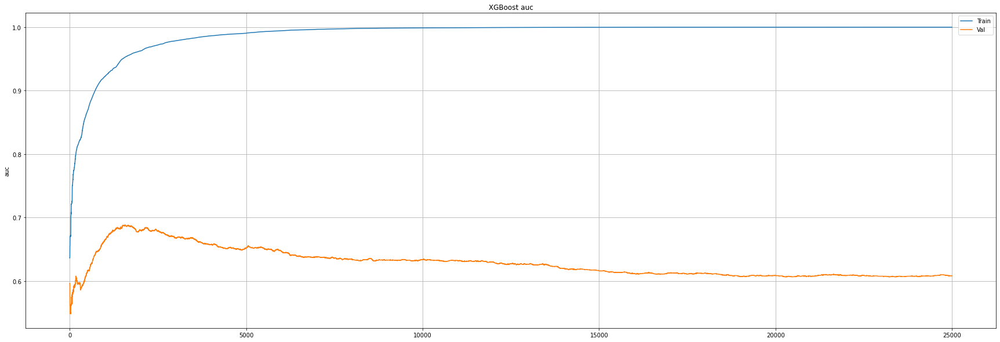

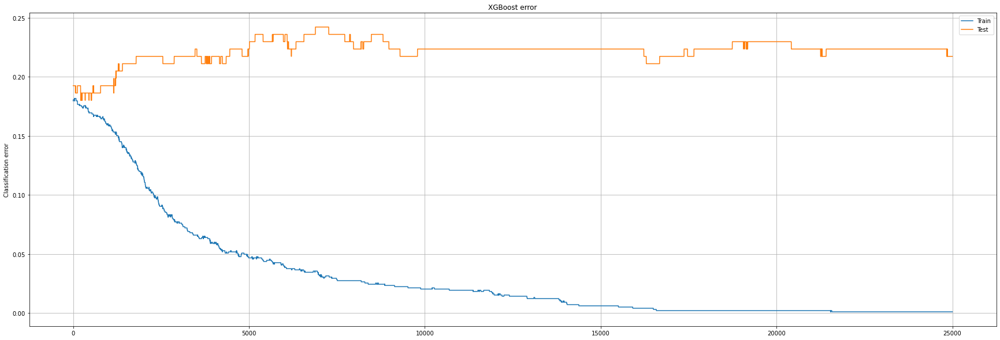

In [136]:
# Let's double check if we can get a better roc_auc with smaller learning rate and more n_estimators
# roc auc on validation set is smaller and the error is higher; we discart smaller learning rate
classifier = XGBClassifier(class_weight='balanced', learning_rate=0.005, max_depth=5, max_features=2, n_estimators=25000)
plot_validation_curve_error_roc_auc(X_train, X_val, classifier)

[13:49:14] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight", "max_features" } are not used.

[0]	validation_0-auc:0.63651	validation_0-error:0.17970	validation_1-auc:0.59659	validation_1-error:0.19255
[1]	validation_0-auc:0.65574	validation_0-error:0.17970	validation_1-auc:0.56120	validation_1-error:0.19255
[2]	validation_0-auc:0.67224	validation_0-error:0.18071	validation_1-auc:0.54995	validation_1-error:0.19255
[3]	validation_0-auc:0.71159	validation_0-error:0.18173	validation_1-auc:0.57848	validation_1-error:0.19255
[4]	validation_0-auc:0.71193	validation_0-error:0.17970	validation_1-auc:0.55788	validation_1-error:0.19255
[5]	validation_0-auc:0.72304	validation_0-error:0.18173	validation_1-auc:0.58842	validation_1-error:0.18634
[6]	validation_0-auc:0.72331	validation_0-error:0.18173	validation_1-auc:0.57185	validation_1-error:0.19255
[7]	validation_0-auc:0.756

[74]	validation_0-auc:0.90351	validation_0-error:0.16751	validation_1-auc:0.64785	validation_1-error:0.18634
[75]	validation_0-auc:0.90454	validation_0-error:0.16751	validation_1-auc:0.64761	validation_1-error:0.18634
[76]	validation_0-auc:0.90499	validation_0-error:0.16548	validation_1-auc:0.64903	validation_1-error:0.18634
[77]	validation_0-auc:0.90659	validation_0-error:0.16548	validation_1-auc:0.64832	validation_1-error:0.19255
[78]	validation_0-auc:0.90778	validation_0-error:0.16548	validation_1-auc:0.64856	validation_1-error:0.19255
[79]	validation_0-auc:0.90801	validation_0-error:0.16548	validation_1-auc:0.64595	validation_1-error:0.18634
[80]	validation_0-auc:0.90963	validation_0-error:0.16548	validation_1-auc:0.64548	validation_1-error:0.18634
[81]	validation_0-auc:0.91047	validation_0-error:0.16548	validation_1-auc:0.64690	validation_1-error:0.18634
[82]	validation_0-auc:0.91166	validation_0-error:0.16548	validation_1-auc:0.64785	validation_1-error:0.19255
[83]	validation_0-a

C:\Users\Olga\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[89]	validation_0-auc:0.91752	validation_0-error:0.16041	validation_1-auc:0.65400	validation_1-error:0.19255
[90]	validation_0-auc:0.91826	validation_0-error:0.15939	validation_1-auc:0.65305	validation_1-error:0.18634
[91]	validation_0-auc:0.91972	validation_0-error:0.15838	validation_1-auc:0.65092	validation_1-error:0.18634
[92]	validation_0-auc:0.92034	validation_0-error:0.15838	validation_1-auc:0.65187	validation_1-error:0.18634
[93]	validation_0-auc:0.92123	validation_0-error:0.15939	validation_1-auc:0.65424	validation_1-error:0.19255
[94]	validation_0-auc:0.92190	validation_0-error:0.15939	validation_1-auc:0.65353	validation_1-error:0.18634
[95]	validation_0-auc:0.92255	validation_0-error:0.15838	validation_1-auc:0.65376	validation_1-error:0.19255
[96]	validation_0-auc:0.92356	validation_0-error:0.15736	validation_1-auc:0.65471	validation_1-error:0.19876
[97]	validation_0-auc:0.92437	validation_0-error:0.15736	validation_1-auc:0.65495	validation_1-error:0.19876
[98]	validation_0-a

[164]	validation_0-auc:0.95188	validation_0-error:0.13604	validation_1-auc:0.67235	validation_1-error:0.21118
[165]	validation_0-auc:0.95237	validation_0-error:0.13604	validation_1-auc:0.67164	validation_1-error:0.21118
[166]	validation_0-auc:0.95269	validation_0-error:0.13401	validation_1-auc:0.67377	validation_1-error:0.20497
[167]	validation_0-auc:0.95292	validation_0-error:0.13401	validation_1-auc:0.67259	validation_1-error:0.19876
[168]	validation_0-auc:0.95328	validation_0-error:0.13299	validation_1-auc:0.67282	validation_1-error:0.19876
[169]	validation_0-auc:0.95355	validation_0-error:0.13299	validation_1-auc:0.67259	validation_1-error:0.19876
[170]	validation_0-auc:0.95386	validation_0-error:0.12995	validation_1-auc:0.67330	validation_1-error:0.19876
[171]	validation_0-auc:0.95395	validation_0-error:0.12893	validation_1-auc:0.67448	validation_1-error:0.19876
[172]	validation_0-auc:0.95410	validation_0-error:0.12995	validation_1-auc:0.67306	validation_1-error:0.19876
[173]	vali

[239]	validation_0-auc:0.96780	validation_0-error:0.10051	validation_1-auc:0.68513	validation_1-error:0.19255
[240]	validation_0-auc:0.96846	validation_0-error:0.09949	validation_1-auc:0.68300	validation_1-error:0.19255
[241]	validation_0-auc:0.96865	validation_0-error:0.09949	validation_1-auc:0.68371	validation_1-error:0.19255
[242]	validation_0-auc:0.96883	validation_0-error:0.09949	validation_1-auc:0.68395	validation_1-error:0.19255
[243]	validation_0-auc:0.96895	validation_0-error:0.09949	validation_1-auc:0.68513	validation_1-error:0.19255
[244]	validation_0-auc:0.96917	validation_0-error:0.09949	validation_1-auc:0.68419	validation_1-error:0.19876
[245]	validation_0-auc:0.96937	validation_0-error:0.09848	validation_1-auc:0.68300	validation_1-error:0.19876
[246]	validation_0-auc:0.96996	validation_0-error:0.09543	validation_1-auc:0.68205	validation_1-error:0.19876
[247]	validation_0-auc:0.97001	validation_0-error:0.09543	validation_1-auc:0.68253	validation_1-error:0.19876
[248]	vali

[314]	validation_0-auc:0.97859	validation_0-error:0.07513	validation_1-auc:0.67850	validation_1-error:0.20497
[315]	validation_0-auc:0.97868	validation_0-error:0.07614	validation_1-auc:0.67803	validation_1-error:0.20497
[316]	validation_0-auc:0.97890	validation_0-error:0.07513	validation_1-auc:0.67874	validation_1-error:0.20497
[317]	validation_0-auc:0.97918	validation_0-error:0.07513	validation_1-auc:0.67779	validation_1-error:0.20497
[318]	validation_0-auc:0.97931	validation_0-error:0.07614	validation_1-auc:0.67779	validation_1-error:0.20497
[319]	validation_0-auc:0.97940	validation_0-error:0.07614	validation_1-auc:0.67756	validation_1-error:0.20497
[320]	validation_0-auc:0.97952	validation_0-error:0.07614	validation_1-auc:0.67708	validation_1-error:0.20497
[321]	validation_0-auc:0.97960	validation_0-error:0.07513	validation_1-auc:0.67566	validation_1-error:0.19876
[322]	validation_0-auc:0.97967	validation_0-error:0.07513	validation_1-auc:0.67637	validation_1-error:0.19876
[323]	vali

[389]	validation_0-auc:0.98586	validation_0-error:0.06396	validation_1-auc:0.66312	validation_1-error:0.21118
[390]	validation_0-auc:0.98595	validation_0-error:0.06396	validation_1-auc:0.66335	validation_1-error:0.21118
[391]	validation_0-auc:0.98604	validation_0-error:0.06396	validation_1-auc:0.66383	validation_1-error:0.21118
[392]	validation_0-auc:0.98605	validation_0-error:0.06396	validation_1-auc:0.66430	validation_1-error:0.21118
[393]	validation_0-auc:0.98611	validation_0-error:0.06294	validation_1-auc:0.66359	validation_1-error:0.20497
[394]	validation_0-auc:0.98607	validation_0-error:0.06396	validation_1-auc:0.66430	validation_1-error:0.20497
[395]	validation_0-auc:0.98616	validation_0-error:0.06396	validation_1-auc:0.66312	validation_1-error:0.21118
[396]	validation_0-auc:0.98619	validation_0-error:0.06396	validation_1-auc:0.66359	validation_1-error:0.21118
[397]	validation_0-auc:0.98621	validation_0-error:0.06396	validation_1-auc:0.66383	validation_1-error:0.21118
[398]	vali

[464]	validation_0-auc:0.99011	validation_0-error:0.05178	validation_1-auc:0.65601	validation_1-error:0.20497
[465]	validation_0-auc:0.99014	validation_0-error:0.05178	validation_1-auc:0.65601	validation_1-error:0.21118
[466]	validation_0-auc:0.99016	validation_0-error:0.05178	validation_1-auc:0.65554	validation_1-error:0.21118
[467]	validation_0-auc:0.99027	validation_0-error:0.05279	validation_1-auc:0.65578	validation_1-error:0.20497
[468]	validation_0-auc:0.99029	validation_0-error:0.05279	validation_1-auc:0.65578	validation_1-error:0.20497
[469]	validation_0-auc:0.99032	validation_0-error:0.05178	validation_1-auc:0.65601	validation_1-error:0.20497
[470]	validation_0-auc:0.99033	validation_0-error:0.05178	validation_1-auc:0.65530	validation_1-error:0.20497
[471]	validation_0-auc:0.99041	validation_0-error:0.05178	validation_1-auc:0.65601	validation_1-error:0.20497
[472]	validation_0-auc:0.99044	validation_0-error:0.05178	validation_1-auc:0.65578	validation_1-error:0.20497
[473]	vali

[539]	validation_0-auc:0.99313	validation_0-error:0.04569	validation_1-auc:0.64773	validation_1-error:0.21739
[540]	validation_0-auc:0.99318	validation_0-error:0.04569	validation_1-auc:0.64678	validation_1-error:0.21739
[541]	validation_0-auc:0.99323	validation_0-error:0.04569	validation_1-auc:0.64773	validation_1-error:0.21739
[542]	validation_0-auc:0.99328	validation_0-error:0.04569	validation_1-auc:0.64654	validation_1-error:0.21739
[543]	validation_0-auc:0.99332	validation_0-error:0.04670	validation_1-auc:0.64773	validation_1-error:0.21739
[544]	validation_0-auc:0.99337	validation_0-error:0.04670	validation_1-auc:0.64749	validation_1-error:0.21739
[545]	validation_0-auc:0.99342	validation_0-error:0.04467	validation_1-auc:0.64702	validation_1-error:0.21739
[546]	validation_0-auc:0.99340	validation_0-error:0.04670	validation_1-auc:0.64678	validation_1-error:0.21739
[547]	validation_0-auc:0.99341	validation_0-error:0.04670	validation_1-auc:0.64702	validation_1-error:0.21739
[548]	vali

[614]	validation_0-auc:0.99480	validation_0-error:0.04061	validation_1-auc:0.64465	validation_1-error:0.21739
[615]	validation_0-auc:0.99479	validation_0-error:0.04162	validation_1-auc:0.64394	validation_1-error:0.21739
[616]	validation_0-auc:0.99477	validation_0-error:0.04162	validation_1-auc:0.64370	validation_1-error:0.21739
[617]	validation_0-auc:0.99483	validation_0-error:0.04162	validation_1-auc:0.64370	validation_1-error:0.21739
[618]	validation_0-auc:0.99484	validation_0-error:0.04162	validation_1-auc:0.64418	validation_1-error:0.21739
[619]	validation_0-auc:0.99488	validation_0-error:0.04162	validation_1-auc:0.64441	validation_1-error:0.21739
[620]	validation_0-auc:0.99488	validation_0-error:0.04162	validation_1-auc:0.64465	validation_1-error:0.21739
[621]	validation_0-auc:0.99488	validation_0-error:0.04162	validation_1-auc:0.64394	validation_1-error:0.21739
[622]	validation_0-auc:0.99491	validation_0-error:0.04162	validation_1-auc:0.64370	validation_1-error:0.21739
[623]	vali

[689]	validation_0-auc:0.99602	validation_0-error:0.03350	validation_1-auc:0.64157	validation_1-error:0.21739
[690]	validation_0-auc:0.99601	validation_0-error:0.03350	validation_1-auc:0.64181	validation_1-error:0.21739
[691]	validation_0-auc:0.99604	validation_0-error:0.03249	validation_1-auc:0.64252	validation_1-error:0.21739
[692]	validation_0-auc:0.99606	validation_0-error:0.03249	validation_1-auc:0.64228	validation_1-error:0.21739
[693]	validation_0-auc:0.99609	validation_0-error:0.03249	validation_1-auc:0.64157	validation_1-error:0.21739
[694]	validation_0-auc:0.99609	validation_0-error:0.03249	validation_1-auc:0.64134	validation_1-error:0.21739
[695]	validation_0-auc:0.99617	validation_0-error:0.03147	validation_1-auc:0.64157	validation_1-error:0.21739
[696]	validation_0-auc:0.99617	validation_0-error:0.03147	validation_1-auc:0.64181	validation_1-error:0.21739
[697]	validation_0-auc:0.99615	validation_0-error:0.03147	validation_1-auc:0.64157	validation_1-error:0.21739
[698]	vali

[764]	validation_0-auc:0.99725	validation_0-error:0.02741	validation_1-auc:0.63234	validation_1-error:0.22360
[765]	validation_0-auc:0.99727	validation_0-error:0.02741	validation_1-auc:0.63281	validation_1-error:0.22360
[766]	validation_0-auc:0.99728	validation_0-error:0.02741	validation_1-auc:0.63281	validation_1-error:0.22360
[767]	validation_0-auc:0.99729	validation_0-error:0.02640	validation_1-auc:0.63329	validation_1-error:0.22360
[768]	validation_0-auc:0.99731	validation_0-error:0.02640	validation_1-auc:0.63352	validation_1-error:0.22360
[769]	validation_0-auc:0.99729	validation_0-error:0.02640	validation_1-auc:0.63352	validation_1-error:0.22360
[770]	validation_0-auc:0.99729	validation_0-error:0.02640	validation_1-auc:0.63281	validation_1-error:0.21739
[771]	validation_0-auc:0.99731	validation_0-error:0.02640	validation_1-auc:0.63329	validation_1-error:0.21739
[772]	validation_0-auc:0.99733	validation_0-error:0.02640	validation_1-auc:0.63305	validation_1-error:0.21739
[773]	vali

[839]	validation_0-auc:0.99819	validation_0-error:0.02335	validation_1-auc:0.63045	validation_1-error:0.22360
[840]	validation_0-auc:0.99820	validation_0-error:0.02335	validation_1-auc:0.63045	validation_1-error:0.22360
[841]	validation_0-auc:0.99822	validation_0-error:0.02335	validation_1-auc:0.63045	validation_1-error:0.22360
[842]	validation_0-auc:0.99822	validation_0-error:0.02335	validation_1-auc:0.62950	validation_1-error:0.21739
[843]	validation_0-auc:0.99823	validation_0-error:0.02335	validation_1-auc:0.62879	validation_1-error:0.21739
[844]	validation_0-auc:0.99823	validation_0-error:0.02335	validation_1-auc:0.62950	validation_1-error:0.21739
[845]	validation_0-auc:0.99824	validation_0-error:0.02335	validation_1-auc:0.62902	validation_1-error:0.21739
[846]	validation_0-auc:0.99829	validation_0-error:0.02335	validation_1-auc:0.62902	validation_1-error:0.21739
[847]	validation_0-auc:0.99829	validation_0-error:0.02335	validation_1-auc:0.62902	validation_1-error:0.21739
[848]	vali

[914]	validation_0-auc:0.99892	validation_0-error:0.01929	validation_1-auc:0.62618	validation_1-error:0.21739
[915]	validation_0-auc:0.99892	validation_0-error:0.01929	validation_1-auc:0.62618	validation_1-error:0.21739
[916]	validation_0-auc:0.99890	validation_0-error:0.01929	validation_1-auc:0.62642	validation_1-error:0.21739
[917]	validation_0-auc:0.99892	validation_0-error:0.01929	validation_1-auc:0.62618	validation_1-error:0.21739
[918]	validation_0-auc:0.99892	validation_0-error:0.01929	validation_1-auc:0.62547	validation_1-error:0.21739
[919]	validation_0-auc:0.99893	validation_0-error:0.01929	validation_1-auc:0.62547	validation_1-error:0.21739
[920]	validation_0-auc:0.99894	validation_0-error:0.01929	validation_1-auc:0.62500	validation_1-error:0.21739
[921]	validation_0-auc:0.99895	validation_0-error:0.01929	validation_1-auc:0.62524	validation_1-error:0.21739
[922]	validation_0-auc:0.99895	validation_0-error:0.01929	validation_1-auc:0.62595	validation_1-error:0.21739
[923]	vali

[989]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62192	validation_1-error:0.22360
[990]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62240	validation_1-error:0.22360
[991]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62240	validation_1-error:0.22360
[992]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62287	validation_1-error:0.22360
[993]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62240	validation_1-error:0.22360
[994]	validation_0-auc:0.99914	validation_0-error:0.01726	validation_1-auc:0.62192	validation_1-error:0.22360
[995]	validation_0-auc:0.99918	validation_0-error:0.01726	validation_1-auc:0.62334	validation_1-error:0.22360
[996]	validation_0-auc:0.99917	validation_0-error:0.01726	validation_1-auc:0.62263	validation_1-error:0.22360
[997]	validation_0-auc:0.99917	validation_0-error:0.01726	validation_1-auc:0.62240	validation_1-error:0.22360
[998]	vali

[1063]	validation_0-auc:0.99937	validation_0-error:0.01523	validation_1-auc:0.61837	validation_1-error:0.21739
[1064]	validation_0-auc:0.99937	validation_0-error:0.01624	validation_1-auc:0.61837	validation_1-error:0.21739
[1065]	validation_0-auc:0.99936	validation_0-error:0.01624	validation_1-auc:0.61837	validation_1-error:0.21739
[1066]	validation_0-auc:0.99935	validation_0-error:0.01624	validation_1-auc:0.61837	validation_1-error:0.21739
[1067]	validation_0-auc:0.99937	validation_0-error:0.01624	validation_1-auc:0.61908	validation_1-error:0.21739
[1068]	validation_0-auc:0.99940	validation_0-error:0.01624	validation_1-auc:0.61908	validation_1-error:0.21739
[1069]	validation_0-auc:0.99941	validation_0-error:0.01624	validation_1-auc:0.61861	validation_1-error:0.21739
[1070]	validation_0-auc:0.99939	validation_0-error:0.01624	validation_1-auc:0.61861	validation_1-error:0.21739
[1071]	validation_0-auc:0.99940	validation_0-error:0.01624	validation_1-auc:0.61908	validation_1-error:0.21739
[

[1137]	validation_0-auc:0.99958	validation_0-error:0.01218	validation_1-auc:0.61529	validation_1-error:0.21739
[1138]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61506	validation_1-error:0.21739
[1139]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61458	validation_1-error:0.21739
[1140]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61506	validation_1-error:0.21739
[1141]	validation_0-auc:0.99957	validation_0-error:0.01218	validation_1-auc:0.61506	validation_1-error:0.21739
[1142]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61506	validation_1-error:0.21739
[1143]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61529	validation_1-error:0.21739
[1144]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61482	validation_1-error:0.21739
[1145]	validation_0-auc:0.99956	validation_0-error:0.01218	validation_1-auc:0.61482	validation_1-error:0.21739
[

[1211]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61387	validation_1-error:0.21739
[1212]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61411	validation_1-error:0.21739
[1213]	validation_0-auc:0.99963	validation_0-error:0.01117	validation_1-auc:0.61411	validation_1-error:0.21739
[1214]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61435	validation_1-error:0.21739
[1215]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61364	validation_1-error:0.21739
[1216]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61340	validation_1-error:0.21739
[1217]	validation_0-auc:0.99965	validation_0-error:0.01117	validation_1-auc:0.61411	validation_1-error:0.21739
[1218]	validation_0-auc:0.99966	validation_0-error:0.01117	validation_1-auc:0.61387	validation_1-error:0.21739
[1219]	validation_0-auc:0.99967	validation_0-error:0.01117	validation_1-auc:0.61340	validation_1-error:0.21739
[

[1285]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61222	validation_1-error:0.21739
[1286]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61245	validation_1-error:0.21739
[1287]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61245	validation_1-error:0.21739
[1288]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61293	validation_1-error:0.21739
[1289]	validation_0-auc:0.99971	validation_0-error:0.00711	validation_1-auc:0.61293	validation_1-error:0.21739
[1290]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61293	validation_1-error:0.21739
[1291]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61269	validation_1-error:0.21739
[1292]	validation_0-auc:0.99972	validation_0-error:0.00711	validation_1-auc:0.61269	validation_1-error:0.21739
[1293]	validation_0-auc:0.99972	validation_0-error:0.00609	validation_1-auc:0.61293	validation_1-error:0.21739
[

[1359]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61127	validation_1-error:0.21739
[1360]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61103	validation_1-error:0.21739
[1361]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61103	validation_1-error:0.21739
[1362]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61127	validation_1-error:0.21739
[1363]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61032	validation_1-error:0.21739
[1364]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61056	validation_1-error:0.21739
[1365]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61032	validation_1-error:0.21739
[1366]	validation_0-auc:0.99985	validation_0-error:0.00609	validation_1-auc:0.61032	validation_1-error:0.21739
[1367]	validation_0-auc:0.99984	validation_0-error:0.00609	validation_1-auc:0.61009	validation_1-error:0.21739
[

[1433]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60748	validation_1-error:0.21739
[1434]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60843	validation_1-error:0.21739
[1435]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60795	validation_1-error:0.21739
[1436]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60795	validation_1-error:0.21739
[1437]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60795	validation_1-error:0.21739
[1438]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60795	validation_1-error:0.21739
[1439]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60748	validation_1-error:0.21739
[1440]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60795	validation_1-error:0.21739
[1441]	validation_0-auc:0.99989	validation_0-error:0.00406	validation_1-auc:0.60866	validation_1-error:0.21739
[

[1507]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60701	validation_1-error:0.21739
[1508]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60701	validation_1-error:0.21739
[1509]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60677	validation_1-error:0.21739
[1510]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60606	validation_1-error:0.21739
[1511]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60630	validation_1-error:0.21739
[1512]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60653	validation_1-error:0.21739
[1513]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60606	validation_1-error:0.21739
[1514]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60606	validation_1-error:0.21739
[1515]	validation_0-auc:0.99993	validation_0-error:0.00406	validation_1-auc:0.60677	validation_1-error:0.21739
[

[1581]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60582	validation_1-error:0.21739
[1582]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60582	validation_1-error:0.21739
[1583]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60559	validation_1-error:0.21739
[1584]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60606	validation_1-error:0.21739
[1585]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60582	validation_1-error:0.21739
[1586]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60582	validation_1-error:0.21739
[1587]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60582	validation_1-error:0.21739
[1588]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60606	validation_1-error:0.21739
[1589]	validation_0-auc:0.99994	validation_0-error:0.00305	validation_1-auc:0.60606	validation_1-error:0.21739
[

[1655]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60417	validation_1-error:0.21739
[1656]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60440	validation_1-error:0.21739
[1657]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60440	validation_1-error:0.21739
[1658]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60440	validation_1-error:0.21739
[1659]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60393	validation_1-error:0.21739
[1660]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60393	validation_1-error:0.21739
[1661]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60322	validation_1-error:0.21739
[1662]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60346	validation_1-error:0.21739
[1663]	validation_0-auc:0.99994	validation_0-error:0.00203	validation_1-auc:0.60369	validation_1-error:0.21739
[

[1729]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60535	validation_1-error:0.21739
[1730]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.21739
[1731]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.60511	validation_1-error:0.21739
[1732]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.60511	validation_1-error:0.21739
[1733]	validation_0-auc:0.99995	validation_0-error:0.00203	validation_1-auc:0.60511	validation_1-error:0.21739
[1734]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60488	validation_1-error:0.21739
[1735]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60417	validation_1-error:0.21739
[1736]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60369	validation_1-error:0.21739
[1737]	validation_0-auc:0.99995	validation_0-error:0.00102	validation_1-auc:0.60369	validation_1-error:0.21739
[

[1803]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60204	validation_1-error:0.21739
[1804]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60204	validation_1-error:0.21739
[1805]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60204	validation_1-error:0.21739
[1806]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60204	validation_1-error:0.21739
[1807]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60251	validation_1-error:0.21739
[1808]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60275	validation_1-error:0.21739
[1809]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60275	validation_1-error:0.21739
[1810]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60298	validation_1-error:0.21739
[1811]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60275	validation_1-error:0.21739
[

[1877]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1878]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1879]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1880]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1881]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1882]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1883]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1884]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[1885]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60156	validation_1-error:0.21739
[

[1951]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.21739
[1952]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59896	validation_1-error:0.21739
[1953]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.21739
[1954]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.21739
[1955]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59991	validation_1-error:0.21739
[1956]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.60014	validation_1-error:0.21739
[1957]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59967	validation_1-error:0.21739
[1958]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59967	validation_1-error:0.21739
[1959]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59967	validation_1-error:0.21739
[

[2025]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[2026]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[2027]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59872	validation_1-error:0.22360
[2028]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[2029]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59896	validation_1-error:0.22360
[2030]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59896	validation_1-error:0.22360
[2031]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[2032]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[2033]	validation_0-auc:0.99998	validation_0-error:0.00102	validation_1-auc:0.59920	validation_1-error:0.22360
[

[2099]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60038	validation_1-error:0.22360
[2100]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60038	validation_1-error:0.22360
[2101]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60062	validation_1-error:0.22360
[2102]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60014	validation_1-error:0.22360
[2103]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60038	validation_1-error:0.21739
[2104]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60085	validation_1-error:0.21739
[2105]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60038	validation_1-error:0.22360
[2106]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60062	validation_1-error:0.22360
[2107]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60038	validation_1-error:0.22360
[

[2173]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60464	validation_1-error:0.21739
[2174]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60464	validation_1-error:0.21739
[2175]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60440	validation_1-error:0.21739
[2176]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60440	validation_1-error:0.21739
[2177]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60393	validation_1-error:0.21739
[2178]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60464	validation_1-error:0.21739
[2179]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60488	validation_1-error:0.21739
[2180]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.21739
[2181]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60535	validation_1-error:0.21739
[

[2247]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60653	validation_1-error:0.22360
[2248]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[2249]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[2250]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[2251]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[2252]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.22360
[2253]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.22360
[2254]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.22360
[2255]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.22360
[

[2321]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.22981
[2322]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.23602
[2323]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.23602
[2324]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.23602
[2325]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.23602
[2326]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.23602
[2327]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.23602
[2328]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.23602
[2329]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.23602
[

[2395]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.23602
[2396]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.23602
[2397]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.23602
[2398]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.23602
[2399]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.23602
[2400]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.23602
[2401]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.23602
[2402]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.23602
[2403]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.23602
[

[2469]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.23602
[2470]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.23602
[2471]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.23602
[2472]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.23602
[2473]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.23602
[2474]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.23602
[2475]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.23602
[2476]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.23602
[2477]	validation_0-auc:0.99999	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[

[2543]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[2544]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[2545]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[2546]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[2547]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[2548]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[2549]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[2550]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[2551]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[

[2617]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[2618]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[2619]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[2620]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[2621]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[2622]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[2623]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[2624]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[2625]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[

[2691]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.22981
[2692]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.22981
[2693]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.22981
[2694]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.22981
[2695]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.22981
[2696]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.22981
[2697]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.22981
[2698]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.22981
[2699]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.22981
[

[2765]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2766]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2767]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.22981
[2768]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.22981
[2769]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.22981
[2770]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.22981
[2771]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2772]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2773]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[

[2839]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2840]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2841]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2842]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2843]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2844]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.22981
[2845]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[2846]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.22981
[2847]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.22981
[

[2913]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[2914]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[2915]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[2916]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2917]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2918]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[2919]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[2920]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[2921]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.22981
[

[2987]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.23602
[2988]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.23602
[2989]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.23602
[2990]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[2991]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[2992]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.23602
[2993]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.23602
[2994]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[2995]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.23602
[

[3061]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.23602
[3062]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.22981
[3063]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.23602
[3064]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.22981
[3065]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.23602
[3066]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.23602
[3067]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.23602
[3068]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.23602
[3069]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.22981
[

[3135]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.23602
[3136]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.23602
[3137]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.23602
[3138]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.23602
[3139]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.23602
[3140]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.23602
[3141]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.23602
[3142]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.23602
[3143]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.23602
[

[3209]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3210]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3211]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3212]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3213]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3214]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3215]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[3216]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[3217]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[

[3283]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24224
[3284]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24224
[3285]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24224
[3286]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.24224
[3287]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24224
[3288]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24224
[3289]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.24224
[3290]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24224
[3291]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24224
[

[3357]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.23602
[3358]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[3359]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[3360]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[3361]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[3362]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.23602
[3363]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[3364]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.23602
[3365]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.23602
[

[3431]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.23602
[3432]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.23602
[3433]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[3434]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.23602
[3435]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.23602
[3436]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.23602
[3437]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3438]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3439]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.23602
[

[3505]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3506]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3507]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3508]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3509]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3510]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3511]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3512]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[3513]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.23602
[

[3579]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.24224
[3580]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24224
[3581]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3582]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3583]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3584]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3585]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3586]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[3587]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24224
[

[3653]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3654]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3655]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24224
[3656]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3657]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3658]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3659]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[3660]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24224
[3661]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24224
[

[3727]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3728]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3729]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3730]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[3731]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[3732]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3733]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3734]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3735]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[

[3801]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[3802]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[3803]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61198	validation_1-error:0.24845
[3804]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.24845
[3805]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3806]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[3807]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[3808]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[3809]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[

[3875]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[3876]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[3877]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[3878]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[3879]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[3880]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[3881]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.24845
[3882]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[3883]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.24845
[

[3949]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[3950]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24845
[3951]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24845
[3952]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[3953]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[3954]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24845
[3955]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[3956]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[3957]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[

[4023]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4024]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4025]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4026]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4027]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4028]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[4029]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[4030]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[4031]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[

[4097]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[4098]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4099]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[4100]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[4101]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[4102]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[4103]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[4104]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[4105]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[

[4171]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4172]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4173]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4174]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4175]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4176]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4177]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4178]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4179]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[

[4245]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4246]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4247]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4248]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24845
[4249]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4250]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4251]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4252]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4253]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.24845
[

[4319]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4320]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4321]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4322]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.24845
[4323]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4324]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4325]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4326]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4327]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[

[4393]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.24845
[4394]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4395]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4396]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4397]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[4398]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4399]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4400]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[4401]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[

[4467]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4468]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4469]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4470]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.24845
[4471]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4472]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4473]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4474]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4475]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.24845
[

[4541]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4542]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4543]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4544]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4545]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4546]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4547]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4548]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4549]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[

[4615]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4616]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4617]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4618]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4619]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4620]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4621]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4622]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[4623]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.24845
[

[4689]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4690]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4691]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4692]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[4693]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4694]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4695]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.24845
[4696]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.24845
[4697]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61222	validation_1-error:0.24845
[

[4763]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[4764]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[4765]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[4766]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[4767]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[4768]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[4769]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[4770]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[4771]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[

[4837]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4838]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[4839]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4840]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4841]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4842]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4843]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4844]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[4845]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[

[4911]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[4912]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[4913]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[4914]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4915]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4916]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4917]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4918]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4919]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[

[4985]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4986]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4987]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4988]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[4989]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4990]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4991]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[4992]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[4993]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[

[5059]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5060]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5061]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5062]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5063]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5064]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5065]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5066]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[5067]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[

[5133]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5134]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5135]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[5136]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[5137]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5138]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.25466
[5139]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[5140]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[5141]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[

[5207]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[5208]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[5209]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5210]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5211]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[5212]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[5213]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[5214]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61198	validation_1-error:0.25466
[5215]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[

[5281]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5282]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5283]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5284]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5285]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[5286]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5287]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5288]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[5289]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[

[5355]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[5356]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[5357]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[5358]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[5359]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[5360]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[5361]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[5362]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[5363]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[

[5429]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5430]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[5431]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5432]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5433]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[5434]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5435]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[5436]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[5437]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[

[5503]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5504]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5505]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5506]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5507]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[5508]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5509]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5510]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5511]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[

[5577]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[5578]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[5579]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[5580]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.25466
[5581]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[5582]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[5583]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[5584]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[5585]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[

[5651]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.25466
[5652]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.25466
[5653]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60653	validation_1-error:0.25466
[5654]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60677	validation_1-error:0.25466
[5655]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60724	validation_1-error:0.25466
[5656]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.25466
[5657]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60701	validation_1-error:0.25466
[5658]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60653	validation_1-error:0.25466
[5659]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60653	validation_1-error:0.25466
[

[5725]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5726]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5727]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5728]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5729]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5730]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5731]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5732]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[5733]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[

[5799]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5800]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5801]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5802]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5803]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5804]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5805]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5806]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5807]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[

[5873]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[5874]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5875]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5876]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[5877]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[5878]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[5879]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[5880]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[5881]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[

[5947]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60559	validation_1-error:0.25466
[5948]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60582	validation_1-error:0.25466
[5949]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60606	validation_1-error:0.25466
[5950]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60606	validation_1-error:0.25466
[5951]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60653	validation_1-error:0.25466
[5952]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[5953]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60606	validation_1-error:0.25466
[5954]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60582	validation_1-error:0.25466
[5955]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60606	validation_1-error:0.25466
[

[6021]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[6022]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[6023]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[6024]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60488	validation_1-error:0.25466
[6025]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60488	validation_1-error:0.25466
[6026]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60488	validation_1-error:0.25466
[6027]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[6028]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[6029]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60511	validation_1-error:0.25466
[

[6095]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6096]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6097]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6098]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60606	validation_1-error:0.25466
[6099]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6100]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6101]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6102]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[6103]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60630	validation_1-error:0.25466
[

[6169]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[6170]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[6171]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[6172]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[6173]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[6174]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[6175]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[6176]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60748	validation_1-error:0.25466
[6177]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[

[6243]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[6244]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[6245]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60819	validation_1-error:0.25466
[6246]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[6247]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[6248]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[6249]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[6250]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60772	validation_1-error:0.25466
[6251]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[

[6317]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60795	validation_1-error:0.25466
[6318]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60843	validation_1-error:0.25466
[6319]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[6320]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[6321]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6322]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6323]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[6324]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[6325]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60866	validation_1-error:0.25466
[

[6391]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6392]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6393]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6394]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6395]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6396]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6397]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60890	validation_1-error:0.25466
[6398]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6399]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[

[6538]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6539]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6540]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6541]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6542]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6543]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6544]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6545]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6546]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[

[6612]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6613]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6614]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6615]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6616]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60914	validation_1-error:0.25466
[6617]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6618]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6619]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6620]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[

[6686]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6687]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6688]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6689]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6690]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6691]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6692]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6693]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6694]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[

[6760]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6761]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6762]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6763]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6764]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6765]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6766]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6767]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6768]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[

[6834]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6835]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6836]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6837]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6838]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6839]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60938	validation_1-error:0.25466
[6840]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6841]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[6842]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60961	validation_1-error:0.25466
[

[6908]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6909]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6910]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.60985	validation_1-error:0.25466
[6911]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6912]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6913]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6914]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6915]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[6916]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61009	validation_1-error:0.25466
[

[6982]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[6983]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[6984]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[6985]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[6986]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[6987]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[6988]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[6989]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[6990]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.25466
[

[7056]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7057]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7058]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7059]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7060]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7061]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7062]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7063]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7064]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[

[7130]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7131]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7132]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7133]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7134]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7135]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7136]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7137]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7138]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[

[7204]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7205]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7206]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7207]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7208]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7209]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7210]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7211]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7212]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[

[7278]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7279]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7280]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7281]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7282]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7283]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7284]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7285]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7286]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[

[7352]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.25466
[7353]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7354]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7355]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7356]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61080	validation_1-error:0.25466
[7357]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.24845
[7358]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61056	validation_1-error:0.24845
[7359]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.24845
[7360]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61032	validation_1-error:0.24845
[

[7426]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[7427]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.25466
[7428]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.25466
[7429]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[7430]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7431]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.25466
[7432]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.25466
[7433]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.25466
[7434]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.25466
[

[7500]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61151	validation_1-error:0.24845
[7501]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[7502]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[7503]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[7504]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[7505]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.24845
[7506]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61103	validation_1-error:0.24845
[7507]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61127	validation_1-error:0.24845
[7508]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61174	validation_1-error:0.24845
[

[7574]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61198	validation_1-error:0.25466
[7575]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61222	validation_1-error:0.25466
[7576]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.25466
[7577]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61222	validation_1-error:0.25466
[7578]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61245	validation_1-error:0.25466
[7579]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.25466
[7580]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.25466
[7581]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[7582]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61269	validation_1-error:0.25466
[

[7648]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[7649]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7650]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7651]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[7652]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7653]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7654]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7655]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7656]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61316	validation_1-error:0.25466
[

[7722]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7723]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7724]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7725]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7726]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[7727]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7728]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[7729]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[7730]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[

[7796]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7797]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7798]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7799]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7800]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7801]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.25466
[7802]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[7803]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[7804]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61293	validation_1-error:0.24845
[

[7870]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7871]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7872]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7873]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7874]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7875]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7876]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.24845
[7877]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[7878]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.24845
[

[7944]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[7945]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[7946]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[7947]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[7948]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[7949]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[7950]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[7951]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[7952]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[

[8018]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8019]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8020]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8021]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[8022]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8023]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8024]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8025]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8026]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[

[8092]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8093]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8094]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8095]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8096]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8097]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8098]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[8099]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[8100]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61364	validation_1-error:0.25466
[

[8166]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8167]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8168]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8169]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8170]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8171]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8172]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8173]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[8174]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61340	validation_1-error:0.25466
[

[8240]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8241]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8242]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8243]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8244]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8245]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8246]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8247]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8248]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[

[8314]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8315]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8316]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8317]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[8318]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[8319]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[8320]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[8321]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8322]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61482	validation_1-error:0.25466
[

[8388]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8389]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8390]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8391]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8392]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8393]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8394]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8395]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[8396]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61458	validation_1-error:0.25466
[

[8462]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8463]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8464]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8465]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8466]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8467]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8468]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8469]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8470]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[

[8536]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61387	validation_1-error:0.25466
[8537]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8538]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8539]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61411	validation_1-error:0.25466
[8540]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8541]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8542]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8543]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[8544]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61435	validation_1-error:0.25466
[

[8610]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8611]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8612]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8613]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8614]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8615]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8616]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8617]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.25466
[8618]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[

[8684]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8685]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8686]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8687]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8688]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8689]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8690]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8691]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[8692]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.25466
[

[8758]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8759]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8760]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8761]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8762]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8763]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61506	validation_1-error:0.24845
[8764]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.24845
[8765]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.24845
[8766]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61529	validation_1-error:0.24845
[

[8832]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8833]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.24845
[8834]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8835]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8836]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8837]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8838]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.24845
[8839]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[8840]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61553	validation_1-error:0.24845
[

[8906]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8907]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.24845
[8908]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.24845
[8909]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.24845
[8910]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8911]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8912]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8913]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8914]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[

[8980]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8981]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8982]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[8983]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.24845
[8984]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.24845
[8985]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.24845
[8986]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[8987]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[8988]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[

[9054]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[9055]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.24845
[9056]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9057]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9058]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9059]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9060]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9061]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9062]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[

[9128]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9129]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9130]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9131]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9132]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9133]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9134]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9135]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9136]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[

[9202]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9203]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9204]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9205]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[9206]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9207]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9208]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9209]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61648	validation_1-error:0.25466
[9210]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61624	validation_1-error:0.25466
[

[9276]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61600	validation_1-error:0.25466
[9277]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9278]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9279]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9280]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9281]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9282]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9283]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[9284]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61577	validation_1-error:0.25466
[

[9350]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61671	validation_1-error:0.24845
[9351]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9352]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9353]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9354]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9355]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9356]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9357]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9358]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[

[9424]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9425]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9426]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9427]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9428]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9429]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9430]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9431]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9432]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[

[9498]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[9499]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9500]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9501]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9502]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9503]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9504]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9505]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9506]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[

[9572]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[9573]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[9574]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9575]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9576]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[9577]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9578]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9579]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9580]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[

[9646]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[9647]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9648]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9649]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[9650]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[9651]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[9652]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[9653]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[9654]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[

[9720]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9721]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9722]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9723]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9724]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9725]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[9726]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9727]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[9728]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[

[9794]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9795]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[9796]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[9797]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9798]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9799]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9800]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9801]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[9802]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[

[9868]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9869]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[9870]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9871]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9872]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[9873]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9874]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9875]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[9876]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[

[9942]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[9943]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9944]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9945]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9946]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9947]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9948]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9949]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[9950]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[

[10016]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10017]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10018]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10019]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10020]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10021]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10022]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10023]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10024]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:

[10090]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10091]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10092]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10093]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[10094]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10095]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10096]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10097]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[10098]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:

[10164]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10165]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[10166]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10167]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[10168]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10169]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10170]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[10171]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[10172]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:

[10238]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10239]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10240]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10241]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10242]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10243]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10244]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10245]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10246]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:

[10312]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10313]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10314]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24224
[10315]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10316]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24224
[10317]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10318]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24224
[10319]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24224
[10320]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:

[10386]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10387]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10388]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10389]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10390]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10391]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10392]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10393]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10394]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:

[10460]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24224
[10461]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24224
[10462]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24224
[10463]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24224
[10464]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24224
[10465]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10466]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24224
[10467]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10468]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:

[10534]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10535]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10536]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10537]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10538]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[10539]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61695	validation_1-error:0.24845
[10540]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10541]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10542]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:

[10608]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10609]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10610]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24845
[10611]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10612]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10613]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10614]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:0.24224
[10615]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61719	validation_1-error:0.24845
[10616]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61742	validation_1-error:

[10682]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10683]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10684]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10685]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10686]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[10687]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10688]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[10689]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[10690]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:

[10756]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.23602
[10757]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[10758]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.23602
[10759]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.23602
[10760]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.23602
[10761]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[10762]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.23602
[10763]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.23602
[10764]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:

[10830]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10831]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10832]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.23602
[10833]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.23602
[10834]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10835]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10836]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10837]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10838]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[10904]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10905]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10906]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10907]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10908]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10909]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10910]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10911]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[10912]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[10978]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10979]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10980]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10981]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10982]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10983]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10984]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10985]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[10986]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[11052]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[11053]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[11054]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[11055]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[11056]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.24224
[11057]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.24224
[11058]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.24224
[11059]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.24224
[11060]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[11126]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11127]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11128]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[11129]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11130]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11131]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11132]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11133]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11134]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[11200]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.23602
[11201]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.23602
[11202]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.23602
[11203]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11204]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11205]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11206]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11207]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.23602
[11208]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:

[11274]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11275]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11276]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11277]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11278]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.23602
[11279]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11280]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.23602
[11281]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.23602
[11282]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[11348]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11349]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11350]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11351]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11352]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11353]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11354]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11355]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.23602
[11356]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[11422]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11423]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11424]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11425]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11426]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11427]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11428]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11429]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[11430]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:

[11496]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[11497]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[11498]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[11499]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[11500]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[11501]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[11502]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[11503]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[11504]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:

[11570]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24845
[11571]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24845
[11572]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24845
[11573]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11574]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24845
[11575]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24845
[11576]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24845
[11577]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24845
[11578]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:

[11644]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11645]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11646]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11647]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11648]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11649]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11650]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11651]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11652]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:

[11718]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11719]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11720]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11721]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11722]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11723]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11724]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11725]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24845
[11726]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:

[11792]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11793]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11794]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11795]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11796]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11797]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11798]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11799]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[11800]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:

[11866]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24845
[11867]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24845
[11868]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11869]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11870]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11871]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11872]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11873]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24845
[11874]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:

[11940]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11941]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11942]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[11943]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[11944]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[11945]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11946]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[11947]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[11948]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:

[12014]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12015]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12016]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12017]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12018]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12019]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12020]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12021]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12022]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[12088]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.23602
[12089]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.23602
[12090]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.23602
[12091]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.23602
[12092]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.23602
[12093]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.23602
[12094]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[12095]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.23602
[12096]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:

[12162]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12163]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12164]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12165]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12166]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12167]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12168]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12169]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.23602
[12170]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:

[12236]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12237]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.23602
[12238]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.23602
[12239]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12240]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.23602
[12241]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.23602
[12242]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[12243]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12244]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:

[12310]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[12311]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[12312]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12313]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12314]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12315]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.23602
[12316]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[12317]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.23602
[12318]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:

[12384]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12385]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24224
[12386]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12387]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24224
[12388]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12389]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12390]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12391]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12392]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:

[12458]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12459]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12460]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12461]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12462]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12463]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12464]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12465]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12466]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:

[12532]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12533]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12534]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12535]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12536]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12537]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62169	validation_1-error:0.24224
[12538]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12539]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62145	validation_1-error:0.24224
[12540]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:

[12606]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12607]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12608]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12609]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12610]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12611]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12612]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12613]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:0.24224
[12614]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62121	validation_1-error:

[12680]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12681]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12682]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12683]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12684]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12685]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12686]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12687]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12688]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:

[12754]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12755]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12756]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12757]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12758]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12759]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12760]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12761]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12762]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:

[12828]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12829]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12830]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12831]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12832]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62074	validation_1-error:0.24224
[12833]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12834]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24224
[12835]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:0.24224
[12836]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62098	validation_1-error:

[12902]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12903]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12904]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12905]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12906]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62050	validation_1-error:0.24224
[12907]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12908]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12909]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12910]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:

[12976]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12977]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12978]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12979]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12980]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12981]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24224
[12982]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12983]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[12984]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[13050]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13051]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13052]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13053]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13054]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13055]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13056]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13057]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13058]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:

[13124]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24224
[13125]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13126]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13127]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13128]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13129]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13130]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13131]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13132]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:

[13198]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13199]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13200]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13201]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13202]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13203]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13204]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.24224
[13205]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.24224
[13206]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[13272]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13273]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13274]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13275]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13276]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13277]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13278]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13279]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24224
[13280]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:

[13346]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13347]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13348]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13349]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13350]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13351]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13352]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13353]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13354]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:

[13420]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13421]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13422]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13423]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62027	validation_1-error:0.24845
[13424]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.62003	validation_1-error:0.24845
[13425]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13426]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13427]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13428]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[13494]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13495]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13496]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13497]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13498]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13499]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13500]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13501]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.24845
[13502]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:

[13568]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.24845
[13569]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.24845
[13570]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.24845
[13571]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13572]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13573]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13574]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[13575]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13576]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:

[13642]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13643]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13644]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13645]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13646]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13647]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13648]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13649]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13650]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:

[13716]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61979	validation_1-error:0.25466
[13717]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13718]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13719]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13720]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61955	validation_1-error:0.25466
[13721]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13722]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13723]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13724]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:

[13790]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13791]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13792]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13793]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13794]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13795]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13796]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13797]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13798]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:

[13864]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[13865]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[13866]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13867]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13868]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13869]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13870]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61932	validation_1-error:0.25466
[13871]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[13872]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:

[14011]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14012]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14013]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14014]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14015]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14016]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14017]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14018]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14019]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:

[14085]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14086]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14087]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14088]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14089]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14090]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14091]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14092]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14093]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:

[14159]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14160]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14161]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14162]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14163]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14164]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14165]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14166]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14167]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:

[14233]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14234]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14235]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14236]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14237]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.25466
[14238]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14239]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.25466
[14240]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.25466
[14241]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:

[14307]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14308]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14309]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14310]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14311]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14312]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14313]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14314]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14315]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:

[14381]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14382]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14383]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.25466
[14384]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14385]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14386]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.25466
[14387]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.25466
[14388]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.25466
[14389]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:

[14455]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14456]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14457]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14458]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14459]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14460]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14461]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14462]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[14463]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:

[14529]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14530]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14531]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14532]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14533]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14534]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14535]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14536]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:0.24845
[14537]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61861	validation_1-error:

[14603]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.24845
[14604]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.24845
[14605]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61884	validation_1-error:0.24845
[14606]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[14607]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[14608]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[14609]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[14610]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:0.24845
[14611]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61908	validation_1-error:

[14677]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.25466
[14678]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14679]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14680]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14681]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14682]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14683]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14684]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.25466
[14685]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:

[14751]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14752]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14753]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14754]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14755]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14756]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14757]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14758]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.25466
[14759]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:

[14825]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14826]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14827]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14828]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14829]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14830]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14831]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14832]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:0.24845
[14833]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61837	validation_1-error:

[14899]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14900]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14901]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14902]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14903]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14904]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[14905]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61813	validation_1-error:0.24845
[14906]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14907]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:

[14973]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14974]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14975]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14976]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14977]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14978]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14979]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:0.24845
[14980]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61790	validation_1-error:0.24845
[14981]	validation_0-auc:1.00000	validation_0-error:0.00102	validation_1-auc:0.61766	validation_1-error:

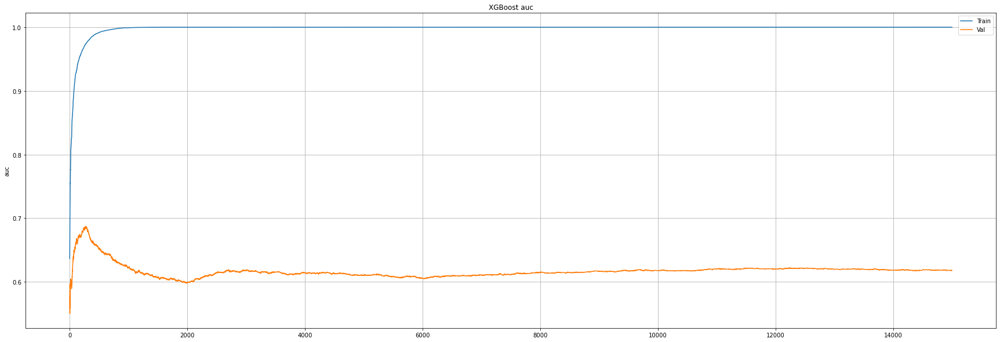

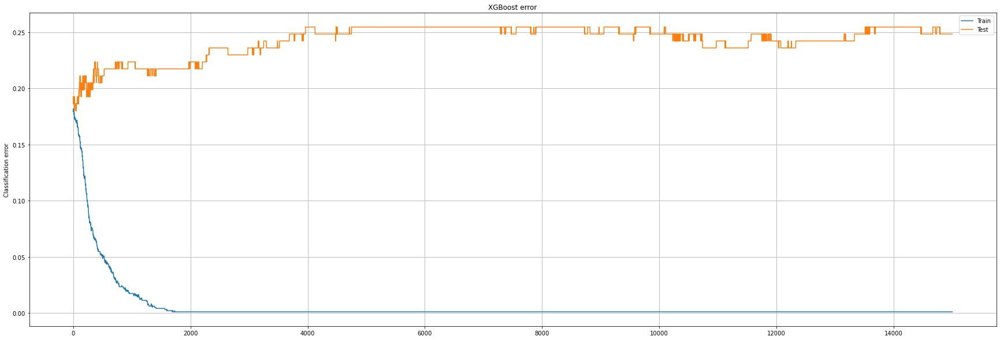

In [135]:
# Let's double for higher learning rate
# roc auc on validation set is smaller and the error is higher; we discart higher learning rate
classifier = XGBClassifier(class_weight='balanced', learning_rate=0.05, max_depth=5, max_features=2, n_estimators=15000)
plot_validation_curve_error_roc_auc(X_train, X_val, classifier)

In [142]:
# Our tuned XGBoost classifier is:
classifier = XGBClassifier(class_weight='balanced', learning_rate=0.01, max_depth=5, max_features=2, n_estimators=1200)

classifier, recall, precision, roc_auc = calculate_scores_for_model_comparison(classifier, X_train, y_train, X_val, y_val)
roc_auc_model_comparison = roc_auc_model_comparison.append({'classifier':classifier,'recall':recall,
                                                                'roc_auc': roc_auc,
                                                                'precision':precision}, ignore_index=True)
roc_auc_model_comparison

[13:56:55] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight", "max_features" } are not used.



,classifier,recall,roc_auc,precision
0,"SVC(C=0.5, class_weight='balanced', degree=1, ...",0.545455,0.596946,0.285714
1,"XGBClassifier(base_score=None, booster=None, c...",0.121212,0.541075,0.444444
2,"XGBClassifier(base_score=None, booster=None, c...",0.121212,0.541075,0.444444


In [329]:
# XGBoost did not beat SVC in this case; Our best model is:

classifier = SVC(C=0.5, class_weight='balanced', degree=1, gamma=0.005)

model_roc_auc_oriented = Pipeline([('scaler',scaler),('pca',pca),('classifier', classifier)])

model_roc_auc_oriented.fit(X_train, y_train)
pickle.dump(model_roc_auc_oriented, open('model_roc_auc_oriented.pkl', 'wb'))
roc_auc_oriented_model = pickle.load(open('model_roc_auc_oriented.pkl', 'rb'))
from sklearn.metrics import classification_report
y_pred=roc_auc_oriented_model.predict(X_test)
result_roc_auc = classification_report(y_test, y_pred)
print(result)
roc_auc  = roc_auc_score(y_test, y_pred)
print(f'roc_auc is {roc_auc}')
recall_aom = recall_score(y_test, y_pred)
precision_aom = precision_score(y_test, y_pred)
roc_auc_aom = roc_auc_score(y_test, y_pred)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       128
           1       0.20      1.00      0.34        33

    accuracy                           0.20       161
   macro avg       0.10      0.50      0.17       161
weighted avg       0.04      0.20      0.07       161

roc_auc is 0.608875


In [330]:
# Gathering results of validation on our final test set for all our models
print('RESULTS FOR RECALL ORIENTED MODEL')
print(result_recall)
print(f'recall_rom: {recall_rom}')
print(f'precision_rom: {precision_rom}')
print(f'roc_auc_rom: {roc_auc_rom}')
print('-----------------')
print('RESULTS FOR PRECISION ORIENTED MODEL')
print(result_precision)
print(f'recall_pom: {recall_pom}')
print(f'precision_pom: {precision_pom}')
print(f'roc_auc_pom: {roc_auc_pom}')
print('-----------------')
print('RESULTS FOR ROC_AUC ORIENTED MODEL')
print(result_roc_auc)
print(f'recall_aom: {recall_aom}')
print(f'precision_aom: {precision_aom}')
print(f'roc_auc_pom: {roc_auc_aom}')
print('-----------------')

RESULTS FOR RECALL ORIENTED MODEL
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       125
           1       0.20      1.00      0.34        32

    accuracy                           0.20       157
   macro avg       0.10      0.50      0.17       157
weighted avg       0.04      0.20      0.07       157

recall_rom: 1.0
precision_rom: 0.20382165605095542
roc_auc_rom: 0.5
-----------------
RESULTS FOR PRECISION ORIENTED MODEL
              precision    recall  f1-score   support

           0       0.81      1.00      0.89       125
           1       1.00      0.06      0.12        32

    accuracy                           0.81       157
   macro avg       0.90      0.53      0.51       157
weighted avg       0.85      0.81      0.73       157

recall_pom: 0.0625
precision_pom: 1.0
roc_auc_pom: 0.53125
-----------------
RESULTS FOR ROC_AUC ORIENTED MODEL
              precision    recall  f1-score   support

           0       0.8

[20:47:50] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

precision score is: 0.59375
recall score is: 0.2602739726027397
roc_auc score is: 0.5527560339204175
accuracy is: 0.5732484076433121
Confusion matrix:


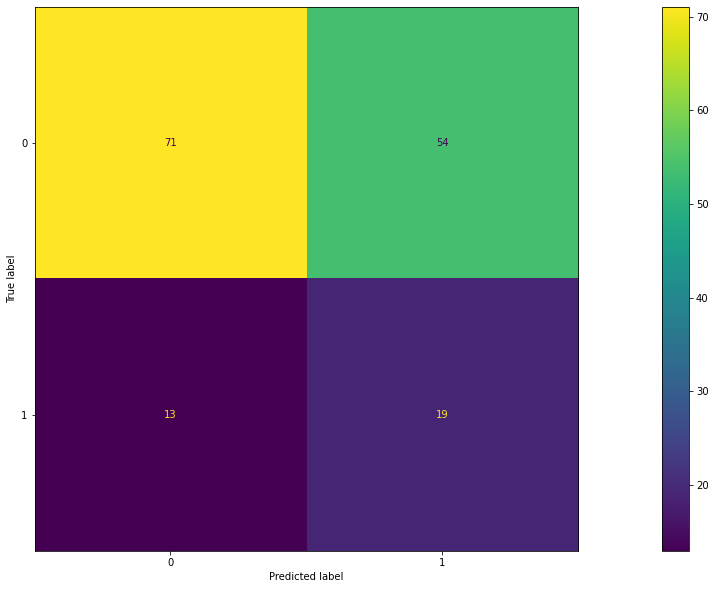

In [346]:
# Just out of curiosity, let's check performance of our 3 models combined

from sklearn.ensemble import VotingClassifier

voting_hard = VotingClassifier(estimators=[ ('recall_oriented', model_recall_oriented),
                                                 ('precision_oriented', model_precision_oriented),
                                                 ('roc_auc_oriented', model_roc_auc_oriented)], voting='hard')

voting_hard.fit(X_train, y_train)
y_pred_hard = voting_hard.predict(X_test)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

print('precision score is: ' +str(precision_score(y_pred_hard, y_test)))
print('recall score is: ' +str(recall_score(y_pred_hard, y_test)))
print('roc_auc score is: ' +str(roc_auc_score(y_pred_hard, y_test)))
print('accuracy is: ' + str(voting_hard.score(X_test, y_test)))

print('Confusion matrix:')
cm = confusion_matrix(y_test, y_pred_hard, labels=voting_hard.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

precision score is: 0.59375
recall score is: 0.2878787878787879
roc_auc score is: 0.5725108225108225
accuracy is: 0.6178343949044586
Confusion matrix:


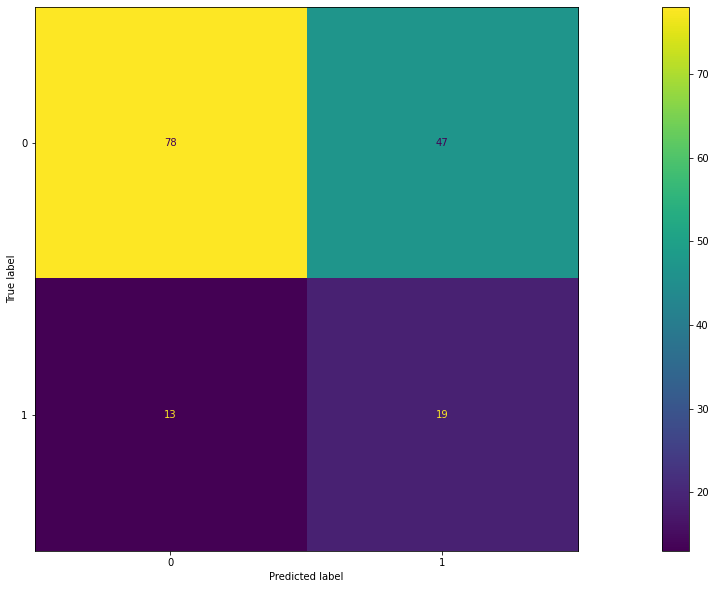

In [344]:
# Let's check performance of voting classifier composed of recall oriented and roc_auc oriented models

voting_hard = VotingClassifier(estimators=[ ('recall_oriented', model_recall_oriented),
                                                 ('roc_auc_oriented', model_roc_auc_oriented)], voting='hard')

voting_hard.fit(X_train, y_train)
y_pred_hard = voting_hard.predict(X_test)
print('precision score is: ' +str(precision_score(y_pred_hard, y_test)))
print('recall score is: ' +str(recall_score(y_pred_hard, y_test)))
print('roc_auc score is: ' +str(roc_auc_score(y_pred_hard, y_test)))
print('accuracy is: ' + str(voting_hard.score(X_test, y_test)))
print('Confusion matrix:')
cm = confusion_matrix(y_test, y_pred_hard, labels=voting_hard.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

[20:47:22] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "class_weight" } are not used.

precision score is: 0.125
recall score is: 0.23529411764705882
roc_auc score is: 0.5176470588235295
accuracy is: 0.7388535031847133
Confusion matrix:


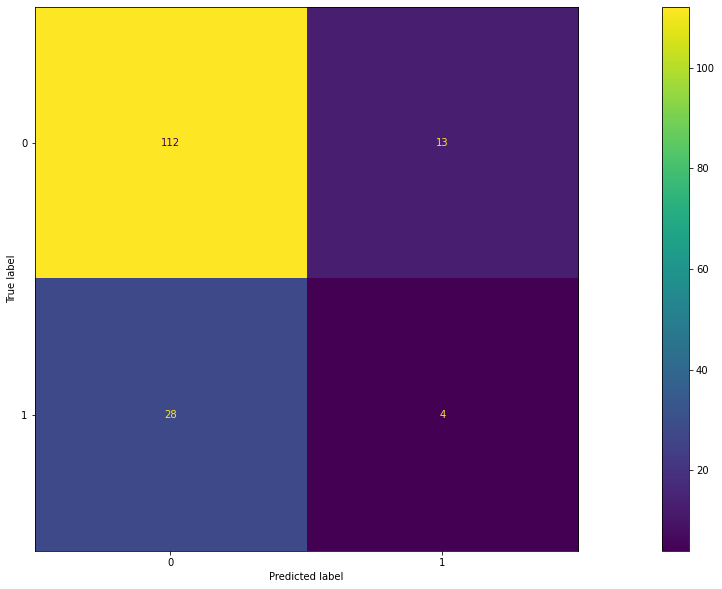

In [345]:
# Let's check performance of voting classifier composed of recall oriented and roc_auc oriented models

voting_hard = VotingClassifier(estimators=[ ('recall_oriented', model_recall_oriented),
                                                 ('precision_oriented', model_precision_oriented)], voting='hard')

voting_hard.fit(X_train, y_train)
y_pred_hard = voting_hard.predict(X_test)
print('precision score is: ' +str(precision_score(y_pred_hard, y_test)))
print('recall score is: ' +str(recall_score(y_pred_hard, y_test)))
print('roc_auc score is: ' +str(roc_auc_score(y_pred_hard, y_test)))
print('accuracy is: ' + str(voting_hard.score(X_test, y_test)))
print('Confusion matrix:')
cm = confusion_matrix(y_test, y_pred_hard, labels=voting_hard.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

In [355]:
# We will pickle our second voting classifier, as it seems to be the best one overall if we focus on 1 detection, 
# but don't want to missclasify to many 0s.

voting_hard = VotingClassifier(estimators=[ ('recall_oriented', model_recall_oriented),
                                                 ('roc_auc_oriented', model_roc_auc_oriented)], voting='hard')

# XGBoost did not beat SVC in this case; Our best model is:

voting_model_recall_roc_auc = Pipeline([('scaler',scaler),('pca',pca),('classifier', voting_hard)])

voting_model_recall_roc_auc.fit(X_train, y_train)
pickle.dump(voting_model_recall_roc_auc, open('voting_model_recall_roc_auc.pkl', 'wb'))
voting_model_recall_roc_auc_loaded = pickle.load(open('voting_model_recall_roc_auc.pkl', 'rb'))
y_pred=voting_model_recall_roc_auc_loaded.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.83      0.70      0.76       125
           1       0.27      0.44      0.33        32

    accuracy                           0.64       157
   macro avg       0.55      0.57      0.54       157
weighted avg       0.71      0.64      0.67       157

